<h1 style="text-align: center;">Classifiez automatiquement des biens de consommation</h1>

- **Mission** : Etude de la faisabilité d'un moteur de recherche pour de la classification des produits par catégorie, à l'aide de la **description** et de **l'image**


 - **A) Le prétraitement des données textuelles** (le descriptif des biens de consommation)
 - **B) Une extraction des features textuelles**
 - **C) La réduction en 2D des données textuelles**
 - **D) L'application d'un modèle de Machine Learning non supervisé** K-means sur les features extraites issus de la reduction de dimension (avec sa mesure de performance)

## TEXTE: Lecture, Analyse et Nettoyage de la base données

### 1. Lecture de la base de données flikpart

In [1]:
import pandas as pd

# Charger le fichier CSV
dataset = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv")


In [2]:
# Afficher les premières lignes du dataset
print("Chargement et lecture de la base de données (5 premières lignes)...")
dataset.head(5)


Chargement et lecture de la base de données (5 premières lignes)...


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [3]:
# Afficher les dernières lignes du dataset
print("Chargement et lecture de la base de données (5 dernières lignes)...")
dataset.tail()

Chargement et lecture de la base de données (5 dernières lignes)...


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,Oren Empower Extra Large Self Adhesive Sticker...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ..."
1046,fd6cbcc22efb6b761bd564c28928483c,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-large-vinyl...,Wallmantra Large Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZD5GDCVQ,4930.0,1896.0,fd6cbcc22efb6b761bd564c28928483c.jpg,False,Wallmantra Large Vinyl Sticker Sticker (Pack o...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1047,5912e037d12774bb73a2048f35a00009,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-extra-large-p...,Uberlyfe Extra Large Pigmented Polyvinyl Films...,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE5UVGW2JWVWCT,4500.0,1449.0,5912e037d12774bb73a2048f35a00009.jpg,False,Buy Uberlyfe Extra Large Pigmented Polyvinyl F...,No rating available,No rating available,Uberlyfe,"{""product_specification""=>[{""key""=>""Number of ..."
1048,c3edc504d1b4f0ba6224fa53a43a7ad6,2015-12-01 10:15:43 +0000,http://www.flipkart.com/wallmantra-medium-viny...,Wallmantra Medium Vinyl Sticker Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIEC889ZGFD3RCE,3465.0,1333.0,c3edc504d1b4f0ba6224fa53a43a7ad6.jpg,False,Buy Wallmantra Medium Vinyl Sticker Sticker fo...,No rating available,No rating available,Wallmantra,"{""product_specification""=>[{""key""=>""Number of ..."
1049,f2f027ad6a6df617c9f125173da71e44,2015-12-01 10:15:43 +0000,http://www.flipkart.com/uberlyfe-large-vinyl-s...,Uberlyfe Large Vinyl Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE2ZEPACRQJKH7,1190.0,595.0,f2f027ad6a6df617c9f125173da71e44.jpg,False,Buy Uberlyfe Large Vinyl Sticker for Rs.595 on...,4,4,Uberlyfe,"{""product_specification""=>[{""key""=>""Sales Pack..."


In [4]:
# Afficher un échantillon du dataset de 20 lignes
print("Chargement et lecture de la base de données (échantillon de 20 lignes)...")
dataset.sample(20)

Chargement et lecture de la base de données (échantillon de 20 lignes)...


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
79,320833ab08c9a94ef83520612899a85f,2016-05-22 16:29:40 +0000,http://www.flipkart.com/florence9-baby-cap-red...,florence9 baby cap red checks Cap,"[""Baby Care >> Infant Wear >> Baby Boys' Cloth...",CAPEGW7UTGHRJBEW,800.0,399.0,320833ab08c9a94ef83520612899a85f.jpg,False,Key Features of florence9 baby cap red checks ...,No rating available,No rating available,florence9,"{""product_specification""=>[{""key""=>""Number of ..."
966,378d7dbdb97ecc62c9ad52cb6df23a86,2016-06-15 19:32:11 +0000,http://www.flipkart.com/checkered-chef-steel-a...,Checkered Chef Steel All-Purpose Scissor,"[""Kitchen & Dining >> Kitchen Tools >> Kitchen...",KISEJ7WDQY499TQE,2260.0,1921.0,378d7dbdb97ecc62c9ad52cb6df23a86.jpg,False,"Checkered Chef Steel All-Purpose Scissor (Red,...",No rating available,No rating available,Checkered Chef,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
745,daf06eb2b9613900299539558e287701,2015-12-12 11:46:53 +0000,http://www.flipkart.com/nutcase-sticker-wrap-d...,Nutcase Sticker Wrap Design - Mint & Grey Chev...,"[""Kitchen & Dining >> Containers & Bottles >> ...",BOTEANCHRVE7K3CS,799.0,399.0,daf06eb2b9613900299539558e287701.jpg,False,Nutcase Sticker Wrap Design - Mint & Grey Chev...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Body Mater..."
986,c3c23b5aa5e388e5f71883f61d1a0561,2016-01-04 03:25:23 +0000,http://www.flipkart.com/vedic-deals-couple-rad...,Vedic Deals Couple Radium Statues Showpiece -...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE7GY2FRWSTGZF,1499.0,499.0,c3c23b5aa5e388e5f71883f61d1a0561.jpg,False,Buy Vedic Deals Couple Radium Statues Showpiec...,No rating available,No rating available,Vedic Deals,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
660,bd2a71a635bf307de0056b74205918b7,2015-12-31 09:19:31 +0000,http://www.flipkart.com/fabutex-polyester-blac...,"Fabutex Polyester Black, White Abstract Eyelet...","[""Home Furnishing >> Curtains & Accessories >>...",CRNEBFX57PVYZG5F,4500.0,2696.0,bd2a71a635bf307de0056b74205918b7.jpg,False,"Fabutex Polyester Black, White Abstract Eyelet...",No rating available,No rating available,Fabutex,"{""product_specification""=>[{""key""=>""Reversible..."
564,7037dbd17682322c89bdf7203b403381,2016-01-07 05:50:25 +0000,http://www.flipkart.com/gift-island-sw13388e-f...,Gift Island SW13388E Fashionin Digital Watch ...,"[""Watches >> Wrist Watches >> Gift Island Wris...",WATE5HFYK4YWECKH,799.0,799.0,7037dbd17682322c89bdf7203b403381.jpg,False,Gift Island SW13388E Fashionin Digital Watch ...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Chronograp..."
465,da2ce8d17a17f9d19b368434aedea5e9,2016-03-22 19:59:16 +0000,http://www.flipkart.com/chokree-baby-girl-s-gi...,"Chokree Baby Girl's, Girl's A-line Dress","[""Baby Care >> Infant Wear >> Baby Girls' Clot...",DREEHF93FUPCCPZP,1700.0,816.0,da2ce8d17a17f9d19b368434aedea5e9.jpg,False,"Key Features of Chokree Baby Girl's, Girl's A-...",No rating available,No rating available,Chokree,"{""product_specification""=>[{""key""=>""Length"", ""..."
726,eda00df2c5e1d006a8608e881bfcf300,2016-01-01 19:37:22 +0000,http://www.flipkart.com/hoa-baby-nappy-set-6-p...,HoA Baby Nappy Set of 6 - Plain Pure Cotton - ...,"[""Baby Care >> Diapering & Potty Training >> N...",NPYE5QUHW3Y8TGMY,399.0,199.0,eda00df2c5e1d006a8608e881bfcf300.jpg,False,Flipkart.com is offering HoA Baby Nappy Set of...,2,2,HoA,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
364,b4327c9879644be2a04e9b2df963f6cb,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-fh330/p/itme7dbh...,Tenda FH330,"[""Computers >> Network Components >> Routers >...",RTRE7DBH3ZDKADUS,3500.0,1705.0,b4327c9879644be2a04e9b2df963f6cb.jpg,False,Buy Tenda FH330 only for Rs. 1705 from Flipkar

In [5]:
# Afficher les statistiques descriptives de toutes les colonnes
print("Résumé statistique de toutes les colonnes...")
dataset.describe(include='all')


Résumé statistique de toutes les colonnes...


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1049.000000,1049.000000,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,NaN,NaN,1050,2,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,NaN,NaN,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,NaN,NaN,1,993,1,889,889,11,22
mean,NaN,NaN,NaN,NaN,NaN,NaN,2186.197331,1584.527169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,7639.229411,7475.099680,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,35.000000,35.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,555.000000,340.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,999.000000,600.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,1999.000000,1199.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
# Afficher la liste des colonnes du dataset flipkart
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

### 2. Description de la base de données

Description de la base de données

**Aperçu des données** :
| uniq_id                              | crawl_timestamp            | product_url | <span style="color:red">product_name</span> | <span style="color:red">product_category_tree</span> | pid              | retail_price | discounted_price | image                              | is_FK_Advantage_product | <span style="color:red">description</span> | product_rating     | overall_rating     | brand               | product_specifications |
|--------------------------------------|----------------------------|-------------|---------------------------------------------|------------------------------------------------------|------------------|--------------|------------------|-----------------------------------|-------------------------|----------------------------------------------|--------------------|--------------------|---------------------|------------------------|
| 55b85ea15a1536d46b7190ad6fff8ce7     | 2016-04-30 03:22:56 +0000 | URL1        | Product 1                                  | Category 1                                           | CRNEG7BKMFFYHQ8Z | 1899         | 899              | 55b85ea15a1536d46b7190ad6fff8ce7.jpg | False                  | Description 1                               | No rating available | No rating available | Elegance            | JSON data              |

#### Informations sur les colonnes
- **uniq_id** : Identifiant unique pour chaque produit (texte).
- **crawl_timestamp** : Timestamp de récupération des données (texte).
- **product_url** : URL du produit (texte).
- **<span style="color:red">product_name</span>** : Nom du produit (texte).
- **<span style="color:red">product_category_tree</span>** : Catégorie du produit sous forme de hiérarchie (texte).
- **pid** : Identifiant du produit (texte).
- **retail_price** : Prix initial du produit (numérique, certains sont manquants).
- **discounted_price** : Prix réduit du produit (numérique, certains sont manquants).
- **image** : Nom de fichier de l'image du produit (texte).
- **is_FK_Advantage_product** : Indique si le produit est avantageux pour Flipkart (booléen).
  
- _**<span style="color:red">description</span>** : Description textuelle du produit (texte)._
  
- **product_rating** : Note individuelle du produit (texte, souvent "No rating available"). _Peut-être une note de 4/5 attribuée par cet utilisateur individuel._
- **overall_rating** : Note globale du produit (texte, souvent "No rating available"). _Peut être une note moyenne de 4.2/5 basée sur 1000 avis._
- **brand** : Marque du produit (texte, plusieurs valeurs manquantes).
- **product_specifications** : Spécifications sous forme de texte JSON.

#### Statistiques descriptives
- **Nombre total de lignes :** 1050.
- **Colonnes contenant des valeurs manquantes :**
  - `retail_price` et `discounted_price` ont 1 valeur manquante.
  - `brand` a 338 valeurs manquantes (712 sur 1050 présentes).
  - `product_specifications` contient 984 valeurs uniques (1 valeur manquante).

#### Observations importantes
1. **Catégories et structure** :
   - Les produits sont catégorisés de manière hiérarchique dans <span style="color:red">**product_category_tree**</span>, ce qui peut être utilisé pour organiser ou regrouper les produits.
   
2. **Prix** :
   - Les colonnes `retail_price` et `discounted_price` permettent d'évaluer les réductions appliquées.

3. **Marque** :
   - La colonne `brand` est partiellement renseignée, mais pourrait être enrichie ou utilisée pour des regroupements si elle est nettoyée.

4. **Notes** :
   - Les colonnes `product_rating` et `overall_rating` sont souvent vides ou contiennent "No rating available", ce qui limite leur utilisation.

5. **Spécifications techniques** :
   - La colonne `product_specifications` contient des informations détaillées en format JSON, pouvant être analysées après parsing.


_Identification des features cibles de type texte pour prédire les catégories de produit_

- **product_category_tree** = "Représente la cible de la prédiction **(Y)**"

- **product_name** = "Représente le feature qui nous permettra éventuellement de prédire la cible (la catégorie) **(X_1)**"

- **description** = "Représente le feature qui nous permettra éventuellement de prédire la cible (la catégorie) **(X_2)**"


### 2.1 Structure de la base de données

In [7]:
# Nombre de ligne / Nombre de colonne
dataset.shape

(1050, 15)

In [8]:
# La typologie de nos colonnes 1.0
dataset.dtypes

uniq_id                     object
crawl_timestamp             object
product_url                 object
product_name                object
product_category_tree       object
pid                         object
retail_price               float64
discounted_price           float64
image                       object
is_FK_Advantage_product       bool
description                 object
product_rating              object
overall_rating              object
brand                       object
product_specifications      object
dtype: object

In [9]:
# La Typologie de nos colonnes 1.1
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   uniq_id                  1050 non-null   object 
 1   crawl_timestamp          1050 non-null   object 
 2   product_url              1050 non-null   object 
 3   product_name             1050 non-null   object 
 4   product_category_tree    1050 non-null   object 
 5   pid                      1050 non-null   object 
 6   retail_price             1049 non-null   float64
 7   discounted_price         1049 non-null   float64
 8   image                    1050 non-null   object 
 9   is_FK_Advantage_product  1050 non-null   bool   
 10  description              1050 non-null   object 
 11  product_rating           1050 non-null   object 
 12  overall_rating           1050 non-null   object 
 13  brand                    712 non-null    object 
 14  product_specifications  

In [10]:
# Si on a grand dataset on affichera le nombre de colonne pour chaque Dtype
dataset.dtypes.value_counts()

object     12
float64     2
bool        1
Name: count, dtype: int64

In [11]:
# On affiche le nombre de valeur unique par variable
dataset.nunique()

uniq_id                    1050
crawl_timestamp             149
product_url                1050
product_name               1050
product_category_tree       642
pid                        1050
retail_price                354
discounted_price            424
image                      1050
is_FK_Advantage_product       2
description                1050
product_rating               27
overall_rating               27
brand                       490
product_specifications      984
dtype: int64

### 2.2 Affichage des valeurs manquantes

In [12]:
# On affiche les colonnes avec des valeurs manquantes
dataset.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

In [13]:
# On affiche la moyenne des valeurs manquantes par colonnes
dataset.isna().mean()

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
retail_price               0.000952
discounted_price           0.000952
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
brand                      0.321905
product_specifications     0.000952
dtype: float64

In [14]:
# On affiche la moyenne des valeurs manquantes par colonne triée par ordre croissant
dataset.isna().mean().sort_values()

uniq_id                    0.000000
crawl_timestamp            0.000000
product_url                0.000000
product_name               0.000000
product_category_tree      0.000000
pid                        0.000000
image                      0.000000
is_FK_Advantage_product    0.000000
description                0.000000
product_rating             0.000000
overall_rating             0.000000
retail_price               0.000952
discounted_price           0.000952
product_specifications     0.000952
brand                      0.321905
dtype: float64

<Axes: >

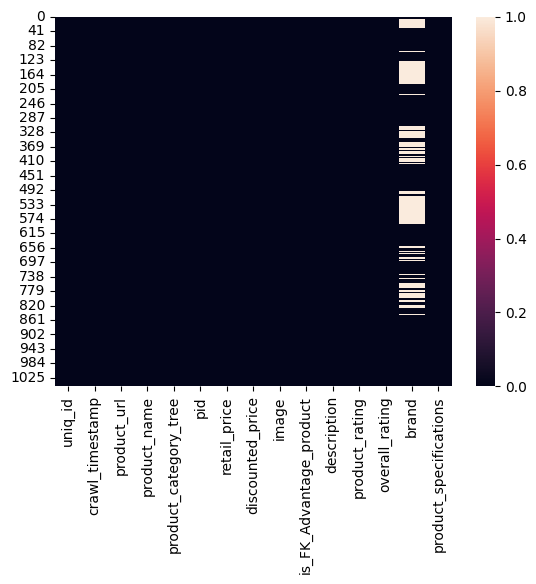

In [15]:
# Réprésentation graphique de nos valeurs manquantes
# Ou c'est noir il y a une valeur
# Ou c'est blanc il manque de la valeur
import seaborn as sns
sns.heatmap(dataset.isna())

<Axes: >

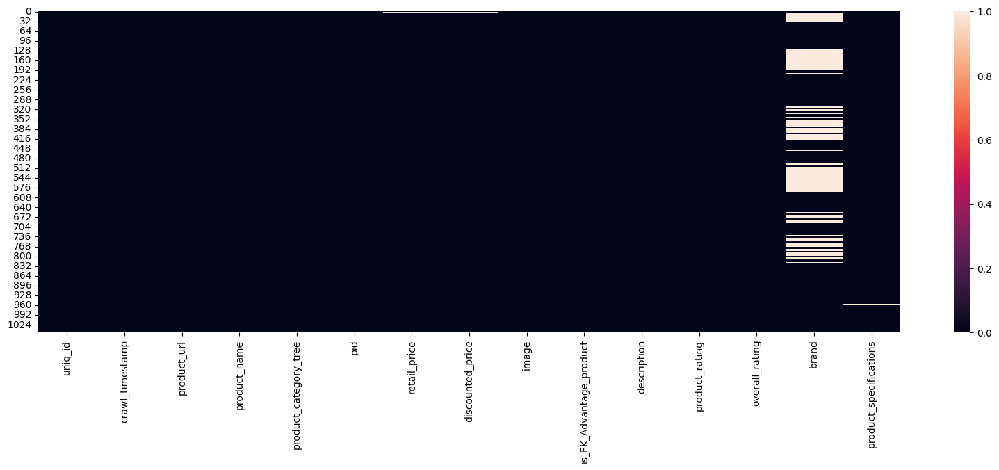

In [16]:
# On affiche un graphique plus grand et plus lisible
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize=(20, 6))
sns.heatmap(dataset.isna())

In [17]:
# Si on combine les valeurs dupliquées avec la somme
# Avons nous des valeurs dupliquées
# Il nexiste aucune ligne au niveau du dataframe qui soit plusieurs fois la même
dataset.duplicated().sum()

0

In [18]:
# Nous souhaitons savoir s'il existe des valeurs de product_name dupliquées
dataset.duplicated(subset="product_name").sum()

0

In [19]:
# Nous souhaitons savoir s'il existe des valeurs de description dupliquées
dataset.duplicated(subset="description").sum()

0

In [20]:
# La boucle for nous permet de compter le nombre de valeur dupliquée par colonne
for col in dataset.columns :
    n = dataset.duplicated(subset=col).sum()
    print(f"col: {col} -> duplicated : {n}")

col: uniq_id -> duplicated : 0
col: crawl_timestamp -> duplicated : 901
col: product_url -> duplicated : 0
col: product_name -> duplicated : 0
col: product_category_tree -> duplicated : 408
col: pid -> duplicated : 0
col: retail_price -> duplicated : 695
col: discounted_price -> duplicated : 625
col: image -> duplicated : 0
col: is_FK_Advantage_product -> duplicated : 1048
col: description -> duplicated : 0
col: product_rating -> duplicated : 1023
col: overall_rating -> duplicated : 1023
col: brand -> duplicated : 559
col: product_specifications -> duplicated : 65


In [21]:
# On utilise un vecteur pour dire si chaque ligne de produit est dupliqué ou non
dataset.duplicated(subset="description",keep="first")

0       False
1       False
2       False
3       False
4       False
        ...  
1045    False
1046    False
1047    False
1048    False
1049    False
Length: 1050, dtype: bool

In [22]:
# On utilise un vecteur pour dire si chaque ligne de la description produit est dupliqué ou non
dataset.duplicated(subset="product_name",keep="first")

0       False
1       False
2       False
3       False
4       False
        ...  
1045    False
1046    False
1047    False
1048    False
1049    False
Length: 1050, dtype: bool

In [23]:
# On affiche à l'aide du vecteur la ou nous avons des lignes dupliquée
idx = dataset.duplicated(subset="description",keep="first")
dataset.loc[idx, : ].sort_values("description")

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications


In [24]:
# On affiche à l'aide du vecteur la ou nous avons des lignes dupliquée
idx = dataset.duplicated(subset="product_name",keep="first")
dataset.loc[idx, : ].sort_values("product_name")

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications


In [25]:
# On affiche à l'aide du vecteur la ou nous avons des lignes dupliquée
idx = dataset.duplicated(subset="brand",keep="first")
dataset.loc[idx, : ].sort_values("brand")

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
901,5c0fe2919e49f30aff91d46800cdf149,2016-06-07 10:52:17 +0000,http://www.flipkart.com/home-earthy-wine-net-c...,@home Earthy Wine Net Ceramic Vase,"[""Home Decor & Festive Needs >> Flowers, Plant...",VASEJDBZMRZTZVS7,1499.0,1350.0,5c0fe2919e49f30aff91d46800cdf149.jpg,False,Key Features of @home Earthy Wine Net Ceramic ...,No rating available,No rating available,@home,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
45,493d1eb6ad7a48a926092bf994cd0bb0,2016-03-20 14:44:44 +0000,http://www.flipkart.com/akup-i-love-my-mom-cer...,AKUP i-love-my-mom Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> AKUP Coff...",MUGEGZUHX744RFEN,500.0,259.0,493d1eb6ad7a48a926092bf994cd0bb0.jpg,False,Key Features of AKUP i-love-my-mom Ceramic Mug...,No rating available,No rating available,AKUP,"{""product_specification""=>[{""key""=>""Type"", ""va..."
46,3388d05e88972ff9f3e1321dc0cfdc28,2016-03-20 14:44:44 +0000,http://www.flipkart.com/akup-keep-calm-ceramic...,AKUP keep-calm Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> AKUP Coff...",MUGEGZUMNZCKBZYS,500.0,259.0,3388d05e88972ff9f3e1321dc0cfdc28.jpg,False,Key Features of AKUP keep-calm Ceramic Mug Pac...,No rating available,No rating available,AKUP,"{""product_specification""=>[{""key""=>""Type"", ""va..."
48,e7cab08a267e815c72a26513222783e0,2016-03-20 14:44:44 +0000,http://www.flipkart.com/akup-league-of-legends...,AKUP league-of-legends Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> AKUP Coff...",MUGEGZUHAVSHPXST,500.0,259.0,e7cab08a267e815c72a26513222783e0.jpg,False,Key Features of AKUP league-of-legends Ceramic...,No rating available,No rating available,AKUP,"{""product_specification""=>[{""key""=>""Type"", ""va..."
50,69446af66066146718cd569f87e99fff,2016-03-20 14:44:44 +0000,http://www.flipkart.com/akup-life-is-not-livin...,AKUP life-is-not-living Ceramic Mug,"[""Kitchen & Dining >> Coffee Mugs >> AKUP Coff...",MUGEGZUMZYQGWHDS,500.0,259.0,69446af66066146718cd569f87e99fff.jpg,False,Key Features of AKUP life-is-not-living Cerami...,No rating available,No rating available,AKUP,"{""product_specification""=>[{""key""=>""Type"", ""va..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
924,a618354ba17cff64826558d81afc77ab,2016-01-01 13:15:34 +0000,http://www.flipkart.com/elfani-brilliance-lip-...,Elfani Brilliance Lip Color 3.5 g,"[""Beauty and Personal Care >> Makeup >> Lips >...",LSKEDKXZBSVQ883C,255.0,180.0,a618354ba17cff64826558d81afc77ab.jpg,False,Flipkart.com: Buy Elfani Brilliance Lip Color ...,4.5,4.5,NaN,"{""product_specification""=>[{""key""=>""Quantity"",..."
935,7b1c5edc85bc7e31edf49ab70034bb3a,2016-01-01 13:15:34 +0000,http://www.flipkart.com/incolor-metalic-lipsti...,Incolor Metalic Lipstick N15 3.8 g,"[""Beauty and Personal Care >> Makeup >> Lips >...",LSKE36A69ZNY64DG,210.0,210.0,7b1c5edc85bc7e31edf49ab70034bb3a.jpg,False,Flipkart.com: Buy Incolor Metalic Lipstick N15...,3,3,NaN,"{""product_specification""=>[{""key""=>""Quantity"",..."
946,2cc24452688ed35dfbff566e22e53c95,2016-01-01 13:15:34 +0000,http://www.flipkart.com/organistick-silver-lab...,Organistick Silver Label Lipstick 10 g,"[""Beauty and Personal Care >> Makeup >> Lips >...",LSKE6FWHDDWY7J5T,149.0,149.0,2cc24452688ed35dfbff566e22e53c95.jpg,False,Flipkart.com: Buy Organistick Silver Label Lip...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Organic Ty..."
985,edb97bd2433fd9de301c8a44344777bb,2016-01-04 03:25:23 +0000,http://www.flipkart.com/artist-haat-vanity-box...,Artist Haat Vanity Box Makeup and Jewellery Va...,"[""Beauty and Personal Care >> Makeup >> Vanity...",VANEE2FFWVZZQHJV,1800.0,1499.0,edb97bd2433fd9de301c8a44344777bb.jpg,False,Artist Haat Vanity Box Makeup and Jewellery Va...,No rating available,No rating available,NaN,"{""product_s

### 2.3 Data inspection

In [26]:
import numpy as np
# On affiche les résumés statistiques des colonnes numériques
dataset.describe(include=np.number)

,retail_price,discounted_price
count,1049.000000,1049.000000
mean,2186.197331,1584.527169
std,7639.229411,7475.099680
min,35.000000,35.000000
25%,555.000000,340.000000
50%,999.000000,600.000000
75%,1999.000000,1199.000000
max,201000.000000,201000.000000


In [27]:
import numpy as np
# On affiche les résumés statistiques des colonnes catégorielles
dataset.describe(include=object)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,1,1,889,889,11,22


In [28]:
# Vérification du nombre de valeurs manquantes pour toutes les colonnes
valeurs_manquantes = dataset.isnull().sum()

# Colonnes sans valeurs manquantes
colonnes_sans_valeurs_manquantes = valeurs_manquantes[valeurs_manquantes == 0]
print("Colonnes sans valeurs manquantes :")
print(colonnes_sans_valeurs_manquantes)

# Colonnes avec des valeurs manquantes
colonnes_avec_valeurs_manquantes = valeurs_manquantes[valeurs_manquantes > 0]
print("\nColonnes avec des valeurs manquantes :")
print(colonnes_avec_valeurs_manquantes)


Colonnes sans valeurs manquantes :
uniq_id                    0
crawl_timestamp            0
product_url                0
product_name               0
product_category_tree      0
pid                        0
image                      0
is_FK_Advantage_product    0
description                0
product_rating             0
overall_rating             0
dtype: int64

Colonnes avec des valeurs manquantes :
retail_price                1
discounted_price            1
brand                     338
product_specifications      1
dtype: int64


C:\Users\saf168541\AppData\Local\Temp\ipykernel_22408\643876816.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=missing_summary.index, y=missing_summary['Nombre'], palette="viridis")


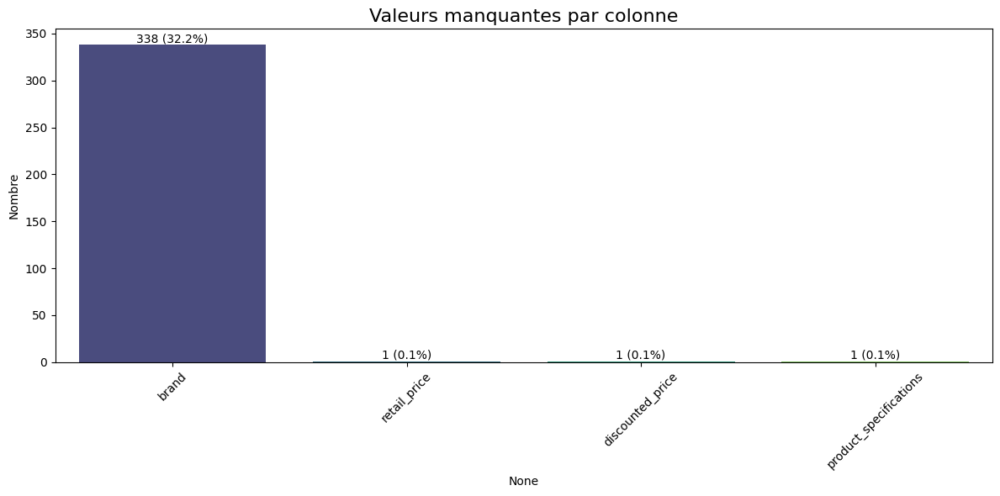

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calcul des valeurs manquantes et tri par ordre décroissant
missing_summary = dataset.isnull().sum().loc[lambda x: x > 0].to_frame('Nombre')
missing_summary['Pourcentage'] = (missing_summary['Nombre'] / len(dataset)) * 100
missing_summary = missing_summary.sort_values(by='Nombre', ascending=False)

# Affichage du graphique
plt.figure(figsize=(12, 6))
sns.barplot(x=missing_summary.index, y=missing_summary['Nombre'], palette="viridis")
plt.title("Valeurs manquantes par colonne", fontsize=16)
plt.xticks(rotation=45)
for i, (count, percent) in enumerate(zip(missing_summary['Nombre'], missing_summary['Pourcentage'])):
    plt.text(i, count, f'{count} ({percent:.1f}%)', ha='center', va='bottom', fontsize=10)
plt.tight_layout()
plt.show()


### 2.4 Affichage de la répartition des colonnes

<Axes: title={'center': 'Répartition du jeu de données flikpart par typologie de colonne'}, ylabel='count'>

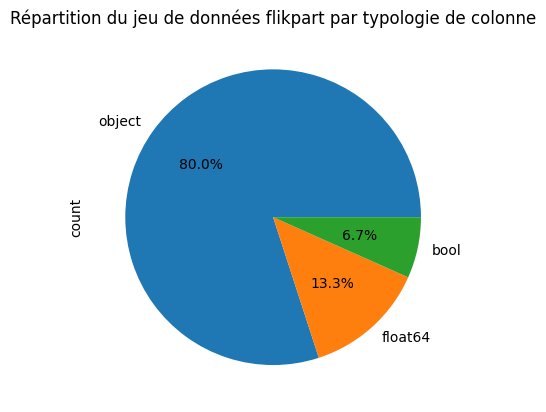

In [30]:
# On affiche la répartition par typologie de données de flikpart
dataset.dtypes.value_counts().plot(kind='pie',autopct="%1.1f%%", title = "Répartition du jeu de données flikpart par typologie de colonne")

### 2.5 EDA - Résumé statistiques des variables textuelles concernées par la prédiction

#### Description 

In [31]:
# Afficher les statistiques descriptives de la colonne "description" forme-1
print("Résumé statistique de la colonne qui concerne la description des produits...")
print(dataset["description"].describe())

Résumé statistique de la colonne qui concerne la description des produits...
count                                                  1050
unique                                                 1050
top       Key Features of Elegance Polyester Multicolor ...
freq                                                      1
Name: description, dtype: object


In [32]:
# Afficher les statistiques descriptives de la colonne "description" forme-2
print("Résumé statistique de la colonne qui concerne la description des produits...")
print(dataset["description"].value_counts())

Résumé statistique de la colonne qui concerne la description des produits...
description
Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing p

#### Product_name 

In [33]:
# Afficher les statistiques descriptives de la colonne "product_name" forme-1
print("Résumé statistique de la colonne qui concerne le nom des produits...")
print(dataset["product_name"].describe())

Résumé statistique de la colonne qui concerne le nom des produits...
count                                                  1050
unique                                                 1050
top       Elegance Polyester Multicolor Abstract Eyelet ...
freq                                                      1
Name: product_name, dtype: object


In [34]:
# Afficher les statistiques descriptives de la colonne "product_name" forme-2
print("Résumé statistique de la colonne qui concerne du nom des produits...")
print(dataset["product_name"].value_counts())

Résumé statistique de la colonne qui concerne du nom des produits...
product_name
Elegance Polyester Multicolor Abstract Eyelet Door Curtain                      1
Philips 9.5 W LED B22 3000K A55 IND Bulb                                        1
Aveeno Protect + Hydrate Broad Spectrum Spf 70 Sunscreen Lotion - SPF 70 PA+    1
La Roche-Posay Anthelios XL Fluid Dry Touch Gel-Cream - SPF 50 PA+              1
Wallmantra Christ The Redeemer Framed Print Canvas Painting                     1
                                                                               ..
Tenda A6                                                                        1
Playboy London And Berlin Combo Set                                             1
Yardley Jasmine and Lace Satin Combo Set                                        1
Spinz Combo Set                                                                 1
Uberlyfe Large Vinyl Sticker                                                    1
Name: count, Len

#### Catégorie de produits 

In [35]:
# Afficher les statistiques descriptives de la colonne "product_category_tree" forme 1
print("Résumé statistique de la colonne qui concerne la catégorie des produits...")
print(dataset["product_category_tree"].describe())

Résumé statistique de la colonne qui concerne la catégorie des produits...
count                                                  1050
unique                                                  642
top       ["Home Furnishing >> Bed Linen >> Blankets, Qu...
freq                                                     56
Name: product_category_tree, dtype: object


In [36]:
# Afficher les statistiques descriptives de la colonne "product_category_tree" forme 2
print("Résumé statistique de la colonne qui concerne la catégorie des produits...")
print(dataset["product_category_tree"].value_counts())

Résumé statistique de la colonne qui concerne la catégorie des produits...
product_category_tree
["Home Furnishing >> Bed Linen >> Blankets, Quilts & Dohars"]                         56
["Kitchen & Dining >> Coffee Mugs >> Prithish Coffee Mugs"]                           26
["Watches >> Wrist Watches >> Maxima Wrist Watches"]                                  23
["Kitchen & Dining >> Coffee Mugs >> Rockmantra Coffee Mugs"]                         22
["Home Furnishing >> Bath Linen >> Towels"]                                           19
                                                                                      ..
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Infinity India Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Ravishing Variety Ethnic"]     1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Pg handicrafts Ethnic"]        1
["Home Decor & Festive Needs >> Showpieces >> Ethnic >> Homedesires Ethnic"]           1
["Watches >> 

## 0. Prétraitement NLP _(nettoyage basique)_ des colonnes:
- 1. **product_name** (x_1)
- 2. **description** (x_2)
- 3. **product_category_tree** (y)

### <span style="color:green">product_name</span> _(X_1)_

In [37]:
# On copie la colonne product_name comme product_name_cleaned
# Ce traitement nous servira à observer la colonne product_name une fois traitée avec la colonne product_name non traitée
dataset["product_name_cleaned"] = dataset["product_name"].copy()
print(f"La colonne product_name est dupliquée sous product_name_cleaned'")

La colonne product_name est dupliquée sous product_name_cleaned'


In [38]:
import re

# Analyser les caractères spéciaux présents dans la colonne
# La ligne de code extrait les caractères qui ne sont pas des lettres
# Elle extrait les chiffres (1,2,3)
# Elle extrait les symboles de :
# ponctuations : .,;:!?
# mathématiques : +, -, =, <, >, %, etc.
# spéciaux divers : @, #, $, ^, &, *, (, ), etc.
# guillemets : ', ", \ (antislash)
# crochet ou accolades : [, ], {, }

special_chars = dataset['product_name_cleaned'].str.extractall(r'([^a-zA-Z0-9\s])')[0].value_counts()
print("Caractères spéciaux détectés :")
print(special_chars)

# Supprimer les caractères spéciaux de la colonne 
dataset['product_name_cleaned'] = dataset['product_name_cleaned'].apply(lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', str(x)))

# Supprimer les espaces multiples
# Remplace les espaces multiples par un seul espace et enlève les espaces en début et en fin de chaîne.
dataset['product_name_cleaned'] = dataset['product_name_cleaned'].apply(lambda x: re.sub(r'\s+', ' ', x).strip())

# On passe les caractères de la colonne product_name en minuscule.
dataset['product_name_cleaned'] = dataset['product_name_cleaned'].apply(lambda x: str(x).lower())

# Vérification des premières lignes
print(dataset[['product_name_cleaned', 'product_name']].head())


Caractères spéciaux détectés :
0
-    505
,    119
.    104
'     99
&     75
_     37
(     26
)     26
/     22
+     21
"      4
�      3
!      3
@      2
?      2
:      1
%      1
Name: count, dtype: int64
                                product_name_cleaned  \
0  elegance polyester multicolor abstract eyelet ...   
1                         sathiyas cotton bath towel   
2                eurospa cotton terry face towel set   
3  santosh royal fashion cotton printed king size...   
4  jaipur print cotton floral king sized double b...   

                                        product_name  
0  Elegance Polyester Multicolor Abstract Eyelet ...  
1                         Sathiyas Cotton Bath Towel  
2                Eurospa Cotton Terry Face Towel Set  
3  SANTOSH ROYAL FASHION Cotton Printed King size...  
4  Jaipur Print Cotton Floral King sized Double B...  


In [39]:
# On affiche les 100 premières lignes complètes de la colonne product_name nettoyée
print("La colonne product_name nettoyée (100 premières lignes) :")
pd.set_option('display.max_rows', 100)  # Permet d'afficher jusqu'à 100 lignes
print(dataset["product_name_cleaned"].head(100))
pd.reset_option('display.max_rows')  # Réinitialise l'option pour éviter d'impacter les autres affichages


La colonne product_name nettoyée (100 premières lignes) :
0     elegance polyester multicolor abstract eyelet ...
1                            sathiyas cotton bath towel
2                   eurospa cotton terry face towel set
3     santosh royal fashion cotton printed king size...
4     jaipur print cotton floral king sized double b...
5       maserati time r8851116001 analog watch for boys
6       camerii wm64 elegance analog watch for men boys
7            t star ufttsw005bkbr analog watch for boys
8         alfajr wy16b youth digital watch for men boys
9     tag heuer cau1116ba0858 formula 1 analog watch...
10       calibro sw125 analogdigital watch for men boys
11           cartier w6701005 analog watch for boys men
12         lois caron lcs4032 analog watch for boys men
13             titan 1639sl03 analog watch for boys men
14    srushti art jewelry megnetledsportblackred1 di...
15         escort e1700906blk analog watch for men boys
16           jack klein blackled digital watch

In [40]:
# On affiche le nombre d'occurence de la colonne product_name_cleaned
dataset['product_name_cleaned'].value_counts()

product_name_cleaned
fs mini klub baby boys woven casual shirt                     2
dongli striped baby boys polo neck tshirt                     2
elegance polyester multicolor abstract eyelet door curtain    1
sapatos plain single duvet white                              1
vgstore rectangular pack of 6 table placemat                  1
                                                             ..
edimax br6288acl                                              1
tenda a6                                                      1
playboy london and berlin combo set                           1
yardley jasmine and lace satin combo set                      1
uberlyfe large vinyl sticker                                  1
Name: count, Length: 1048, dtype: int64

In [41]:
# On affiche le pourcentage d'apparation des valeurs
dataset['product_name_cleaned'].value_counts(normalize=True)

product_name_cleaned
fs mini klub baby boys woven casual shirt                     0.001905
dongli striped baby boys polo neck tshirt                     0.001905
elegance polyester multicolor abstract eyelet door curtain    0.000952
sapatos plain single duvet white                              0.000952
vgstore rectangular pack of 6 table placemat                  0.000952
                                                                ...   
edimax br6288acl                                              0.000952
tenda a6                                                      0.000952
playboy london and berlin combo set                           0.000952
yardley jasmine and lace satin combo set                      0.000952
uberlyfe large vinyl sticker                                  0.000952
Name: proportion, Length: 1048, dtype: float64

In [42]:
# On calcule le nombre de caractère sur chaque document
dataset.describe(include="object")

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications,product_name_cleaned
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049,1050
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984,1048
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va...",fs mini klub baby boys woven casual shirt
freq,1,150,1,1,56,1,1,1,889,889,11,22,2


In [43]:
# Le code calcule la longeur de chaque élément de la colonne product_name_cleaned
# On obtient un vecteur qui comporte la longueur de chaque document
dataset.product_name_cleaned.apply(lambda i: len(i))


0       58
1       26
2       35
3       63
4       53
        ..
1045    46
1046    38
1047    63
1048    39
1049    28
Name: product_name_cleaned, Length: 1050, dtype: int64

<Axes: ylabel='product_name_cleaned'>

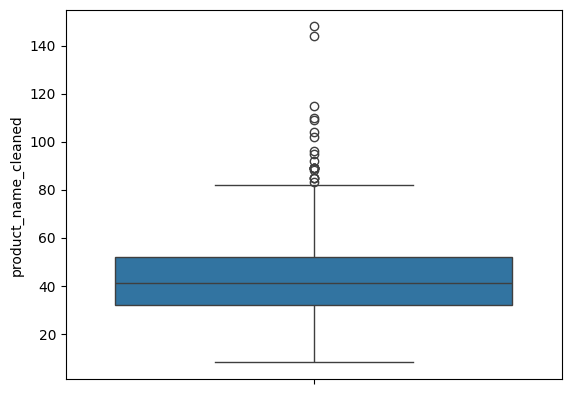

In [44]:
# On obtient la répartition des variables par condensation sur le nombre de caractère
tmp = dataset['product_name_cleaned'].str.len()
sns.boxplot(tmp)

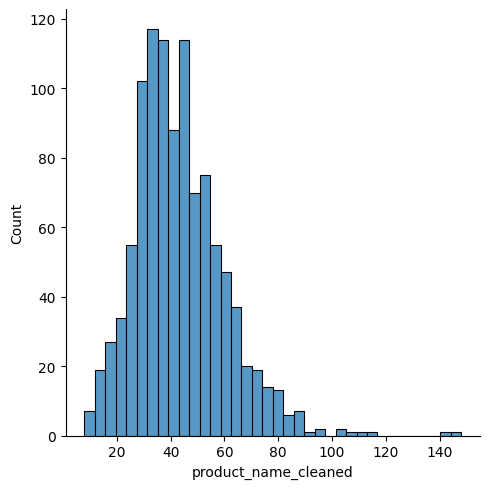

In [45]:
# Ce displot nous permet de distinguer la frequence du nombre de caractère
# L'axe des absicesse représente le nombre de caractère
# L'axe des ordonnées représente le nombre de phrase 
sns.displot(tmp)

In [46]:
# On stock ce vecteur numérique
dataset["product_len_txt"] = tmp
# On affiche le nombre de caractère de chaque ligne de la colonne description
dataset['product_len_txt']

0       58
1       26
2       35
3       63
4       53
        ..
1045    46
1046    38
1047    63
1048    39
1049    28
Name: product_len_txt, Length: 1050, dtype: int64

### <span style="color:green">description</span> _(X_2)_

In [47]:
# On copie la colonne description comme description_cleaned
# Ce traitement nous servira à observé la colonne description une fois traité avec la colonne description non traité
dataset["description_cleaned"] = dataset["description"].copy()
print(f"La colonne description est dupliquée sous description_cleaned'")

La colonne description est dupliquée sous description_cleaned'


In [48]:
# La librairie re en Python sert à la manipulation des expressions régulières (regex).
# Elle permet d'effectuer des recherches, remplacements
# validations de motifs dans des chaînes de caractères.
import re

# Analyser les caractères spéciaux présents dans la colonne
# La ligne de code extrait les caractères qui ne sont pas des lettres
# Elle extrait les chiffres (1,2,3)
# Elle extrait les symboles de :
# ponctuations : .,;:!?
# mathématiques : +, -, =, <, >, %, etc.
# spéciaux divers : @, #, $, ^, &, *, (, ), etc.
# guillemets : ', ", \ (antislash)
# crochet ou accolades : [, ], {, }

special_chars = dataset['description_cleaned'].str.extractall(r'([^a-zA-Z0-9\s])')[0].value_counts()
print("Caractères spéciaux détectés :")
print(special_chars)

# Supprimer les caractères spéciaux de la colonne
dataset['description_cleaned'] = dataset['description_cleaned'].apply(lambda x: re.sub(r'[^a-zA-Z0-9\s]', '', str(x)))

# Supprimer les espaces multiples
# Remplace les espaces multiples par un seul espace et enlève les espaces en début et en fin de chaîne.
dataset['description_cleaned'] = dataset['description_cleaned'].apply(lambda x: re.sub(r'\s+', ' ', x).strip())

# On passe les caractères de la colonne description en minuscule.
dataset['description_cleaned'] = dataset['description_cleaned'].apply(lambda x: str(x).lower())

# Vérification des premières lignes
print(dataset[['description_cleaned', 'description']].head())


Caractères spéciaux détectés :
0
.    5885
,    3269
-    1738
:    1029
)     682
(     669
!     606
&     513
'     396
/     280
"     227
#     144
_     133
%      81
*      51
+      32
•      29
;      24
é      22
|      18
’      16
?      12
�      11
@       9
…       5
°       4
[       2
]       2
–       2
“       2
”       2
±       1
`       1
Name: count, dtype: int64
                                 description_cleaned  \
0  key features of elegance polyester multicolor ...   
1  specifications of sathiyas cotton bath towel 3...   
2  key features of eurospa cotton terry face towe...   
3  key features of santosh royal fashion cotton p...   
4  key features of jaipur print cotton floral kin...   

                                         description  
0  Key Features of Elegance Polyester Multicolor ...  
1  Specifications of Sathiyas Cotton Bath Towel (...  
2  Key Features of Eurospa Cotton Terry Face Towe...  
3  Key Features of SANTOSH ROYAL FASHION Cotton P...  

In [49]:
# On affiche les 100 premières lignes complètes de la colonne description_cleaned nettoyée
print("La colonne description nettoyée (100 premières lignes) :")
pd.set_option('display.max_rows', 100)  # Permet d'afficher jusqu'à 100 lignes
print(dataset["description_cleaned"].head(100))
pd.reset_option('display.max_rows')  # Réinitialise l'option pour éviter d'impacter les autres affichages

La colonne description nettoyée (100 premières lignes) :
0     key features of elegance polyester multicolor ...
1     specifications of sathiyas cotton bath towel 3...
2     key features of eurospa cotton terry face towe...
3     key features of santosh royal fashion cotton p...
4     key features of jaipur print cotton floral kin...
5     maserati time r8851116001 analog watch for boy...
6     camerii wm64 elegance analog watch for men boy...
7     t star ufttsw005bkbr analog watch for boys pri...
8     alfajr wy16b youth digital watch for men boys ...
9     tag heuer cau1116ba0858 formula 1 analog watch...
10    calibro sw125 analogdigital watch for men boys...
11    cartier w6701005 analog watch for boys men buy...
12    lois caron lcs4032 analog watch for boys men b...
13    titan 1639sl03 analog watch for boys men buy t...
14    srushti art jewelry megnetledsportblackred1 di...
15    escort e1700906blk analog watch for men boys p...
16    jack klein blackled digital watch for boy

In [50]:
# On affiche le nombre d'occurence de la colonne description_cleaned
dataset['description_cleaned'].value_counts()

description_cleaned
key features of elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain 213 cm in height pack of 2 price rs 899 this curtain enhances the look of the interiorsthis curtain is made from 100 high quality polyester fabricit features an eyelet style stitch with metal ringit makes the room environment romantic and lovingthis curtain is ant wrinkle and anti shrinkage and have elegant apparancegive your home a bright and modernistic appeal with these designs the surreal attention is sure to steal hearts these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening you create the most special moments of joyous beauty given by the soothing prints bring home the elegant curtain that softly filters light in your room so that y

In [51]:
# On affiche le pourcentage d'apparation des valeurs
dataset['description_cleaned'].value_counts(normalize=True)

description_cleaned
key features of elegance polyester multicolor abstract eyelet door curtain floral curtainelegance polyester multicolor abstract eyelet door curtain 213 cm in height pack of 2 price rs 899 this curtain enhances the look of the interiorsthis curtain is made from 100 high quality polyester fabricit features an eyelet style stitch with metal ringit makes the room environment romantic and lovingthis curtain is ant wrinkle and anti shrinkage and have elegant apparancegive your home a bright and modernistic appeal with these designs the surreal attention is sure to steal hearts these contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening you create the most special moments of joyous beauty given by the soothing prints bring home the elegant curtain that softly filters light in your room so that y

In [52]:
# On affiche les colonnes du dataset qui inclut les colonnes description_cleaned et product_name_cleaned
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications',
       'product_name_cleaned', 'product_len_txt', 'description_cleaned'],
      dtype='object')

In [53]:
# On affiche respectivement les colonnes **non traitées** et les **colonnes traitées**
display(dataset[['description', 'description_cleaned', 'product_name', 'product_name_cleaned']].head(100))

# Vérification : recherche de symboles dans les colonnes "cleaned"
import re

# Fonction pour vérifier si une chaîne contient des symboles
def contains_symbols(text):
    return bool(re.search(r'[^\w\s]', text)) if isinstance(text, str) else False

# Appliquer la fonction sur les colonnes néttoyées 
description_cleaned_has_symbols = dataset['description_cleaned'].apply(contains_symbols).any()
product_name_cleaned_has_symbols = dataset['product_name_cleaned'].apply(contains_symbols).any()

# Afficher les résultats
print(f"Des symboles sont présents dans 'description_cleaned': {description_cleaned_has_symbols}")
print(f"Des symboles sont présents dans 'product_name_cleaned': {product_name_cleaned_has_symbols}")


,description,description_cleaned,product_name,product_name_cleaned
0,Key Features of Elegance Polyester Multicolor ...,key features of elegance polyester multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,elegance polyester multicolor abstract eyelet ...
1,Specifications of Sathiyas Cotton Bath Towel (...,specifications of sathiyas cotton bath towel 3...,Sathiyas Cotton Bath Towel,sathiyas cotton bath towel
2,Key Features of Eurospa Cotton Terry Face Towe...,key features of eurospa cotton terry face towe...,Eurospa Cotton Terry Face Towel Set,eurospa cotton terry face towel set
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,key features of santosh royal fashion cotton p...,SANTOSH ROYAL FASHION Cotton Printed King size...,santosh royal fashion cotton printed king size...
4,Key Features of Jaipur Print Cotton Floral Kin...,key features of jaipur print cotton floral kin...,Jaipur Print Cotton Floral King sized Double B...,jaipur print cotton floral king sized double b...
...,...,...,...,...
95,Buy Exotic India Blessing Buddha Showpiece - ...,buy exotic india blessing buddha showpiece 368...,Exotic India Blessing Buddha Showpiece - 36....,exotic india blessing buddha showpiece 3683 cm
96,Buy My Angel Gifts Show Piece Showpiece - 5 ...,buy my angel gifts show piece showpiece 5 cm f...,My Angel Gifts Show Piece Showpiece - 5 cm,my angel gifts show piece showpiece 5 cm
97,Diviniti DG Royal Ornamental Size 4 Gurunanak ...,diviniti dg royal ornamental size 4 gurunanak ...,Diviniti DG Royal Ornamental Size 4 Gurunanak ...,diviniti dg royal ornamental size 4 gurunanak ...
98,Buy Kuber Industries Bangle Four Roll & Ring &...,buy kuber industries bangle four roll ring ear...,Kuber Industries Bangle Four Roll & Ring & Ear...,kuber industries bangle four roll ring earing ...


Des symboles sont présents dans 'description_cleaned': False
Des symboles sont présents dans 'product_name_cleaned': False


- Les variables textuelles pour la prédiction des catégories sont prêtes à être transformées

In [54]:
# On calcule le nombre de caractère de valeur sur chaque document
dataset.describe(include="object")

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,image,description,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,description_cleaned
count,1050,1050,1050,1050,1050,1050,1050,1050,1050,1050,712,1049,1050,1050
unique,1050,149,1050,1050,642,1050,1050,1050,27,27,490,984,1048,1050
top,55b85ea15a1536d46b7190ad6fff8ce7,2015-12-01 12:40:44 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",CRNEG7BKMFFYHQ8Z,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va...",fs mini klub baby boys woven casual shirt,key features of elegance polyester multicolor ...
freq,1,150,1,1,56,1,1,1,889,889,11,22,2,1


In [55]:
# Le code calcule la longeur de chaque élément de la colonne product_name_cleaned
# On obtient un vecteur qui comporte la longueur de chaque document
dataset.description_cleaned.apply(lambda i: len(i))


0       1396
1        434
2       1218
3        838
4       1172
        ... 
1045    2261
1046    1564
1047     251
1048     203
1049     180
Name: description_cleaned, Length: 1050, dtype: int64

<Axes: ylabel='description_cleaned'>

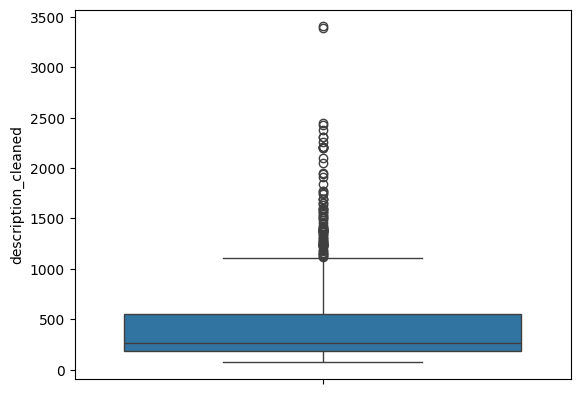

In [56]:
# On obtient la répartition des variables par condensation sur le nombre de caractère
tmp = dataset['description_cleaned'].str.len()
sns.boxplot(tmp)

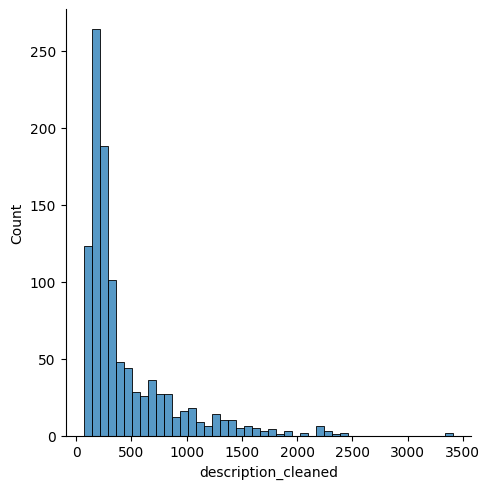

In [57]:
# Ce displot nous permet de distinguer la frequence du nombre de caractère
# L'axe des absicesse représente le nombre de caractère
# L'axe des ordonnées représente le nombre de phrase 
sns.displot(tmp)

In [58]:
# On stock ce vecteur numérique
dataset["description_len_txt"] = tmp
# On affiche le nombre de caractère de chaque ligne de la colonne description
dataset['description_len_txt']

0       1396
1        434
2       1218
3        838
4       1172
        ... 
1045    2261
1046    1564
1047     251
1048     203
1049     180
Name: description_len_txt, Length: 1050, dtype: int64

### <span style="color:green">product_category_tree</span> _(y)_

- La colonne **product_category_tree** s'affiche comme suit: 
**"Home Furnishing >>** Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."
- On définit une fonction pour recupérer le premier niveau de cette arborésence à 3 niveaux dans ce cas le premier niveau correspond à:
**"Home Furnishing"**

                               product_category_tree    category_niv_0
0  ["Home Furnishing >> Curtains & Accessories >>...  Home Furnishing 
1  ["Baby Care >> Baby Bath & Skin >> Baby Bath T...        Baby Care 
2  ["Baby Care >> Baby Bath & Skin >> Baby Bath T...        Baby Care 
3  ["Home Furnishing >> Bed Linen >> Bedsheets >>...  Home Furnishing 
4  ["Home Furnishing >> Bed Linen >> Bedsheets >>...  Home Furnishing 


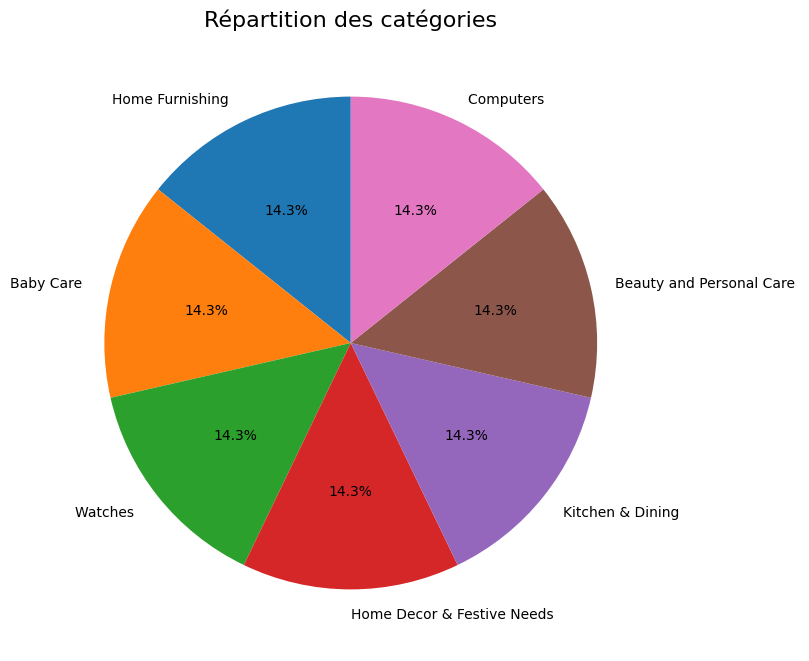

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

# Fonction pour récupérer le premier niveau de l'arbre des catégories
def recup_cat_niveau_0(dataset):
    """
    La fonction qui nous permet de récupérer le premier niveau de l'arboresence de la colonne catégorie.
    """
    if "product_category_tree" in dataset.columns:
        dataset["category_niv_0"] = dataset["product_category_tree"].apply(
            lambda x: x.split('["')[1].split(">>")[0] if pd.notnull(x) else None
        )
    else:
        print("La colonne 'product_category_tree' est absente du dataset.")
    return dataset

# Appliquer la fonction au dataset
dataset = recup_cat_niveau_0(dataset)

# Vérifier les premières lignes pour s'assurer que la colonne a bien été ajoutée
print(dataset[["product_category_tree", "category_niv_0"]].head())

# Compter le nombre d'occurrences pour chaque catégorie de niveau 0
category_counts = dataset['category_niv_0'].value_counts()

# Créer un diagramme circulaire
plt.figure(figsize=(10, 8))
plt.pie(
    category_counts.values,
    labels=category_counts.index,
    autopct='%1.1f%%',  # Afficher les pourcentages
    startangle=90,      # Rotation pour commencer à 12h
    textprops={'fontsize': 10}  # Taille du texte des étiquettes
)
plt.title("Répartition des catégories", fontsize=16)
plt.show()


In [60]:
# On compte affiche le nb d'enregistrement par catégorie
dataset.category_niv_0.value_counts()

category_niv_0
Home Furnishing                150
Baby Care                      150
Watches                        150
Home Decor & Festive Needs     150
Kitchen & Dining               150
Beauty and Personal Care       150
Computers                      150
Name: count, dtype: int64

In [61]:
# On affiche la liste des colonnes du dataset
# Elle inclut maintenant le premier niveau de la catégorie
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications',
       'product_name_cleaned', 'product_len_txt', 'description_cleaned',
       'description_len_txt', 'category_niv_0'],
      dtype='object')

In [62]:
# On affiche les 5 premières lignes de la colonne category_niv_0
dataset['category_niv_0'].head(5)

0    Home Furnishing 
1          Baby Care 
2          Baby Care 
3    Home Furnishing 
4    Home Furnishing 
Name: category_niv_0, dtype: object

In [63]:
# On affiche le nombre unique de catégorie
dataset['category_niv_0'].nunique()

7

- Nous encodons la colonne des catégories

In [64]:
# Importation des bibliothèques nécessaires
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Initialisation du LabelEncoder
label_encoder = LabelEncoder()

# Appliquer le Label Encoding sur la colonne 'category_niv_0'
dataset['label_category'] = label_encoder.fit_transform(dataset['category_niv_0'])

# Afficher les correspondances entre labels et catégories d'origine
categories = label_encoder.classes_
print("\n### Correspondance entre les labels et les catégories ###")
for i, category in enumerate(categories):
    print(f"Le label {i} correspond à la catégorie {category}")

# Affichage du DataFrame final
print("\n### DataFrame avec Label Encoding ###")
print(dataset.head())



### Correspondance entre les labels et les catégories ###
Le label 0 correspond à la catégorie Baby Care 
Le label 1 correspond à la catégorie Beauty and Personal Care 
Le label 2 correspond à la catégorie Computers 
Le label 3 correspond à la catégorie Home Decor & Festive Needs 
Le label 4 correspond à la catégorie Home Furnishing 
Le label 5 correspond à la catégorie Kitchen & Dining 
Le label 6 correspond à la catégorie Watches 

### DataFrame avec Label Encoding ###
                            uniq_id            crawl_timestamp  \
0  55b85ea15a1536d46b7190ad6fff8ce7  2016-04-30 03:22:56 +0000   
1  7b72c92c2f6c40268628ec5f14c6d590  2016-04-30 03:22:56 +0000   
2  64d5d4a258243731dc7bbb1eef49ad74  2016-04-30 03:22:56 +0000   
3  d4684dcdc759dd9cdf41504698d737d8  2016-06-20 08:49:52 +0000   
4  6325b6870c54cd47be6ebfbffa620ec7  2016-06-20 08:49:52 +0000   

                                         product_url  \
0  http://www.flipkart.com/elegance-polyester-mul...   
1  http://www.

- / On affiche le dataset à jour
- / On vérrifie la précense de la liste des colonnes

- **product_name_cleaned** : qui correspond à la colonne des **produits nétoyéés**
- **description_cleaned** : qui correspond à la colonne des **description produits nétoyées**

In [65]:
# On affiche les 5 premières lignes du dataframe puis on vérifie
dataset.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",elegance polyester multicolor abstract eyelet ...,58,key features of elegance polyester multicolor ...,1396,Home Furnishing,4
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",sathiyas cotton bath towel,26,specifications of sathiyas cotton bath towel 3...,434,Baby Care,0
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",eurospa cotton terry face towel set,35,key features of eurospa cotton terry face towe...,1218,Baby Care,0
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",santosh royal fashion cotton printed king size...,63,key features of santosh royal fashion cotton p...,838,Home Furnishing,4
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,"[""Home Furnishing >> Bed Linen >> Bedsheets >>...",BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",jaipur print cotton floral king sized double b...,53,key features of jaipur print cotton floral kin...,1172,Home Furnishing,4


### 0.1 Analyse mutlivariée

In [66]:
import seaborn as sns

# Sélection des colonnes numériques uniquement
dataset_numeric = dataset.select_dtypes(include=['number'])

# Calcul de la matrice de corrélation des varriables numériques
corr = dataset_numeric.corr()


In [67]:
# On affiche les statistique de corrélation des colonnes numériques
corr

,retail_price,discounted_price,product_len_txt,description_len_txt,label_category
retail_price,1.000000,0.990065,0.047627,-0.002879,0.037830
discounted_price,0.990065,1.000000,0.039541,-0.016313,0.046339
product_len_txt,0.047627,0.039541,1.000000,0.183761,-0.035723
description_len_txt,-0.002879,-0.016313,0.183761,1.000000,-0.028968
label_category,0.037830,0.046339,-0.035723,-0.028968,1.000000


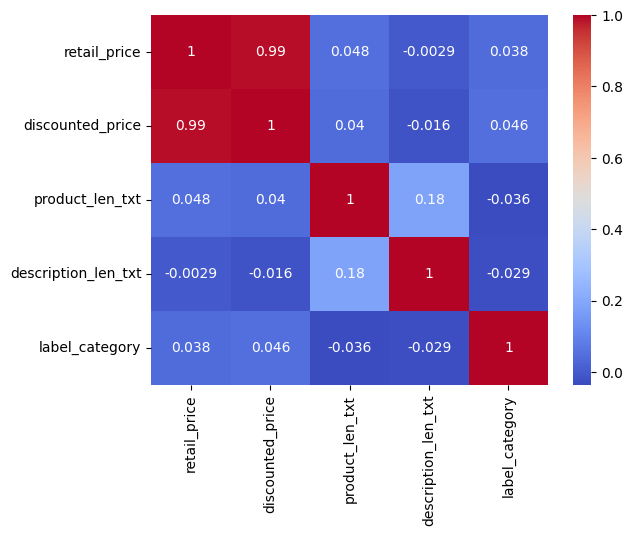

In [68]:
# Affichage avec seaborn
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.show()

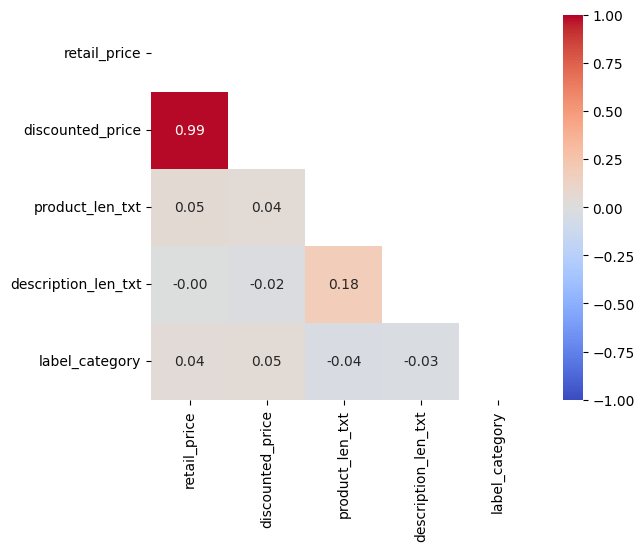

In [69]:
# On affiche une matrice de correlation plus optimiséée
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(1,1, figsize=(7,5))
ax = sns.heatmap(corr, mask=mask, vmin=-1, vmax=1, cmap="coolwarm", annot=True, fmt=".2f", square=True)

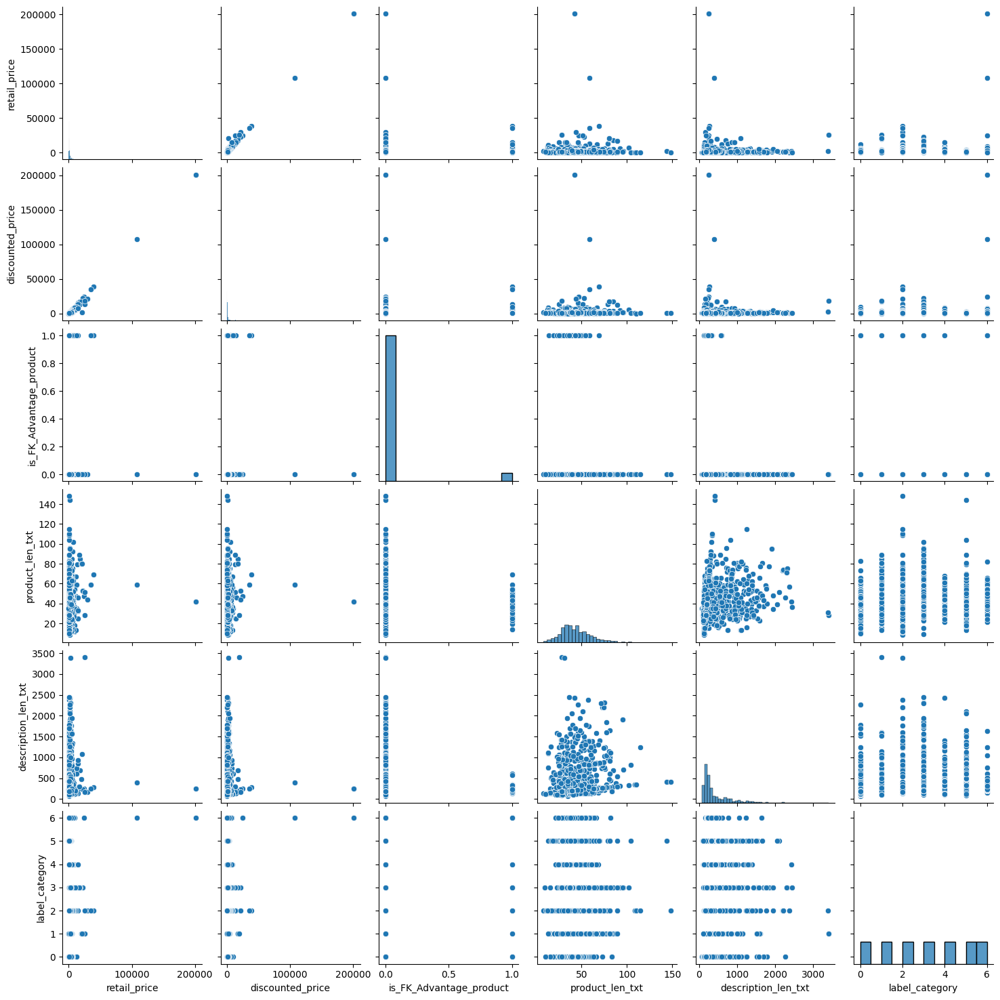

In [70]:
# On effectue un pair plot entre les variable X
sns.pairplot(dataset)

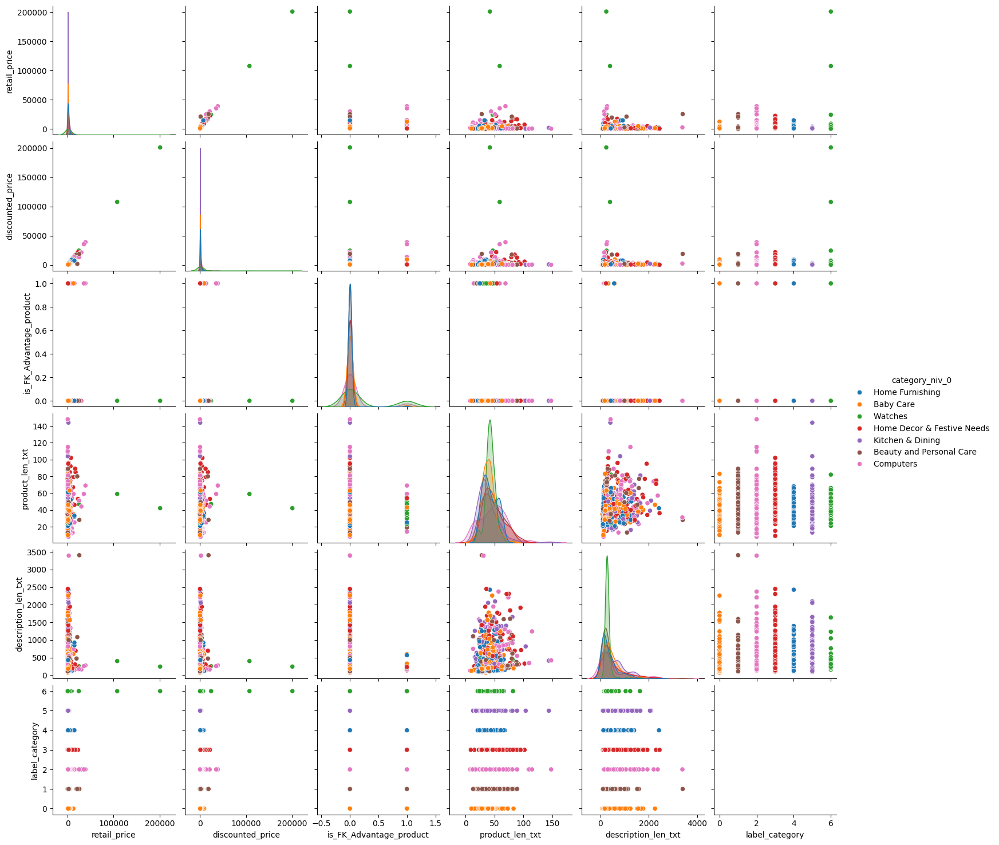

In [71]:
# On affiche les correlations
sns.pairplot(dataset, hue="category_niv_0")

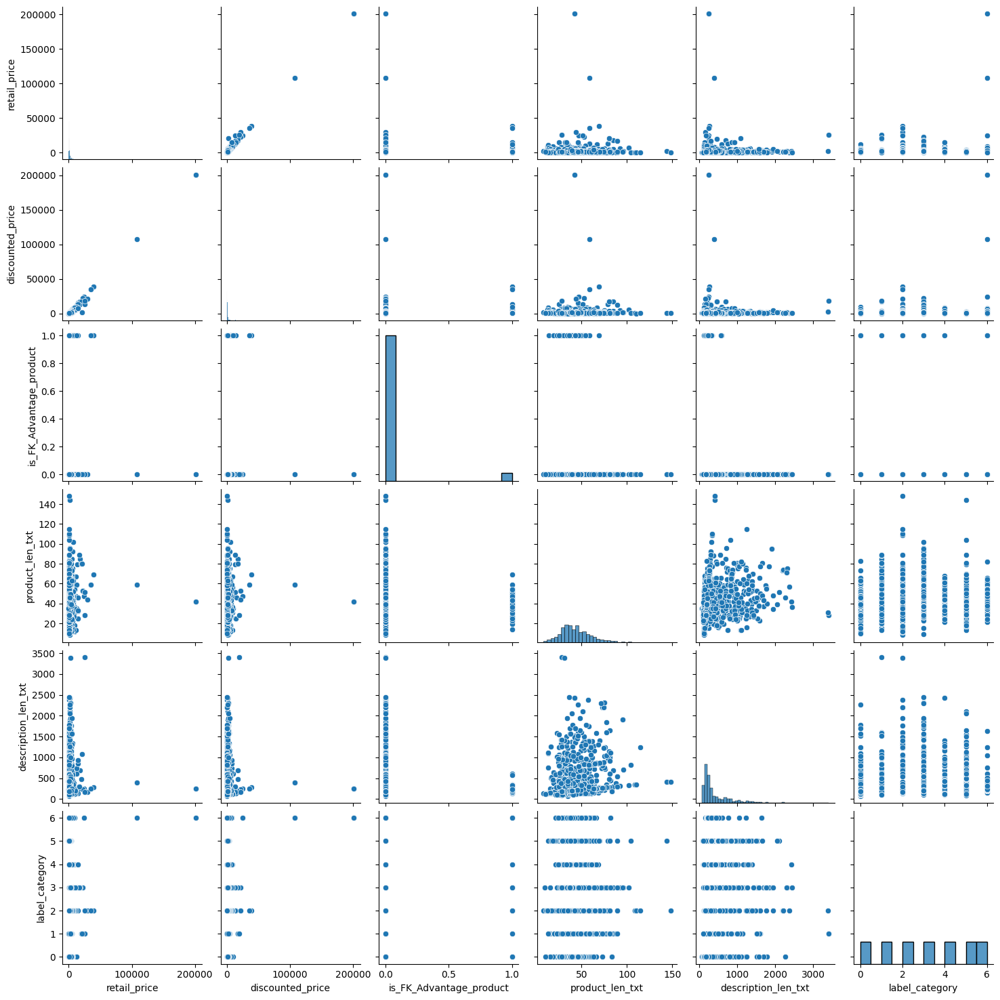

In [72]:
# On effectue un pairplot
import seaborn as sns 
sns.pairplot(dataset)

In [73]:
# On affiche le nombre de string de la colonne description par ordre croissant
dataset.sort_values("description_len_txt").head(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
599,84b2e623a4a4327b88f7fe197a09be31,2016-01-07 00:54:41 +0000,http://www.flipkart.com/next-steps-baby-girl-s...,Next Steps Baby Girl's Layered Dress,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",DREEDFVG4HH3HFHT,599.0,356.0,84b2e623a4a4327b88f7fe197a09be31.jpg,False,...,No rating available,No rating available,NaN,"{""product_specification""=>[{""value""=>""1 Dress""...",next steps baby girls layered dress,35,next steps baby girls layered dress price rs 3...,72,Baby Care,0
235,e1e133cbe616bee3b3e9e6f4f0882e3d,2015-12-01 12:40:44 +0000,http://www.flipkart.com/celebrity-wheel-pizza-...,Celebrity Wheel Pizza Cutter,"[""Kitchen & Dining >> Kitchen Tools >> Kitchen...",PACEBCKNZUYD9YGX,699.0,199.0,e1e133cbe616bee3b3e9e6f4f0882e3d.jpg,False,...,No rating available,No rating available,Celebrity,"{""product_specification""=>[{""key""=>""Brand"", ""v...",celebrity wheel pizza cutter,28,celebrity wheel pizza cutter carbon steel pack...,90,Kitchen & Dining,5
877,c943647eee4de99fc1b4e233b9a7f47d,2015-12-20 08:26:17 +0000,http://www.flipkart.com/nkp-cotton-bath-towel/...,Nkp Cotton Bath Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWEBZYHA6ZFBWK4,599.0,549.0,c943647eee4de99fc1b4e233b9a7f47d.jpg,False,...,No rating available,No rating available,Nkp,"{""product_specification""=>[{""key""=>""Material"",...",nkp cotton bath towel,21,buy nkp cotton bath towel at rs 549 at flipkar...,103,Home Furnishing,4
890,72db37ec42ee76d79cf395221e0f4cce,2015-12-20 08:26:17 +0000,http://www.flipkart.com/iws-cotton-bath-towel/...,IWS Cotton Bath Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWE88GQZKD6N3VX,599.0,299.0,72db37ec42ee76d79cf395221e0f4cce.jpg,False,...,No rating available,No rating available,IWS,"{""product_specification""=>[{""key""=>""Machine Wa...",iws cotton bath towel,21,buy iws cotton bath towel at rs 299 at flipkar...,103,Home Furnishing,4
651,705b90361aeda1849a728d80625a78a9,2015-12-31 09:19:31 +0000,http://www.flipkart.com/marvel-cotton-bath-tow...,Marvel Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEE4HMGWFQPGWH,449.0,449.0,705b90361aeda1849a728d80625a78a9.jpg,False,...,No rating available,No rating available,Marvel,"{""product_specification""=>[{""key""=>""Material"",...",marvel cotton bath towel,24,buy marvel cotton bath towel at rs 449 at flip...,106,Baby Care,0
892,6858fd9265d348803b18667fe43cd054,2015-12-20 08:26:17 +0000,http://www.flipkart.com/mb-cotton-set-towels/p...,MB Cotton Set of Towels,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWEYFA942QUCJ6Q,1495.0,1195.0,6858fd9265d348803b18667fe43cd054.jpg,False,...,3.5,3.5,MB,"{""product_specification""=>[{""key""=>""Material"",...",mb cotton set of towels,23,buy mb cotton set of towels at rs 1195 at flip...,106,Home Furnishing,4
678,22ac36ba254a68d7dd6173f099771147,2015-12-31 09:19:31 +0000,http://www.flipkart.com/neyth-cotton-set-towel...,Neyth Cotton Set of Towels,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEDRTHRY83HXYY,300.0,170.0,22ac36ba254a68d7dd6173f099771147.jpg,False,...,No rating available,No rating available,Neyth,"{""product_specification""=>[{""key""=>""Material"",...",neyth cotton set of towels,26,buy neyth cotton set of towels at rs 170 at fl...,108,Baby Care,0
874,da8017c195b3bfa4ef002968a3542707,2015-12-20 08:26:17 +0000,http://www.flipkart.com/mafatlal-cotton-bath-t...,Mafatlal Cotton Bath Towel,"[""Home Furnishing >> Bath Linen >> Towels""]",BTWDZHJG9GYG646G,735.0,545.0,da8017c195b3bfa4ef002968a3542707.jpg,False,...,No rating available,No rating available,Mafatlal,"{""product_specification""=>[{""key""=>""Material"",...",mafatlal cotton bath towel,26,buy mafatlal cotton bath towel at rs 545 at

In [74]:
# On affiche le nombre de string de la colonne product_name par ordre croissant
dataset.sort_values("product_len_txt").head(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
355,26989e846c2096a5b59b59cbea2cc7ab,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-a6/p/itmdngvv3dz...,Tenda A6,"[""Computers >> Network Components >> Routers >...",RTRDNGVME4HGYAM8,1800.0,1399.0,26989e846c2096a5b59b59cbea2cc7ab.jpg,False,...,4.8,4.8,Tenda,"{""product_specification""=>[{""key""=>""In The Box...",tenda a6,8,buy tenda a6 only for rs 1800 from flipkartcom...,128,Computers,2
335,353ddb2c8ab6920d8ad1055abee87dda,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-a5/p/itmdp2cxeq6...,Tenda A5,"[""Computers >> Network Components >> Routers >...",RTRDNY65WHG9FHTS,1999.0,1999.0,353ddb2c8ab6920d8ad1055abee87dda.jpg,False,...,5,5,Tenda,"{""product_specification""=>[{""key""=>""In The Box...",tenda a5,8,buy tenda a5 only for rs 2250 from flipkartcom...,128,Computers,2
250,17611e6e94d73ef376834e5c6ee03dde,2015-12-01 12:40:44 +0000,http://www.flipkart.com/true-bong/p/itmeb467du...,TRUE Bong,"[""Home Decor & Festive Needs >> TRUE Home Deco...",BNGEB467ZXZZ4HWS,999.0,549.0,17611e6e94d73ef376834e5c6ee03dde.jpg,False,...,No rating available,No rating available,TRUE,"{""product_specification""=>[{""key""=>""Brand"", ""v...",true bong,9,buy true bong for rs549 online true bong at be...,142,Home Decor & Festive Needs,3
909,3aaa50eb5d2cf4c18b57346423871624,2016-04-02 19:26:28 +0000,http://www.flipkart.com/portia-hat/p/itmehchjk...,Portia Hat,"[""Baby Care >> Infant Wear >> Baby Girls' Clot...",HATEHCHJJZBFFAZG,799.0,399.0,3aaa50eb5d2cf4c18b57346423871624.jpg,False,...,No rating available,No rating available,Portia,"{""product_specification""=>[{""key""=>""Number of ...",portia hat,10,specifications of portia hat pink pack of 1 in...,124,Baby Care,0
364,b4327c9879644be2a04e9b2df963f6cb,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-fh330/p/itme7dbh...,Tenda FH330,"[""Computers >> Network Components >> Routers >...",RTRE7DBH3ZDKADUS,3500.0,1705.0,b4327c9879644be2a04e9b2df963f6cb.jpg,False,...,4,4,Tenda,"{""product_specification""=>[{""key""=>""In The Box...",tenda fh330,11,buy tenda fh330 only for rs 1705 from flipkart...,131,Computers,2
312,c20bf28cd809790c04e78fdaf47c038f,2015-12-01 06:13:00 +0000,http://www.flipkart.com/intex-w150d/p/itme7ft9...,Intex W150D,"[""Computers >> Network Components >> Routers >...",RTRE7FT9VKRGNTRR,2200.0,1350.0,c20bf28cd809790c04e78fdaf47c038f.jpg,False,...,5,5,Intex,"{""product_specification""=>[{""key""=>""Wireless S...",intex w150d,11,buy intex w150d only for rs 1149 from flipkart...,131,Computers,2
712,227fc5c4fca14c424ff33e40941d22fa,2016-01-01 19:37:22 +0000,http://www.flipkart.com/mykid-nappy/p/itme5282...,MyKid Nappy,"[""Baby Care >> Diapering & Potty Training >> N...",NPYE5282ZUBCWPKE,399.0,199.0,227fc5c4fca14c424ff33e40941d22fa.jpg,False,...,No rating available,No rating available,MyKid,"{""product_specification""=>[{""key""=>""Brand"", ""v...",mykid nappy,11,flipkartcom is offering mykid nappy for only f...,120,Baby Care,0
419,e365b55f806e5d0abe0094a9f2590e33,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tenda-3g622r/p/itmdp2c...,Tenda 3G622R+,"[""Computers >> Network Components >> Routers >...",RTRDNGVMCGNCTWUU,3500.0,1913.0,e365b55f806e5d0abe0094a9f2590e33.jpg,False,...,3.7,3.7,Tenda,"{""product_specification""=>[{""key""=>""In The Box...",tenda 3g622r,12,buy tenda 3g622r only for rs 3500 from flipkar...,132,Computers,2
383,54754ccd18f2a75c53de68806176392a,2015-12-01 06:13:00 +0000,http://www.flipkart.com/netis-wf-2301/p/itmecz...,Netis WF-2301,"[""Computers >> Network Components >> Routers >...",RTRECZANMW6UAQ5A,5249.0,5249.0,54754ccd18f2a75c53de68806176392a.jpg,False,...,No rating available,No rating available,Netis,"{""product_specification""=>[{""key""=>""In 

In [75]:
# On affiche le nombre de string de la colonne description par ordre croissant (les 10 derniers)
dataset.sort_values("description_len_txt").tail(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
434,ea199e645da893f2ab0c45cf07face13,2016-03-11 06:55:07 +0000,http://www.flipkart.com/smartpro-19-5v-3-9a-re...,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",ACCEGZ65UFENYQG5,1499.0,539.0,ea199e645da893f2ab0c45cf07face13.jpg,False,...,No rating available,No rating available,Smartpro,"{""product_specification""=>[{""key""=>""Brand"", ""v...",smartpro 195v39a replacement charger for vaio ...,74,key features of smartpro 195v39a replacement c...,2208,Computers,2
435,3ccceaae844f34180708cb6cba3441bf,2016-03-11 06:55:07 +0000,http://www.flipkart.com/smartpro-19-5v-3-9a-re...,"Smartpro 19.5v,3.9a Replacement Charger for Va...","[""Computers >> Laptop Accessories >> Adapters ...",ACCEGZ6BDHTWARMS,1499.0,539.0,3ccceaae844f34180708cb6cba3441bf.jpg,False,...,No rating available,No rating available,Smartpro,"{""product_specification""=>[{""key""=>""Brand"", ""v...",smartpro 195v39a replacement charger for vaio ...,74,key features of smartpro 195v39a replacement c...,2208,Computers,2
1045,958f54f4c46b53c8a0a9b8167d9140bc,2015-12-01 10:15:43 +0000,http://www.flipkart.com/oren-empower-extra-lar...,Oren Empower Extra Large Self Adhesive Sticker,"[""Baby Care >> Baby & Kids Gifts >> Stickers >...",STIE88ZGTX65GH4V,1399.0,999.0,958f54f4c46b53c8a0a9b8167d9140bc.jpg,False,...,No rating available,No rating available,Oren Empower,"{""product_specification""=>[{""key""=>""Number of ...",oren empower extra large self adhesive sticker,46,oren empower extra large self adhesive sticker...,2261,Baby Care,0
696,82fbc93cd45ab747e7e606f2c52c7335,2015-12-31 09:19:31 +0000,http://www.flipkart.com/tallenge-christmas-col...,Tallenge Christmas Collection - Nativity Art -...,"[""Home Decor & Festive Needs >> Wall Decor & C...",PTGEDZBHHZKKGTFZ,2499.0,1799.0,82fbc93cd45ab747e7e606f2c52c7335.jpg,False,...,No rating available,No rating available,Tallenge,"{""product_specification""=>[{""key""=>""Brand"", ""v...",tallenge christmas collection nativity art gal...,71,tallenge christmas collection nativity art gal...,2305,Home Decor & Festive Needs,3
694,0ae859a69c7608d8197c3ba8c37bc6ec,2015-12-31 09:19:31 +0000,http://www.flipkart.com/tallenge-christmas-col...,Tallenge Christmas Collection - Echoes Of Wint...,"[""Home Decor & Festive Needs >> Wall Decor & C...",PTGEDZBHZHGW2H4H,2499.0,1799.0,0ae859a69c7608d8197c3ba8c37bc6ec.jpg,False,...,No rating available,No rating available,Tallenge,"{""product_specification""=>[{""key""=>""Brand"", ""v...",tallenge christmas collection echoes of winter...,75,tallenge christmas collection echoes of winter...,2309,Home Decor & Festive Needs,3
589,621a88993a7033df3440ec816c2e386f,2016-05-10 11:57:25 +0000,http://www.flipkart.com/shopfloor-xyz-vacuum-c...,"Shopfloor.XYZ Vacuum Cleaner for Computers, La...","[""Computers >> Laptop Accessories >> Cleaning ...",CLKEGH4ADYDTQFHE,399.0,269.0,621a88993a7033df3440ec816c2e386f.jpg,False,...,No rating available,No rating available,Shopfloor.XYZ,"{""product_specification""=>[{""key""=>""Brand"", ""v...",shopfloorxyz vacuum cleaner for computers lapt...,57,shopfloorxyz vacuum cleaner for computers lapt...,2374,Computers,2
715,d68b774e9529a4b94a5c6c8943a1b8b3,2016-01-01 19:37:22 +0000,http://www.flipkart.com/pioneer-pragati-floral...,Pioneer Pragati Floral Single Duvet Orange,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",BLAEDAN7HXG3CAHD,1999.0,1099.0,d68b774e9529a4b94a5c6c8943a1b8b3.jpg,False,...,No rating available,No rating available,Pioneer Pragati,"{""product_specification""=>[{""key""=>""Machine Wa...",pioneer pragati floral single duvet orange,42,pioneer pragati floral single duvet orange 1 d...,2426,Home Furnishing,4
916,c5

In [76]:
# On affiche le nombre de string de la colonne description par ordre croissant (les 10 derniers)
dataset.sort_values("product_len_txt").tail(10)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
201,9c4ab8ab059c912090c83cb0818e7f1c,2015-12-01 12:40:44 +0000,http://www.flipkart.com/lal-haveli-rajasthani-...,Lal Haveli Rajasthani Wooden Crafted Unique Ch...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE9J6ZRMDMGTF9,6400.0,4795.0,9c4ab8ab059c912090c83cb0818e7f1c.jpg,False,...,No rating available,No rating available,Lal Haveli,"{""product_specification""=>[{""key""=>""Brand"", ""v...",lal haveli rajasthani wooden crafted unique ch...,92,buy lal haveli rajasthani wooden crafted uniqu...,309,Home Decor & Festive Needs,3
284,63f2d92a3f5fc6cfc11e7f99d5798eac,2016-04-24 18:34:50 +0000,http://www.flipkart.com/services-junction-beau...,Services Junction Beautiful Black and Golden c...,"[""Home Decor & Festive Needs >> Showpiece >> C...",SHIEHYHHNPVZEXVZ,1499.0,1249.0,63f2d92a3f5fc6cfc11e7f99d5798eac.jpg,False,...,No rating available,No rating available,Services Junction,"{""product_specification""=>[{""key""=>""Brand"", ""v...",services junction beautiful black and golden c...,95,key features of services junction beautiful bl...,1915,Home Decor & Festive Needs,3
265,412d0425bb7076610aace6549ded265c,2015-12-01 12:40:44 +0000,http://www.flipkart.com/lal-haveli-rajasthani-...,Lal Haveli Rajasthani Handmade Vintage Wooden ...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE9J6PYVBW5ATG,2000.0,1499.0,412d0425bb7076610aace6549ded265c.jpg,False,...,No rating available,No rating available,Lal Haveli,"{""product_specification""=>[{""key""=>""Brand"", ""v...",lal haveli rajasthani handmade vintage wooden ...,96,lal haveli rajasthani handmade vintage wooden ...,712,Home Decor & Festive Needs,3
210,3113367c72125a3355af42426fe14f17,2015-12-01 12:40:44 +0000,http://www.flipkart.com/lal-haveli-beautiful-a...,Lal Haveli Beautiful Attractive Hand Painted D...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE9FMP3RBSYMEV,7400.0,5549.0,3113367c72125a3355af42426fe14f17.jpg,False,...,No rating available,No rating available,Lal Haveli,"{""product_specification""=>[{""key""=>""Brand"", ""v...",lal haveli beautiful attractive hand painted d...,102,buy lal haveli beautiful attractive hand paint...,329,Home Decor & Festive Needs,3
601,5e52d6ce133e5307814f9f3eedc5806d,2016-06-23 09:29:10 +0000,http://www.flipkart.com/posterchacha-ishita-pe...,posterchacha Ishita Personalised Custom Name H...,"[""Kitchen & Dining >> Coffee Mugs >> postercha...",MUGEJWBRFZJHGSBG,399.0,349.0,5e52d6ce133e5307814f9f3eedc5806d.jpg,False,...,No rating available,No rating available,posterchacha,"{""product_specification""=>[{""key""=>""Type"", ""va...",posterchacha ishita personalised custom name h...,104,key features of posterchacha ishita personalis...,817,Kitchen & Dining,5
833,6e7cc21610991cab64595af678e8eb5a,2015-12-29 05:07:38 +0000,http://www.flipkart.com/tapawire-portable-usb-...,Tapawire Portable USB Flexible Stick Dimmable ...,"[""Computers >> Laptop Accessories >> USB Gadge...",USGEDRPHJHRGHJNH,699.0,449.0,6e7cc21610991cab64595af678e8eb5a.jpg,False,...,No rating available,No rating available,Tapawire,"{""product_specification""=>[{""key""=>""Brand"", ""v...",tapawire portable usb flexible stick dimmable ...,109,buy tapawire portable usb flexible stick dimma...,342,Computers,2
848,41dccf212ff447cd7213a2b1e669e406,2015-12-29 05:07:38 +0000,http://www.flipkart.com/generix-hdmi-female-co...,Generix HDMI Female To Female Coupler Jointer ...,"[""Computers >> Laptop Accessories >> USB Gadge...",USGECN4WHY7M9MZJ,299.0,166.0,41dccf212ff447cd7213a2b1e669e406.jpg,False,...,5,5,Generix,"{""product_specification""=>[{""key""=>""Brand"", ""v...",generix hdmi female to female coupler jointer ...,110,buy generix hdmi female to female coupler join...,344,Com

In [77]:
# On affiche les colonnes du dataset
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications',
       'product_name_cleaned', 'product_len_txt', 'description_cleaned',
       'description_len_txt', 'category_niv_0', 'label_category'],
      dtype='object')

In [78]:
# On affiche les colonne X (X_1 et X_2 du dataset)
# X_1 = product_named cleaned (le nom du produit)
# X_2 = description cleaned (la description du produit)
# On affiche les colonne X (y_1 et y_2 du dataset)
# Y_1 = label category (la description des catégories encodée)
# Y_2 = label category (la description des catégories format texte)
print("Chargements des variables au préalable de l'étape de feature extraction...")
dataset[['product_name_cleaned','description_cleaned','label_category','category_niv_0']].head()

Chargements des variables au préalable de l'étape de feature extraction...


,product_name_cleaned,description_cleaned,label_category,category_niv_0
0,elegance polyester multicolor abstract eyelet ...,key features of elegance polyester multicolor ...,4,Home Furnishing
1,sathiyas cotton bath towel,specifications of sathiyas cotton bath towel 3...,0,Baby Care
2,eurospa cotton terry face towel set,key features of eurospa cotton terry face towe...,0,Baby Care
3,santosh royal fashion cotton printed king size...,key features of santosh royal fashion cotton p...,4,Home Furnishing
4,jaipur print cotton floral king sized double b...,key features of jaipur print cotton floral kin...,4,Home Furnishing


In [79]:
# On enregistre le dataset
# On spécifie l'index est égale à false
# Cest pour enregistrer le document csv sans colonne indiquant le nombre de l'enregistrement 
print("Enregistrement du dataset en cours ...")
dataset.to_csv("dataset_basic_cleaned.csv", index=False)
print("dataset enregistré")

Enregistrement du dataset en cours ...
dataset enregistré


### 0.2 Explore corpus and documents

In [80]:
# On affiche 20 lignes au harsard du dataset
print('On affiche un échantillon de 20 lignes du dataset ...')
df_samp = dataset.sample(20)
df_samp

On affiche un échantillon de 20 lignes du dataset ...


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
799,5188dd28a627807407d93549580afb74,2015-12-12 11:46:53 +0000,http://www.flipkart.com/rajrang-animal-cushion...,Rajrang Animal Cushions Cover,"[""Home Furnishing >> Cushions, Pillows & Cover...",CPCE8URTHJE6AK3N,2149.0,984.0,5188dd28a627807407d93549580afb74.jpg,False,...,No rating available,No rating available,Rajrang,"{""product_specification""=>[{""key""=>""Brand"", ""v...",rajrang animal cushions cover,29,buy rajrang animal cushions cover at rs 984 at...,111,Home Furnishing,4
912,e225be101bbad1ea9d031261ba4387b8,2016-04-02 19:26:28 +0000,http://www.flipkart.com/bourne-supermacy-canva...,Bourne Supermacy Canvas Art,"[""Home Decor & Festive Needs >> Wall Decor & C...",POSEH49H6VAUSEUZ,1299.0,999.0,e225be101bbad1ea9d031261ba4387b8.jpg,False,...,No rating available,No rating available,Urban Monk,"{""product_specification""=>[{""value""=>""Warrenty...",bourne supermacy canvas art,27,key features of bourne supermacy canvas art un...,1419,Home Decor & Festive Needs,3
822,3fd4d7ea04624ada39fde3957c7b9b7c,2016-05-08 09:23:06 +0000,http://www.flipkart.com/bharatcraft-wall-hangi...,Bharatcraft Wall Hanging Of Lord Ganesha On A ...,"[""Home Decor & Festive Needs >> Showpiece >> B...",SHIEGFC2FMKUGNZZ,1999.0,1124.0,3fd4d7ea04624ada39fde3957c7b9b7c.jpg,False,...,No rating available,No rating available,Bharatcraft,"{""product_specification""=>[{""key""=>""Brand"", ""v...",bharatcraft wall hanging of lord ganesha on a ...,77,key features of bharatcraft wall hanging of lo...,1051,Home Decor & Festive Needs,3
281,db3e2eeb4fe90d4755f2911d661eae95,2016-04-24 18:34:50 +0000,http://www.flipkart.com/bhavya-velvet-sofa-cov...,Bhavya Velvet Sofa Cover,"[""Home Furnishing >> Living >> Sofa Covers >> ...",SLIEHET3CZ6XSDHP,3000.0,1999.0,db3e2eeb4fe90d4755f2911d661eae95.jpg,False,...,No rating available,No rating available,Bhavya,"{""product_specification""=>[{""key""=>""Pack of"", ...",bhavya velvet sofa cover,24,bhavya velvet sofa cover grey pack of 10 price...,360,Home Furnishing,4
304,95cb9561009bd6707c67f05e6a00c16e,2015-12-01 06:13:00 +0000,http://www.flipkart.com/homedesires-showpiece-...,Homedesires Showpiece - 10.5 cm,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIECV5BYUZEQJT7,899.0,340.0,95cb9561009bd6707c67f05e6a00c16e.jpg,False,...,No rating available,No rating available,Homedesires,"{""product_specification""=>[{""key""=>""Brand"", ""v...",homedesires showpiece 105 cm,28,buy homedesires showpiece 105 cm for rs340 onl...,180,Home Decor & Festive Needs,3
233,34d3b2b8d263294107a3ffc69b35ff8f,2015-12-01 12:40:44 +0000,http://www.flipkart.com/ethnic-story-royal-dur...,The Ethnic Story Royal Durban Showpiece - 30...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE8Q7P5XAGDZ4H,3700.0,1850.0,34d3b2b8d263294107a3ffc69b35ff8f.jpg,False,...,No rating available,No rating available,The Ethnic Story,"{""product_specification""=>[{""key""=>""Brand"", ""v...",the ethnic story royal durban showpiece 3048 cm,47,buy the ethnic story royal durban showpiece 30...,219,Home Decor & Festive Needs,3
221,81a695f80d3f5c445910d310f1a83eb8,2015-12-01 12:40:44 +0000,http://www.flipkart.com/s-c-handicrafts-sandal...,S C Handicrafts Sandalwood Chinese Queen. Show...,"[""Home Decor & Festive Needs >> Showpieces >> ...",SHIE3FHYZYD3JHQD,8500.0,8500.0,81a695f80d3f5c445910d310f1a83eb8.jpg,False,...,No rating available,No rating available,S C Handicrafts,"{""product_specification""=>[{""key""=>""Brand"", ""v...",s c handicrafts sandalwood chinese queen showp...,56,buy s c handicrafts sandalwood chinese queen s...,237,Home Decor & Festive Needs,3
390,ae19a81b730b48b87ca72521af8fb902,2015-12-01 06:13:00 +0000,http://www.flipkart.com/tp-link-4-port-cable-d...

In [81]:
# On extrait l'indice et le vecteur en imprimant la partie texte
for idx, ser in df_samp.iterrows() : 
    print(ser[["description_cleaned","product_name_cleaned"]])

description_cleaned     buy rajrang animal cushions cover at rs 984 at...
product_name_cleaned                        rajrang animal cushions cover
Name: 799, dtype: object
description_cleaned     key features of bourne supermacy canvas art un...
product_name_cleaned                          bourne supermacy canvas art
Name: 912, dtype: object
description_cleaned     key features of bharatcraft wall hanging of lo...
product_name_cleaned    bharatcraft wall hanging of lord ganesha on a ...
Name: 822, dtype: object
description_cleaned     bhavya velvet sofa cover grey pack of 10 price...
product_name_cleaned                             bhavya velvet sofa cover
Name: 281, dtype: object
description_cleaned     buy homedesires showpiece 105 cm for rs340 onl...
product_name_cleaned                         homedesires showpiece 105 cm
Name: 304, dtype: object
description_cleaned     buy the ethnic story royal durban showpiece 30...
product_name_cleaned      the ethnic story royal durban showp

In [82]:
# On va formater notre chaîne de caractères 
# On affiche la target Y
# On affiche le nom du produit
for idx, ser in df_samp.iterrows():
    txt_1 = f"label_category_(target Y) : {ser['category_niv_0']}\n"
    print(txt_1 + ser['product_name_cleaned'] + "..." + "\n\n")

label_category_(target Y) : Home Furnishing 
rajrang animal cushions cover...


label_category_(target Y) : Home Decor & Festive Needs 
bourne supermacy canvas art...


label_category_(target Y) : Home Decor & Festive Needs 
bharatcraft wall hanging of lord ganesha on a creative leaf showpiece 3429 cm...


label_category_(target Y) : Home Furnishing 
bhavya velvet sofa cover...


label_category_(target Y) : Home Decor & Festive Needs 
homedesires showpiece 105 cm...


label_category_(target Y) : Home Decor & Festive Needs 
the ethnic story royal durban showpiece 3048 cm...


label_category_(target Y) : Home Decor & Festive Needs 
s c handicrafts sandalwood chinese queen showpiece 16 cm...


label_category_(target Y) : Computers 
tplink 4port cabledsltlr460...


label_category_(target Y) : Kitchen & Dining 
jaipan kd25 kadhai 25 l...


label_category_(target Y) : Baby Care 
little feetz baby girls solid top skirt set...


label_category_(target Y) : Watches 
fighter figh008 digital watc

In [83]:
# On va formater notre chaîne de caractères 
# On affiche la target Y
# On affiche la description du produit
for idx, ser in df_samp.iterrows():
    txt_1 = f"label_category_(target Y) : {ser['category_niv_0']}\n"
    print(txt_1 + ser['description_cleaned'] + "..." + "\n\n")

label_category_(target Y) : Home Furnishing 
buy rajrang animal cushions cover at rs 984 at flipkartcom only genuine products free shipping cash on delivery...


label_category_(target Y) : Home Decor & Festive Needs 
key features of bourne supermacy canvas art unique and uber design high grade 300 gsm canvas poster bright detailed printing standard 12 x 18 size comes in rolled form in a poster tubebourne supermacy canvas art 18 inch x 12 inch rolled price rs 999 bourne supermacy canvas poster from urban monk accomplishes its task of reflecting your passion about the thing and solely provides an elegant touch to your home or your work place understanding and providing the urban folks with the designs ranging from music movies tv shows cricket football nba nfl minimal funny abstract art etc posters is our sole purposebourne supermacy 12x18 inches poster is made of high grade 300gsm canvas paper then printed using ultra violet discharge printing for the richness of colours and details we

In [84]:
# On affiche les valeurs uniques de la colonne "category_niv_0"
print(dataset['category_niv_0'].unique())

['Home Furnishing ' 'Baby Care ' 'Watches ' 'Home Decor & Festive Needs '
 'Kitchen & Dining ' 'Beauty and Personal Care ' 'Computers ']


### 0.3 Print documents versus target

In [85]:
# Cette fonction nous permet de déterminer un nombre d"échantillon
def print_sample(sub_df, n_samp=10) : 
    """print out n_samp documents from a corpus"""

    samp = sub_df.sample(n_samp)

    for idx, ser in samp.iterrows():

        txt_1 = f"target : {ser['label_category']}\n"
        print(txt_1+ser['product_name_cleaned']+ "..." + "\n\n")

In [86]:
# On affiche les nom de produit qui correspondent à la catégorie "Baby Care"
df_1 = dataset[dataset.label_category == 1]
df_1.head()

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_name_cleaned,product_len_txt,description_cleaned,description_len_txt,category_niv_0,label_category
43,2d50e4c6ccf8befe9335ac8f97a11712,2016-03-20 14:44:44 +0000,http://www.flipkart.com/burt-s-bees-hair-repai...,Burt s Bees Hair Repair Shea And Grapefruit De...,"[""Beauty and Personal Care >> Hair Care >> Con...",CNDEGVE65UWDPCYC,2712.0,1248.0,2d50e4c6ccf8befe9335ac8f97a11712.jpg,False,...,No rating available,No rating available,Burt s Bees,"{""product_specification""=>[{""key""=>""Hair Condi...",burt s bees hair repair shea and grapefruit de...,60,key features of burt s bees hair repair shea a...,512,Beauty and Personal Care,1
49,02a53d335775b652f22f41b529b9d646,2016-03-20 14:44:44 +0000,http://www.flipkart.com/suave-naturals-everlas...,Suave Naturals Everlasting Sunshine Conditioner,"[""Beauty and Personal Care >> Hair Care >> Con...",CNDEGVE6PR98MZHU,2300.0,1126.0,02a53d335775b652f22f41b529b9d646.jpg,False,...,No rating available,No rating available,Suave,"{""product_specification""=>[{""key""=>""Hair Condi...",suave naturals everlasting sunshine conditioner,47,key features of suave naturals everlasting sun...,461,Beauty and Personal Care,1
56,24e85c590481a7cedfe66597f253f2b2,2016-01-04 00:53:01 +0000,http://www.flipkart.com/borse-n16-make-up-jewe...,Borse N16 Make Up And Jewellery Vanity Case,"[""Beauty and Personal Care >> Makeup >> Vanity...",VANEABFPKGGZTYVQ,2100.0,680.0,24e85c590481a7cedfe66597f253f2b2.jpg,False,...,No rating available,No rating available,NaN,"{""product_specification""=>[{""key""=>""Other Conv...",borse n16 make up and jewellery vanity case,43,buy borse n16 make up and jewellery vanity cas...,210,Beauty and Personal Care,1
57,5e84d36ad6db970548498829db8b15de,2016-06-02 08:05:27 +0000,http://www.flipkart.com/rythmx-fb-nail-polishe...,RYTHMX FB NAIL POLISHES BLACK LIPSTICKS IMPORT...,"[""Beauty and Personal Care >> Combos and Kits ...",CBKEJ3AZMZGTQ9F5,1500.0,399.0,5e84d36ad6db970548498829db8b15de.jpg,False,...,No rating available,No rating available,RYTHMX,"{""product_specification""=>[{""key""=>""Number of ...",rythmx fb nail polishes black lipsticks import...,58,specifications of rythmx fb nail polishes blac...,298,Beauty and Personal Care,1
58,3c4604dba348a99a2dfbbc2cd3928101,2016-06-02 08:05:27 +0000,http://www.flipkart.com/rythmx-fb-nail-polishe...,RYTHMX FB NAIL POLISHES BLACK LIPSTICKS IMPORT...,"[""Beauty and Personal Care >> Combos and Kits ...",CBKEJ3ANG8NRZJPT,1500.0,399.0,3c4604dba348a99a2dfbbc2cd3928101.jpg,False,...,No rating available,No rating available,RYTHMX,"{""product_specification""=>[{""key""=>""Number of ...",rythmx fb nail polishes black lipsticks import...,58,key features of rythmx fb nail polishes black ...,649,Beauty and Personal Care,1


In [87]:
# Print 10 docs of target ==1
print_sample(df_1)

target : 1
engage blush and drizzle combo set...


target : 1
rythmx fb nail polishes black lipsticks important combo 47...


target : 1
wild stone smoke and juice combo set...


target : 1
nike casual combo set...


target : 1
whiteherbs ultra protection sunscreen lotion spf 30 pa...


target : 1
vincent valentine paris set of dark fire dark magic deodorants combo set...


target : 1
aapno rajasthan lovely jewellery vanity jewellery...


target : 1
yardley 12 combo set...


target : 1
adidas ice dive combo set...


target : 1
majik styling decoration hair clip...




In [88]:
# print 10 docs of target ==0
print_sample(dataset[dataset.label_category==4])

target : 4
pioneer pragati floral single duvet orange...


target : 4
welhouse geometric double blanket grey...


target : 4
sapatos plain single duvet red...


target : 4
srp linen cotton plain king sized double bedsheet...


target : 4
prime printed 4 seater table cover...


target : 4
zikrak exim floral cushions cover...


target : 4
jewelkraft designs brown pink table linen set...


target : 4
right abstract cushions cover...


target : 4
remtex export cartoon single dohar multicolor...


target : 4
elegance polyester multicolor abstract eyelet door curtain...




# 1. Pipeline NLP de prétraitement et de feature extraction sur <span style="color:green">**[product_name] et [description]**</span>

Ce document détaille les étapes du traitement textuel pour la colonne `product_name_cleaned`, avec une précision sur les colonnes ajoutées dans le `dataset` ou les matrices générées séparément.

| Étape              | Description                                                                 | Colonne d'entrée           | Sortie                     | Exemple                                                                                          |
|--------------------|-----------------------------------------------------------------------------|----------------------------|----------------------------|--------------------------------------------------------------------------------------------------|
| **Tokenization**   | Découpe le texte en une liste de mots individuels.                         | `product_name_cleaned`            | `product_name_tokenized`   | "Elegant Polyester Curtain" → `['Elegant', 'Polyester', 'Curtain']`                            |
| **StopWords**      | Supprime les mots peu significatifs (ex. "the", "and").                    | `product_name_tokenized`  | `product_name_no_stopwords`| `['Elegant', 'Polyester', 'and', 'Curtain']` → `['Elegant', 'Polyester', 'Curtain']`            |
| **Lemmatization**       | Réduit les mots à leur forme canonique                             | `product_name_no_stopwords` |`product_name_lemmatized`     |`['running', 'run']`                                                       |
| **Bag of Words**   | Crée une matrice de comptage des mots par document.                       | `product_name_lemmatized`    | Matrice séparée (`bow_df_product_name`) | `['Elegant', 'Polyester', 'Curtain']` → `{'Elegant': 1, 'Polyester': 1, 'Curtain': 1}`          |
| **Word Count**     | Calcule le nombre total de mots dans chaque description.                   | `product_name_lemmatized`    | `word_count`               | `['Elegant', 'Polyester', 'Curtain']` → `3`                                                     |
| **TF-IDF**         | Pondère les mots par importance dans le corpus.                           | `product_name_lemmatized`    | Matrice séparée (`tfidf_matrix`) | `{'Elegant': 0.5, 'Polyester': 0.3, 'Curtain': 0.2}`                                            |
| **Word2Vec**       | Génère des vecteurs denses pour chaque mot ou document.                   | `product_name_lemmatized`    | Liste de vecteurs (`word2vec_vectors`) | `"Elegant"` → `[0.12, -0.34, 0.56, ...]`                                                        |
| **BERT**           | Génère des embeddings contextuels riches pour chaque phrase complète.     | `product_name_cleaned`            | Liste de vecteurs (`bert_embeddings`) | "Elegant Polyester Curtain" → `[768-dim vector]`                                                |
| **USE**            | Génère des embeddings globaux pour capturer le sens de la phrase entière. | `product_name_cleaned`            | Liste de vecteurs (`use_embeddings`) | "Elegant Polyester Curtain" → `[512-dim vector]`                                                |

---

Étapes détaillées


1. **Tokenization**
- **Objectif** : Diviser les descriptions textuelles en mots individuels pour les étapes suivantes.
- **Colonne ajoutée** : `product_name_tokenized`
- **Exemple** : "Elegant Polyester Curtain" → `['Elegant', 'Polyester', 'Curtain']`

2. **StopWords**
- **Objectif** : Supprimer les mots peu significatifs (comme "the", "and").
- **Colonne ajoutée** : `product_name_no_stopwords`
- **Exemple** : `['Elegant', 'Polyester', 'and', 'Curtain']` → `['Elegant', 'Polyester', 'Curtain']`

3. **lemmatization**
- **Objectif** : Réduire les mots à leur forme canonique
- **Colonne ajoutée** : `product_name_lemmatized`
- **Exemple** : `['running', 'flies']` → `['run', 'fli']`

4. **Bag of Words**
- **Objectif** : Créer une matrice de comptage des mots pour chaque document.
- **Sortie** : Matrice séparée (`bow_df`)
- **Exemple** : `['Elegant', 'Polyester', 'Curtain']` → `{'Elegant': 1, 'Polyester': 1, 'Curtain': 1}`

5. **Word Count**
- **Objectif** : Compter le nombre de mots dans chaque description.
- **Colonne ajoutée** : `word_count`
- **Exemple** : `['Elegant', 'Polyester', 'Curtain']` → `3`

6. **TF-IDF**
- **Objectif** : Pondérer les mots par leur importance dans le corpus.
- **Sortie** : Matrice séparée (`tfidf_matrix`)
- **Exemple** : `{'Elegant': 0.5, 'Polyester': 0.3, 'Curtain': 0.2}`

**Word2Vec**
- **Objectif** : Générer des vecteurs denses représentant les mots.
- **Sortie** : Liste de vecteurs dans `word2vec_vectors`
- **Exemple** : `"Elegant"` → `[0.12, -0.34, 0.56, ...]`

**BERT**
- **Objectif** : Générer des embeddings riches et contextuels pour les phrases.
- **Sortie** : Liste de vecteurs dans `bert_embeddings`
- **Exemple** : "Elegant Polyester Curtain" → `[768-dim vector]`

**USE (Universal Sentence Encoder)**
- **Objectif** : Produire des embeddings globaux pour capturer le sens de la phrase entière.
- **Sortie** : Liste de vecteurs dans `use_embeddings`
- **Exemple** : "Elegant Polyester Curtain" → `[512-dim vector]`

---

Justification des étapes
1. **Tokenization et StopWords** : Essentiels pour nettoyer et structurer les données textuelles.
2. **Stemming et BoW/TF-IDF** : Permettent de créer des représentations basiques mais efficaces des données.
3. **Word2Vec, BERT, USE** : Capturent des relations sémantiques complexes entre les mots et les phrases.

---



### 1.1 <span style="color:green">Prétraitement</span> NLP des données textuelles: <span style="color:green">**[Tokenization]** </span>

_**Tokenization**_

**Définition :**  
La tokenisation est le processus de **découpage d'un texte en unités plus petites appelées "tokens"**.
Ces tokens peuvent être des mots, des phrases ou même des caractères. Elle est utilisée pour préparer le texte brut pour une analyse ultérieure.

**Exemple :**
```python
texte = "La machine apprend à lire."
tokens = texte.split()
print(tokens)  # Résultat : ['La', 'machine', 'apprend', 'à', 'lire.']

**Natural Language Toolkit**
- **NLTK, Le Natural Language Toolkit**: C'est une bibliothèque Python puissante pour le traitement des **langues naturelles**. 
- Le prétraitement du texte est une étape essentielle qui consiste à **nettoyer** et **transformer** les données textuelles brutes en un format structuré pour les tâches **d'analyse de texte** ou de **machine learning**.


#### <div style="text-align: center; font-weight: bold;">PRODUCT_NAME_TOKENIZED</div>

In [89]:
import time
import datetime

# Démarrer le chronomètre
start_time = time.time()

# Afficher l'heure de début
start_datetime = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
print(f"📌 Début du notebook : {start_datetime}")


📌 Début du notebook : 2025-03-20 09:40:29


In [90]:
import nltk
from nltk.tokenize import WordPunctTokenizer

# Initialisation du tokenizer
wpt = WordPunctTokenizer()

# Tokenisation de la colonne "product_name_cleaned"
dataset["product_name_tokenized"] = dataset["product_name_cleaned"].apply(
    lambda x: wpt.tokenize(x) if isinstance(x, str) else x
)

# Affichage des premières lignes
print("### Tokenization Output ###")
print(dataset[['product_name_cleaned', 'product_name_tokenized']].head())

### Tokenization Output ###
                                product_name_cleaned  \
0  elegance polyester multicolor abstract eyelet ...   
1                         sathiyas cotton bath towel   
2                eurospa cotton terry face towel set   
3  santosh royal fashion cotton printed king size...   
4  jaipur print cotton floral king sized double b...   

                              product_name_tokenized  
0  [elegance, polyester, multicolor, abstract, ey...  
1                    [sathiyas, cotton, bath, towel]  
2         [eurospa, cotton, terry, face, towel, set]  
3  [santosh, royal, fashion, cotton, printed, kin...  
4  [jaipur, print, cotton, floral, king, sized, d...  


In [91]:
# Récupérer une ligne tokenisée
first_line_tokens = dataset['product_name_tokenized'].iloc[56]

# Calculer le nombre total de **tokens** de cette ligne
total_tokens = len(first_line_tokens)

# Calculer le nombre de tokens **uniques** de cette ligne
unique_tokens = len(set(first_line_tokens))

# Afficher les résultats
print("### Première ligne tokenisée ###")
print(first_line_tokens)
print(f"\nNombre total de tokens dans la première ligne : {total_tokens}")
print(f"Nombre de tokens uniques dans la première ligne : {unique_tokens}")


### Première ligne tokenisée ###
['borse', 'n16', 'make', 'up', 'and', 'jewellery', 'vanity', 'case']

Nombre total de tokens dans la première ligne : 8
Nombre de tokens uniques dans la première ligne : 8


In [92]:
# Nous créons une fonction qui s'appelle 'display_tokens_info'
# On écrit une doc string une phrase expliquant en grande ligne la fonction 
def display_tokens_info(product_name_tokenized):
    """display info about corpus """

# On inclut dans cette fonction le calcul du nb total de tokens        
    # Calcul du nombre **total** de tokens
    total_tokens = len(product_name_tokenized)

# On inclut dans cette fonction le calcul du nb de tokens unique
    # Calcul du nombre de tokens **uniques**
    unique_tokens = len(set(product_name_tokenized))
    
# On affiche le résultat (30 premières phrases) de token total et token unique
   # Affichage des informations
    print(f"Nombre total de tokens : {total_tokens}")
    print(f"Nombre de tokens uniques : {unique_tokens}")
    print("\nExtrait des 30 premiers tokens :")
    print(product_name_tokenized[:30])

In [93]:
from nltk.tokenize import wordpunct_tokenize
# On appelle la fonction 
# Application de la tokenisation sur chaque phrase
dataset['product_name_tokenized'] = dataset['product_name_cleaned'].apply(wordpunct_tokenize)

# Parcourir chaque ligne et afficher les informations
for index, tokens in enumerate(dataset['product_name_tokenized']):
    print(f"\n### Ligne {index + 1} ###")
    display_tokens_info(tokens)


### Ligne 1 ###
Nombre total de tokens : 7
Nombre de tokens uniques : 7

Extrait des 30 premiers tokens :
['elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain']

### Ligne 2 ###
Nombre total de tokens : 4
Nombre de tokens uniques : 4

Extrait des 30 premiers tokens :
['sathiyas', 'cotton', 'bath', 'towel']

### Ligne 3 ###
Nombre total de tokens : 6
Nombre de tokens uniques : 6

Extrait des 30 premiers tokens :
['eurospa', 'cotton', 'terry', 'face', 'towel', 'set']

### Ligne 4 ###
Nombre total de tokens : 9
Nombre de tokens uniques : 9

Extrait des 30 premiers tokens :
['santosh', 'royal', 'fashion', 'cotton', 'printed', 'king', 'sized', 'double', 'bedsheet']

### Ligne 5 ###
Nombre total de tokens : 8
Nombre de tokens uniques : 8

Extrait des 30 premiers tokens :
['jaipur', 'print', 'cotton', 'floral', 'king', 'sized', 'double', 'bedsheet']

### Ligne 6 ###
Nombre total de tokens : 7
Nombre de tokens uniques : 7

Extrait des 30 premiers tokens :
['maserati'

In [94]:
# Aplatir les listes en une seule série
all_tokens = dataset['product_name_tokenized'].explode()

# Compter la fréquence des mots
word_counts = all_tokens.value_counts()

# Identifier les mots uniques (apparaissant une seule fois)
list_unique_words = word_counts[word_counts == 1].index

# Supprimer les mots uniques de la colonne 'product_name_tokenized'
dataset['product_name_tokenized'] = dataset['product_name_tokenized'].apply(
    lambda tokens: [token for token in tokens if token not in list_unique_words]
)

# Recalculer tous les mots restants dans la colonne après suppression
all_tokens_after = dataset['product_name_tokenized'].explode()

# Vérifier s'il reste des mots uniques après suppression
unique_words_after = all_tokens_after.value_counts()[all_tokens_after.value_counts() == 1]

# Vérification et affichage
if unique_words_after.empty:
    print("Tous les mots uniques ont bien été retirés de la colonne 'product_name_tokenized'.")
else:
    print("Certains mots uniques n'ont pas été supprimés.")
    print(f"Voici quelques mots uniques restants : {unique_words_after.index.tolist()[:10]}")


Tous les mots uniques ont bien été retirés de la colonne 'product_name_tokenized'.


In [95]:
# Afficher toutes les lignes mises à jour (les 1050 premières lignes dans ce cas)
pd.set_option('display.max_rows', 1050)  # Afficher jusqu'à 1050 lignes
print(dataset['product_name_tokenized'].head(1050))

0       [elegance, polyester, multicolor, abstract, ey...
1                                   [cotton, bath, towel]
2                       [cotton, terry, face, towel, set]
3       [santosh, royal, fashion, cotton, printed, kin...
4       [jaipur, print, cotton, floral, king, sized, d...
5                        [time, analog, watch, for, boys]
6               [elegance, analog, watch, for, men, boys]
7                              [analog, watch, for, boys]
8                [alfajr, digital, watch, for, men, boys]
9                      [1, analog, watch, for, boys, men]
10                 [analogdigital, watch, for, men, boys]
11                        [analog, watch, for, boys, men]
12                        [analog, watch, for, boys, men]
13                        [analog, watch, for, boys, men]
14      [art, digital, watch, for, men, women, boys, g...
15                        [analog, watch, for, men, boys]
16                            [digital, watch, for, boys]
17       [nort

In [96]:
# On exporte la colonne product_name_tokenized et product_name_cleaned dans un fichier CSV
dataset[['product_name_tokenized', 'product_name_cleaned']].to_csv('product_name_cleaned_and_tokenized.csv', index=False)

#### <div style="text-align: center; font-weight: bold;">DESCRIPTION_TOKENIZED</div>

In [97]:
import nltk
from nltk.tokenize import WordPunctTokenizer

# Initialisation du tokenizer
wpt = WordPunctTokenizer()

# Tokenisation de la colonne "description_cleaned"
dataset["description_tokenized"] = dataset["description_cleaned"].apply(
    lambda x: wpt.tokenize(x) if isinstance(x, str) else x
)

# Affichage des premières lignes
print("### Tokenization Output ###")
print(dataset[['description_cleaned', 'description_tokenized']].head())

### Tokenization Output ###
                                 description_cleaned  \
0  key features of elegance polyester multicolor ...   
1  specifications of sathiyas cotton bath towel 3...   
2  key features of eurospa cotton terry face towe...   
3  key features of santosh royal fashion cotton p...   
4  key features of jaipur print cotton floral kin...   

                               description_tokenized  
0  [key, features, of, elegance, polyester, multi...  
1  [specifications, of, sathiyas, cotton, bath, t...  
2  [key, features, of, eurospa, cotton, terry, fa...  
3  [key, features, of, santosh, royal, fashion, c...  
4  [key, features, of, jaipur, print, cotton, flo...  


In [98]:
# Récupérer la ligne tokenisée
first_line_tokens = dataset['description_tokenized'].iloc[233]

# Calculer le nombre total de tokens
total_tokens = len(first_line_tokens)

# Calculer le nombre de tokens **uniques**
unique_tokens = len(set(first_line_tokens))

# Afficher les résultats
print("### Première ligne tokenisée ###")
print(first_line_tokens)
print(f"\nNombre total de tokens dans la première ligne : {total_tokens}")
print(f"Nombre de tokens uniques dans la première ligne : {unique_tokens}")


### Première ligne tokenisée ###
['buy', 'the', 'ethnic', 'story', 'royal', 'durban', 'showpiece', '3048', 'cm', 'for', 'rs1850', 'online', 'the', 'ethnic', 'story', 'royal', 'durban', 'showpiece', '3048', 'cm', 'at', 'best', 'prices', 'with', 'free', 'shipping', 'cash', 'on', 'delivery', 'only', 'genuine', 'products', '30', 'day', 'replacement', 'guarantee']

Nombre total de tokens dans la première ligne : 36
Nombre de tokens uniques dans la première ligne : 28


In [99]:
# Nous créons une fonction qui s'appelle 'display_tokens_info'
# On écrit une doc string une phrase expliquant en grande ligne la fonction 
def display_tokens_info(description_tokenized):
    """display info about corpus """

# On inclut dans cette fonction le calcul du nb total de tokens        
    # Calcul du nombre **total** de tokens
    total_tokens = len(description_tokenized)

# On inclut dans cette fonction le calcul du nb de tokens unique
    # Calcul du nombre de tokens **uniques**
    unique_tokens = len(set(description_tokenized))
    
# On affiche le résultat (30 premières phrases) de token total et token unique
   # Affichage des informations
    print(f"Nombre total de tokens : {total_tokens}")
    print(f"Nombre de tokens uniques : {unique_tokens}")
    print("\nExtrait des 30 premiers tokens :")
    print(description_tokenized[:30])

In [100]:
from nltk.tokenize import wordpunct_tokenize
# On appelle la fonction 
# Application de la tokenisation sur chaque phrase
dataset['description_tokenized'] = dataset['description_cleaned'].apply(wordpunct_tokenize)

# Parcourir chaque ligne et afficher les informations
for index, tokens in enumerate(dataset['description_tokenized']):
    print(f"\n### Ligne {index + 1} ###")
    display_tokens_info(tokens)


### Ligne 1 ###
Nombre total de tokens : 229
Nombre de tokens uniques : 130

Extrait des 30 premiers tokens :
['key', 'features', 'of', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtainelegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', '213', 'cm', 'in', 'height', 'pack', 'of', '2', 'price', 'rs', '899', 'this', 'curtain']

### Ligne 2 ###
Nombre total de tokens : 74
Nombre de tokens uniques : 48

Extrait des 30 premiers tokens :
['specifications', 'of', 'sathiyas', 'cotton', 'bath', 'towel', '3', 'bath', 'towel', 'red', 'yellow', 'blue', 'bath', 'towel', 'features', 'machine', 'washable', 'yes', 'material', 'cotton', 'design', 'self', 'design', 'general', 'brand', 'sathiyas', 'type', 'bath', 'towel', 'gsm']

### Ligne 3 ###
Nombre total de tokens : 214
Nombre de tokens uniques : 125

Extrait des 30 premiers tokens :
['key', 'features', 'of', 'eurospa', 'cotton', 'terry', 'face', 'towel', 'set', 'size', 'smal

In [101]:
# Aplatir les listes en une seule série
all_tokens = dataset['description_tokenized'].explode()

# Compter la fréquence des mots
word_counts = all_tokens.value_counts()

# Identifier les mots uniques (apparaissant une seule fois)
list_unique_words_d = word_counts[word_counts == 1].index

# Supprimer les mots uniques de la colonne 'description_tokenized'
dataset['description_tokenized'] = dataset['description_tokenized'].apply(
    lambda tokens: [token for token in tokens if token not in list_unique_words_d]
)

# Recalculer tous les mots restants dans la colonne après suppression
all_tokens_after = dataset['description_tokenized'].explode()

# Vérifier s'il reste des mots uniques après suppression
unique_words_after = all_tokens_after.value_counts()[all_tokens_after.value_counts() == 1]

# Vérification et affichage
if unique_words_after.empty:
    print("Tous les mots uniques ont bien été retirés de la colonne 'description_tokenized'.")
else:
    print("Certains mots uniques n'ont pas été supprimés.")
    print(f"Voici quelques mots uniques restants : {unique_words_after.index.tolist()[:10]}")


Tous les mots uniques ont bien été retirés de la colonne 'description_tokenized'.


In [102]:
# Afficher toutes les lignes mises à jour (les 1050 premières lignes dans ce cas)
pd.set_option('display.max_rows', 1050)  # Afficher jusqu'à 1050 lignes
print(dataset['description_tokenized'].head(1050))

0       [key, features, of, elegance, polyester, multi...
1       [specifications, of, sathiyas, cotton, bath, t...
2       [key, features, of, eurospa, cotton, terry, fa...
3       [key, features, of, santosh, royal, fashion, c...
4       [key, features, of, jaipur, print, cotton, flo...
5       [maserati, time, r8851116001, analog, watch, f...
6       [camerii, wm64, elegance, analog, watch, for, ...
7       [t, star, analog, watch, for, boys, price, rs,...
8       [alfajr, wy16b, youth, digital, watch, for, me...
9       [tag, heuer, cau1116ba0858, formula, 1, analog...
10      [calibro, analogdigital, watch, for, men, boys...
11      [cartier, w6701005, analog, watch, for, boys, ...
12      [lois, caron, lcs4032, analog, watch, for, boy...
13      [titan, 1639sl03, analog, watch, for, boys, me...
14      [srushti, art, jewelry, megnetledsportblackred...
15      [escort, analog, watch, for, men, boys, price,...
16      [jack, klein, blackled, digital, watch, for, b...
17      [north

In [103]:
# On exporte la colonne description_tokenized et description_cleaned dans un fichier CSV
dataset[['description_tokenized', 'description_cleaned']].to_csv('description_cleaned_and_tokenized.csv', index=False)

#### <div style="text-align: center; font-weight: bold;">JOINTURE_PRODUCT_NAME_DESCRIPTION</div>

In [104]:
import pandas as pd

# Configurer pandas pour afficher tous les tokens sans les couper
pd.set_option('display.max_colwidth', None)

# Joindre les colonnes tokenisées
dataset['feature_product_name_description_tokenized'] = dataset['product_name_tokenized'] + dataset['description_tokenized']

# Afficher les tokens sans qu'ils soient coupés
print(dataset[['feature_product_name_description_tokenized']])


                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    feature_product_name_description_tokenized
0                                                                                                                               [elegance, polyester, mul

### 1.2 <span style="color:green">Prétraitement</span>  NLP des données textuelles: <span style="color:green">**[StopWords]**</span>

- La méthode stopwords en NLP (Natural Language Processing) consiste à identifier et retirer les mots courants (comme "le", "et", "de", "à") qui n’apportent pas de valeur sémantique significative au texte

#### <div style="text-align: center; font-weight: bold;">PRODUCT_NAME_DESCRIPTION_NO_STOP_WORDS</div>

In [105]:
from nltk.corpus import stopwords

# Charger les stop words en anglais
stop_words = set(stopwords.words('english'))

# Créer une colonne pour les tokens sans stop words
dataset['feature_product_name_description_tokenized_no_stop_words'] = dataset['feature_product_name_description_tokenized'].apply(
    lambda tokens: [word for word in tokens if word not in stop_words]
)
# Créer une colonne pour les stop words supprimés
dataset['removed_stop_words'] = dataset['feature_product_name_description_tokenized'].apply(
    lambda tokens: [word for word in tokens if word in stop_words]
)

# Affichage du dataset des colonnes générées lors du traitement NLP
dataset[['feature_product_name_description_tokenized','feature_product_name_description_tokenized_no_stop_words']].head()

,feature_product_name_description_tokenized,feature_product_name_description_tokenized_no_stop_words
0,"[elegance, polyester, multicolor, abstract, eyelet, door, curtain, key, features, of, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multicolor, abstract, eyelet, door, curtain, 213, cm, in, height, pack, of, 2, price, rs, 899, this, curtain, enhances, the, look, of, the, curtain, is, made, from, 100, high, quality, polyester, features, an, eyelet, style, stitch, with, metal, makes, the, room, environment, and, curtain, is, ant, and, anti, shrinkage, and, have, elegant, your, home, a, bright, and, appeal, with, these, designs, the, attention, is, sure, to, these, contemporary, eyelet, and, curtains, slide, smoothly, so, when, you, draw, them, apart, first, thing, in, ...]","[elegance, polyester, multicolor, abstract, eyelet, door, curtain, key, features, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multicolor, abstract, eyelet, door, curtain, 213, cm, height, pack, 2, price, rs, 899, curtain, enhances, look, curtain, made, 100, high, quality, polyester, features, eyelet, style, stitch, metal, makes, room, environment, curtain, ant, anti, shrinkage, elegant, home, bright, appeal, designs, attention, sure, contemporary, eyelet, curtains, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, rays, want, wish, good, morning, whole, world, draw, evening, create, special, moments, beauty, given, soothing, prints, bring, home, elegant, curtain, light, room, get, right, amount, elegance, polyester, multicolor, ...]"
1,"[cotton, bath, towel, specifications, of, sathiyas, cotton, bath, towel, 3, bath, towel, red, yellow, blue, bath, towel, features, machine, washable, yes, material, cotton, design, self, design, general, brand, sathiyas, type, bath, towel, gsm, 500, model, name, sathiyas, cotton, bath, towel, ideal, for, men, women, boys, girls, model, id, color, red, yellow, blue, size, dimensions, length, 30, inch, width, 60, inch, in, the, box, number, of, contents, in, sales, package, 3, sales, package, 3, bath, towel]","[cotton, bath, towel, specifications, sathiyas, cotton, bath, towel, 3, bath, towel, red, yellow, blue, bath, towel, features, machine, washable, yes, material, cotton, design, self, design, general, brand, sathiyas, type, bath, towel, gsm, 500, model, name, sathiyas, cotton, bath, towel, ideal, men, women, boys, girls, model, id, color, red, yellow, blue, size, dimensions, length, 30, inch, width, 60, inch, box, number, contents, sales, package, 3, sales, package, 3, bath, towel]"
2,"[cotton, terry, face, towel, set, key, features, of, eurospa, cotton, terry, face, towel, set, size, small, height, 9, inch, gsm, cotton, terry, face, towel, set, 20, piece, face, towel, set, assorted, price, rs, 299, eurospa, brings, to, you, an, exclusively, designed, 100, soft, cotton, towels, of, export, quality, all, our, products, have, soft, texture, that, care, of, your, skin, and, gives, you, that, feeling, you, eurospa, has, been, exporting, its, bath, towels, to, of, brands, for, last, 10, years, and, is, famous, for, its, fine, prints, absorbency, softness, and, durability, note, our, product, is, 100, cotton, so, it, is, to, ...]","[cotton, terry, face, towel, set, key, features, eurospa, cotton, terry, face, towel, set, size, small, height, 9, inch, gsm, cotton, terry, face, towel, set, 20, piece, face, towel, set, assorted, price, rs, 299, eurospa, brings, exclusively, designed, 100, soft, cotton, towels, export, quality, products, soft, texture, care, skin, gives, feeling, eurospa, exporting, bath, towels, brands, last, 10, years, famous, fine, prints, absorbency, softness, durability, note, product, 100, cotton, shrinkage, product, color, may, vary, picture, size, may, vary, 3, wash, care, wash, cold, water, iron, bleach, flat, dry, wash, first, use, size, face, towel, 23, cms, x, 23, eurospa, cotton, terry, ...]"
3,"[s

In [106]:
import re

# Fonction pour supprimer les nombres
dataset['feature_product_name_description_tokenized_no_stop_words'] = dataset['feature_product_name_description_tokenized_no_stop_words'].apply(
    lambda tokens: [word for word in tokens if not re.match(r'^\d+$', word)]
)
# Affichage du dataset des colonnes générées lors du traitement NLP
dataset[['feature_product_name_description_tokenized','feature_product_name_description_tokenized_no_stop_words']].head()

,feature_product_name_description_tokenized,feature_product_name_description_tokenized_no_stop_words
0,"[elegance, polyester, multicolor, abstract, eyelet, door, curtain, key, features, of, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multicolor, abstract, eyelet, door, curtain, 213, cm, in, height, pack, of, 2, price, rs, 899, this, curtain, enhances, the, look, of, the, curtain, is, made, from, 100, high, quality, polyester, features, an, eyelet, style, stitch, with, metal, makes, the, room, environment, and, curtain, is, ant, and, anti, shrinkage, and, have, elegant, your, home, a, bright, and, appeal, with, these, designs, the, attention, is, sure, to, these, contemporary, eyelet, and, curtains, slide, smoothly, so, when, you, draw, them, apart, first, thing, in, ...]","[elegance, polyester, multicolor, abstract, eyelet, door, curtain, key, features, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multicolor, abstract, eyelet, door, curtain, cm, height, pack, price, rs, curtain, enhances, look, curtain, made, high, quality, polyester, features, eyelet, style, stitch, metal, makes, room, environment, curtain, ant, anti, shrinkage, elegant, home, bright, appeal, designs, attention, sure, contemporary, eyelet, curtains, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, rays, want, wish, good, morning, whole, world, draw, evening, create, special, moments, beauty, given, soothing, prints, bring, home, elegant, curtain, light, room, get, right, amount, elegance, polyester, multicolor, abstract, eyelet, door, curtain, ...]"
1,"[cotton, bath, towel, specifications, of, sathiyas, cotton, bath, towel, 3, bath, towel, red, yellow, blue, bath, towel, features, machine, washable, yes, material, cotton, design, self, design, general, brand, sathiyas, type, bath, towel, gsm, 500, model, name, sathiyas, cotton, bath, towel, ideal, for, men, women, boys, girls, model, id, color, red, yellow, blue, size, dimensions, length, 30, inch, width, 60, inch, in, the, box, number, of, contents, in, sales, package, 3, sales, package, 3, bath, towel]","[cotton, bath, towel, specifications, sathiyas, cotton, bath, towel, bath, towel, red, yellow, blue, bath, towel, features, machine, washable, yes, material, cotton, design, self, design, general, brand, sathiyas, type, bath, towel, gsm, model, name, sathiyas, cotton, bath, towel, ideal, men, women, boys, girls, model, id, color, red, yellow, blue, size, dimensions, length, inch, width, inch, box, number, contents, sales, package, sales, package, bath, towel]"
2,"[cotton, terry, face, towel, set, key, features, of, eurospa, cotton, terry, face, towel, set, size, small, height, 9, inch, gsm, cotton, terry, face, towel, set, 20, piece, face, towel, set, assorted, price, rs, 299, eurospa, brings, to, you, an, exclusively, designed, 100, soft, cotton, towels, of, export, quality, all, our, products, have, soft, texture, that, care, of, your, skin, and, gives, you, that, feeling, you, eurospa, has, been, exporting, its, bath, towels, to, of, brands, for, last, 10, years, and, is, famous, for, its, fine, prints, absorbency, softness, and, durability, note, our, product, is, 100, cotton, so, it, is, to, ...]","[cotton, terry, face, towel, set, key, features, eurospa, cotton, terry, face, towel, set, size, small, height, inch, gsm, cotton, terry, face, towel, set, piece, face, towel, set, assorted, price, rs, eurospa, brings, exclusively, designed, soft, cotton, towels, export, quality, products, soft, texture, care, skin, gives, feeling, eurospa, exporting, bath, towels, brands, last, years, famous, fine, prints, absorbency, softness, durability, note, product, cotton, shrinkage, product, color, may, vary, picture, size, may, vary, wash, care, wash, cold, water, iron, bleach, flat, dry, wash, first, use, size, face, towel, cms, x, eurospa, cotton, terry, face, towel, set, piece, face, towel, set, assorted, ba

In [107]:
# On affiche la liste des catégories uniques (#7 au total)
category_label_category_counts = dataset[['category_niv_0','label_category']].value_counts()
print(category_label_category_counts)

category_niv_0               label_category
Baby Care                    0                 150
Beauty and Personal Care     1                 150
Computers                    2                 150
Home Decor & Festive Needs   3                 150
Home Furnishing              4                 150
Kitchen & Dining             5                 150
Watches                      6                 150
Name: count, dtype: int64


In [108]:
from collections import Counter
# L'objectif est de vérrifier les mots les plus fréquents 
# Puis de supprimer les mots qui n'ont pas de valeurs ajoutée concernant la prédiction de la catégory (label_category)
# Compter la fréquence des mots restants après le nettoyage
word_counts = Counter(word for tokens in dataset["feature_product_name_description_tokenized_no_stop_words"] for word in tokens)

# Afficher les 20 mots les plus fréquents
print(word_counts.most_common(20))


[('products', 637), ('cm', 624), ('free', 616), ('rs', 594), ('buy', 581), ('replacement', 568), ('delivery', 567), ('genuine', 564), ('shipping', 564), ('cash', 564), ('day', 541), ('watch', 480), ('flipkartcom', 472), ('guarantee', 471), ('set', 436), ('baby', 410), ('online', 396), ('mug', 395), ('features', 394), ('analog', 382)]


In [109]:
# Les mots identifiés précédemment sont :
# - Génériques et non discriminants
# - Présents dans toutes les catégories
# - Liés au marketing et aux transactions
# - Peu utiles pour la classification des produits
#  On va donc les supprimer de notre dataset.

from collections import Counter  #  Importation du module pour compter les occurrences des mots

def clean_and_verify_tokens(dataset, column_name, custom_stopwords):
    """
    Supprime les mots inutiles d'une colonne contenant des listes de tokens
    et vérifie que ces mots ont bien été supprimés.

    Args:
        dataset (pd.DataFrame): Le dataset contenant les tokens.
        column_name (str): Le nom de la colonne contenant les tokens à nettoyer.
        custom_stopwords (set): Un ensemble de mots à supprimer.

    Returns:
        pd.DataFrame: Le dataset mis à jour avec la colonne nettoyée.
    """
    
    #  Suppression des mots inutiles
    #  On applique une fonction lambda pour parcourir chaque liste de tokens
    #  On filtre uniquement les mots qui NE sont PAS dans custom_stopwords
    dataset[column_name] = dataset[column_name].apply(
        lambda tokens: [word for word in tokens if word not in custom_stopwords]
    )

    #  Vérification de la suppression
    #  On compte tous les mots restants après le nettoyage
    word_counts = Counter(word for tokens in dataset[column_name] for word in tokens)

    # Vérification si les mots supprimés sont toujours présents
    print("\n Vérification de la suppression des mots :")
    for word in custom_stopwords:
        if word in word_counts:
            print(f" Le mot '{word}' est encore présent {word_counts[word]} fois.")
        else:
            print(f"Le mot '{word}' a bien été supprimé.")

    # Affichage d'un échantillon après suppression
    # Cela permet de voir un aperçu des tokens restants dans le dataset
    print("\n Exemple de tokens après suppression :")
    print(dataset[[column_name]].head(10))

    # Affichage des 20 mots les plus fréquents après suppression
    # Cela permet d'identifier d'autres mots éventuellement inutiles
    print("\n Top 20 mots les plus fréquents après nettoyage :")
    print(word_counts.most_common(20))

    return dataset

# Définition des mots à supprimer
# Ces mots sont trop génériques et ne contribuent pas à différencier les catégories
custom_stopwords = {
    "products", "cm", "free", "rs", "buy", "replacement", "delivery", "genuine",
    "shipping", "cash", "day", "flipkartcom", "guarantee", "online", "features", "price", "color", "pack", 
    "material", "type", "box", "general", "package", "sales", "number", "warranty", "quality", "design", "details", "brand", "best", "product", "model", "key", "prices","india", "great", "made","perfect",
}

# Application de la fonction sur le dataset
# Cela nettoiera les descriptions et améliorera la pertinence des features
dataset = clean_and_verify_tokens(dataset, "feature_product_name_description_tokenized_no_stop_words", custom_stopwords)



 Vérification de la suppression des mots :
Le mot 'shipping' a bien été supprimé.
Le mot 'general' a bien été supprimé.
Le mot 'model' a bien été supprimé.
Le mot 'brand' a bien été supprimé.
Le mot 'cash' a bien été supprimé.
Le mot 'buy' a bien été supprimé.
Le mot 'day' a bien été supprimé.
Le mot 'delivery' a bien été supprimé.
Le mot 'color' a bien été supprimé.
Le mot 'online' a bien été supprimé.
Le mot 'features' a bien été supprimé.
Le mot 'cm' a bien été supprimé.
Le mot 'great' a bien été supprimé.
Le mot 'quality' a bien été supprimé.
Le mot 'india' a bien été supprimé.
Le mot 'warranty' a bien été supprimé.
Le mot 'free' a bien été supprimé.
Le mot 'product' a bien été supprimé.
Le mot 'prices' a bien été supprimé.
Le mot 'made' a bien été supprimé.
Le mot 'details' a bien été supprimé.
Le mot 'flipkartcom' a bien été supprimé.
Le mot 'perfect' a bien été supprimé.
Le mot 'pack' a bien été supprimé.
Le mot 'replacement' a bien été supprimé.
Le mot 'package' a bien été sup

### 1.3 <span style="color:green">Prétraitement</span>  NLP des données textuelles: <span style="color:green">**[Lemmatization]**</span>

**Définition :**  
La lemmatisation est similaire au stemming, mais elle renvoie des mots significatifs (lemmes) **en tenant compte de leur contexte grammatical**.
Un lemme est la forme de base ou canonique d'un mot.
**Exemple :**
```python
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
mot = "running"
lemme = lemmatizer.lemmatize(mot, pos="v")
print(lemme)  # Résultat : 'run'

--------------------------------------------------------------------------------------------------------------------------------------------------------

Exemple de **steeming**
**Définition**
Le stemming est une technique de réduction des mots à leur racine ou forme de base, **sans tenir compte du contexte grammatical**, souvent produisant des racines qui ne sont pas nécessairement des mots valides.
from nltk.stem import PorterStemmer
stemmer = PorterStemmer()
mot = "programming"
racine = stemmer.stem(mot)
print(racine)  # Résultat : 'program'

**La lemmatisation remplit un objectif similaire de réduction des mots à leur forme de base, souvent de manière plus précise que le steeming.**

In [110]:
import nltk
nltk.download('averaged_perceptron_tagger')
import nltk
print(nltk.data.path)
# Importation pour la lemmatisation
# `WordNetLemmatizer` réduit les mots à leur forme canonique.
# `wordnet` fournit le vocabulaire nécessaire.

from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
nltk.download('wordnet')
import nltk
nltk.download('all')
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')  # Support linguistique étendu
nltk.download('wordnet')  # Base de données WordNet pour la lemmatisation
import nltk
print(nltk.data.path)
nltk.data.path.append(r'C:\Users\<VotreNom>\AppData\Roaming\nltk_data')

['C:\\Users\\saf168541/nltk_data', 'C:\\Python311\\nltk_data', 'C:\\Python311\\share\\nltk_data', 'C:\\Python311\\lib\\nltk_data', 'C:\\Users\\saf168541\\AppData\\Roaming\\nltk_data', 'C:\\nltk_data', 'D:\\nltk_data', 'E:\\nltk_data']


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to
[nltk_data]    |     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |   

['C:\\Users\\saf168541/nltk_data', 'C:\\Python311\\nltk_data', 'C:\\Python311\\share\\nltk_data', 'C:\\Python311\\lib\\nltk_data', 'C:\\Users\\saf168541\\AppData\\Roaming\\nltk_data', 'C:\\nltk_data', 'D:\\nltk_data', 'E:\\nltk_data']


[nltk_data]    |   Package wordnet31 is already up-to-date!
[nltk_data]    | Downloading package wordnet_ic to
[nltk_data]    |     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]    |   Package wordnet_ic is already up-to-date!
[nltk_data]    | Downloading package words to
[nltk_data]    |     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]    |   Package words is already up-to-date!
[nltk_data]    | Downloading package ycoe to
[nltk_data]    |     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]    |   Package ycoe is already up-to-date!
[nltk_data]    | 
[nltk_data]  Done downloading collection all
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is

Une fonction :
- def c'est l'introduction de la fonction
- Ensuite on spécifie l'opération que l'on veut affecter ici (addition(a,b)
- On rajoute ":"
- On va a la ligne on rajoute trois "
- On va a la ligne on decrit la fonction
- On va a la ligne on ferme la fonction avec les 3 guillemets
- On va a la ligne on affiche le resultat
si on press shift + Tab on affiche les infos sur la fonction qu'est ce quelle fait
ex :
def addition

je tape maj+tab 
j'obtient les infos sur la fonction

In [111]:
# Exemple de fonction
# Exemple : Une fonction qui additionne deux nombres
def addition(a, b):
    """
    Cette fonction prend deux nombres en entrée et retourne leur somme.
    """
    resultat = a + b  # Calcule la somme
    return resultat   # Retourne le résultat

# Appel de la fonction avec les arguments 10 et 15
somme = addition(10, 15)

# Affichage du résultat
print("La somme des articles est :", somme)


La somme des articles est : 25


In [112]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
import nltk

# Télécharger les ressources nécessaires une seule fois
nltk.download('wordnet')
nltk.download('omw-1.4')

def apply_lemmatization(dataset, input_column, output_column):
    """
    Applique la lemmatisation sur une colonne spécifique d'un dataset.

    Args:
        dataset (pd.DataFrame): Le dataset contenant les données à traiter.
        input_column (str): Le nom de la colonne contenant les tokens à lemmatiser.
        output_column (str): Le nom de la nouvelle colonne contenant les résultats lemmatisés.

    Returns:
        pd.DataFrame: Le dataset avec une colonne supplémentaire contenant les mots lemmatisés.
    """
    # Initialiser le lemmatizer
    lemmatizer = WordNetLemmatizer()
    
    # Appliquer la lemmatisation
    dataset[output_column] = dataset[input_column].apply(
        lambda tokens: [lemmatizer.lemmatize(word) for word in tokens]
    )
    
    return dataset

# Exemple d'utilisation
dataset = apply_lemmatization(
    dataset,
    input_column='feature_product_name_description_tokenized_no_stop_words',
    output_column='feature_product_name_description_lemmatized'
)

# Affichage du dataset des colonnes générées lors du traitement NLP
dataset[['feature_product_name_description_tokenized_no_stop_words','feature_product_name_description_lemmatized']].head()


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\saf168541\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


,feature_product_name_description_tokenized_no_stop_words,feature_product_name_description_lemmatized
0,"[elegance, polyester, multicolor, abstract, eyelet, door, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multicolor, abstract, eyelet, door, curtain, height, curtain, enhances, look, curtain, high, polyester, eyelet, style, stitch, metal, makes, room, environment, curtain, ant, anti, shrinkage, elegant, home, bright, appeal, designs, attention, sure, contemporary, eyelet, curtains, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, rays, want, wish, good, morning, whole, world, draw, evening, create, special, moments, beauty, given, soothing, prints, bring, home, elegant, curtain, light, room, get, right, amount, elegance, polyester, multicolor, abstract, eyelet, door, curtain, height, elegance, designed, door, eyelet, name, abstract, polyester, door, ...]","[elegance, polyester, multicolor, abstract, eyelet, door, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multicolor, abstract, eyelet, door, curtain, height, curtain, enhances, look, curtain, high, polyester, eyelet, style, stitch, metal, make, room, environment, curtain, ant, anti, shrinkage, elegant, home, bright, appeal, design, attention, sure, contemporary, eyelet, curtain, slide, smoothly, draw, apart, first, thing, morning, welcome, bright, sun, ray, want, wish, good, morning, whole, world, draw, evening, create, special, moment, beauty, given, soothing, print, bring, home, elegant, curtain, light, room, get, right, amount, elegance, polyester, multicolor, abstract, eyelet, door, curtain, height, elegance, designed, door, eyelet, name, abstract, polyester, door, ...]"
1,"[cotton, bath, towel, specifications, sathiyas, cotton, bath, towel, bath, towel, red, yellow, blue, bath, towel, machine, washable, yes, cotton, self, sathiyas, bath, towel, gsm, name, sathiyas, cotton, bath, towel, ideal, men, women, boys, girls, id, red, yellow, blue, size, dimensions, length, inch, width, inch, contents, bath, towel]","[cotton, bath, towel, specification, sathiyas, cotton, bath, towel, bath, towel, red, yellow, blue, bath, towel, machine, washable, yes, cotton, self, sathiyas, bath, towel, gsm, name, sathiyas, cotton, bath, towel, ideal, men, woman, boy, girl, id, red, yellow, blue, size, dimension, length, inch, width, inch, content, bath, towel]"
2,"[cotton, terry, face, towel, set, eurospa, cotton, terry, face, towel, set, size, small, height, inch, gsm, cotton, terry, face, towel, set, piece, face, towel, set, assorted, eurospa, brings, exclusively, designed, soft, cotton, towels, export, soft, texture, care, skin, gives, feeling, eurospa, exporting, bath, towels, brands, last, years, famous, fine, prints, absorbency, softness, durability, note, cotton, shrinkage, may, vary, picture, size, may, vary, wash, care, wash, cold, water, iron, bleach, flat, dry, wash, first, use, size, face, towel, cms, x, eurospa, cotton, terry, face, towel, set, piece, face, towel, set, assorted, bath, towel, cotton, terry, eurospa, gsm, face, towel, set, name, ...]","[cotton, terry, face, towel, set, eurospa, cotton, terry, face, towel, set, size, small, height, inch, gsm, cotton, terry, face, towel, set, piece, face, towel, set, assorted, eurospa, brings, exclusively, designed, soft, cotton, towel, export, soft, texture, care, skin, give, feeling, eurospa, exporting, bath, towel, brand, last, year, famous, fine, print, absorbency, softness, durability, note, cotton, shrinkage, may, vary, picture, size, may, vary, wash, care, wash, cold, water, iron, bleach, flat, dry, wash, first, use, size, face, towel, cm, x, eurospa, cotton, terry, face, towel, set, piece, face, towel, set, assorted, bath, towel, cotton, terry, eurospa, gsm, face, towel, set, name, ...]"
3,"[santosh, royal, fashion, cotton, printed, king, sized, double, bedsheet, santosh, royal, fashion, cotton, printed, k

In [113]:
import pandas as pd

# Nous exportons les colonnes X1 et X2
# Respectivement product_name et description
# Nous exportons les colonnes concernant la cible catégory (Y)
# L'objectif est de verrifier le traitement appliquer a chaque variable cible
# On verrifie le formattage
# Sélection des colonnes

dataset[['product_name', 'product_name_cleaned', 'product_name_tokenized',
                          'description', 'description_cleaned', 'description_tokenized',
                          'feature_product_name_description_tokenized',
                          'feature_product_name_description_tokenized_no_stop_words',
                          'feature_product_name_description_lemmatized',
                          'category_niv_0', 'label_category']]

# Exportation en Excel (.xlsx) sans l'index
dataset.to_excel('corpus_for_ML_for_category_prediction.xlsx', index=False, engine='openpyxl')

# Message de confirmation
print("Exportation réussie : 'corpus_for_ML_for_category_prediction.xlsx'")


Exportation réussie : 'corpus_for_ML_for_category_prediction.xlsx'


In [114]:
# On affiche toutes les colonnes du dataset
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications',
       'product_name_cleaned', 'product_len_txt', 'description_cleaned',
       'description_len_txt', 'category_niv_0', 'label_category',
       'product_name_tokenized', 'description_tokenized',
       'feature_product_name_description_tokenized',
       'feature_product_name_description_tokenized_no_stop_words',
       'removed_stop_words', 'feature_product_name_description_lemmatized'],
      dtype='object')

### 1.4 <span style="color:skyblue">Technique</span> NLP de feature extraction des features textuelles: <span style="color:skyblue">**[BoW (Bag of Words)]</span>- ML** 1er test

Bag of Words (BoW) est une méthode utilisée en machine learning pour représenter du texte sous une forme numérique :

- On supprime tout les mots qui sont en double dans la colonne feature_product_name_description_lemmatized
- Chaque mot unique du feature **feature_product_name_description_lemmatized**_  est une colonne
- La valeur dans chaque colonne supérieure à 0 indique la présence du mot par ligne produit c'est le nombre d'occurence
- On obtient une matrice en sortie avec en colonne les mots et le nombre d'occurence pour chaque ligne de produit
**feature_product_name_description_lemmatized**

  **Définition :**  
Le modèle BoW représente le texte comme un vecteur de **fréquence des mots**, sans tenir compte de l'ordre des mots.

**Exemple :**
```python
from sklearn.feature_extraction.text import CountVectorizer
corpus = ["Le chat dort", "Le chien court"]
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(corpus)
print(X.toarray())
# Résultat : [[1, 1, 0, 1], [0, 0, 1, 1]]


|  Méthode | 🛠 Commande |
|------------|------------|
| Lister toutes les fonctions intégrées | `dir(__builtins__)` |
| Lister uniquement les fonctions intégrées | `[f for f in dir(__builtins__) if callable(getattr(__builtins__, f))]` |
| Lister les fonctions d’un module (`math`, `pandas`, etc.) | `dir(math)` ou `[f for f in dir(math) if callable(getattr(math, f))]` |
| Lister les fonctions définies dans un script | `[f for f in globals() if callable(globals()[f])]` |
| Lister les méthodes d’un objet (`DataFrame`, `list`, etc.) | `dir(df)` ou `[m for m in dir(df) if callable(getattr(df, m))]` |


In [115]:
# Importation de CountVectorizer depuis sklearn pour extraire les caractéristiques textuelles
from sklearn.feature_extraction.text import CountVectorizer

# Importation de numpy pour manipuler les tableaux numériques
import numpy as np

# Définition de la fonction `cv` pour vectoriser les données textuelles
def cv(data, ngram=1, MAX_NB_WORDS=75000):
    """
    Vectorise les données textuelles en utilisant CountVectorizer.
    
    Args:
        data (list): Liste de chaînes de caractères représentant le corpus.
        ngram (int): Taille du n-gramme à utiliser (par défaut 1 pour les unigrams).
        MAX_NB_WORDS (int): Nombre maximum de caractéristiques à extraire (par défaut 75000).
    
    Returns:
        emb (numpy.ndarray): Matrice sparse convertie en tableau dense contenant les représentations vectorielles.
        count_vectorizer (CountVectorizer): Instance du CountVectorizer utilisé pour la vectorisation.
    """
    
    # Initialisation de CountVectorizer avec la plage de n-grammes et le nombre maximum de mots
    count_vectorizer = CountVectorizer(ngram_range=(ngram, ngram), max_features=MAX_NB_WORDS)
    
    # Transformation directe des données sans astype(str), car les données sont déjà des chaînes
    emb = count_vectorizer.fit_transform(data).toarray()
    
    # Affichage du nombre de caractéristiques extraites
    print("count vectorize with", str(np.array(emb).shape[1]), "features")
    
    # Retourne la matrice vectorisée et l'objet CountVectorizer
    return emb, count_vectorizer


In [116]:
# Définition de la fonction `print_out` pour afficher les résultats de la vectorisation
def print_out(emb, feat, ngram, compared_sentence=0):
    """
    Affiche les résultats de la vectorisation pour analyse et validation.
    
    Args:
        emb (numpy.ndarray): Matrice BoW résultant de la vectorisation.
        feat (CountVectorizer): Instance de CountVectorizer utilisée pour la vectorisation.
        ngram (str): Type de n-gramme utilisé (par exemple, "Uni-gram", "Bi-gram").
        compared_sentence (int): Index de la phrase à comparer et afficher (par défaut 0).
    
    Returns:
        None
    """
    # Affichage des mots du bag-of-words
    print(ngram, "bag-of-words: ")
    print(feat.get_feature_names_out(), "\n")
    
    # Affichage du vocabulaire avec les indices des mots
    print(ngram, "bag-of-feature: ")
    print(feat.vocabulary_, "\n")  
    
    # Affichage de la matrice BoW sous forme de DataFrame pour les premières lignes
    print("BoW matrix:")
    print(pd.DataFrame(emb.transpose(), index=feat.get_feature_names_out()).head(), "\n")
    
    # Exemple de vecteur pour une phrase spécifique
    print(ngram, "vector example:")
    print(dataset["feature_product_name_description_lemmatized"][compared_sentence]) 
    
    # Affichage du vecteur correspondant à la phrase spécifiée
    print(emb[compared_sentence], "\n")


In [117]:
# Sélection et conversion des données textuelles en chaînes de caractères
test_corpus = dataset["feature_product_name_description_lemmatized"][:5].apply(
    # Utilisation d'une fonction lambda pour joindre les listes en chaînes ou convertir en chaîne
    lambda x: " ".join(x) if isinstance(x, list) else str(x)
).tolist()

# Affichage du corpus transformé
print("The test corpus: ", test_corpus, "\n")

# Application du CountVectorizer pour la vectorisation en uni-grammes
test_cv_em_1gram, test_cv_1gram = cv(test_corpus, ngram=1)

# Affichage des résultats du CountVectorizer
print_out(test_cv_em_1gram, test_cv_1gram, ngram="Uni-gram")


The test corpus:  ['elegance polyester multicolor abstract eyelet door curtain elegance polyester multicolor abstract eyelet door curtain floral polyester multicolor abstract eyelet door curtain height curtain enhances look curtain high polyester eyelet style stitch metal make room environment curtain ant anti shrinkage elegant home bright appeal design attention sure contemporary eyelet curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw evening create special moment beauty given soothing print bring home elegant curtain light room get right amount elegance polyester multicolor abstract eyelet door curtain height elegance designed door eyelet name abstract polyester door curtain set id multicolor dimension length content curtain body polyester', 'cotton bath towel specification sathiyas cotton bath towel bath towel red yellow blue bath towel machine washable yes cotton self sathiyas bath towel gsm name sathiyas cotton ba

In [118]:
# Application du CountVectorizer
# Transformation du corpus en bi-grammes à l'aide du CountVectorizer
test_cv_em_2gram, test_cv_2gram = cv(test_corpus, ngram=2)

# Affichage des résultats
# Impression des résultats générés par le CountVectorizer pour les bi-grammes
print_out(test_cv_em_2gram, test_cv_2gram, ngram="Bi-gram")


count vectorize with 317 features
Bi-gram bag-of-words: 
['absorbency softness' 'abstract eyelet' 'abstract polyester'
 'amount elegance' 'ant anti' 'anti shrinkage' 'apart first'
 'appeal design' 'assorted bath' 'assorted dimension' 'assorted eurospa'
 'attention sure' 'bath towel' 'beauty given' 'bed sheet' 'bedsheet bed'
 'bedsheet bedsheet2' 'bedsheet give' 'bedsheet jaipur' 'bedsheet long'
 'bedsheet pillow' 'bedsheet print' 'bedsheet royal' 'bedsheet santosh'
 'bedsheet wedding' 'bedsheet2 pillow' 'bleach dimension' 'bleach flat'
 'bleach size' 'blue bath' 'blue size' 'body polyester' 'boy girl'
 'brand last' 'bright appeal' 'bright sun' 'bring home'
 'brings exclusively' 'care machine' 'care machinewash' 'care skin'
 'care wash' 'cm eurospa' 'cold water' 'colour good' 'comfort bed'
 'contemporary eyelet' 'content bath' 'content bed' 'content bedsheet2'
 'content curtain' 'content piece' 'cotton bath' 'cotton floral'
 'cotton give' 'cotton name' 'cotton printed' 'cotton self'
 'c

In [119]:
# Application du CountVectorizer
# Transformation du corpus en tri-grammes à l'aide du CountVectorizer
test_cv_em_3gram, test_cv_3gram = cv(test_corpus, ngram=3)

# Affichage des résultats
# Impression des résultats générés par le CountVectorizer pour les tri-grammes
print_out(test_cv_em_3gram, test_cv_3gram, ngram="Tri-gram")


count vectorize with 376 features
Tri-gram bag-of-words: 
['absorbency softness durability' 'abstract eyelet door'
 'abstract polyester door' 'amount elegance polyester'
 'ant anti shrinkage' 'anti shrinkage elegant' 'apart first thing'
 'appeal design attention' 'assorted bath towel'
 'assorted dimension weight' 'assorted eurospa brings'
 'attention sure contemporary' 'bath towel bath' 'bath towel brand'
 'bath towel cotton' 'bath towel gsm' 'bath towel ideal'
 'bath towel machine' 'bath towel red' 'bath towel specification'
 'beauty given soothing' 'bed sheet cotton' 'bed sheet hand'
 'bed sheet pillow' 'bedsheet bed sheet' 'bedsheet bedsheet2 pillow'
 'bedsheet give nice' 'bedsheet jaipur print' 'bedsheet long jaipur'
 'bedsheet pillow cover' 'bedsheet print cotton' 'bedsheet royal bedsheet'
 'bedsheet santosh royal' 'bedsheet wedding santosh'
 'bedsheet2 pillow cover' 'bleach dimension flat' 'bleach flat dry'
 'bleach size king' 'blue bath towel' 'blue size dimension' 'boy girl id'

In [120]:
# Implémentation sur l'ensemble du dataset

# Conversion des listes en chaînes de caractères si nécessaire, sinon transformation en chaîne
train_df_corpus = dataset["feature_product_name_description_lemmatized"].apply(
    lambda x: " ".join(x) if isinstance(x, list) else str(x)
).tolist()

# --- Application du CountVectorizer ---
# Application pour les uni-grammes
train_df_em_1gram, vc_1gram = cv(train_df_corpus, 1)

# Application pour les bi-grammes
train_df_em_2gram, vc_2gram = cv(train_df_corpus, 2)

# Application pour les tri-grammes
train_df_em_3gram, vc_3gram = cv(train_df_corpus, 3)

# --- Affichage des résultats ---
# Affichage du nombre total d'échantillons dans le corpus
print("Nombre total d'échantillons dans le corpus :", len(train_df_corpus))

# Affichage des formes des matrices BoW générées
print("Forme de la matrice uni-grammes :", train_df_em_1gram.shape)
print("Forme de la matrice bi-grammes :", train_df_em_2gram.shape)
print("Forme de la matrice tri-grammes :", train_df_em_3gram.shape)


count vectorize with 3532 features
count vectorize with 15655 features
count vectorize with 19953 features
Nombre total d'échantillons dans le corpus : 1050
Forme de la matrice uni-grammes : (1050, 3532)
Forme de la matrice bi-grammes : (1050, 15655)
Forme de la matrice tri-grammes : (1050, 19953)


In [121]:
# Dimension du dataset 1ngram BOW 
train_df_em_1gram.shape

(1050, 3532)

In [122]:
# Dimension du dataset 2ngram BOW 
train_df_em_2gram.shape

(1050, 15655)

In [123]:
# Dimension du dataset 3ngram BOW 
train_df_em_3gram.shape

(1050, 19953)

In [124]:
# Nb de catégorie
dataset['label_category'].shape

(1050,)

Les matrices générées ci-dessous reflètent les n-grams extraits et peuvent être utilisées pour des modèles d'apprentissage automatique:
- **train_df_em_1gram**
- **train_df_em_2gram**
- **train_df_em_3gram**

### 1.5 <span style="color:skyblue">Technique</span> NLP de feature extraction des features textuelles: <span style="color:skyblue">**[Comptage simple de mot]</span>- ML** 1er test

Le comptage simple de mots est une méthode en traitement du langage naturel (NLP) qui consiste à compter le nombre d'occurrences de chaque mot dans un texte, sans tenir compte de leur ordre ni du contexte. Cela sert à créer une représentation numérique du texte pour des analyses ou modèles machine learning.

In [125]:
# Comptage simple de mots pour les listes
dataset['feature_product_name_description_lemmatized_word_count'] = dataset['feature_product_name_description_lemmatized'].apply(len)

# Affichage des résultats
print(dataset[['feature_product_name_description_lemmatized', 'feature_product_name_description_lemmatized_word_count']].head())


                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       feature_product_name_description_lemmatized  \
0  [elegance, polyester, multicolor, abstract, eyelet, door, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, floral, polyester, multico

### 1.6 <span style="color:skyblue">Technique</span>  NLP de feature extraction des features textuelles: <span style="color:skyblue">**[Tf-IDF]</span> - ML** 1er test

**Définition :**  
**TF-IDF (Term Frequency-Inverse Document Frequency)** **pondère les mots** en fonction de leur fréquence dans un document et dans l'ensemble des documents.
- On représente les textes en chiffres
- Le Term Frequency représent la fréquence du mot dans une phrase
- Le Inverse Document Frequency représente la fréquence du mot dans un document
- Plus le score est elevé plus cela indique que le mot à une valeur sémentique élevé

**Exemple :**
```python
from sklearn.feature_extraction.text import TfidfVectorizer
corpus = ["Le chat dort", "Le chien court"]
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus)
print(X.toarray())

corpus = ["Le chat dort", "Le chien court"]
Étape 1 : Identifier tous les mots uniques (vocabulaire) :
On extrait les mots uniques du corpus :
["Le", "chat", "dort", "chien", "court"]

Étape 2 : Calcul du TF (Term Frequency) :
Pour chaque document, on calcule la fréquence d'apparition de chaque mot.
Exemple pour le document "Le chat dort" :

"Le" : 1/3
"chat" : 1/3
"dort" : 1/3
"chien" : 0
"court" : 0
Résultat TF pour "Le chat dort" : [1/3, 1/3, 1/3, 0, 0].


Étape 3 : Calcul de l'IDF (Inverse Document Frequency) :
On mesure la rareté de chaque mot dans le corpus entier :

Si un mot est présent dans tous les documents, son IDF est faible.
Si un mot n'apparaît que dans un seul document, son IDF est élevé.

In [126]:
# Calculer le nombre total de mots dans la colonne
total_word_count = dataset['feature_product_name_description_lemmatized'].apply(len).sum()

# Afficher le résultat
print("Nombre total de mots dans la colonne 'feature_product_name_description_lemmatized' :", total_word_count)


Nombre total de mots dans la colonne 'feature_product_name_description_lemmatized' : 43912


In [127]:
# Importation de la classe TfidfVectorizer depuis scikit-learn
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

# Définition de la fonction TF-IDF optimisée avec min_df ajouté
def TFIDF(data, ngram=(1,2), MAX_NB_WORDS=15000, min_df=3):
    """
    Cette fonction applique TF-IDF sur un corpus textuel avec des paramètres optimisés.

    Arguments :
    - data (list or pd.Series) : Corpus de documents sous forme de texte brut.
    - ngram (tuple, optionnel) : Définit la plage d'analyse des n-grammes. 
        - (1,1) = Unigrammes uniquement
        - (1,2) = Unigrammes + Bigrammes (choix par défaut)
    - MAX_NB_WORDS (int, optionnel) : Nombre maximal de mots/n-grammes inclus dans le vocabulaire.
    - min_df (int, optionnel) : Fréquence minimale d’apparition d'un mot pour être retenu (exclut les mots trop rares).

    Renvoie :
    - emb (scipy.sparse matrix) : Matrice TF-IDF **éparse** (optimisée mémoire).
    - tfidf_x (TfidfVectorizer) : Modèle TF-IDF entraîné pour transformer de nouvelles données.
    """

    # Initialisation du vectoriseur TF-IDF avec min_df ajouté
    tfidf_x = TfidfVectorizer(
        ngram_range=ngram,       # Analyse des unigrammes + bigrammes (par défaut)
        max_features=MAX_NB_WORDS,  # Capture les 15 000 mots les plus importants
        min_df=min_df,           # Exclut les mots apparaissant dans moins de 2 documents
        use_idf=True,            # Utilisation de l'inverse document frequency (IDF)
        smooth_idf=True,         # Évite les valeurs nulles pour les mots rares
        sublinear_tf=True,       # Applique une pondération logarithmique sur TF
        norm='l2',               # Normalisation des vecteurs (L2) pour éviter la dominance de mots fréquents
        dtype=np.float32         # Optimisation mémoire (moins lourd que `float64`)
    )

    # Transformation du texte en une matrice TF-IDF **éparse** (évite `.toarray()`)
    emb = tfidf_x.fit_transform(data)  # Retourne une matrice **sparse** optimisée mémoire

    # Affichage du nombre de mots retenus dans la représentation TF-IDF
    print(f"TF-IDF appliqué avec {emb.shape[1]} features.")

    # Retourne la matrice TF-IDF et le modèle entraîné
    return emb, tfidf_x


In [128]:
# Transformer la colonne textuelle en format TF-IDF
emb, tfidf_x = TFIDF(dataset['feature_product_name_description_lemmatized'].apply(lambda tokens: " ".join(tokens)))

# Vérification de la taille de la matrice TF-IDF
print(f"Matrice TF-IDF de taille : {emb.shape}")


TF-IDF appliqué avec 3132 features.
Matrice TF-IDF de taille : (1050, 3132)


In [129]:
# Sélection d'un sous-ensemble de 100 documents de la colonne 'feature_product_name_description_lemmatized'
test_corpus = dataset["feature_product_name_description_lemmatized"][:100].apply(lambda tokens: " ".join(tokens)).tolist()

# Vérification que les documents sont bien sous forme de texte brut
print(f"The test corpus ({len(test_corpus)} documents) :\n", test_corpus[:3], "\n")  # Affiche les 3 premiers documents pour vérification

# Application de la fonction TF-IDF sur les 100 documents
test_tfidf_em_1gram, test_tfidf_1gram = TFIDF(test_corpus, ngram=(1,1), MAX_NB_WORDS=15000, min_df=2)

# Affichage des résultats du TF-IDF avec unigrammes
print(f"Matrice TF-IDF ({len(test_corpus)} documents, {test_tfidf_em_1gram.shape[1]} features) générée.")

# Vérification des mots les plus fréquents (vocabulaire appris)
print_out(test_tfidf_em_1gram, test_tfidf_1gram, ngram="Uni-gram") 


The test corpus (100 documents) :
 ['elegance polyester multicolor abstract eyelet door curtain elegance polyester multicolor abstract eyelet door curtain floral polyester multicolor abstract eyelet door curtain height curtain enhances look curtain high polyester eyelet style stitch metal make room environment curtain ant anti shrinkage elegant home bright appeal design attention sure contemporary eyelet curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw evening create special moment beauty given soothing print bring home elegant curtain light room get right amount elegance polyester multicolor abstract eyelet door curtain height elegance designed door eyelet name abstract polyester door curtain set id multicolor dimension length content curtain body polyester', 'cotton bath towel specification sathiyas cotton bath towel bath towel red yellow blue bath towel machine washable yes cotton self sathiyas bath towel gsm name s

In [130]:
# Application de la fonction TF-IDF sur les 100 documents avec bigrammes
test_tfidf_em_2gram, test_tfidf_2gram = TFIDF(test_corpus, ngram=(2,2), MAX_NB_WORDS=15000, min_df=2)

# Affichage des résultats du TF-IDF avec bigrammes
print(f"Matrice TF-IDF ({len(test_corpus)} documents, {test_tfidf_em_2gram.shape[1]} features) générée.")

# Vérification des mots les plus fréquents avec bigrammes
print_out(test_tfidf_em_2gram, test_tfidf_2gram, ngram="Bi-gram")


TF-IDF appliqué avec 381 features.
Matrice TF-IDF (100 documents, 381 features) générée.
Bi-gram bag-of-words: 
['300ml make' 'add style' 'additional fabric' 'additional reversible'
 'additional style' 'akup ceramic' 'akup design' 'alarm watch'
 'alfajr digital' 'analog watch' 'analogdigital watch' 'android smart'
 'azan time' 'baby boy' 'baby girl' 'basic short' 'bath towel'
 'bella analog' 'birthday gift' 'black lipstick' 'bleach additional'
 'bolster cover' 'boy girl' 'boy men' 'boy skmei' 'buddha showpiece'
 'capacity 300ml' 'capacity ml' 'capacity seater' 'care gentle'
 'care instruction' 'care machine' 'care remove' 'care yes' 'casual ideal'
 'casual pattern' 'ceramic clay' 'ceramic coffee' 'ceramic freezer'
 'ceramic mug' 'chronograph alarm' 'clay finish' 'clay volume'
 'clean wipe' 'cloth disclaimer' 'cm diameter' 'cm item' 'cmprime printed'
 'code short' 'coffee mug' 'cold water' 'combo ml' 'combo set'
 'combo specification' 'compromise akup' 'condition damaged'
 'conditioner 

In [131]:
# Application de la fonction TF-IDF sur les 100 documents avec trigrammes
test_tfidf_em_3gram, test_tfidf_3gram = TFIDF(test_corpus, ngram=(3,3), MAX_NB_WORDS=15000, min_df=2)

# Affichage des résultats du TF-IDF avec trigrammes
print(f"Matrice TF-IDF ({len(test_corpus)} documents, {test_tfidf_em_3gram.shape[1]} features) générée.")

# Vérification des mots les plus fréquents avec trigrammes
print_out(test_tfidf_em_3gram, test_tfidf_3gram, ngram="Tri-gram")


TF-IDF appliqué avec 362 features.
Matrice TF-IDF (100 documents, 362 features) générée.
Tri-gram bag-of-words: 
['300ml make moment' 'additional fabric care' 'additional style code'
 'akup ceramic coffee' 'akup ceramic mug' 'akup design cospecifications'
 'alarm watch light' 'alfajr digital watch' 'analog watch boy'
 'analog watch men' 'analogdigital watch men' 'android smart phone'
 'baby girl basic' 'baby girl night' 'baby girl occasion'
 'baby girl printed' 'bella analog watch' 'birthday gift starting'
 'black lipstick important' 'bleach additional style'
 'bolster cover length' 'boy girl applied' 'boy girl id' 'boy girl trait'
 'boy men franck' 'buddha showpiece exotic' 'capacity 300ml make'
 'capacity ml ceramic' 'care gentle machine' 'care machine washable'
 'care remove dirt' 'care yes use' 'casual ideal baby'
 'ceramic clay volume' 'ceramic coffee mug' 'ceramic freezer safe'
 'ceramic mug akup' 'ceramic mug ml' 'ceramic mug mugakup'
 'chronograph alarm watch' 'clay finish glos

In [132]:
# Importation nécessaire
# from sklearn.feature_extraction.text import TfidfVectorizer

# Mesure du temps d'exécution
%time 

# Application du TF-IDF sur tout le jeu de données
train_df_corpus = dataset["feature_product_name_description_lemmatized"].apply(lambda tokens: " ".join(tokens)).tolist()

# TF-IDF pour unigrammes
train_df_tfidf_1gram, tfidf_1gram = TFIDF(train_df_corpus, ngram=(1, 1))

# TF-IDF pour bigrammes
train_df_tfidf_2gram, tfidf_2gram = TFIDF(train_df_corpus, ngram=(2, 2))

# TF-IDF pour trigrammes
train_df_tfidf_3gram, tfidf_3gram = TFIDF(train_df_corpus, ngram=(3, 3))

# Affichage des résultats
print(f"Nombre total de documents traités : {len(train_df_corpus)}")
print(f"Taille de la matrice TF-IDF (1-gram) : {train_df_tfidf_1gram.shape}")
print(f"Taille de la matrice TF-IDF (2-gram) : {train_df_tfidf_2gram.shape}")
print(f"Taille de la matrice TF-IDF (3-gram) : {train_df_tfidf_3gram.shape}")


CPU times: total: 0 ns
Wall time: 0 ns
TF-IDF appliqué avec 1445 features.
TF-IDF appliqué avec 1687 features.
TF-IDF appliqué avec 1532 features.
Nombre total de documents traités : 1050
Taille de la matrice TF-IDF (1-gram) : (1050, 1445)
Taille de la matrice TF-IDF (2-gram) : (1050, 1687)
Taille de la matrice TF-IDF (3-gram) : (1050, 1532)


Les matrices générées ci-dessous reflètent les n-grams extraits avec la méthode TF-IDF et peuvent être utilisées pour des modèles d'apprentissage automatique :

- **train_df_tfidf_1gram** : Matrice TF-IDF pour les **unigrammes**
- **train_df_tfidf_2gram** : Matrice TF-IDF pour les **bigrammes**
- **train_df_tfidf_3gram** : Matrice TF-IDF pour les **trigrammes**


- On choisit la matrice TF-IDF (2-gram, 1050 × 1687) pour la réduction de dimension. 2n Gram car elle à plus de feature
- On Applique une normalisation (StandardScaler ou MinMaxScaler) avant de réduire la dimension.

- Nous essayons de combiner les matrices pour capturer des informations à différents niveaux de granularité,

In [133]:
from scipy.sparse import hstack
# Combinaison des n gram
combined_tfidf_matrix = hstack([train_df_tfidf_1gram, train_df_tfidf_2gram, train_df_tfidf_3gram])

In [134]:
# Résultat de la matrice combinée
combined_tfidf_matrix.shape

(1050, 4664)

### 1.7 <span style="color:orange">Modèle avancé</span> NLP pour l'extraction des features textuelles : <span style="color:orange">**[Word2vec]</span> - ML** 2ème test

**Définition :**  
Word2Vec génère des représentations vectorielles des mots en capturant leurs relations sémantiques.
Word2Vec est une méthode utilisée pour transformer des mots en vecteurs numériques.
Ces vecteurs sont conçus pour capturer les relations sémantiques (le sens) et syntactiques (le rôle grammatical) entre les mots.

Les mots qui ont un sens proche ou qui apparaissent souvent dans des contextes similaires auront des vecteurs proches dans l'espace vectoriel. Par exemple :

Les mots "chien" et "chat" sont proches en termes de sens, donc leurs vecteurs seront proches.
Les mots "chien" et "voiture" seront plus éloignés, car ils n'ont pas de lien sémantique fort.

Exemple :
from gensim.models import Word2Vec
phrases = ["chien", "court"], ["chat", "dort"]
model = Word2Vec(phrases, vector_size=10, min_count=1)
print(model.wv['chien'])  # Résultat : Vecteur dense

---------------------------------------------------
Le corpus représente 2 phrases:
"chien court"
"chat dort"

from gensim.models import Word2Vec
Entraîner le modèle Word2Vec
model = Word2Vec(phrases, vector_size=10, min_count=1)
vector_size=10 : La taille des vecteurs numériques générés pour chaque mot sera de 10 dimensions (un vecteur à 10 nombres).
min_count=1 : Les mots qui apparaissent au moins une fois seront inclus dans le modèle.
print(model.wv['chien'])

Ici, on demande le vecteur associé au mot "chien".
Le résultat sera un vecteur dense, comme :
[0.135, -0.238, 0.764, ..., 0.045]  # Exemple fictif


Les vecteurs générés par Word2Vec permettent de comparer des mots. Par exemple :
On peut mesurer à quel point deux mots sont proches en termes de sens avec une similarité cosinus
similarité = model.wv.similarity('chien', 'chat')
print(similarité)  # Résultat : un score entre -1 et 1

- Plus on utilise un dataset avec beaucoup de texte au minimum 100 phrase mieux c'est

In [135]:
import os

# Obtenir le répertoire de travail actuel
current_directory = os.getcwd()

print(f"Répertoire de travail actuel : {current_directory}")


Répertoire de travail actuel : C:\Python311\Scripts\P6_Classifiez Automatiquement des biens de consommations\SOUTENANCE\VERRIFICATION SOUTENANCE


In [ ]:
# %%time : Mesure le temps d'exécution du script
%time 

# Importation des bibliothèques nécessaires
import os
import gensim

# Affichage de la version de Gensim pour vérifier la compatibilité
print("gensim version:", gensim.__version__)  # Exemple : 'gensim version: 4.x'

# Obtenir le répertoire de travail actuel
current_directory = os.getcwd()
print(f"Répertoire de travail actuel : {current_directory}")

# hemin vers le fichier Word2Vec pré-entraîné
# Le fichier doit être placé dans le répertoire actuel
word2vec_path = os.path.join(current_directory, "GoogleNews-vectors-negative300.bin")

# Vérifier si le fichier existe
if not os.path.exists(word2vec_path):
    print(f" ! Fichier non trouvé au chemin : {word2vec_path}")
    print("Veuillez placer le fichier Word2Vec dans le répertoire indiqué.")
else:
    # Chargement du modèle Word2Vec
    # Charger les 200 000 mots les plus fréquents pour économiser de la mémoire
    print("Chargement du modèle Word2Vec...")
    word2vec_model = gensim.models.KeyedVectors.load_word2vec_format(
        word2vec_path,  # Chemin vers le fichier Word2Vec
        binary=True,    # Format binaire du fichier
        limit=200000    # Limite à 200 000 mots pour réduire le temps de chargement
    )

    # Le résultat attendu
    print("Modèle Word2Vec chargé avec succès !")
    # Exemple d'utilisation :
    print("Vecteur pour le mot 'king':", word2vec_model['king'])  # Renvoie le vecteur de 300 dimensions pour le mot "king"
    print("Mots similaires à 'king':", word2vec_model.most_similar('king'))  # Liste des mots les plus similaires


CPU times: total: 0 ns
Wall time: 0 ns
gensim version: 4.3.1
Répertoire de travail actuel : C:\Python311\Scripts\P6_Classifiez Automatiquement des biens de consommations\SOUTENANCE\VERRIFICATION SOUTENANCE
 ! Fichier non trouvé au chemin : C:\Python311\Scripts\P6_Classifiez Automatiquement des biens de consommations\SOUTENANCE\VERRIFICATION SOUTENANCE\GoogleNews-vectors-negative300.bin
Veuillez placer le fichier Word2Vec dans le répertoire indiqué.


In [137]:
from gensim.models import Word2Vec

# Entraînement du modèle Word2Vec
# Vector_size = La dimension des vecteurs générés pour chaque mot
# window = La taille de la fenêtre de contexte (le nombre de mot à considérer à gauche et à droite d'un mot cible)
# min_count = Le nombre minimal d'occurrences qu'un mot doit avoir pour être inclus dans le modèle.
# workers = Le nombre de threads utilisés pour l'entraînement.

model = Word2Vec(sentences=dataset['feature_product_name_description_lemmatized'], vector_size=100, window=10, min_count=5, workers=3)

# Obtenir les vecteurs Word2Vec pour chaque mot représentant les produits
dataset['word2vec_vectors'] = dataset['feature_product_name_description_lemmatized'].apply(
    lambda tokens: [model.wv[word] for word in tokens if word in model.wv]
)

# Vérification : Identifier les produits dont aucun mot n'a de vecteur
dataset['word2vec_vectors'] = dataset['word2vec_vectors'].apply(
    lambda vectors: vectors if vectors else [None]
)

# Affichage des premières lignes
print("\n### Word2Vec Output ###")
print(dataset[['feature_product_name_description_lemmatized', 'word2vec_vectors']].head())



### Word2Vec Output ###
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       feature_product_name_description_lemmatized  \
0  [elegance, polyester, multicolor, abstract, eyelet, door, curtain, elegance, polyester, multicolor, abstract, eyelet, door, curtain, f

In [138]:
# On applique le modèle pour verrifier la similarité des vecteurs
similarity = model.wv.similarity('cotton', 'floral')
print("Similarité entre 'cotton' et 'floral':", similarity)

Similarité entre 'cotton' et 'floral': 0.8239833


In [139]:
# On applique le modèle pour verrifier la similarité des vecteurs
similarity = model.wv.similarity('watch', 'usb')
print("Similarité entre 'watch' et 'usb':", similarity)

Similarité entre 'watch' et 'usb': 0.5634723


In [140]:
# On applique le modèle pour verrifier la similarité des vecteurs
similarity = model.wv.similarity('watch', 'laptop')
print("Similarité entre 'watch' et 'laptop':", similarity)

Similarité entre 'watch' et 'laptop': 0.48549283


- La similarité entre **"watch"** et **"usb"** est **élevée**, ce qui indique une relation sémantique forte, car les deux mots sont conceptuellement proches.
- La similarité entre **"watch"** et **"laptop"** nous montre une relation **modérée**, probablement basée sur leur co-occurrence dans des contextes liés à la salle de bain.

In [141]:
# Récupérer tous les mots du vocabulaire
vocabulaire = model.wv.index_to_key

# Trouver les mots ayant une similarité supérieure à 0.50
mots_similaires = {}
seuil = 0.60

for mot in vocabulaire:
    similaires = model.wv.most_similar(mot, topn=len(vocabulaire))  # Liste des mots les plus proches
    mots_similaires[mot] = [sim for sim, score in similaires if score > seuil]

# Afficher les résultats
for mot, similaires in mots_similaires.items():
    if similaires:
        print(f"Mots similaires à '{mot}' (similarité > {seuil}): {similaires}")


IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [142]:
# On vérifie les phrases ou laptop apparaît avec des mots dans la description des produits
for sentence in dataset['feature_product_name_description_lemmatized']:
    if 'laptop' in sentence:
        print(sentence)


['smartpro', '195v39a', 'charger', 'vaio', 'series', 'adapter', 'smartpro', '195v39a', 'charger', 'vaio', 'series', 'vgncr540el', 'adapter', 'designed', 'sony', 'vaio', '195v39a', 'charger', 'vaio', 'series', 'vgncr540el', 'adapter', 'power', 'cord', 'included', 'smartpro', 'smartpro', 'laptop', 'adapter', '75w', 'charger', 'sony', 'vaio', 'vgncr540el', '195v', '39a', '195v', '395a', 'connector', 'pin', 'size', 'x', 'smartpro', 'adapter', 'designed', 'provide', 'reliable', 'power', 'charge', 'laptop', 'highest', 'part', 'adapter', 'conforms', 'specification', 'similar', 'original', 'adapter', 'also', 'pass', 'necessary', 'authentication', 'certification', 'like', 'ce', 'rohs', 'etc', 'leaving', 'factory', 'rest', 'assured', 'durability', 'performance', 'please', 'note', 'image', 'indicative', 'actual', 'label', 'may', 'vary', 'place', 'order', 'adapter', 'please', 'assure', 'select', 'right', 'adapter', 'laptop', 'please', 'check', 'adapter', 'voltage', 'current', 'compliance', 'requir

**Word2Vec** est une méthode développée par **Google**. Plus précisément, elle a été introduite par une équipe de chercheurs de **Google**, dirigée par **Tomas Mikolov**, en **2013**.

### 1.8 <span style="color:orange">Modèle avancé</span> NLP pour l'extraction des features textuelles <span style="color:orange">**[BERT]**</span> - ML 2ème test

**Définition :**  
BERT (Bidirectional Encoder Representations from Transformers) est un modèle de langage qui comprend le contexte des mots en analysant leur position dans les phrases.

**Exemple :**
```python
from transformers import BertTokenizer, BertModel
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
texte = "Le chat dort."
tokens = tokenizer(texte, return_tensors='pt')
print(tokens)


Tokenisation avancée :
Avant d'analyser une phrase, BERT la divise en "tokens" (unités de texte). Par exemple :

Phrase : "Le chat dort."
Tokens : ["[CLS]", "Le", "chat", "dort", ".", "[SEP]"]
[CLS] : Indique le début de la phrase.
[SEP] : Indique la fin de la phrase (ou sépare deux phrases).
Vecteurs contextuels :
BERT transforme chaque mot en un vecteur numérique. Ces vecteurs capturent le sens du mot en fonction de son contexte dans la phrase.

Sortie :
Après le traitement par BERT, chaque mot a un vecteur unique qui reflète son sens dans le contexte de la phrase.

How many parameters does the BERT base cased model have (bert-base-cased)? Use the get_model_size function below to help you.
If you know the number of parameters for a model, how might you be able to determine how much memory is required when running a model inference? (Each parameter is represented as a single precision floating point number)
If you wanted to run a GPT-3 inference. How much RAM would your infrastructure require.

- BERT (Bidirectional Encoder Representations from Transformers) est un modèle de traitement du langage naturel (NLP) développé par Google en 2018
- L'objectif est de comprendre le contexte complet d'un mot dans une phrase en analysant les mots avant et après ce même mot

In [143]:
# On affiche les colonnes du dataset 
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications',
       'product_name_cleaned', 'product_len_txt', 'description_cleaned',
       'description_len_txt', 'category_niv_0', 'label_category',
       'product_name_tokenized', 'description_tokenized',
       'feature_product_name_description_tokenized',
       'feature_product_name_description_tokenized_no_stop_words',
       'removed_stop_words', 'feature_product_name_description_lemmatized',
       'feature_product_name_description_lemmatized_word_count',
       'word2vec_vectors'],
      dtype='object')

In [ ]:
# Vérification des colonnes
# les colonnes 'product_name_cleaned' et 'description_cleaned' existent ?
if 'product_name_cleaned' in dataset.columns and 'description_cleaned' in dataset.columns:
    # Créer une nouvelle colonne 'bert_input_text' en concaténant les deux colonnes
    dataset['bert_input_text'] = dataset['product_name_cleaned'] + " " + dataset['description_cleaned']
    
    # Remplir les éventuelles valeurs nulles par une chaîne vide pour éviter des erreurs
    dataset['bert_input_text'] = dataset['bert_input_text'].fillna("")
    
    print("La nouvelle colonne 'bert_input_text' a été ajoutée avec succès !")
    print("\nExemple de texte concaténé :")
    print(dataset[['product_name_cleaned', 'description_cleaned', 'bert_input_text']].head())
else:
    print("! Les colonnes 'product_name_cleaned' et/ou 'description_cleaned' sont introuvables dans le dataset.")

La nouvelle colonne 'bert_input_text' a été ajoutée avec succès !

Exemple de texte concaténé :
                                              product_name_cleaned  \
0       elegance polyester multicolor abstract eyelet door curtain   
1                                       sathiyas cotton bath towel   
2                              eurospa cotton terry face towel set   
3  santosh royal fashion cotton printed king sized double bedsheet   
4            jaipur print cotton floral king sized double bedsheet   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [145]:
from transformers import BertTokenizer, BertModel
from torch.utils.data import DataLoader, Dataset
import torch
import pandas as pd

# Initialisation du tokenizer et du modèle BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Création de la classe Dataset
class ProductDataset(Dataset):
    def __init__(self, data, tokenizer, max_length):
        self.data = data
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        bert_input_text = self.data.iloc[index]  # Utilise la colonne 'bert_input_text'
        return self.tokenizer(
            bert_input_text,
            padding="max_length",
            truncation=True,
            max_length=self.max_length,
            return_tensors="pt"
        )

# Vérification que 'bert_input_text' est bien présent
if 'bert_input_text' in dataset.columns:
    # Charger le DataFrame en batchs
    batch_size = 32
    product_dataset = ProductDataset(dataset['bert_input_text'], tokenizer, max_length=128)
    data_loader = DataLoader(product_dataset, batch_size=batch_size)

    # Traitement par batch pour obtenir les embeddings BERT
    all_embeddings = []
    model.eval()  
    with torch.no_grad():  # Désactive les gradients pour économiser de la mémoire
        for batch in data_loader:
            inputs = {key: val.squeeze(1) for key, val in batch.items()}  # Supprime la dimension supplémentaire
            outputs = model(**inputs)
            cls_embeddings = outputs.last_hidden_state[:, 0, :].detach().cpu().numpy()
            all_embeddings.extend(cls_embeddings)

    # Ajouter les embeddings dans le DataFrame
    dataset['bert_embeddings'] = all_embeddings

    # Affichage du DataFrame avec les embeddings
    print("\n### DataFrame avec embeddings BERT ###")
    print(dataset[['bert_input_text', 'bert_embeddings']].head())
else:
    print("! La colonne 'bert_input_text' est introuvable dans le dataset.")



### DataFrame avec embeddings BERT ###
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [146]:
import numpy as np

# Conserver la colonne initiale 'bert_embeddings' dans le DataFrame

# Créer une copie et convertir en tableau NumPy
embeddings = np.array(dataset['bert_embeddings'].tolist())

# Afficher le type et la taille pour validation
print(f"Type : {type(embeddings)}, Shape : {embeddings.shape}")


Type : <class 'numpy.ndarray'>, Shape : (1050, 768)


In [147]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Conversion de la colonne 'bert_embeddings' en tableau NumPy
embeddings = np.array(dataset['bert_embeddings'].tolist())

# Produit cible (par exemple, produit 0)
target_embedding = embeddings[0]

# Calcul de la similarité cosinus pour tous les produits
similarities = cosine_similarity([target_embedding], embeddings)[0]

# Trouver les indices des produits les plus similaires
most_similar_indices = similarities.argsort()[::-1][:5]  # Top 5 produits similaires
print("Indices des produits similaires : ", most_similar_indices)

# Affichage des produits similaires
print(dataset.iloc[most_similar_indices][['product_name_cleaned', 'description_cleaned', 'bert_embeddings']])


Indices des produits similaires :  [  0 961 962 256 594]
                                           product_name_cleaned  \
0    elegance polyester multicolor abstract eyelet door curtain   
961                            furnishingland green silk carpet   
962                       furnishingland black polyester carpet   
256       tiedribbons mammas fairies gifts tile showpiece 28 cm   
594  miracle retail bonsai wild plant artificial plant with pot   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [148]:
# Similarités cosinus pour les produits les plus similaires
for idx in most_similar_indices:
    similarity = cosine_similarity([embeddings[0]], [embeddings[idx]])[0][0]
    print(f"Similarité entre produit 0 et produit {idx} : {similarity:.4f}")


Similarité entre produit 0 et produit 0 : 1.0000
Similarité entre produit 0 et produit 961 : 0.9047
Similarité entre produit 0 et produit 962 : 0.9044
Similarité entre produit 0 et produit 256 : 0.9040
Similarité entre produit 0 et produit 594 : 0.9021


In [149]:
# Vérification que la colonne 'bert_embeddings' n'a pas été modifiée
print(dataset['bert_embeddings'].head())


0                            [-0.26361212, -0.048371635, 0.3479277, -0.16980915, 0.104893126, -0.16153468, 0.12584408, 0.28380516, -0.6436455, -0.64005136, 0.2369919, -0.28103587, 0.068663284, 0.7709119, 0.07560371, 0.002719786, 0.57493985, 0.9921999, 0.3822363, 0.4150434, 0.17216125, -0.89819276, 0.27017567, -0.3191723, -0.09654502, -0.5793635, -0.0016858317, 0.351274, 0.54003394, 0.16666201, 0.5631952, 0.34600437, -0.50167, -0.4466922, 0.61793053, -0.72783774, 0.13350002, -0.17282303, 0.22477779, -0.071530476, -0.47514173, 0.04139083, 0.5931735, -0.27212712, 0.71144104, -0.32719308, -3.142753, 0.4565712, -0.013678782, -0.100064486, 0.89690447, -0.8972196, 0.027915005, 0.26890257, 0.3382668, 0.581889, -0.92858016, 0.52359694, 0.5177145, 0.21641313, -0.19334795, -0.3087572, -0.15465204, 0.3473676, 0.36470476, 0.28138864, -0.056623813, -0.009147216, -0.252829, 0.9291305, -0.57220286, -0.05436562, 0.62870085, -0.08997355, -0.33576137, -0.50319123, -0.3971892, 0.1395942, 0.016837379, -0.1

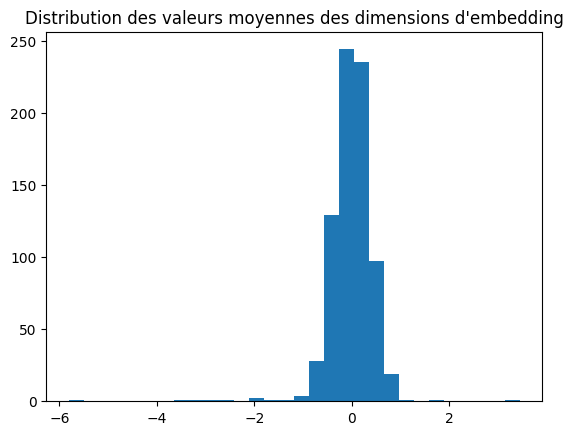

In [150]:
import matplotlib.pyplot as plt

plt.hist(np.mean(embeddings, axis=0), bins=30)
plt.title("Distribution des valeurs moyennes des dimensions d'embedding")
plt.show()


In [151]:
variances = np.var(embeddings, axis=0)
print(f"Variance moyenne : {np.mean(variances)}")
print(f"Dimensions avec faible variance : {np.sum(variances < 0.01)}")


Variance moyenne : 0.04566730931401253
Dimensions avec faible variance : 0


- Au vu des résultats ci-dessus **BERT** a réussi à capturer des **relations sémantiques et contextuelles** dans les descriptions des produits.

- Au vu des résultats des scores de similarité obeservés ci dessus BERT a réussi à identifier **les produits similaires** 

### 1.9 <span style="color:orange">Modèle avancé</span> NLP pour l'extraction des features textuelles <span style="color:orange">**[USE]**</span> - ML 2ème test

**Définition :**  
USE qui signifie Universal Sentence Encoder est un modèle pré-entraîné qui génère des vecteurs pour des phrases ou des paragraphes, capturant leur sens global.

**Exemple :**
```python
import tensorflow_hub as hub
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")
texte = ["Le chat dort", "Le chien court"]
vecteurs = embed(texte)
print(vecteurs)


Le modèle USE (Universal Sentence Encoder) est conçu pour transformer des phrases, des paragraphes ou même des documents entiers en vecteurs numériques. Ces vecteurs capturent le sens global de la phrase plutôt que des informations sur chaque mot individuellement.

Par exemple :

Si on passe les phrases "Le chat dort" et "Le félin se repose", leurs vecteurs seront proches car elles ont un sens similaire.
Si on passe les phrases "Le chat dort" et "La voiture roule", leurs vecteurs seront éloignés car elles parlent de sujets très différents.

Entrée :
USE prend en entrée une ou plusieurs phrases sous forme de texte brut.

Sortie :
Il génère un vecteur numérique (d'une certaine taille, par exemple 512 dimensions) pour chaque phrase. Ces vecteurs représentent le sens global de la phrase.

Usage pratique :

Comparer des phrases pour voir si elles ont un sens similaire.
Rechercher des phrases dans un corpus.
Analyser le contenu d'un texte pour des tâches comme l'analyse de sentiment, la classification, etc.


Universal Sentence Encoder : C'est un modèle d'encodage développé par Google qui transforme des phrases, des paragraphes ou des mots en vecteurs numériques de dimension fixe, permettant de capturer leur signification sémantique.

In [ ]:
# Vérification des colonnes
# les colonnes 'product_name_cleaned' et 'description_cleaned' existent
if 'product_name_cleaned' in dataset.columns and 'description_cleaned' in dataset.columns:
    # Créer une nouvelle colonne 'use_input_text' en concaténant les deux colonnes
    dataset['use_input_text'] = dataset['product_name_cleaned'] + " " + dataset['description_cleaned']
    
    # Remplir les éventuelles valeurs nulles par une chaîne vide pour éviter des erreurs
    dataset['use_input_text'] = dataset['use_input_text'].fillna("")
    
    print("La nouvelle colonne 'use_input_text' a été ajoutée avec succès !")
    print("\nExemple de texte concaténé :")
    print(dataset[['product_name_cleaned', 'description_cleaned', 'use_input_text']].head())
else:
    print("Les colonnes 'product_name_cleaned' et/ou 'description_cleaned' sont introuvables dans le dataset.")


La nouvelle colonne 'use_input_text' a été ajoutée avec succès !

Exemple de texte concaténé :
                                              product_name_cleaned  \
0       elegance polyester multicolor abstract eyelet door curtain   
1                                       sathiyas cotton bath towel   
2                              eurospa cotton terry face towel set   
3  santosh royal fashion cotton printed king sized double bedsheet   
4            jaipur print cotton floral king sized double bedsheet   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [ ]:
import tensorflow_hub as hub  # Importation de TensorFlow Hub pour utiliser des modèles pré-entraînés

# Chargement du modèle Universal Sentence Encoder (USE) depuis TensorFlow Hub
use_model = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Vérification que la colonne 'use_input_text' existe
if 'use_input_text' in dataset.columns:
    # Traitement par lots pour générer les embeddings
    batch_size = 32  # Taille du batch 
    texts = dataset['use_input_text'].tolist()  # Convertir la colonne en liste
    embeddings = []  # Liste pour stocker les embeddings

    # Génération des embeddings par lots
    for i in range(0, len(texts), batch_size):
        batch = texts[i:i + batch_size]  # Créer un batch de textes
        batch_embeddings = use_model(batch).numpy()  # Générer les embeddings pour le batch
        embeddings.extend(batch_embeddings)  # Ajouter les embeddings générés à la liste

    # Ajouter les embeddings au DataFrame
    dataset['use_embeddings'] = embeddings

    # Affichage des premières lignes pour vérifier les résultats
    print("\n### USE Output ###")
    print("Embedding shape:", embeddings[0].shape)  # Affiche la taille du premier vecteur d'embedding
    print(dataset[['use_input_text', 'use_embeddings']].head())  # Affiche les premières lignes
else:
    print("! La colonne 'use_input_text' est introuvable dans le dataset!")



### USE Output ###
Embedding shape: (512,)
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

- La sortie ci dessus nous indique que chaque phrase est représentée par un vecteur de 512 dimensions

In [154]:
# Vérification que la colonne 'use_embeddings' existe
if 'use_embeddings' in dataset.columns:
    # Afficher le vecteur d'embedding pour la première ligne
    print("\n### Embedding pour le premier produit ###")
    print(dataset['use_embeddings'].iloc[0])
else:
    print(" ! La colonne 'use_embeddings' est introuvable dans le dataset.")



### Embedding pour le premier produit ###
[-0.05553363 -0.0202974   0.0183648   0.04504982  0.02771578  0.05259652
 -0.05047501  0.05685065 -0.02416867 -0.00700221 -0.05446833 -0.0059261
  0.00967197 -0.05845942  0.04429244  0.05295591  0.0537544  -0.00035408
  0.05821435  0.04065271 -0.05208544 -0.05381791  0.01168141 -0.05029241
 -0.04564512 -0.03054387  0.05126258  0.05614097  0.05761012  0.05403437
  0.05865144  0.04367492 -0.00235263 -0.05195747  0.03142872 -0.02025365
  0.05239855  0.05856023 -0.04922131 -0.05611355 -0.04178018 -0.05240571
  0.05834764  0.00559804 -0.02301053 -0.05850175 -0.00945398  0.02614542
  0.05176357 -0.05260426 -0.04595919  0.05087718 -0.05847588 -0.04393509
 -0.02121994  0.04752471  0.04318605  0.05066777  0.03018797 -0.05791652
 -0.04955111 -0.05758086  0.03887245  0.04504197  0.05686143  0.00967935
  0.00645307  0.00378275  0.04739691  0.05672796 -0.01250364  0.05752327
  0.03221676  0.0575117   0.03809384  0.02046647 -0.00896104 -0.00646229
  0.05581

In [155]:
import numpy as np
embedding_array = np.vstack(dataset['use_embeddings'].to_numpy())
print("Shape des embeddings :", embedding_array.shape)
print("Moyenne globale :", np.mean(embedding_array))
print("Variance globale :", np.var(embedding_array))


Shape des embeddings : (1050, 512)
Moyenne globale : 0.0011477722
Variance globale : 0.0019518073


Les 512 dimensions pour le produit ligne 0 permettent de représenter des aspects sémantiques complexes de la phrase, comme :
- Les relations entre les mots.
- Le ton ou le style de la phrase.
- Les concepts sous-jacents.
- Les valeurs numériques ci-dessus correspondent à des caractéristiques abstraites qui représentent différents aspects du sens de la phrase dans un espace vectorien.
- Nous avons au total 512 chaines de chiffres qui représentent les 512 dimensions

In [156]:
# On affiche les colonnes du dataset
dataset.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications',
       'product_name_cleaned', 'product_len_txt', 'description_cleaned',
       'description_len_txt', 'category_niv_0', 'label_category',
       'product_name_tokenized', 'description_tokenized',
       'feature_product_name_description_tokenized',
       'feature_product_name_description_tokenized_no_stop_words',
       'removed_stop_words', 'feature_product_name_description_lemmatized',
       'feature_product_name_description_lemmatized_word_count',
       'word2vec_vectors', 'bert_input_text', 'bert_embeddings',
       'use_input_text', 'use_embeddings'],
      dtype='object')

## <span style="color:green">Étude de la Faisabilité - Classification</span> 

Tableau : Réduction de dimension du corpus

| **Variable**    | **Feature**                  | **Méthodes de réduction**     | **Definition**                                                                          | **Justification**                                                                                                       |
|------------------|------------------------------|--------------------------------|----------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------------------|
| **product_name** | **BoW**                     | PCA, Truncated SVD            | Réduction linéaire adaptée aux représentations sparse des mots.                        | BoW génère une matrice sparse, et PCA/SVD capturent les dimensions les plus importantes.                                |
| **product_name** | **Comptage simple de mots** | PCA, Truncated SVD            | Conservation des dimensions principales basées sur le comptage des mots.               | Une matrice simple issue du comptage peut bénéficier de PCA/SVD pour réduire les dimensions tout en capturant la variance. |
| **product_name** | **TF-IDF**                 | PCA, Truncated SVD, UMAP      | Réduction des dimensions en capturant la pertinence des mots dans le corpus.           | TF-IDF applique un poids sur les mots rares, et UMAP peut capturer des relations complexes dans un espace réduit.        |
| **product_name** | **Word2Vec**               | t-SNE, UMAP, Autoencoder      | Représentation vectorielle dense adaptée aux méthodes non linéaires pour capturer des relations complexes. | Les vecteurs Word2Vec conviennent aux méthodes non linéaires pour explorer des relations complexes entre les noms de produits. |
| **product_name** | **BERT**                   | t-SNE, UMAP, Autoencoder      | Représentation contextuelle des noms de produits pour une analyse fine et non linéaire. | Les embeddings riches de BERT sont idéaux pour des méthodes non linéaires comme t-SNE et UMAP pour des données contextuelles. |
| **product_name** | **USE**                    | t-SNE, UMAP, Autoencoder      | Représentation de phrases globales optimisée pour des tâches de réduction avancées.    | Les embeddings USE sont adaptés à des méthodes comme UMAP ou Autoencodeurs pour analyser efficacement des relations globales. |


## Definition des différentes méthodes de reduction de dimension en 2D

<span style="color:green">**Definition de l'Analyse en Composante Principale** (ACP)</span>

L'Analyse en Composantes Principales (ACP) est une méthode statistique utilisée pour réduire la dimensionnalité d’un jeu de données tout en conservant le maximum d’information. Elle permet de synthétiser les données en identifiant les axes principaux (composantes) qui expliquent la plus grande part de la variance.

- objectifs de l'ACP :
1. **Réduction de dimensionnalité** : Simplifier les données tout en minimisant la perte d'information.
2. **Visualisation** : Identifier des structures sous-jacentes ou des groupes dans les données.

- Concepts Clés :
- **Variance** : Représente la quantité d'information expliquée par chaque composante principale. Les premières composantes captent le maximum de variance.
- **Diagramme de dégradé (ou de "scree plot")** : Illustre la proportion de variance expliquée par chaque composante.
- **Cercle des corrélations** : Visualise les relations entre les variables originales et les nouvelles composantes.
- **Projection des individus** : Montre la position des individus dans le nouvel espace défini par les composantes principales, permettant d'identifier des groupes ou des tendances.

L’ACP est souvent utilisée pour interpréter des données complexes, explorer des relations entre variables, et identifier des patterns dans des jeux de données multidimensionnels.


Hyperparamètres de l'Analyse en Composantes Principales (ACP)

- **Nombre de composantes** :
  - Définit le nombre de composantes principales (axes) à conserver.
  - Permet de contrôler la réduction de dimensionnalité. Moins de composantes = plus de simplification mais aussi plus de perte d’information.

- **Type de normalisation des données** :
  - Indique si les données doivent être standardisées (centrées et réduites) avant de réaliser l'ACP.
  - Important pour les données avec des échelles variées afin d’assurer que chaque variable contribue équitablement.

- **Méthode de calcul de la décomposition** :
  - Définit l’algorithme utilisé pour la décomposition en valeurs propres (ex. `full`, `arpack` ou `randomized`).
  - Impacts sur la rapidité et la précision des résultats pour des jeux de données volumineux.

- **Tolérance (tol)** :
  - Détermine le seuil de convergence pour arrêter les calculs de la décomposition.
  - Une tolérance faible garantit une meilleure précision mais augmente le temps de calcul.

- **Variance expliquée cumulée (%)** :
  - Proportion de la variance totale conservée par les composantes principales sélectionnées.
  - Utilisé pour choisir un seuil (ex. 90% ou 95%) qui détermine le nombre de composantes nécessaires.

- **SVD Solver** :
  - Choisit le solveur pour effectuer la décomposition des valeurs singulières (ex. `auto`, `full`, `randomized`).
  - Optimise la vitesse et la gestion mémoire selon la taille des données.

- **Tolérance pour la stabilité numérique** :
  - Spécifie une limite pour éviter des instabilités dans les calculs de la matrice de covariance.
  - Essentiel pour les matrices très grandes ou mal conditionnées.

Chaque hyperparamètre influence la performance, la précision et la rapidité de l'ACP. Il est crucial de les ajuster en fonction de la taille des données et des objectifs de l’analyse.


<span style="color:green">**t-SNE (t-distributed Stochastic Neighbor Embedding)**</span>

Le **t-SNE** (t-distributed Stochastic Neighbor Embedding) est une technique d'apprentissage automatique utilisée pour **réduire la dimensionnalité** tout en préservant les relations locales dans les données. Contrairement à d'autres méthodes, t-SNE excelle pour visualiser des données complexes dans des espaces de faible dimension (souvent 2D ou 3D).

- Objectifs du t-SNE :
1. **Visualisation des données** : Représenter des données de haute dimension (comme des vecteurs ou des caractéristiques complexes) dans un espace 2D ou 3D.
2. **Identification des clusters** : Faciliter la détection des groupes naturels dans les données.

- Fonctionnement du t-SNE :
1. **Proximité en haute dimension** : Il convertit les distances entre les points dans un espace de haute dimension en probabilités, où les points proches ont une forte probabilité d'être voisins.
2. **Proximité en basse dimension** : Il projette les points dans un espace de faible dimension en préservant ces probabilités.
3. **Minimisation de la divergence** : Il minimise la divergence de Kullback-Leibler (KL) entre les distributions des distances en haute et basse dimensions.

- Avantages :
- Préserve les structures locales (proximité entre les points similaires).
- Adapté à la visualisation de jeux de données non linéaires ou complexes.

- Limites :
- Non déterministe : Les résultats peuvent varier d’une exécution à l’autre.
- Difficulté avec de très grands jeux de données : Peut être coûteux en termes de calcul.
- Interprétation relative : L’échelle des axes n’a pas de signification.

- Applications typiques :
- Analyse et visualisation des données issues de modèles d’apprentissage automatique.
- Clustering non supervisé.
- Identification de patterns dans des données haute dimension (ex. génomique, vision par ordinateur, traitement du langage naturel).

Le t-SNE est souvent utilisé conjointement avec d'autres outils comme le PCA pour préparer les données ou initialiser la réduction de dimensionnalité.

 Hyperparamètres de t-SNE

- **n_components** : Nombre de dimensions dans lesquelles projeter les données (généralement 2 ou 3).
- **perplexity** : Contrôle l'équilibre entre les relations locales et globales (valeurs typiques : 5 à 50).
- **learning_rate** : Taux d'apprentissage pour optimiser l'algorithme (valeurs recommandées : 10 à 1000).
- **n_iter** : Nombre d'itérations pour la convergence (généralement ≥ 250).
- **metric** : Mesure de distance utilisée (par défaut : euclidienne, peut être manhattan, cosine, etc.).
- **early_exaggeration** : Accentue les distances locales au début pour faciliter la structure globale.
- **random_state** : Initialise le générateur aléatoire pour des résultats reproductibles.
- **n_iter_without_progress** : Nombre d'itérations avant d'arrêter si aucune amélioration n’est constatée.
- **init** : Méthode d'initialisation des points (par défaut : PCA ou random).

Ces hyperparamètres influencent la qualité et la stabilité des projections de t-SNE.



<span style="color:green">**Truncated SVD (Singular Value Decomposition)**</span>

Le **Truncated Singular Value Decomposition (Truncated SVD)** est une technique de réduction de dimensionnalité qui repose sur la décomposition en valeurs singulières d’une matrice. Contrairement à l’ACP, elle peut être utilisée directement sur des matrices creuses (sparse), ce qui la rend particulièrement adaptée aux données issues du **traitement du langage naturel (NLP)** et de la **factorisation de matrices**.

Objectifs :
1. **Réduction de dimensionnalité** : Réduire le nombre de dimensions tout en préservant les structures principales des données.
2. **Compression des données** : Faciliter le traitement et l'analyse des grands ensembles de données.
3. **Découverte de relations latentes** : Identifier les facteurs sous-jacents dans les données.

Fonctionnement :
1. **Décomposition** : La matrice originale est factorisée en trois matrices :
   \[
   A \approx U_k \Sigma_k V_k^T
   \]
   - \( U_k \) : Contient les vecteurs singuliers associés aux \( k \) dimensions.
   - \( \Sigma_k \) : Matrice diagonale avec les \( k \) plus grandes valeurs singulières.
   - \( V_k^T \) : Contient les vecteurs singuliers associés aux colonnes.

2. **Troncature** : Seules les \( k \) plus grandes valeurs singulières sont conservées pour réduire la dimension tout en préservant l’essentiel de l’information.

Avantages :
- Efficace sur des matrices creuses et de grande taille.
- Préserve les structures linéaires dans les données.
- Utilisé pour des cas spécifiques comme le **Latent Semantic Analysis (LSA)** en NLP.

Limites :
- Ne gère pas bien les relations non linéaires dans les données.
- La réduction peut entraîner une perte d'information.

Applications typiques :
- **Latent Semantic Analysis (LSA)** : Découverte des relations sémantiques entre les termes et documents dans le NLP.
- **Recommandation** : Systèmes de recommandation utilisant la factorisation de matrices.
- **Compression des données** : Réduction de la taille des ensembles de données tout en préservant leur structure.

Le Truncated SVD est une méthode rapide et pratique pour simplifier des jeux de données volumineux tout en restant fidèle à leur structure globale.
- n_components : Nombre de composantes principales à conserver.
- algorithm : Algorithme utilisé pour le calcul, peut être 'randomized' (par défaut) ou 'arpack'.
- n_iter : Nombre d'itérations pour le solveur 'randomized' (par défaut : 5).
- random_state : Définir un état aléatoire pour des résultats reproductibles.
- tol : Tolérance pour arrêter les calculs dans le cas de l'algorithme 'arpack'.



<span style="color:green">**UMAP (Uniform Manifold Approximation and Projection)**</span>

**UMAP** est une technique de réduction de dimensionnalité qui permet de projeter des données complexes dans un espace de dimension réduite tout en préservant autant que possible les structures locales et globales. Il est largement utilisé pour la **visualisation de données** et l'identification de structures latentes dans des ensembles de données multidimensionnels.

Objectifs :
1. **Réduction de dimensionnalité** : Transformer les données en haute dimension en un espace de faible dimension (2D ou 3D) tout en conservant les relations structurelles.
2. **Découverte des clusters** : Identifier les groupes naturels dans les données.
3. **Visualisation intuitive** : Fournir une représentation claire des données complexes.

Fonctionnement :
1. **Graphique local des voisinages** : UMAP construit un graphe des voisins les plus proches de chaque point en haute dimension.
2. **Optimisation globale** : Le graphe est projeté dans un espace de faible dimension en minimisant une mesure de divergence entre les structures des deux espaces.
3. **Préservation des structures** :
   - Structures **locales** : Les relations proches entre les points sont bien conservées.
   - Structures **globales** : La disposition générale des clusters est également préservée.

Avantages :
- Rapide et efficace sur des ensembles de données volumineux.
- Préserve à la fois les relations locales et globales des données.
- Offre des résultats plus stables et intuitifs que d'autres méthodes comme t-SNE.

Limites :
- Peut être sensible aux hyperparamètres (comme le nombre de voisins `n_neighbors` et la distance minimale `min_dist`).
- Représentation difficilement interprétable pour des applications qui nécessitent des métriques précises.

Applications typiques :
- **Visualisation** : Représentation des données complexes en 2D/3D.
- **Clustering** : Exploration de structures naturelles dans les données (ex. génomique, vision par ordinateur).
- **NLP et embeddings** : Analyse et visualisation d’embeddings de mots ou de phrases.
- **Pré-traitement pour apprentissage automatique** : Réduction de dimensionnalité avant un modèle d'apprentissage supervisé.

Paramètres principaux :
1. **`n_neighbors`** : Contrôle l'équilibre entre la préservation des structures locales et globales.
2. **`min_dist`** : Définit la densité des points projetés dans l'espace réduit (valeurs basses : clusters denses, valeurs hautes : plus dispersé).

UMAP est une méthode puissante et polyvalente, adaptée à la fois à l'exploration des données et à leur réduction dimensionnelle pour des analyses plus approfondies.

- Les hyperparamètres principaux de UMAP (Uniform Manifold Approximation and Projection) :

- n_neighbors : Contrôle l'équilibre entre la préservation des structures locales et globales (valeurs typiques : 5 à 50).
- n_components : Nombre de dimensions dans lesquelles projeter les données (généralement 2 ou 3).
- metric : Mesure de distance utilisée pour calculer les voisinages (ex. euclidean, manhattan, cosine).
- min_dist : Définit la densité des points dans l'espace réduit (valeurs basses = clusters denses, valeurs élevées = dispersion).
- spread : Contrôle l'étalement global des points après réduction.
- learning_rate : Taux d’apprentissage de l’optimisation (valeur par défaut : 1.0).
- init : Méthode d'initialisation (ex. spectral, random).
- random_state : Fixe une graine aléatoire pour des résultats reproductibles.


<span style="color:green">**Autoencoder**</span>

Un **autoencoder** est un type de réseau de neurones non supervisé conçu pour apprendre une représentation comprimée (ou encodée) des données, souvent utilisée pour la réduction de dimensionnalité, la détection d'anomalies ou la génération de nouvelles données similaires.

Structure d'un Autoencoder :
Un autoencoder est composé de deux parties principales :

1. **Encodeur** :
   - Compresse les données d'entrée dans une représentation de plus faible dimension (appelée **bottleneck**).
   - Apprend les caractéristiques importantes des données.

2. **Décodeur** :
   - Reconstruit les données originales à partir de la représentation comprimée.
   - Cherche à minimiser la différence entre l'entrée originale et la sortie reconstruite.

\[
\text{Input} \rightarrow \text{Encodeur} \rightarrow \text{Bottleneck} \rightarrow \text{Décodeur} \rightarrow \text{Reconstruction}
\]

Fonctionnement :
1. **Phase d'apprentissage** : L'autoencoder est entraîné pour que la sortie reconstruite soit aussi proche que possible de l'entrée initiale.
2. **Fonction de perte** : Souvent basée sur l'erreur quadratique moyenne (MSE) ou une autre mesure de similarité entre l'entrée et la reconstruction.

Variantes d'Autoencoders :
- **Denoising Autoencoder** : Apprend à reconstruire les données à partir d'une version bruitée, utilisé pour le nettoyage des données.
- **Sparse Autoencoder** : Encourage une représentation clairsemée (peu d'unités actives) dans le bottleneck.
- **Variational Autoencoder (VAE)** : Génère des données nouvelles en apprenant une distribution probabiliste latente.
- **Convolutional Autoencoder** : Adapté aux données image grâce à l'utilisation de couches convolutionnelles.

Applications :
1. **Réduction de dimensionnalité** : Alternative non linéaire à l'ACP pour des données complexes.
2. **Détection d'anomalies** : Les reconstructions dégradées signalent des anomalies (ex. détection de fraudes, défauts industriels).
3. **Nettoyage des données** : Supprime le bruit des images ou des signaux.
4. **Compression de données** : Compresse efficacement les données pour le stockage ou la transmission.
5. **Génération de données** : Utilisé dans les architectures comme les VAEs pour générer des données synthétiques.

Avantages :
- Capable de modéliser des relations **non linéaires** complexes dans les données.
- Flexible grâce à différentes architectures (ex. convolutionnelles ou récurrentes).
- Peut être adapté à diverses formes de données : images, texte, séries temporelles, etc.

Limites :
- Nécessite un entraînement intensif et un grand volume de données.
- Plus complexe à interpréter par rapport à des méthodes linéaires comme l'ACP.
- La qualité des reconstructions peut être sensible aux choix de l'architecture et des hyperparamètres.

Un autoencoder est une puissante technique pour extraire des représentations compactes et significatives des données, ouvrant la voie à une meilleure compréhension ou à des traitements efficaces des données complexes.


Voici les principaux hyperparamètres d’un Autoencoder :

- **latent_dim** : Taille de la couche de goulot d’étranglement (bottleneck), détermine le niveau de compression des données.
- **encoder_layers** : Nombre et taille **des couches** dans **l’encodeur**.
- **decoder_layers** : Nombre et taille des couches dans le **décodeur**.
- **activation** : Fonction d'activation utilisée (ex. ReLU, Sigmoid, Tanh).
- **loss** : Fonction de **perte** pour mesurer l’erreur de reconstruction (ex. MSE, MAE, Binary Crossentropy).
- **optimizer** : Algorithme d’optimisation pour ajuster les poids (ex. Adam, SGD).
- **batch_size** : Nombre d’échantillons traités avant mise à jour des poids.
- **epochs** : Nombre d’itérations complètes sur l’ensemble des données.
- **learning_rate** : Taux d’apprentissage pour l’optimisation des poids.
- **dropout** : Taux de régularisation pour éviter le surapprentissage.
- **beta** (pour Variational Autoencoder - VAE) : Coefficient de pondération du terme KL-divergence dans la perte.


## Faisabilité | Bag of Words : <span style="color:skyblue">"BOW"</span> 

##### <span style="color:green">[ACP] - Analyse en Composante Principale Technique [ 1n gram ]</span>

La matrice train_df_em_1gram est déjà une matrice dense.
Forme de la matrice train_df_em_1gram : (1050, 3532)
Forme de la catégorie : (1050,)

--- Avant normalisation ---
Moyenne des 5 premières colonnes : [0.00285714 0.00285714 0.00285714 0.00285714 0.00285714]
Écart-type des 5 premières colonnes : [0.09253791 0.09253791 0.09253791 0.09253791 0.09253791]

--- Après normalisation ---
Moyenne des 5 premières colonnes après normalisation : [4.23669036e-17 6.07979275e-17 6.92567696e-17 7.09551465e-17
 2.88724071e-17]
Écart-type des 5 premières colonnes après normalisation : [1. 1. 1. 1. 1.]

Variance expliquée par chaque composante :
 [0.01545746 0.01237615 0.01182909 0.01142527 0.01075526]

Projection des données dans l'espace des composantes principales (échantillon) 1-ngram :
 [[ 0.60935875  4.69559404 -0.05531373  0.50714576  0.43549748]
 [-1.02469426 -0.51493138  0.12274425  0.41699524 -0.97621131]
 [ 1.82051285  2.34276297  1.34516871  3.33057531 -0.93730213]
 [-0.66166479  0.663437

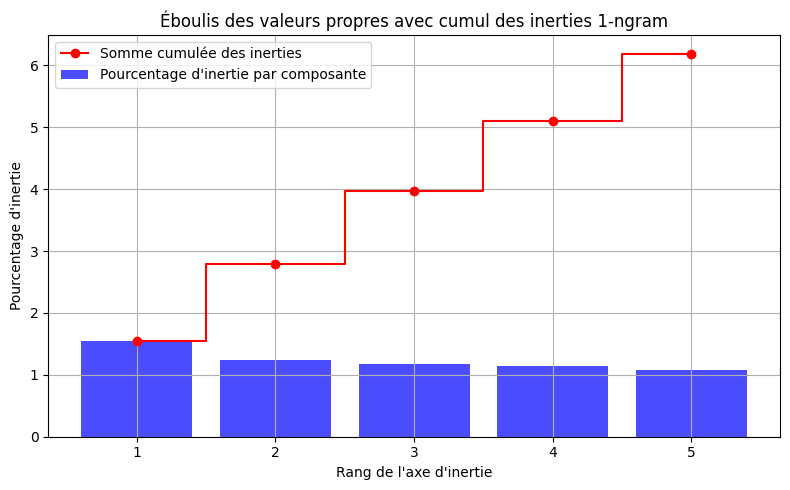

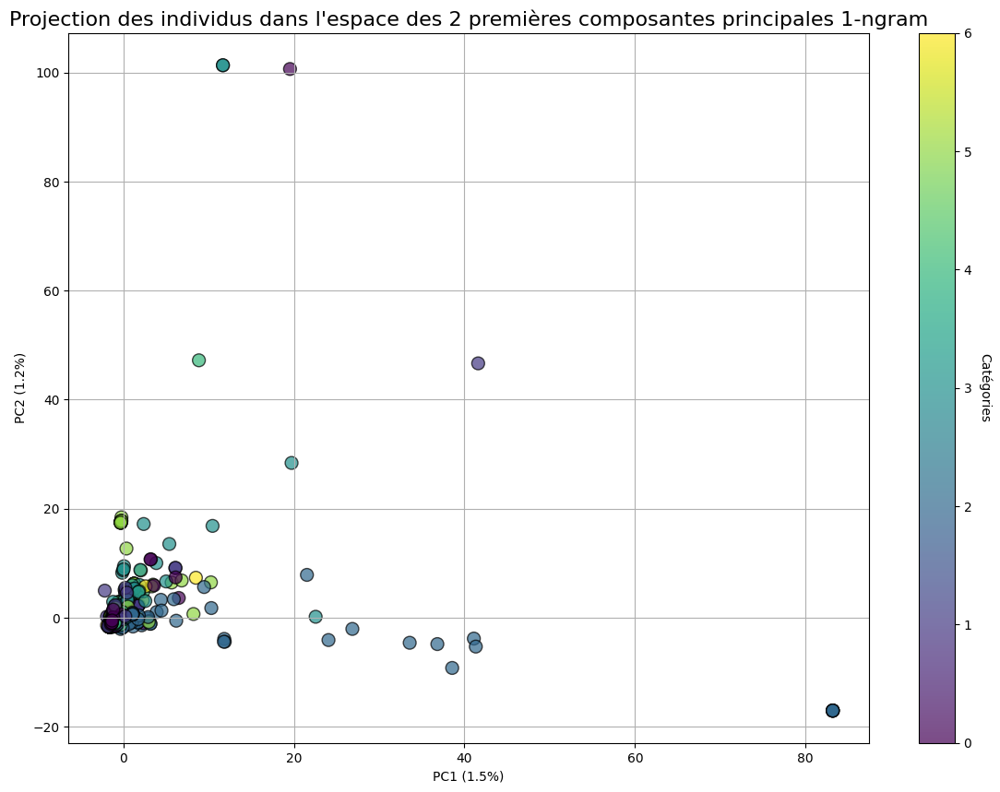

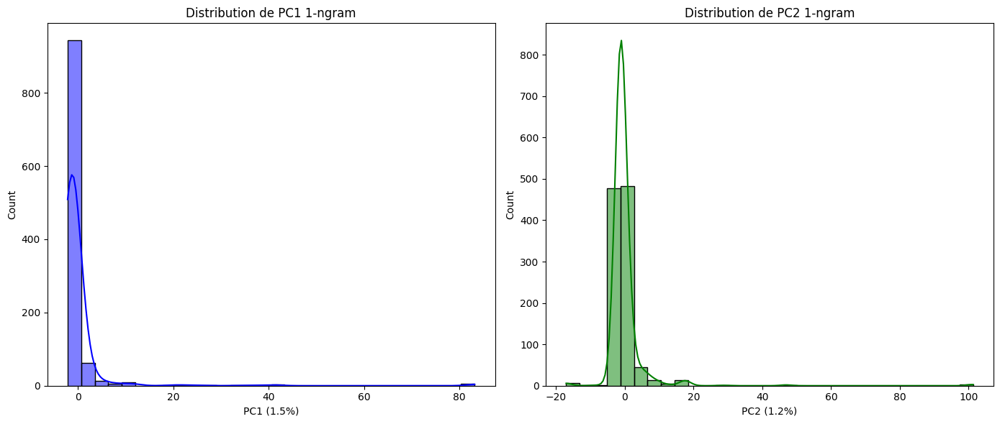

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse

# Vérification si la matrice est dense
if scipy.sparse.issparse(train_df_em_1gram):
    print(" La matrice train_df_em_1gram est une matrice creuse (sparse).")
    print("Conversion en matrice dense...")
    train_df_em_1gram = train_df_em_1gram.toarray()
    print("Conversion terminée : train_df_em_1gram est maintenant une matrice dense.")
else:
    print("La matrice train_df_em_1gram est déjà une matrice dense.")

# Charger la matrice train_df_em_1gram
X = train_df_em_1gram  # Matrice des caractéristiques (Bag-of-Words - 1gram)
y = dataset['label_category'].values  # Labels cibles

# Vérifier la forme de la matrice et des labels
print("Forme de la matrice train_df_em_1gram :", X.shape)
print("Forme de la catégorie :", y.shape)

# Normalisation des données
scaler = StandardScaler()

# Vérification des moyennes et écarts-types avant normalisation
print("\n--- Avant normalisation ---")
print("Moyenne des 5 premières colonnes :", X.mean(axis=0)[:5])
print("Écart-type des 5 premières colonnes :", X.std(axis=0)[:5])

X_normalized = scaler.fit_transform(X)

# Vérification des moyennes et écarts-types après normalisation
print("\nAprès normalisation ")
print("Moyenne des 5 premières colonnes après normalisation :", X_normalized.mean(axis=0)[:5])
print("Écart-type des 5 premières colonnes après normalisation :", X_normalized.std(axis=0)[:5])

# Appliquer l'ACP
pca_2d = PCA(n_components=5)  # Nombre de composantes principales
X1_pca_2d = pca_2d.fit_transform(X_normalized)

# Affichage des résultats
print("\nVariance expliquée par chaque composante :\n", pca_2d.explained_variance_ratio_)
print("\nProjection des données dans l'espace des composantes principales (échantillon) 1-ngram :\n", X1_pca_2d[:5])

# Éboulis des valeurs propres (scree plot)
variance_expliquee = pca_2d.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties 1-ngram")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Projection des individus 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    X1_pca_2d[:, 0], 
    X1_pca_2d[:, 1], 
    c=pd.Categorical(y).codes,  # Transformation des catégories en codes numériques
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Projection des individus dans l\'espace des 2 premières composantes principales 1-ngram', fontsize=16)
plt.grid(True)
plt.show()

# Distribution des composantes principales
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(X1_pca_2d[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.title('Distribution de PC1 1-ngram')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(X1_pca_2d[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Distribution de PC2 1-ngram')
    
plt.tight_layout()
plt.show()


**-- Commentaires: Le résultat sur l'ACP appliqué sur la matrice 1n gram est peu prometteur --**
1. La réduction de dimensionnalité conserve peu de variance ( pour la compsante principale #1)
2. La projection des données dans l’espace des deux premières composantes principales révèle un chevauchement important entre les catégories.

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.0007


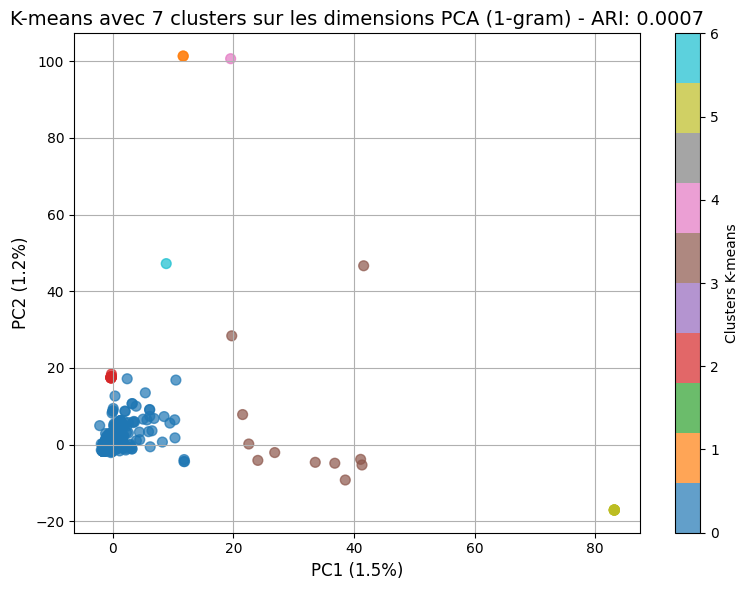

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means 
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,         # 7 clusters correspondant aux catégories
    random_state=42,      # Reproductibilité
    n_init=20,            # Nombre d'initialisations pour une meilleure stabilité
    max_iter=500,         # Nombre maximal d'itérations pour convergence
    tol=1e-4              # Tolérance pour convergence
)

# Appliquer K-means sur les données réduites par PCA
kmeans_labels = kmeans.fit_predict(X1_pca_2d)

# Calcul de l'ARI 
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(y, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(8, 6))

# Affichage des points PCA colorés selon les clusters prédits
scatter = plt.scatter(
    X1_pca_2d[:, 0],  # Première composante PCA
    X1_pca_2d[:, 1],  # Deuxième composante PCA
    c=kmeans_labels,  # Couleurs des points selon les clusters prédits
    cmap='tab10',     # Palette de couleurs
    alpha=0.7,        # Transparence des points
    s=50              # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique avec le score ARI
plt.title(f"K-means avec 7 clusters sur les dimensions PCA (1-gram) - ARI: {ari_score:.4f}", fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)', fontsize=12)
plt.ylabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)', fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()


##### <span style="color:red">[ACP] - Analyse en Composante Principale Technique [ 2n gram ]</span>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse

# Vérification si la matrice est dense
if scipy.sparse.issparse(train_df_em_2gram):
    print("! La matrice train_df_em_2gram est une matrice creuse (sparse).")
    print("Conversion en matrice dense...")
    train_df_em_2gram = train_df_em_2gram.toarray()
    print("Conversion terminée : train_df_em_2gram est maintenant une matrice dense.")
else:
    print("La matrice train_df_em_2gram est déjà une matrice dense.")

# Charger la matrice train_df_em_2gram
X = train_df_em_2gram  # Matrice des caractéristiques (Bag-of-Words - 2gram)
y = dataset['label_category'].values  # Labels cibles

# Vérifier la forme de la matrice et des labels
print("Forme de la matrice train_df_em_2gram :", X.shape)
print("Forme de la catégorie :", y.shape)

# Normalisation des données
scaler = StandardScaler()

# Vérification des moyennes et écarts-types avant normalisation
print("\nAvant normalisation")
print("Moyenne des 5 premières colonnes :", X.mean(axis=0)[:5])
print("Écart-type des 5 premières colonnes :", X.std(axis=0)[:5])

X_normalized = scaler.fit_transform(X)

# Vérification des moyennes et écarts-types après normalisation
print("\nAprès normalisation")
print("Moyenne des 5 premières colonnes après normalisation :", X_normalized.mean(axis=0)[:5])
print("Écart-type des 5 premières colonnes après normalisation :", X_normalized.std(axis=0)[:5])

# Appliquer l'ACP
pca_2d = PCA(n_components=5)  # Nombre de composantes principales
X2_pca_2d = pca_2d.fit_transform(X_normalized)

# Affichage des résultats
print("\nVariance expliquée par chaque composante :\n", pca_2d.explained_variance_ratio_)
print("\nProject des données dans l'espace des composantes principales 2-ngram:\n", X2_pca_2d[:5])

# Éboulis des valeurs propres (scree plot)
variance_expliquee = pca_2d.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties 2-ngram")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Projection des individus 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    X2_pca_2d[:, 0], 
    X2_pca_2d[:, 1], 
    c=pd.Categorical(y).codes,  # Transformation des catégories en codes numériques
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Projection des individus dans l\'espace des 2 premières composantes principales 2-ngram', fontsize=16)
plt.grid(True)
plt.show()

# Distribution des composantes principales
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(X2_pca_2d[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.title('Distribution de PC1 2-ngram')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(X2_pca_2d[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Distribution de PC2 2-ngram')

plt.tight_layout()
plt.show()


L'ACP sur train_df_em_2gram montre que la variance expliquée par les composantes principales est limitée (1.4% pour PC1).
La projection des données révèle un fort chevauchement entre les catégories de label_category, rendant difficile une prédiction efficace avec un modèle basé uniquement sur Bag-of-Words 2-gram.

##### <span style="color:red">[ACP] - Analyse en Composante Principale Technique [ 3n gram ]</span>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.sparse

# Vérification si la matrice est dense
if scipy.sparse.issparse(train_df_em_3gram):
    print(" La matrice train_df_em_3gram est une matrice creuse (sparse).")
    print("Conversion en matrice dense...")
    train_df_em_3gram = train_df_em_3gram.toarray()
    print("Conversion terminée : train_df_em_3gram est maintenant une matrice dense.")
else:
    print("La matrice train_df_em_3gram est déjà une matrice dense.")

# Charger la matrice train_df_em_3gram
X = train_df_em_3gram  # Matrice des caractéristiques (Bag-of-Words - 3gram)
y = dataset['label_category'].values  # Labels cibles

# Vérifier la forme de la matrice et des labels
print("Forme de la matrice train_df_em_3gram :", X.shape)
print("Forme de la catégorie :", y.shape)

# Normalisation des données
scaler = StandardScaler()

# Vérification des moyennes et écarts-types avant normalisation
print("\nAvant normalisation")
print("Moyenne des 5 premières colonnes :", X.mean(axis=0)[:5])
print("Écart-type des 5 premières colonnes :", X.std(axis=0)[:5])

X_normalized = scaler.fit_transform(X)

# Vérification des moyennes et écarts-types après normalisation
print("\nAprès normalisation")
print("Moyenne des 5 premières colonnes après normalisation :", X_normalized.mean(axis=0)[:5])
print("Écart-type des 5 premières colonnes après normalisation :", X_normalized.std(axis=0)[:5])

# Appliquer l'ACP
pca_2d = PCA(n_components=5)  # Nombre de composantes principales
X3_pca_2d = pca_2d.fit_transform(X_normalized)

# Affichage des résultats
print("\nVariance expliquée par chaque composante :\n", pca_2d.explained_variance_ratio_)
print("\nProjec des données dans l'espace des composantes principales (échantillon) 3-ngram :\n", X3_pca_2d[:5])

# Éboulis des valeurs propres (scree plot)
variance_expliquee = pca_2d.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties 3-ngram")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Projection des individus
scatter = plt.scatter(
    X3_pca_2d[:, 0], 
    X3_pca_2d[:, 1], 
    c=pd.Categorical(y).codes,  # Transformation des catégories en codes numériques
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Projection des individus dans l\'espace des 2 premières composantes principales 3-ngram', fontsize=16)
plt.grid(True)
plt.show()

# Distribution des composantes principales
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(X3_pca_2d[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.title('Distribution de PC1 3-ngram')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(X3_pca_2d[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Distribution de PC2 3-ngram')

plt.tight_layout()
plt.show()


- L'ACP sur train_df_em_3gram montre que les composantes principales expliquent une faible proportion de variance (1.3% pour PC1).
- La projection des données dans l’espace des deux premières composantes principales met en évidence un chevauchement important entre les catégories, rendant difficile leur séparation.
- L'utilisation du Bag-of-Words avec 3-gram ne semble pas fournir une structure suffisamment discriminante pour prédire label_category

##### <span style="color:red">[ACP] - Analyse en Composante Principale Technique [ 1-2-3-gram ]</span>

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.sparse import hstack, csr_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# les matrices sont au format sparse
train_df_em_1gram = csr_matrix(train_df_em_1gram)
train_df_em_2gram = csr_matrix(train_df_em_2gram)
train_df_em_3gram = csr_matrix(train_df_em_3gram)

# Combiner les matrices 1-gram, 2-gram et 3-gram
X_combined = hstack([train_df_em_1gram, train_df_em_2gram, train_df_em_3gram]).toarray()  # Ajout de la conversion en dense
y = dataset['label_category'].values  # Labels cibles

# Vérifier la forme de la matrice combinée et des labels
print("Forme de la matrice combinée :", X_combined.shape)
print("Forme de la catégorie :", y.shape)

# Normalisation des données
scaler = StandardScaler()  
X_normalized = scaler.fit_transform(X_combined)

# Appliquer l'ACP
pca_2d = PCA(n_components=8)  # Nombre de composantes principales
X4_pca_2d = pca_2d.fit_transform(X_normalized)  

# Affichage des résultats
print("\nVariance expliquée par chaque composante :\n", pca_2d.explained_variance_ratio_)
print("\nProjection des données dans l'espace des composantes principales (échantillon) :\n", X4_pca_2d[:5])

# Éboulis des valeurs propres (scree plot)
variance_expliquee = pca_2d.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties 1-2-3-ngram ")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Projection des individus
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    X4_pca_2d[:, 0], 
    X4_pca_2d[:, 1], 
    c=pd.Categorical(y).codes,  # Transformation des catégories en codes numériques
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Project des individus des 2 premières composantes principales (1-2-3-ngram)', fontsize=16)
plt.grid(True)
plt.show()

# Distribution des composantes principales 
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(X4_pca_2d[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca_2d.explained_variance_ratio_[0], 1)}%)')
plt.title('Distribution de PC1 (1-2-3-gram)')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(X4_pca_2d[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca_2d.explained_variance_ratio_[1], 1)}%)')
plt.title('Distribution de PC2 (1-2-3-ngram)')

plt.tight_layout()
plt.show()


- L'ACP sur les données combinées 1-gram, 2-gram, et 3-gram montre une faible proportion de variance expliquée (1.3% pour PC1 et environ 6% pour les 8 premières composantes principales).
- La projection des individus dans l’espace des deux premières composantes principales met en évidence un fort chevauchement des catégories, indiquant que cette représentation ne permet pas une différenciation efficace des classes.
- Bien que la combinaison des représentations puisse sembler prometteuse d'autres approches de feature extraction pourrait améliorer la parité entre les catégorie et leurs description textuelles

##### <span style="color:red">t-SNE (t-distributed Stochastic Neighbor Embedding)</span>

- On applique t-SNE sur la la matrice BOW intitulée **"train_df_em_1gram"**
- Elle a la meilleure variance expliquée ( pour PC1). parmis les autres matrices BoW
- Elle est plus compacte (3,556 dimensions), ce qui est plus pratique pour t-SNE.
- Les résultats de visualisation sont comparables à ceux des modèles plus complexes.

C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


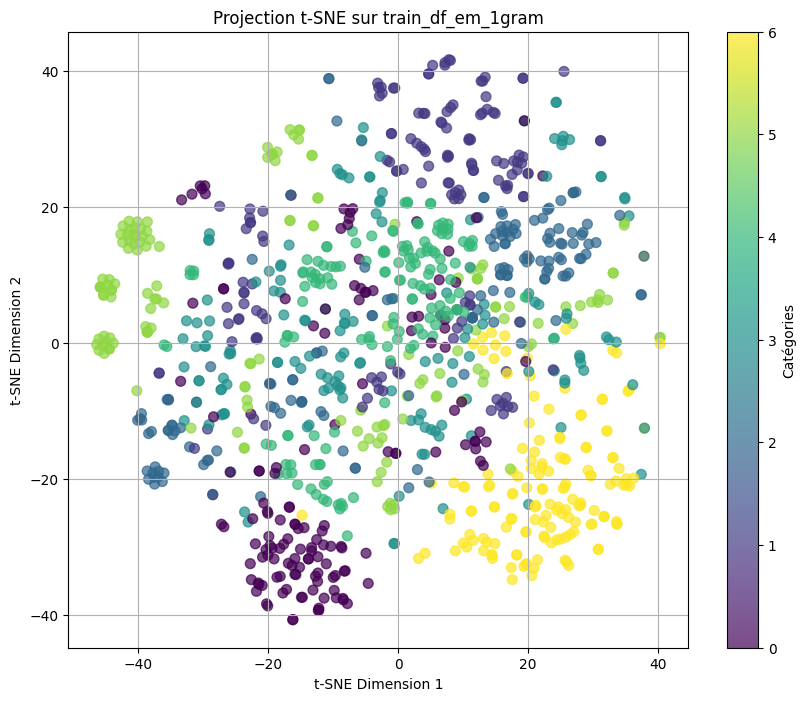

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import scipy.sparse

# Vérification du format des données
if scipy.sparse.issparse(train_df_em_1gram):
    train_df_em_1gram = train_df_em_1gram.toarray()

# Standardisation des données
scaler = StandardScaler()
bow_scaled = scaler.fit_transform(train_df_em_1gram)

# Appliquer le t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=45, n_iter=1000, metric='cosine')
bow_tsne = tsne.fit_transform(bow_scaled)

# Visualisation
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    bow_tsne[:, 0],
    bow_tsne[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    alpha=0.7,
    s=50
)
plt.colorbar(label='Catégories')
plt.title("Projection t-SNE sur train_df_em_1gram")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(True)
plt.show()


- La visualisation montre que t-SNE a réussi à révéler des structures intéressantes dans les données, mais certaines catégories sont encore mélangées. 
Cela peut indiquer une difficulté à distinguer les classes dans cet espace. 

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2446


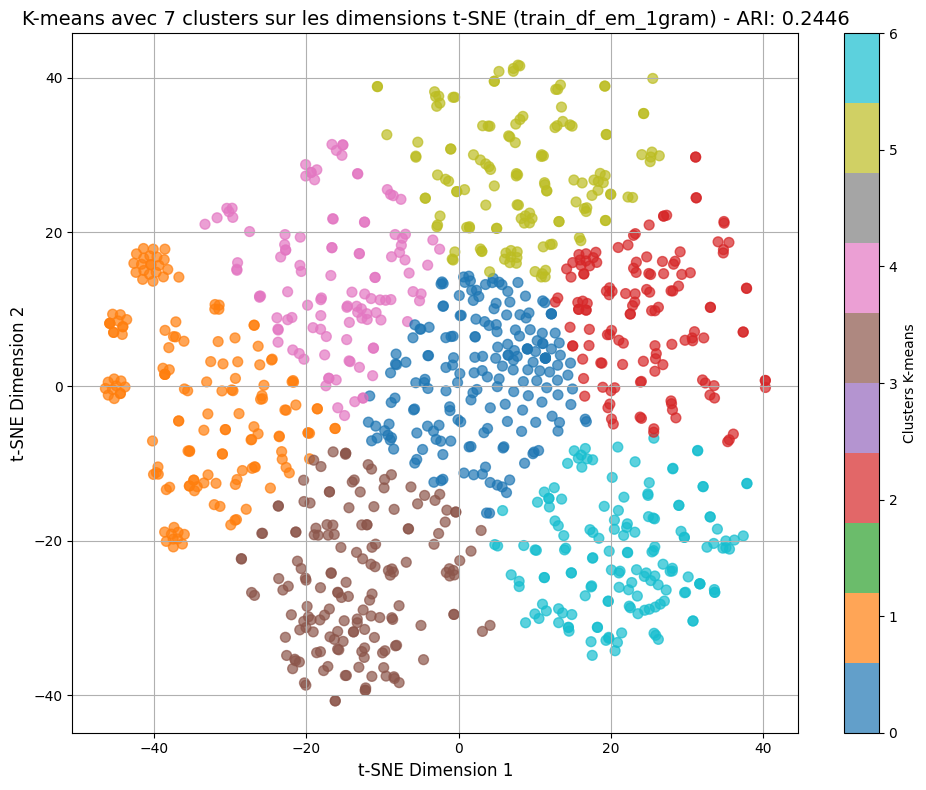

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,         # 7 clusters correspondant aux catégories
    random_state=42,      # Reproductibilité
    n_init=20,            # Nombre d'initialisations pour une meilleure optimisation
    max_iter=500,         # Augmentation du nombre d'itérations
    tol=1e-4              # Tolérance pour l'arrêt des itérations
)

# Appliquer K-means sur les données t-SNE
kmeans_labels = kmeans.fit_predict(bow_tsne)

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(10, 8))

# Affichage des points t-SNE colorés selon les clusters prédits
scatter = plt.scatter(
    bow_tsne[:, 0],  # Première dimension t-SNE
    bow_tsne[:, 1],  # Deuxième dimension t-SNE
    c=kmeans_labels,  # Couleurs des points selon les clusters prédits
    cmap='tab10',     # Palette de couleurs
    alpha=0.7,        # Transparence des points
    s=50              # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique avec le score ARI
plt.title(f"K-means avec 7 clusters sur les dimensions t-SNE (train_df_em_1gram) - ARI: {ari_score:.4f}", fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel("t-SNE Dimension 1", fontsize=12)
plt.ylabel("t-SNE Dimension 2", fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()

##### <span style="color:red">Truncated SVD (Singular Value Decomposition)</span>

Truncated Singular Value Decomposition (SVD) est une méthode de réduction de dimension qui factorise une matrice en réduisant le nombre de dimensions tout en préservant les caractéristiques les plus importantes des données. Contrairement à PCA, elle peut être appliquée directement à des matrices creuses (matrices avec beaucoup de zéros), ce qui la rend particulièrement utile pour les données textuelles ou les systèmes de recommandation.

- Mesure de la similarité entre les catégories réelles et les clusters

- train_df_em_1gram
- train_df_em_2gram
- train_df_em_3gram

 ! La matrice train_df_em_1gram est déjà une matrice dense.
Variance expliquée par chaque composante : [0.05363182 0.04050595]
Variance cumulée : [0.05363182 0.09413777]


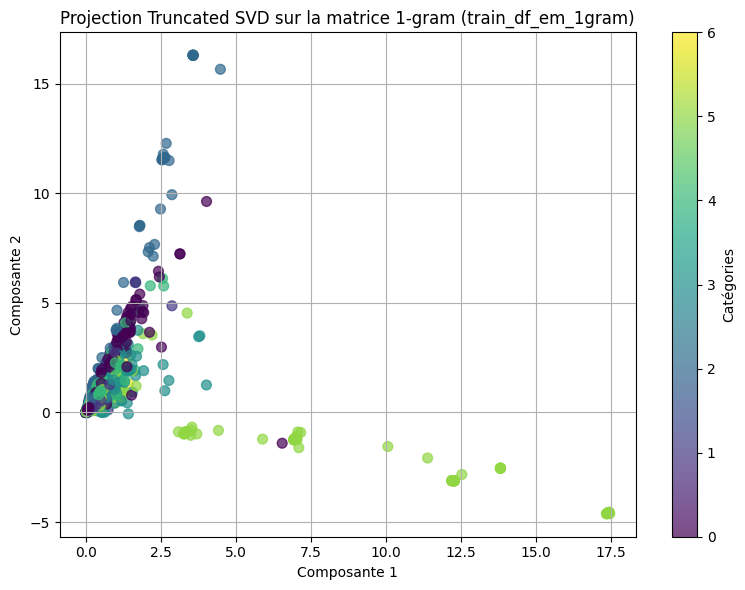

In [ ]:
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt
import scipy.sparse

# Vérification si la matrice est dense ou creuse
if scipy.sparse.issparse(train_df_em_1gram):
    print(" ! La matrice train_df_em_1gram est une matrice creuse (sparse).")
else:
    print(" ! La matrice train_df_em_1gram est déjà une matrice dense.")

# Réduction avec Truncated SVD
svd = TruncatedSVD(n_components=2, random_state=42)  # 2 composantes pour visualisation
X_svd = svd.fit_transform(train_df_em_1gram)

# Variance expliquée
print("Variance expliquée par chaque composante :", svd.explained_variance_ratio_)
print("Variance cumulée :", svd.explained_variance_ratio_.cumsum())

# Visualisation des résultats
plt.figure(figsize=(8, 6))
plt.scatter(
    X_svd[:, 0], 
    X_svd[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.7, 
    s=50
)
plt.colorbar(label="Catégories")
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
plt.title("Projection Truncated SVD sur la matrice 1-gram (train_df_em_1gram)")
plt.grid(True)
plt.tight_layout()
plt.show()


La projection via Truncated SVD sur la matrice 1-gram révèle une séparation partielle des catégories, bien que les données restent largement imbriquées. Les deux premières composantes capturent une faible variance globale, ce qui peut indiquer que les données originales contiennent une complexité élevée nécessitant davantage de dimensions pour une représentation fidèle

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.0446


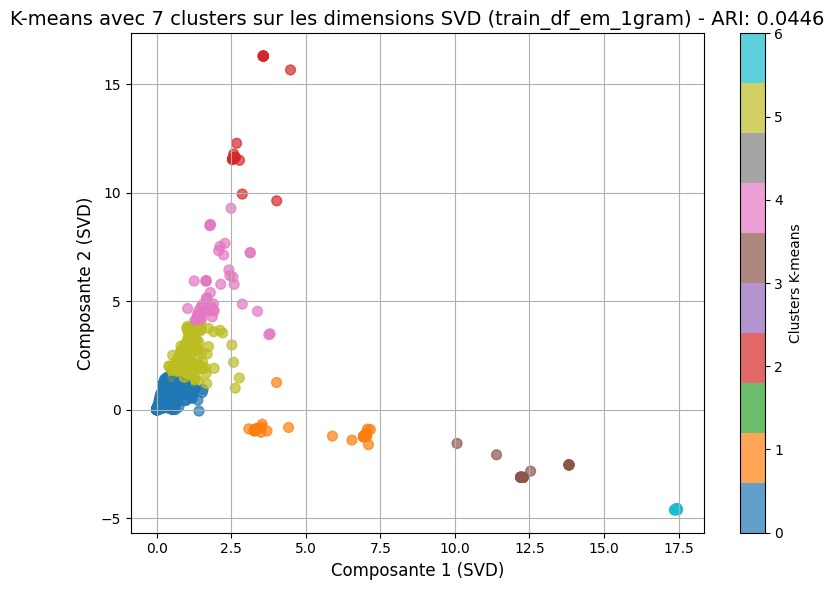

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means 
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,         # 7 clusters correspondant aux catégories
    random_state=42,      # Reproductibilité
    n_init=20,            # Nombre d'initialisations pour une meilleure stabilité
    max_iter=500,         # Nombre maximal d'itérations pour convergence
    tol=1e-4              # Tolérance pour convergence
)

# Appliquer K-means sur les données réduites par Truncated SVD
kmeans_labels = kmeans.fit_predict(X_svd)

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(8, 6))

# Affichage des points SVD colorés selon les clusters prédits
scatter = plt.scatter(
    X_svd[:, 0],  # Première composante SVD
    X_svd[:, 1],  # Deuxième composante SVD
    c=kmeans_labels,  # Couleurs des points selon les clusters prédits
    cmap='tab10',     # Palette de couleurs
    alpha=0.7,        # Transparence des points
    s=50              # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique avec le score ARI
plt.title(f"K-means avec 7 clusters sur les dimensions SVD (train_df_em_1gram) - ARI: {ari_score:.4f}", fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel("Composante 1 (SVD)", fontsize=12)
plt.ylabel("Composante 2 (SVD)", fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()

##### <span style="color:green">UMAP - Uniform Manifold Approximation and Projection.</span>

 ! La matrice train_df_em_1gram est déjà une matrice dense.


C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


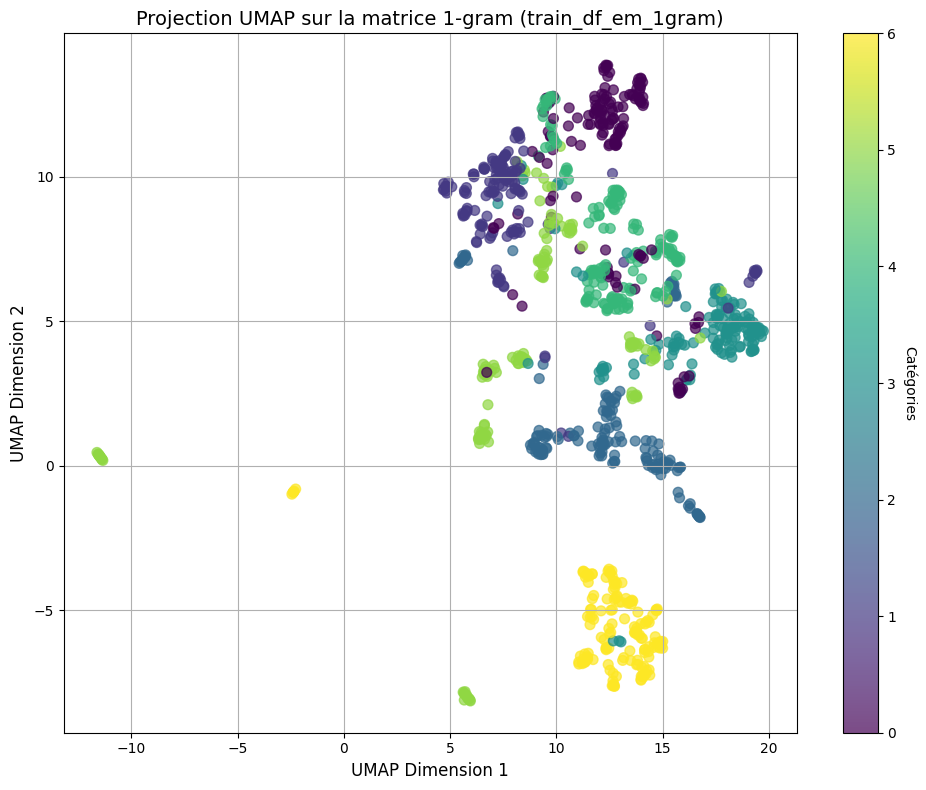

In [ ]:
import umap
import matplotlib.pyplot as plt
import pandas as pd
import scipy.sparse

# Vérification si la matrice est dense ou creuse
if scipy.sparse.issparse(train_df_em_1gram):
    print(" ! La matrice train_df_em_1gram est une matrice creuse (sparse).")
    train_df_em_1gram = train_df_em_1gram.toarray()
    print(" ! Conversion terminée : train_df_em_1gram est maintenant une matrice dense.")
else:
    print(" ! La matrice train_df_em_1gram est déjà une matrice dense.")

# Réduction de dimension avec UMAP
# Initialisation de l'algorithme UMAP
umap_reducer = umap.UMAP(
    n_components=2,  # Réduction en 2 dimensions pour visualisation
    n_neighbors=10,  # Paramètre ajusté pour capturer une structure locale optimale
    min_dist=0.4,    # Paramètre ajusté pour une meilleure séparation des clusters
    metric='cosine',  # Métrique adaptée aux données vectorisées
    random_state=42
)

# Application de UMAP sur la matrice 1-gram
X_umap = umap_reducer.fit_transform(train_df_em_1gram)

# Visualisation des résultats
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    X_umap[:, 0],
    X_umap[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,  # Couleur selon les catégories
    cmap='viridis',
    alpha=0.7,
    s=50
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.title('Projection UMAP sur la matrice 1-gram (train_df_em_1gram)', fontsize=14)
plt.xlabel('UMAP Dimension 1', fontsize=12)
plt.ylabel('UMAP Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


La projection UMAP sur la matrice 1-gram (train_df_em_1gram) révèle une structure globale où les catégories semblent partiellement séparées, avec certains regroupements clairs (ex. catégorie jaune). Cependant, un chevauchement est visible entre certaines classes, indiquant une complexité dans la séparation. 

Parmi les méthodes visualisées, UMAP semble offrir la meilleure séparation visuelle entre les catégories. Les clusters sont plus distincts et les catégories (indiquées par la légende) montrent une meilleure différenciation comparée aux autres méthodes.
t-SNE offre également une bonne séparation visuelle, mais UMAP montre des clusters plus denses et bien formés, particulièrement pour certaines catégories.

t-SNE offre également une bonne séparation visuelle, mais UMAP montre des clusters plus denses et bien formés, particulièrement pour certaines catégories.

UMAP est la méthode de réduction de dimension retenue

#### <span style="color:green">K-Means sur UMAP</span>

##### K-Means sur réduction de dimension UMAP - Variable 

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.4061


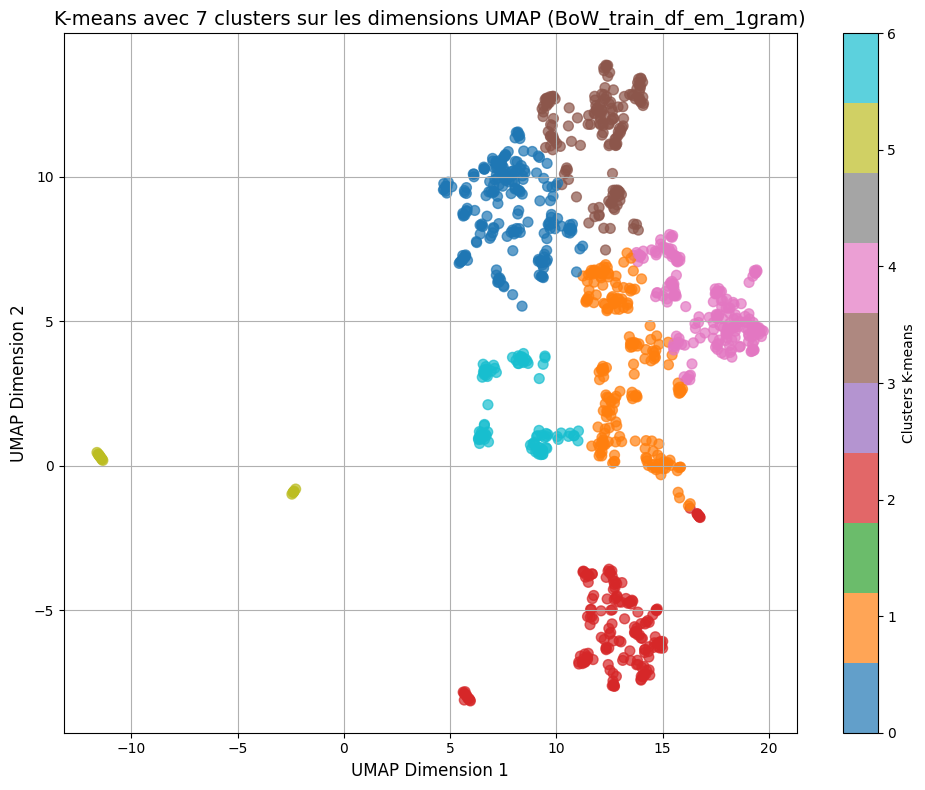

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application du K-means
# Initialisation du modèle K-means avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)  # 7 clusters

# Appliquer K-means sur les données UMAP réduites
kmeans_labels = kmeans.fit_predict(X_umap)  # Utilisation de X_umap comme entrée

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
# L'ARI mesure la similarité entre les clusters réels et prédits
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
# Création d'une figure pour visualiser les clusters prédits par K-means
plt.figure(figsize=(10, 8))

# Affichage des points UMAP colorés selon les clusters prédits
scatter = plt.scatter(
    X_umap[:, 0],  # Dimension 1 de UMAP
    X_umap[:, 1],  # Dimension 2 de UMAP
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',  # Palette de couleurs
    alpha=0.7,  # Transparence des points
    s=50  # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique
plt.title('K-means avec 7 clusters sur les dimensions UMAP (BoW_train_df_em_1gram)', fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel('UMAP Dimension 1', fontsize=12)
plt.ylabel('UMAP Dimension 2', fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()


Le score ARI de **0.4061** et la visualisation suggèrent qu'une classification supervisée est faisable. 

## Faisabilité | Comptage simple de mot : <span style="color:red">"WORD_COUNT"</span>

feature_product_name_description_lemmatized_word_count  

##### <span style="color:red">Analyse en Composante Principale</span>


--- Avant normalisation ---
Moyenne de la colonne : [41.82095238]
Écart-type de la colonne : [42.60324534]

--- Après normalisation ---
Moyenne après normalisation : [-5.75201262e-17]
Écart-type après normalisation : [1.]


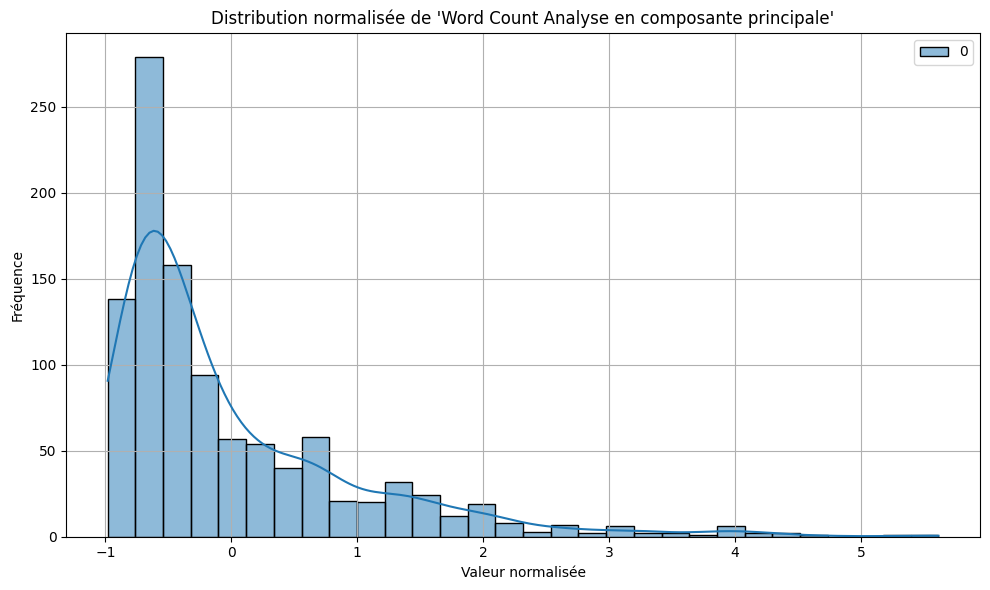

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

# Charger les données
X = dataset[['feature_product_name_description_lemmatized_word_count']].values  # Matrice des caractéristiques
y = dataset['label_category'].values  # Labels cibles

# Normalisation des données
scaler = StandardScaler()

# Vérification des moyennes et écarts-types avant normalisation
print("\nAvant normalisation")
print("Moyenne de la colonne :", X.mean(axis=0))
print("Écart-type de la colonne :", X.std(axis=0))

X_normalized = scaler.fit_transform(X)

# Vérification des moyennes et écarts-types après normalisation
print("\n--- Après normalisation ---")
print("Moyenne après normalisation :", X_normalized.mean(axis=0))
print("Écart-type après normalisation :", X_normalized.std(axis=0))

# Visualisation des données
plt.figure(figsize=(10, 6))
sns.histplot(X_normalized, kde=True, bins=30, color='blue')
plt.title("Distribution normalisée de 'Word Count Analyse en composante principale'")
plt.xlabel("Valeur normalisée")
plt.ylabel("Fréquence")
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.0467


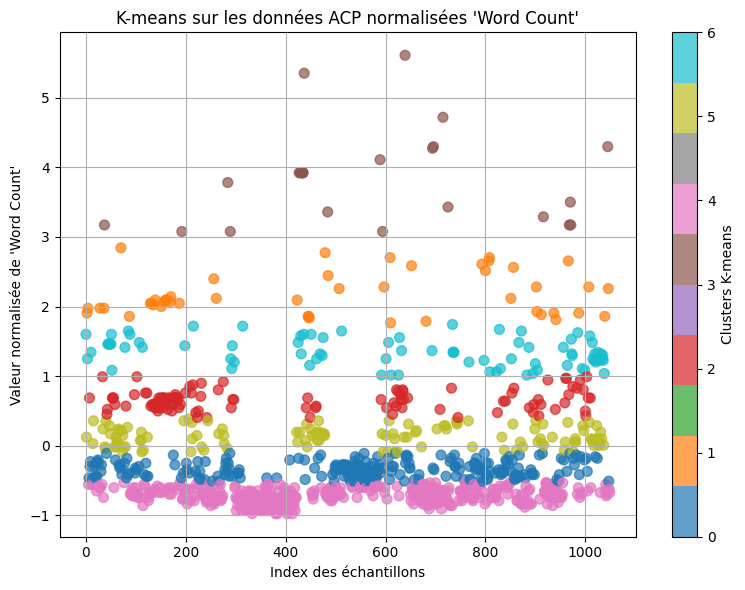

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,         # Nombre de clusters
    random_state=42,      # Reproductibilité
    n_init=20,            # Nombre d'initialisations
    max_iter=300,         # Nombre d'itérations
    tol=1e-4              # Tolérance pour convergence
)

# Appliquer K-means sur les données normalisées
kmeans_labels = kmeans.fit_predict(X_normalized)

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(y, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters
plt.figure(figsize=(8, 6))
plt.scatter(
    range(len(X_normalized)),  # Index des échantillons
    X_normalized[:, 0],       # Valeur normalisée de Word Count
    c=kmeans_labels,          # Couleurs selon les clusters
    cmap='tab10',             # Palette de couleurs
    alpha=0.7,                # Transparence
    s=50                      # Taille des points
)
plt.colorbar(label='Clusters K-means')
plt.title("K-means sur les données ACP normalisées 'Word Count'")
plt.xlabel("Index des échantillons")
plt.ylabel("Valeur normalisée de 'Word Count'")
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">Scatter Plot (nuage de points) </span>

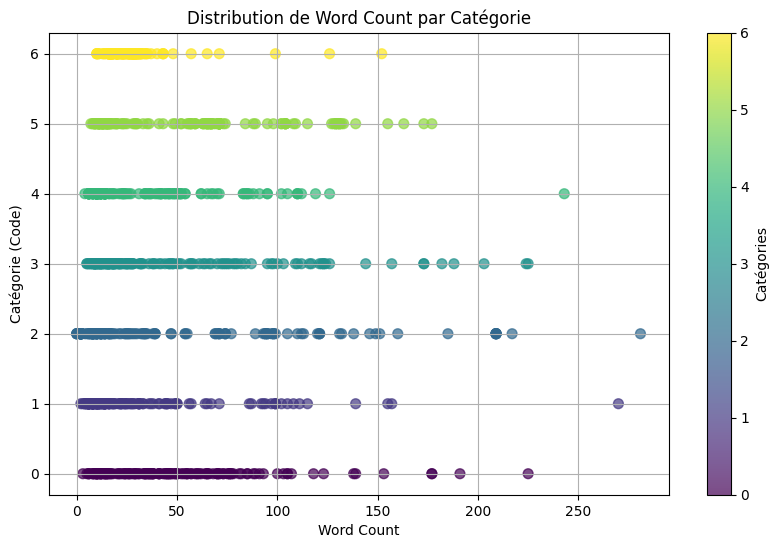

In [170]:
import matplotlib.pyplot as plt

# Charger la colonne et les labels
X_word_count = dataset[['feature_product_name_description_lemmatized_word_count']].values
y = dataset['label_category'].astype('category').cat.codes  # Convertir en codes numériques

# Visualisation simple
plt.figure(figsize=(10, 6))
plt.scatter(X_word_count, y, c=y, cmap='viridis', alpha=0.7, s=50)
plt.colorbar(label="Catégories")
plt.xlabel("Word Count")
plt.ylabel("Catégorie (Code)")
plt.title("Distribution de Word Count par Catégorie")
plt.grid(True)
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.0467


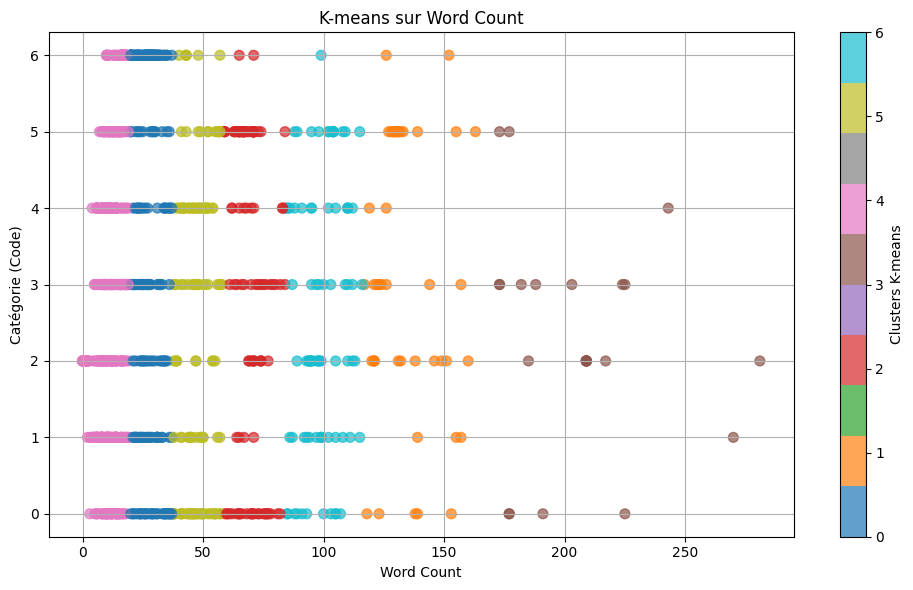

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,          # Nombre de clusters (7 catégories)
    random_state=42,       # Pour reproductibilité
    n_init=20,             # Augmentation du nombre d'initialisations pour stabilité
    max_iter=300,          # Nombre maximal d'itérations
    tol=1e-4               # Tolérance pour convergence
)

# Appliquer K-means sur les données Word Count
kmeans_labels = kmeans.fit_predict(X_word_count)

# Calcul de l'ARI
# Comparer les étiquettes réelles avec les clusters prédits
ari_score = adjusted_rand_score(y, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters
plt.figure(figsize=(10, 6))
plt.scatter(
    X_word_count,  # Valeur de Word Count
    y,             # Catégories réelles
    c=kmeans_labels,  # Couleurs selon les clusters prédits
    cmap='tab10',     # Palette de couleurs
    alpha=0.7,        # Transparence des points
    s=50              # Taille des points
)
plt.colorbar(label="Clusters K-means")
plt.xlabel("Word Count")
plt.ylabel("Catégorie (Code)")
plt.title("K-means sur Word Count")
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:yellow">UMAP - Uniform Manifold Approximation and Projection.</span>

C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


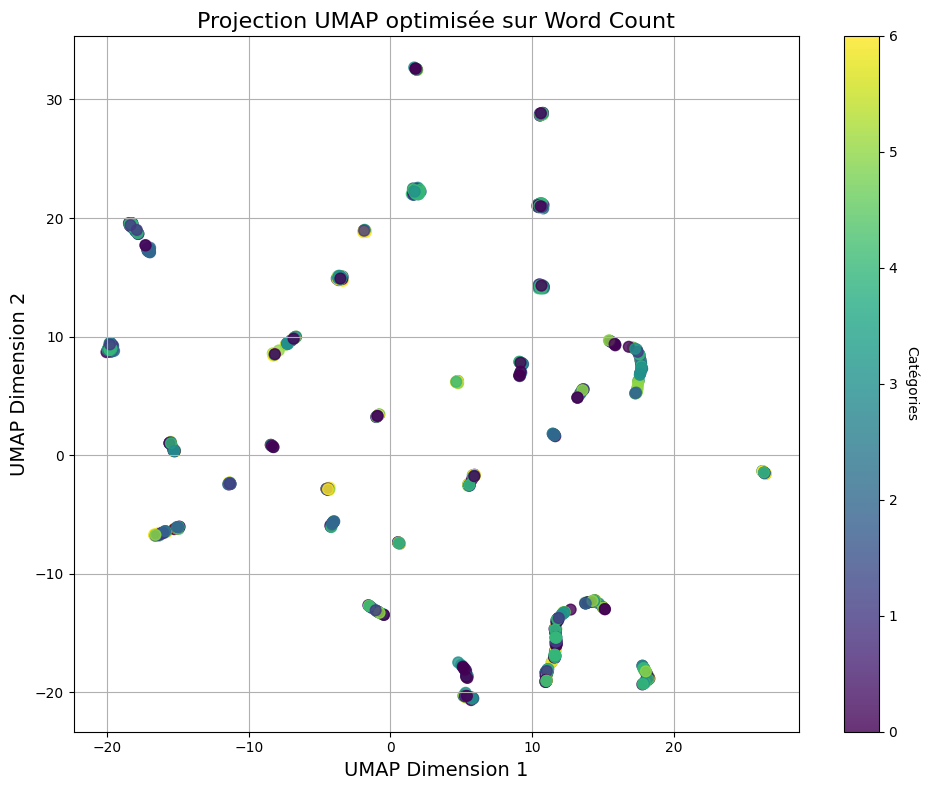

In [ ]:
import umap
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Charger la colonne Word Count
X = dataset[['feature_product_name_description_lemmatized_word_count']].values  
y = dataset['label_category'].values  # Charger les catégories

# Normalisation des données
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

# Réduction de dimension avec UMAP
# Initialisation de l'algorithme UMAP avec des hyperparamètres optimisés
umap_reducer = umap.UMAP(
    n_components=2,       # Réduction en 2 dimensions
    n_neighbors=15,       # Capture un voisinage légèrement plus large
    min_dist=0.2,         # Favorise une meilleure séparation entre les clusters
    metric='manhattan',   # Métrique alternative pour améliorer la structure des clusters
    random_state=42       # Reproductibilité
)

# Application de UMAP sur Word Count
X1_umap = umap_reducer.fit_transform(X_normalized)

# Visualisation des résultats
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    X1_umap[:, 0],
    X1_umap[:, 1],
    c=pd.Categorical(y).codes,  # Transformation des catégories en codes numériques
    cmap='viridis',
    alpha=0.8,  # Augmentation de l'opacité pour une meilleure lisibilité
    s=60        # Taille des points légèrement augmentée
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.title('Projection UMAP optimisée sur Word Count', fontsize=16)
plt.xlabel('UMAP Dimension 1', fontsize=14)
plt.ylabel('UMAP Dimension 2', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


Le graphique UMAP montre une séparation visuelle plus équilibrée et une structure globale et locale des catégories mieux préservée.
Conclusion : UMAP semble être la méthode qui fournit la meilleure distinction visuelle entre les catégories.

##### <span style="color:green">K-Means sur UMAP</span>

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.0432


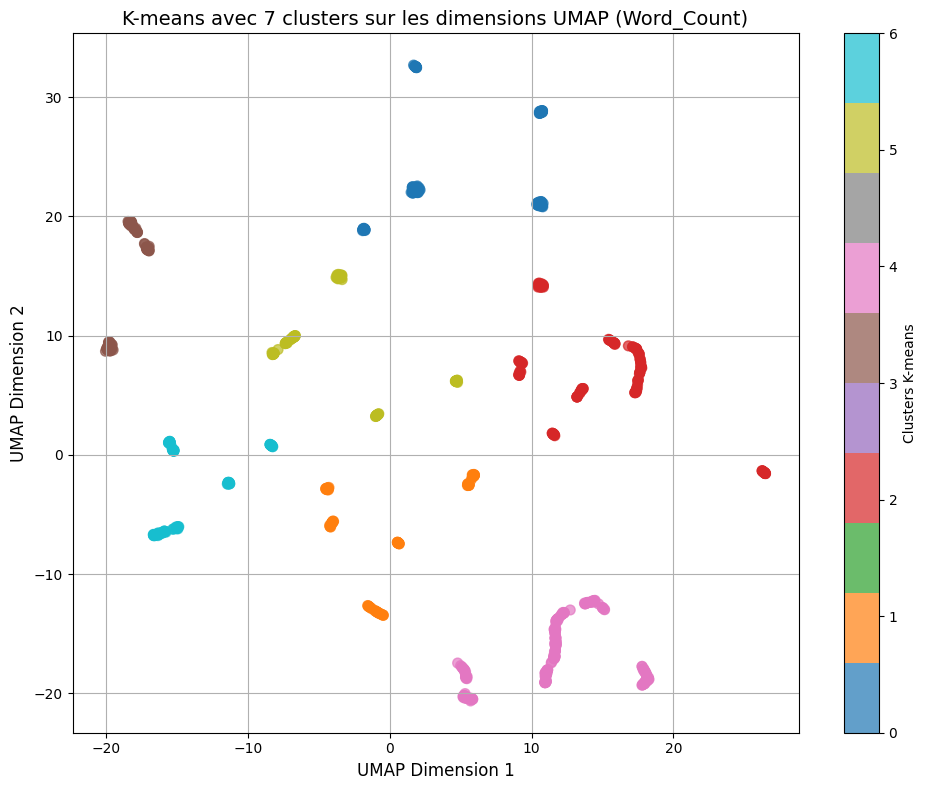

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application du K-means
# Initialisation du modèle K-means avec 7 clusters
kmeans = KMeans(n_clusters=7, random_state=42)  # 7 clusters

# Appliquer K-means sur les données UMAP réduites
kmeans_labels = kmeans.fit_predict(X1_umap)  

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
# L'ARI mesure la similarité entre les clusters réels et prédits
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
# Création d'une figure pour visualiser les clusters prédits par K-means
plt.figure(figsize=(10, 8))

# Affichage des points UMAP colorés selon les clusters prédits
scatter = plt.scatter(
    X1_umap[:, 0],  # Dimension 1 de UMAP
    X1_umap[:, 1],  # Dimension 2 de UMAP
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',  # Palette de couleurs
    alpha=0.7,  # Transparence des points
    s=50  # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique
plt.title('K-means avec 7 clusters sur les dimensions UMAP (Word_Count)', fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel('UMAP Dimension 1', fontsize=12)
plt.ylabel('UMAP Dimension 2', fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()


La faible valeur d'ARI montre que Word Count seul, même normalisé, n'est pas suffisant pour bien différencier les catégories. Une analyse complémentaire ou l'ajout d'autres variables pourrait améliorer la classification.

## Faisabilité | Term Frequency - Inverse Document Frequency : <span style="color:red">"TFIDF_MATRIX"</span>

Les matrices générées ci-dessous reflètent les n-grams extraits avec la méthode TF-IDF et peuvent être utilisées pour des modèles d'apprentissage automatique :

- **train_df_tfidf_1gram** : Matrice TF-IDF pour les **unigrammes**
- **train_df_tfidf_2gram** : Matrice TF-IDF pour les **bigrammes**
- **train_df_tfidf_3gram** : Matrice TF-IDF pour les **trigrammes**
- **combined_tfidf_matrix** : Matrice TF-IDF pour les **trigrammes**

- Offre la meilleure séparation des catégories.
- Idéal pour explorer les structures locales dans des données textuelles comme la matrice TF-IDF.


#### <span style="color:red">Analyse en Composante Principale</span>

--- Vérification si la matrice est sparse ---

Qu'est-ce qu'une matrice sparse ?
Une **matrice sparse** (ou **creuse**) est une matrice qui **contient principalement des zéros** et très peu de valeurs non nulles.  
Elle est stockée sous un format optimisé en mémoire afin de **ne pas enregistrer inutilement les zéros**.

 **Avantage :** Moins d'utilisation mémoire et calculs plus rapides sur des matrices très creuses.  
 **Inconvénient :** Certains algorithmes ne supportent pas le format sparse et nécessitent une conversion en dense.


Taille de la matrice combined_tfidf_matrix : (1050, 4664)
 ! La matrice est au format sparse.

Variance expliquée par chaque composante :
 [0.05678125 0.03431645 0.03266075 0.03053288 0.02687437 0.026144
 0.02490471 0.02311357]

Composantes principales (vecteurs propres) :
 [[ 5.81305735e-02  5.86553700e-02  8.39556160e-04 ... -3.73307179e-04
  -1.19309069e-03 -1.30940275e-03]
 [ 1.60043128e-05 -3.18624079e-05 -7.44366553e-04 ... -1.91970932e-04
  -9.87834646e-04 -9.60376300e-03]
 [ 1.12210540e-03  1.07475824e-03 -2.13664677e-03 ... -6.87059190e-04
  -1.30406197e-03  8.02428275e-02]
 ...
 [-1.30022748e-03 -9.76863783e-04  8.94781202e-02 ... -4.42653807e-04
  -1.41826808e-03  1.74703076e-03]
 [ 1.16856885e-04  7.18488591e-05  4.36418829e-03 ... -6.33541145e-04
  -3.35012190e-03  3.11871013e-03]
 [-1.16552003e-02 -1.47231910e-02  3.01467162e-03 ...  1.54907815e-04
  -2.36137863e-03  8.97992402e-04]]

Projection des données dans l'espace des composantes principales (échantillon) :
 [[-1.5

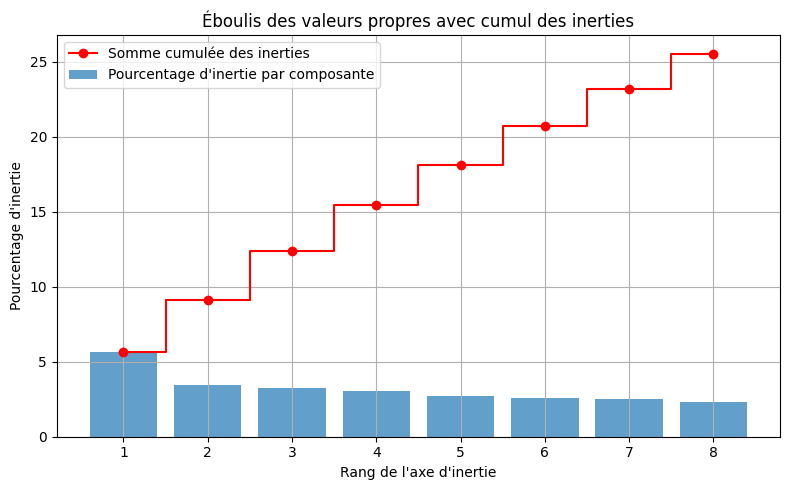

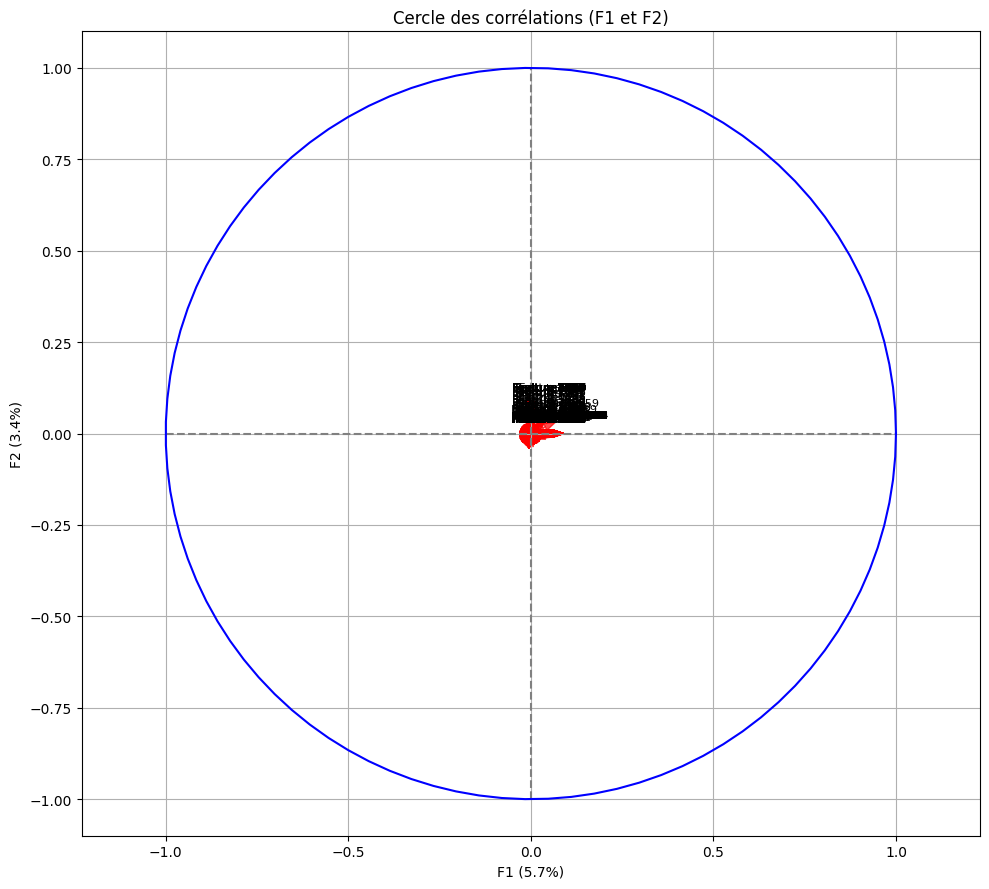

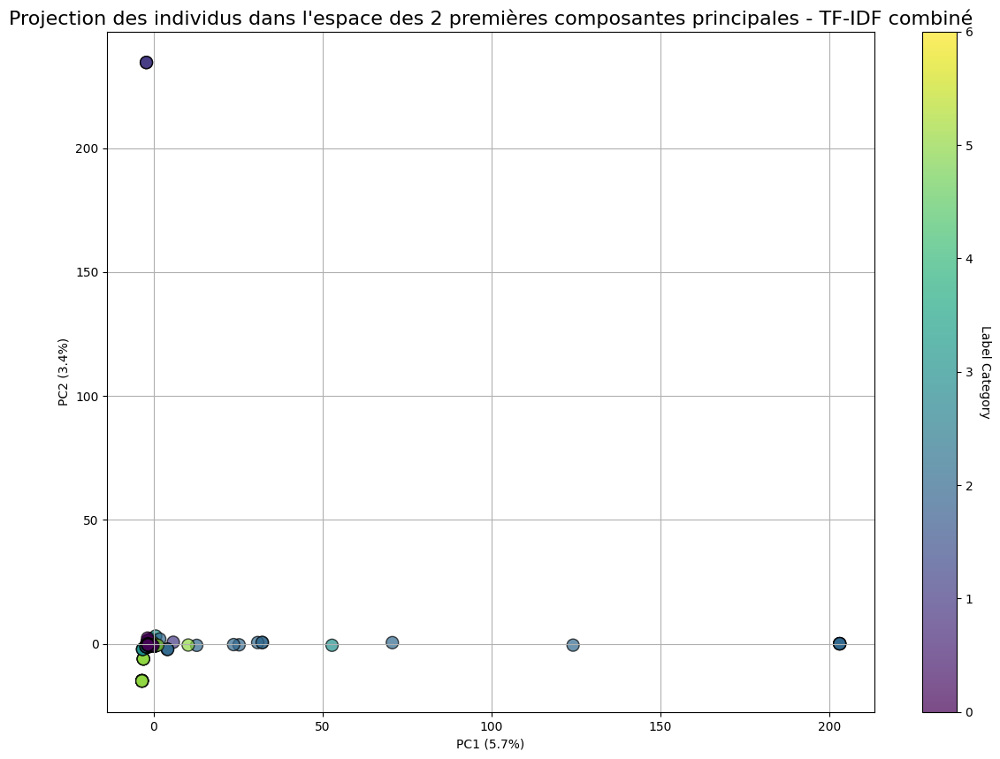

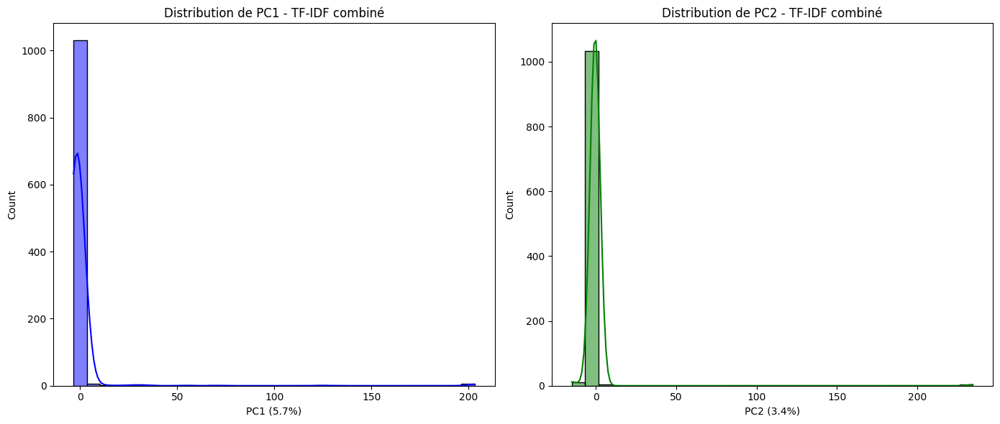

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MaxAbsScaler
from sklearn.decomposition import PCA

# Vérification des dimensions de la matrice combined_tfidf_matrix
print("Taille de la matrice combined_tfidf_matrix :", combined_tfidf_matrix.shape)

# Définir X et y
X = combined_tfidf_matrix  # Matrice TF-IDF sparse
y = dataset['label_category'].values  # Variable cible 

# Vérification si la matrice est sparse
if hasattr(X, "toarray"):  
    print(" ! La matrice est au format sparse.")
    X = X.toarray()  # Convertir en dense si nécessaire
    scaler = StandardScaler()  # Standardisation normale
else:
    scaler = MaxAbsScaler()  # Normalisation adaptée aux matrices sparse

# Appliquer la normalisation
X_scaled = scaler.fit_transform(X)

# Appliquer l'ACP
n_components = 8
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

# Affichage des résultats de l'ACP
print("\nVariance expliquée par chaque composante :\n", pca.explained_variance_ratio_)
print("\nComposantes principales (vecteurs propres) :\n", pca.components_)
print("\nProjection des données dans l'espace des composantes principales (échantillon) :\n", X_pca[:5])

# Graphique d'éboulis des valeurs propres
variance_expliquee = pca.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

# Cercle des corrélations
fig, ax = plt.subplots(figsize=(10, 9))
x, y_index = 0, 1  # Première et deuxième composante
features = [f'Feature {i}' for i in range(X.shape[1])]

for i in range(pca.components_.shape[1]):
    ax.arrow(0, 0, 
             pca.components_[x, i],  
             pca.components_[y_index, i],  
             head_width=0.02, 
             head_length=0.03, 
             width=0.001, 
             color='red', alpha=0.7)
    if i < len(features):  #  ne pas dépasser la taille
        plt.text(pca.components_[x, i] + 0.05, 
                 pca.components_[y_index, i] + 0.05, 
                 features[i], 
                 color='black', 
                 ha='center', 
                 va='center', 
                 fontsize=8)

plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')
an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an), color='blue')
plt.xlabel(f'F1 ({round(100 * pca.explained_variance_ratio_[x], 1)}%)')
plt.ylabel(f'F2 ({round(100 * pca.explained_variance_ratio_[y_index], 1)}%)')
plt.title("Cercle des corrélations (F1 et F2)")
plt.axis('equal')
plt.grid(True)
plt.tight_layout()
plt.show()

# Projection des individus
plt.figure(figsize=(14, 10))

# Vérification des dimensions de y
if len(y) != len(X_pca):
    raise ValueError(f"La taille des labels ({len(y)}) ne correspond pas à celle des données projetées ({len(X_pca)})")

scatter = plt.scatter(
    X_pca[:, 0], 
    X_pca[:, 1], 
    c=y,  # Utilisation directe des catégories
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Label Category', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title("Projection des individus dans l'espace des 2 premières composantes principales - TF-IDF combiné", fontsize=16)
plt.grid(True)
plt.show()

# Distribution des composantes principales
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(X_pca[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.title("Distribution de PC1 - TF-IDF combiné")

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(X_pca[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title("Distribution de PC2 - TF-IDF combiné")

plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.0007


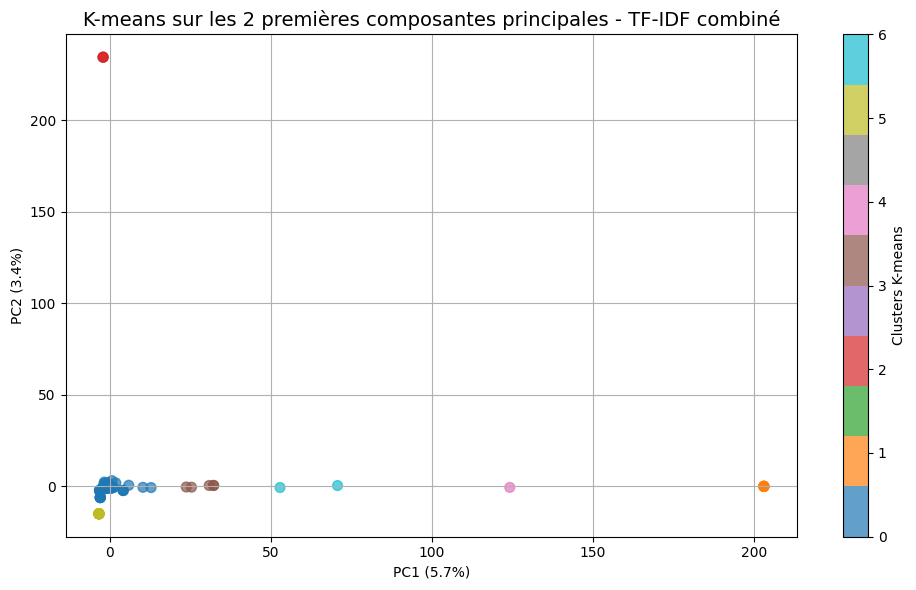

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,          # Nombre de clusters (7 catégories)
    random_state=42,       # Pour reproductibilité
    n_init=20,             # Augmentation du nombre d'initialisations pour stabilité
    max_iter=300,          # Nombre maximal d'itérations
    tol=1e-4               # Tolérance pour convergence
)

# Appliquer K-means sur les données ACP réduites
kmeans_labels = kmeans.fit_predict(X_pca[:, :2])  # Utilisation des 2 premières composantes principales

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(y, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(10, 6))
plt.scatter(
    X_pca[:, 0],  # Composante principale 1
    X_pca[:, 1],  # Composante principale 2
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',     # Palette de couleurs
    alpha=0.7,        # Transparence des points
    s=50              # Taille des points
)
plt.colorbar(label="Clusters K-means")
plt.xlabel(f"PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)")
plt.ylabel(f"PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)")
plt.title("K-means sur les 2 premières composantes principales - TF-IDF combiné", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


#### <span style="color:red">t-SNE (t-distributed Stochastic Neighbor Embedding)</span>

C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


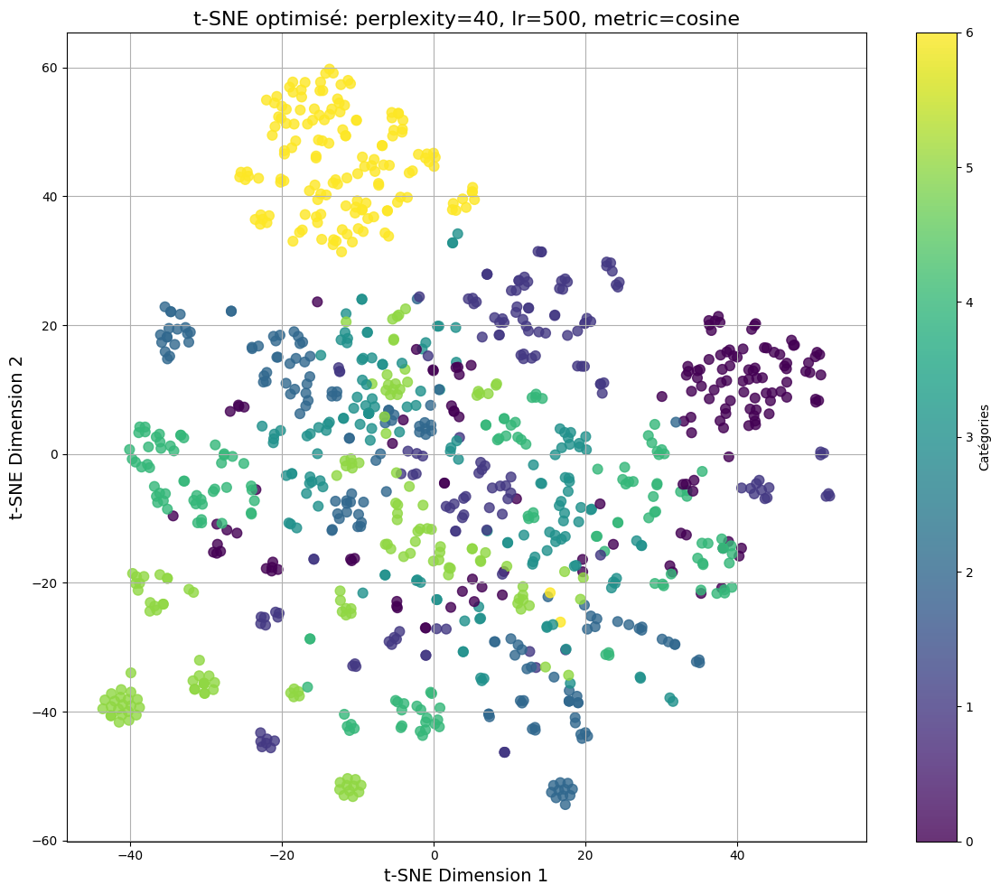

In [ ]:
# Importation des bibliothèques nécessaires
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import scipy.sparse

# Vérification du format des données
# Convertir la matrice combinée en dense si elle est éparse
if scipy.sparse.issparse(combined_tfidf_matrix):
    combined_tfidf_matrix = combined_tfidf_matrix.toarray()

#  Standardisation des données
scaler = StandardScaler()
tfidf_scaled = scaler.fit_transform(combined_tfidf_matrix)

# Optimisation des hyperparamètres et application de t-SNE
# Configuration de t-SNE avec des hyperparamètres optimisés
tsne = TSNE(
    n_components=2,            # Réduction à 2 dimensions
    random_state=42,           # Reproductibilité
    perplexity=40,             # Perplexité ajustée pour capturer des voisinages moyens
    learning_rate=500,         # Taux d'apprentissage élevé pour convergence rapide
    metric='cosine',           # Distance cosinus pour les données TF-IDF
    n_iter=2000,               # Augmentation du nombre d'itérations pour stabiliser les clusters
    init='pca',                # Initialisation PCA pour améliorer la séparation initiale
    early_exaggeration=15,     # Accentuation initiale plus forte pour mieux séparer les clusters
    n_jobs=-1                  # Accélération via parallélisme
)

# Réduction de dimension avec t-SNE
tfidf_tsne = tsne.fit_transform(tfidf_scaled)

# Visualisation
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    tfidf_tsne[:, 0],  # Dimension 1 de t-SNE
    tfidf_tsne[:, 1],  # Dimension 2 de t-SNE
    c=dataset['label_category'].astype('category').cat.codes,  # Couleurs des catégories
    cmap='viridis',     # Palette de couleurs
    alpha=0.8,          # Transparence des points
    s=60                # Taille des points légèrement augmentée
)

# Ajouter une barre de couleurs
plt.colorbar(label='Catégories')

# Ajouter des titres et étiquettes
plt.title("t-SNE optimisé: perplexity=40, lr=500, metric=cosine", fontsize=16)
plt.xlabel("t-SNE Dimension 1", fontsize=14)
plt.ylabel("t-SNE Dimension 2", fontsize=14)

# Ajouter une grille pour plus de clarté
plt.grid(True)

# Ajuster le layout pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()


#### <span style="color:green">K-Means sur t-SNE</span>

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.3075


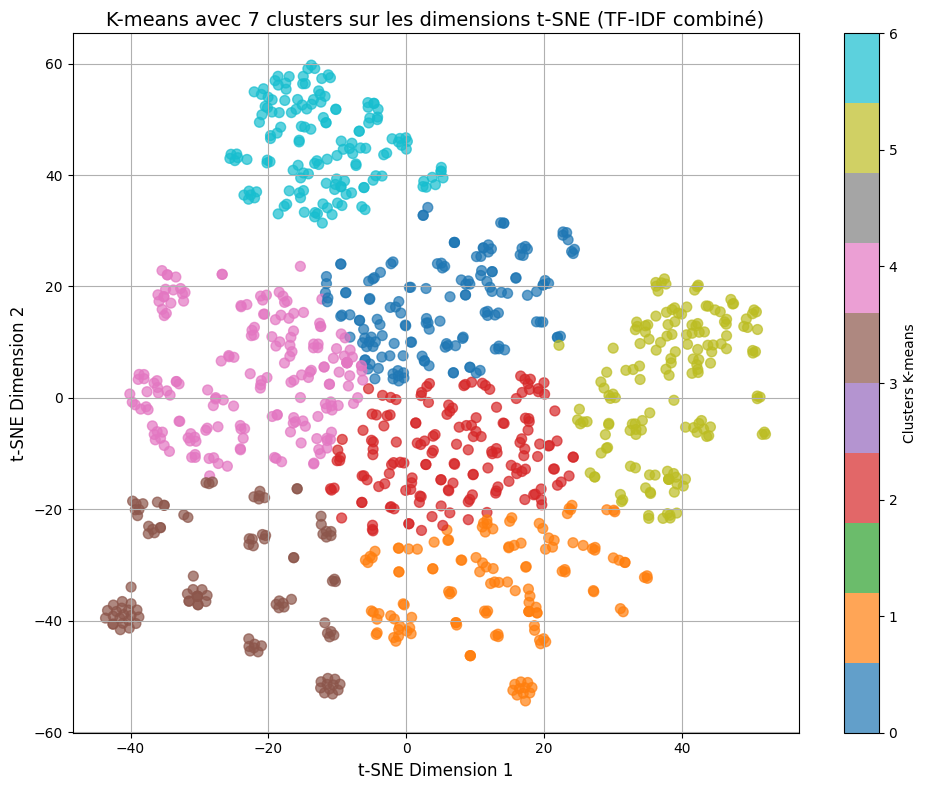

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import scipy.sparse

# Vérification du format des données
if scipy.sparse.issparse(combined_tfidf_matrix):
    combined_tfidf_matrix = combined_tfidf_matrix.toarray()

# Standardisation des données
scaler = StandardScaler()
tfidf_scaled = scaler.fit_transform(combined_tfidf_matrix)

# K-means sur les données déjà réduites avec t-SNE
kmeans = KMeans(
    n_clusters=7,        # Nombre de clusters (fixé à 7)
    init='k-means++',    # Initialisation intelligente
    n_init=50,           # Augmenter le nombre d'initialisations
    max_iter=1000,       # Augmenter le nombre d'itérations
    tol=1e-5,            # Tolérance plus stricte pour la convergence
    algorithm="elkan",   # Utiliser un algorithme plus performant pour grandes dimensions
    random_state=42      # Reproductibilité
)
kmeans_labels = kmeans.fit_predict(tfidf_tsne)

# Calcul de l'ARI
# le 'dataset' contient la colonne 'label_category'
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    tfidf_tsne[:, 0],  # Dimension 1 de t-SNE
    tfidf_tsne[:, 1],  # Dimension 2 de t-SNE
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',      # Palette de couleurs
    alpha=0.7,         # Transparence des points
    s=50               # Taille des points
)

plt.colorbar(label='Clusters K-means')
plt.title('K-means avec 7 clusters sur les dimensions t-SNE (TF-IDF combiné)', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=12)
plt.ylabel('t-SNE Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


#### <span style="color:red">Truncated SVD (Singular Value Decomposition)</span>

In [178]:
import numpy as np

# Calcul de la norme L2 de chaque ligne pour une matrice dense
norms = np.linalg.norm(combined_tfidf_matrix, axis=1)

# Vérification si les lignes sont normalisées
if np.allclose(norms, 1):
    print(" La matrice TF-IDF est déjà normalisée (L2).")
else:
    print("! La matrice TF-IDF n'est pas normalisée. Normalisation nécessaire.")


! La matrice TF-IDF n'est pas normalisée. Normalisation nécessaire.


La matrice TF-IDF est dense.
Normalisation de la matrice TF-IDF...
Normalisation terminée.
Variance expliquée par chaque composante : [0.02709042 0.01843262 0.01736238 0.01263417 0.01553837 0.01338068
 0.0124088  0.01166348 0.01042589 0.01011796 0.01008662 0.010109
 0.00995712 0.00954898 0.0094307  0.00815026 0.00779844 0.00736789
 0.00730617 0.00711624 0.00700816 0.00692452 0.00677304 0.0064826
 0.00626646 0.0061048  0.00586773 0.00583943 0.00575342 0.00561427
 0.00552981 0.00545225 0.00523906 0.00529586 0.00515059 0.00511468
 0.0049597  0.00487848 0.00479153 0.00463012 0.00454364 0.00445447
 0.00439309 0.0043329  0.00429697 0.00423815 0.00411524 0.00406354
 0.00398944 0.00384176]
Variance cumulée : [0.02709042 0.04552305 0.06288543 0.07551961 0.09105798 0.10443866
 0.11684746 0.12851095 0.13893685 0.14905481 0.15914144 0.16925044
 0.17920756 0.18875654 0.19818723 0.2063375  0.21413594 0.22150384
 0.22881001 0.23592626 0.24293442 0.24985895 0.25663197 0.26311457
 0.26938102 0.2754858 

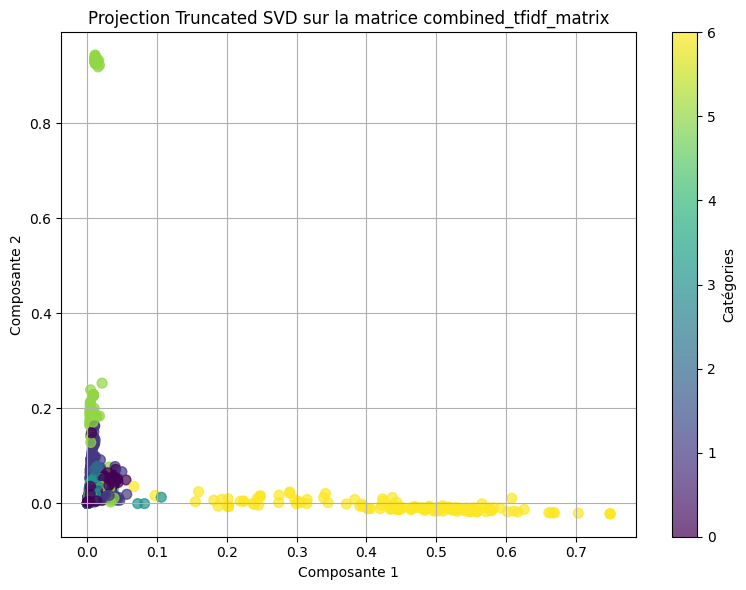

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

# Vérification si la matrice est dense
if scipy.sparse.issparse(combined_tfidf_matrix):
    print("La matrice TF-IDF est au format sparse (creuse).")
else:
    print("La matrice TF-IDF est dense.")

# Normalisation L2 de la matrice TF-IDF
print("Normalisation de la matrice TF-IDF...")
combined_tfidf_matrix = normalize(combined_tfidf_matrix, norm='l2', axis=1)
print("Normalisation terminée.")

#  Réduction avec Truncated SVD 
svd = TruncatedSVD(n_components=50, random_state=42)  # Réduction à 50 dimensions
X_svd = svd.fit_transform(combined_tfidf_matrix)

#  Variance expliquée 
print("Variance expliquée par chaque composante :", svd.explained_variance_ratio_)
print("Variance cumulée :", svd.explained_variance_ratio_.cumsum())

#  Visualisation des résultats 
plt.figure(figsize=(8, 6))
plt.scatter(
    X_svd[:, 0], 
    X_svd[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.7, 
    s=50
)
plt.colorbar(label="Catégories")
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
plt.title("Projection Truncated SVD sur la matrice combined_tfidf_matrix")
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.1364


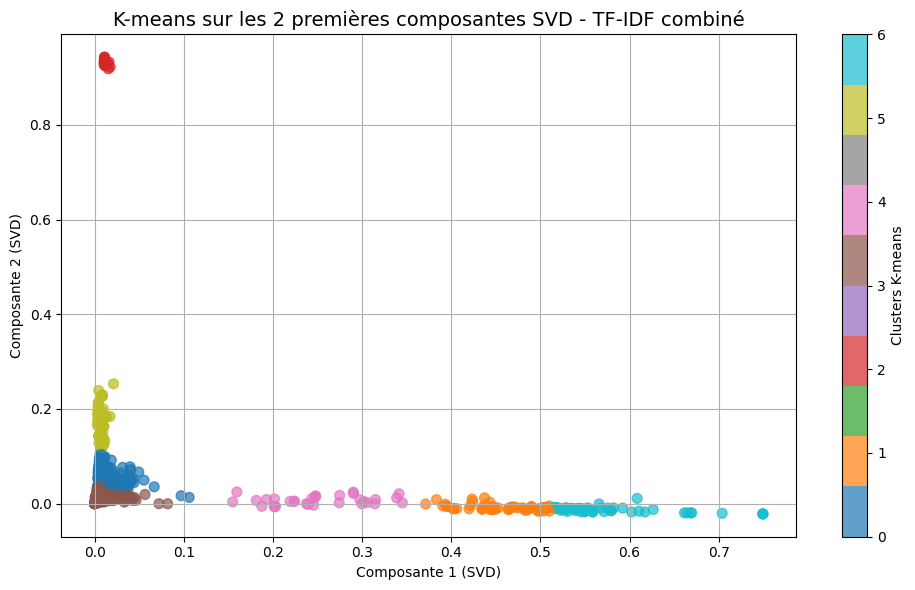

In [ ]:
#  Importation des bibliothèques nécessaires 
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means 
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,         # Nombre de clusters (correspondant aux catégories)
    random_state=42,      # Assurer la reproductibilité
    n_init=20,            # Augmenter les initialisations pour éviter les minima locaux
    max_iter=300,         # Nombre d'itérations maximal
    tol=1e-4              # Tolérance pour convergence
)

# Appliquer K-means sur les données SVD réduites
kmeans_labels = kmeans.fit_predict(X_svd[:, :2])  # Utilisation des 2 premières composantes principales

#  Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(10, 6))
plt.scatter(
    X_svd[:, 0],  # Composante principale 1
    X_svd[:, 1],  # Composante principale 2
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',     # Palette de couleurs
    alpha=0.7,        # Transparence des points
    s=50              # Taille des points
)
plt.colorbar(label="Clusters K-means")
plt.xlabel("Composante 1 (SVD)")
plt.ylabel("Composante 2 (SVD)")
plt.title("K-means sur les 2 premières composantes SVD - TF-IDF combiné", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


#### <span style="color:red">UMAP - Uniform Manifold Approximation and Projection.</span>

La matrice combined_tfidf_matrix est déjà une matrice dense.


C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


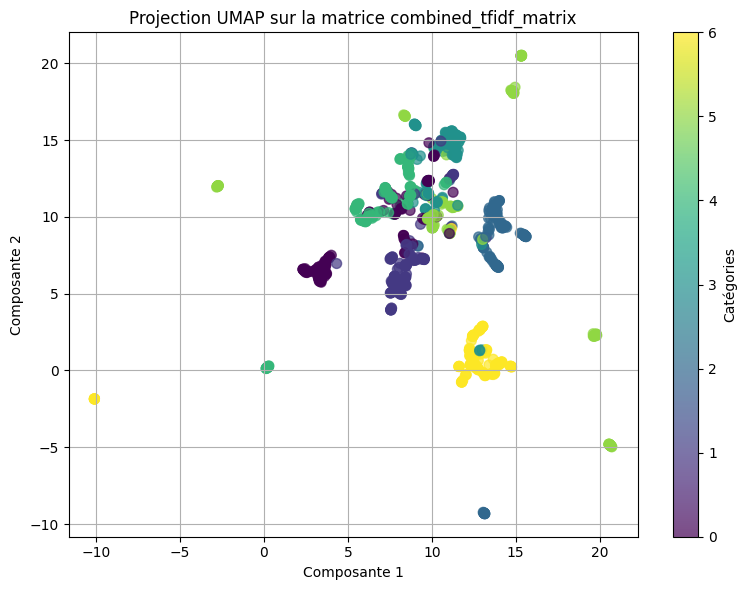

In [ ]:
import umap
import matplotlib.pyplot as plt
import scipy.sparse

#  Vérification si la matrice est dense ou creuse 
if scipy.sparse.issparse(combined_tfidf_matrix):
    print("La matrice combined_tfidf_matrix est une matrice creuse (sparse).")
    combined_tfidf_matrix = combined_tfidf_matrix.toarray()  # Conversion en matrice dense
else:
    print("La matrice combined_tfidf_matrix est déjà une matrice dense.")

#  Appliquer UMAP 
umap_reducer = umap.UMAP(
    n_components=2,      # Réduction à 2 dimensions pour visualisation
    n_neighbors=15,      # Contrôle la structure locale
    min_dist=0.1,        # Distance minimale entre les points
    metric='cosine',     # Métrique adaptée pour TF-IDF
    random_state=42
)
X_umap = umap_reducer.fit_transform(combined_tfidf_matrix)

#  Visualisation des résultats 
plt.figure(figsize=(8, 6))
plt.scatter(
    X_umap[:, 0], 
    X_umap[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.7, 
    s=50
)
plt.colorbar(label="Catégories")
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
plt.title("Projection UMAP sur la matrice combined_tfidf_matrix")
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.4873


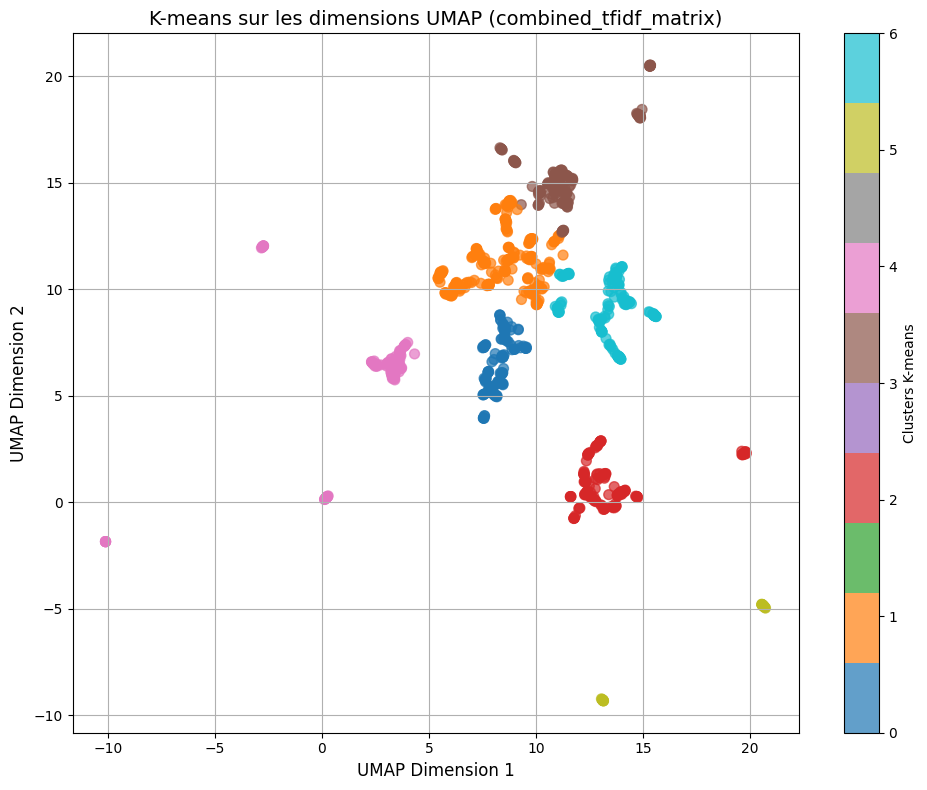

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application du K-means 
# Initialisation du modèle K-means
kmeans = KMeans(
    n_clusters=7,         # 7 clusters (connu comme optimal pour vos données)
    random_state=42,      # Reproductibilité
    n_init=20,            # Augmentation des initialisations pour un meilleur résultat
    max_iter=500,         # Augmentation du nombre d'itérations pour une convergence plus stable
    tol=1e-4              # Tolérance pour l'arrêt des itérations
)

# Appliquer K-means sur les données UMAP réduites
kmeans_labels = kmeans.fit_predict(X_umap)  # Utilisation de X_umap comme entrée

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(10, 8))

# Affichage des points UMAP colorés selon les clusters prédits
scatter = plt.scatter(
    X_umap[:, 0],  # Dimension 1 de UMAP
    X_umap[:, 1],  # Dimension 2 de UMAP
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',  # Palette de couleurs
    alpha=0.7,  # Transparence des points
    s=50  # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique
plt.title('K-means sur les dimensions UMAP (combined_tfidf_matrix)', fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel('UMAP Dimension 1', fontsize=12)
plt.ylabel('UMAP Dimension 2', fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()


## Faisabilité | Word2Vec: <span style="color:red">"WORD2VECTORS"</span>

Concernant Word2Vec, la méthode t-SNE semble offrir une meilleure séparation visuelle des catégories, comme en témoignent les regroupements distincts des points dans l'espace réduit. Comparativement, l'ACP, l'UMAP et l'autoencodeur montrent des chevauchements plus importants ou une structure moins claire des clusters. Cela suggère que t-SNE est plus adapté pour capturer les structures non linéaires dans les données Word2Vec.

##### <span style="color:red">Analyse en Composante Principale</span>

Forme de la matrice Word2Vec : (1050, 100)
Forme des données Word2Vec après standardisation : (1050, 100)

Variance expliquée par chaque composante :
 [0.52980059 0.21484695 0.13760492 0.05507004 0.0191276  0.01272041
 0.00691228 0.0061184 ]

Composantes principales (vecteurs propres) :
 [[ 1.17323887e-01  1.17960586e-01  1.08462732e-01  6.72851163e-02
   7.51319906e-02 -7.36597093e-03  8.25078943e-02  1.27951872e-01
  -4.57041171e-02 -7.62042741e-02 -1.07937334e-01  7.73847397e-02
  -9.08124557e-02 -5.52605092e-03  1.10873837e-01 -6.16748456e-02
   1.99115785e-02  6.53490779e-02  1.87741518e-02 -1.19223576e-01
   4.99132996e-02 -1.28349079e-01  1.25126453e-01 -1.23238193e-01
  -1.20524708e-01  1.07573202e-01  7.98280286e-02 -2.29269434e-02
   1.27689153e-01  1.34999336e-01  6.97518121e-02 -1.33039603e-01
   1.20137692e-01  5.02958807e-02  1.24283522e-01  1.29142769e-01
  -5.56506077e-02 -1.23078619e-01 -8.64136754e-02  1.08682586e-02
   1.30964115e-01 -1.19477286e-01 -1.27325590e-01  

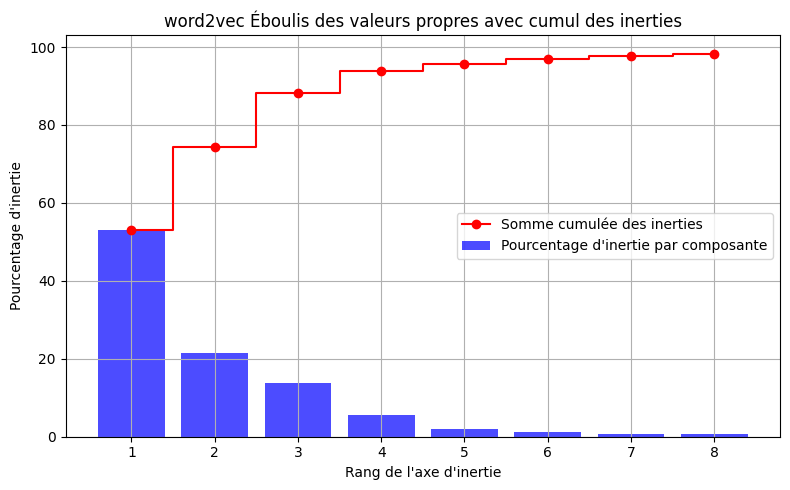

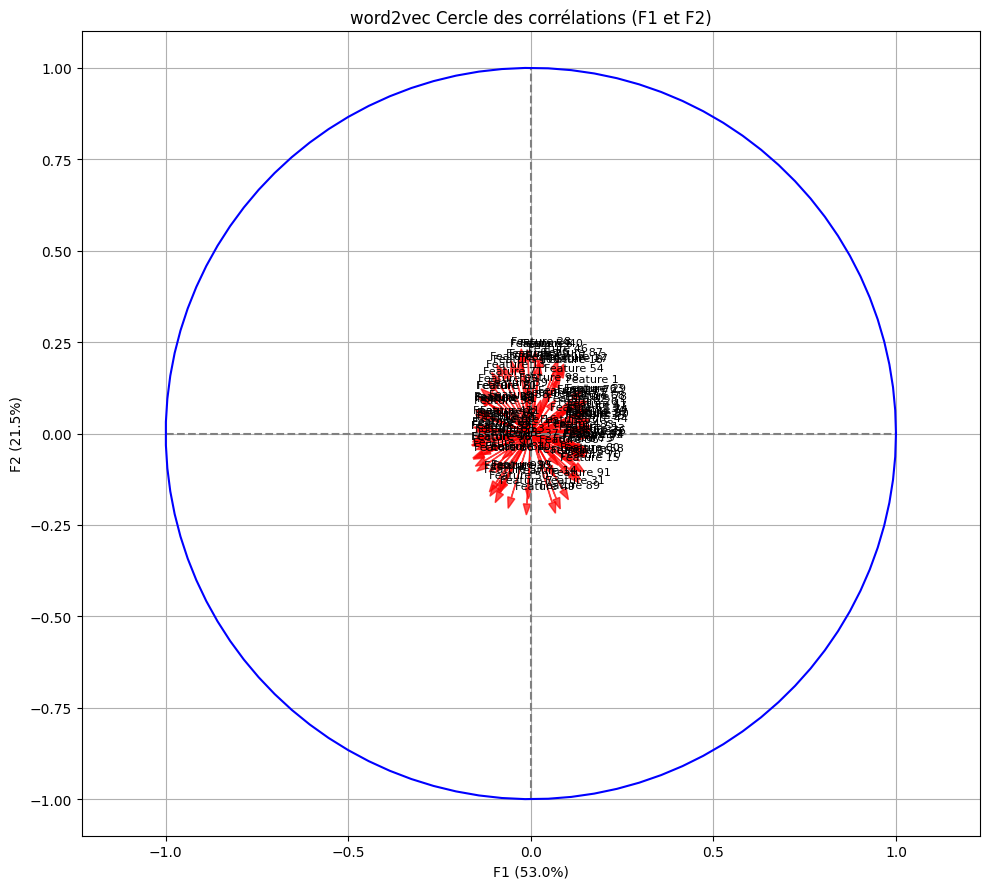

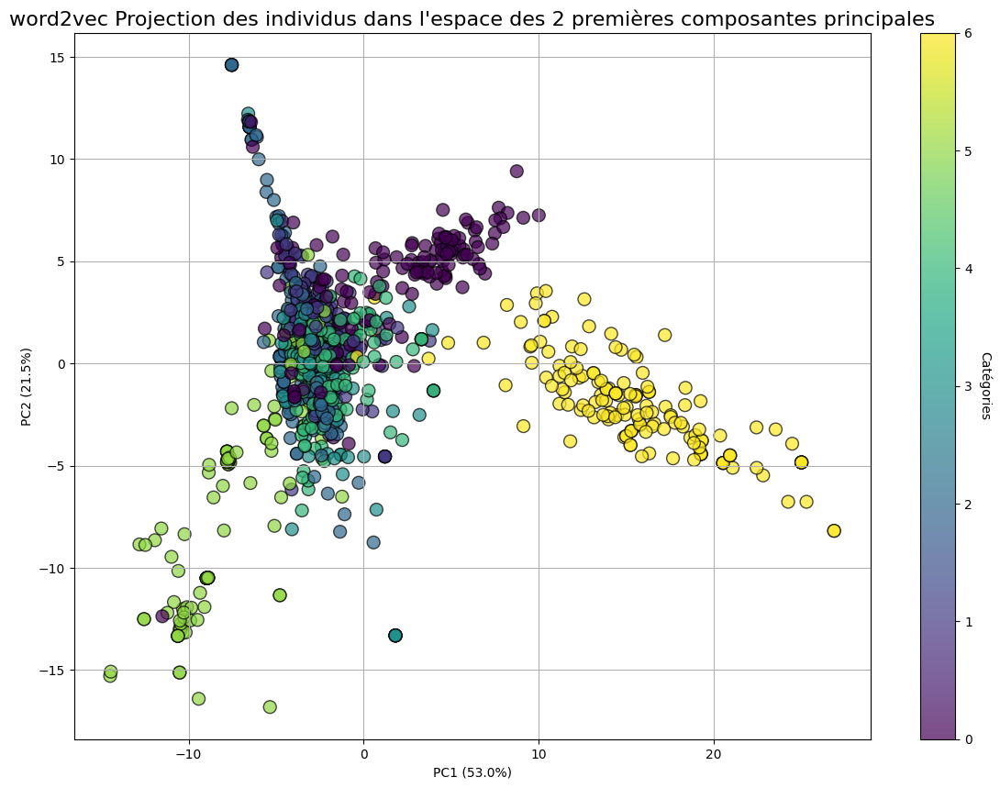

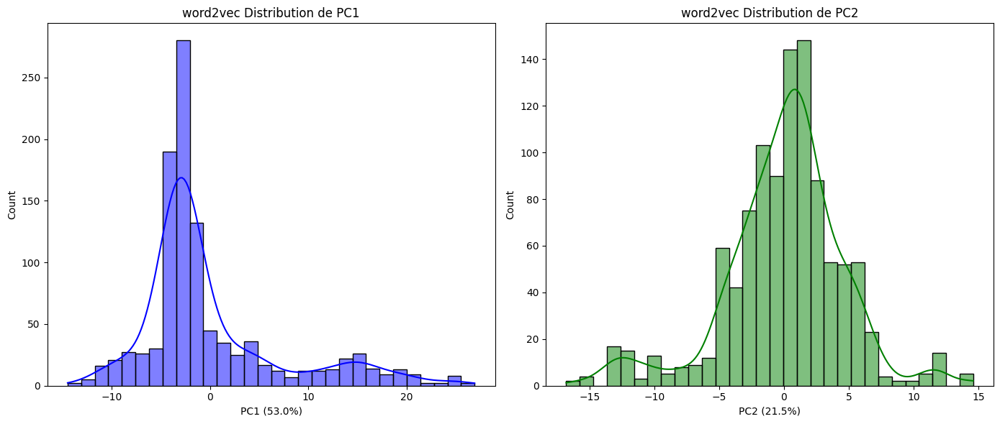

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

#  Calcul des vecteurs moyens pour chaque phrase 
dataset['word2vec_avg'] = dataset['word2vec_vectors'].apply(
    lambda vectors: np.mean(vectors, axis=0) if vectors[0] is not None else np.zeros(100)
)

#  Préparation des données pour l'ACP 
word2vec_avg_matrix = np.array(dataset['word2vec_avg'].tolist())
print("Forme de la matrice Word2Vec :", word2vec_avg_matrix.shape)

#  Standardisation des données 
scaler = StandardScaler()
word2vec_scaled = scaler.fit_transform(word2vec_avg_matrix)
print("Forme des données Word2Vec après standardisation :", word2vec_scaled.shape)

#  Appliquer l'ACP 
n_components = 8  # Nombre de composantes principales
pca = PCA(n_components=n_components)
word2vec_pca = pca.fit_transform(word2vec_scaled)

#  Affichage des résultats de l'ACP 
print("\nVariance expliquée par chaque composante :\n", pca.explained_variance_ratio_)
print("\nComposantes principales (vecteurs propres) :\n", pca.components_)
print("\nword2vec Projection des données dans l'espace des composantes principales (échantillon) :\n", word2vec_pca[:5])

#  Éboulis des valeurs propres (scree plot) 
variance_expliquee = pca.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("word2vec Éboulis des valeurs propres avec cumul des inerties")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

#  Cercle des corrélations 
fig, ax = plt.subplots(figsize=(10, 9))
x, y = 0, 1  # Première et deuxième composante
features = [f"Feature {i+1}" for i in range(pca.components_.shape[1])]

for i in range(pca.components_.shape[1]):
    ax.arrow(0, 0, 
             pca.components_[x, i],  
             pca.components_[y, i],  
             head_width=0.02, 
             head_length=0.03, 
             width=0.001, 
             color='red', alpha=0.7)
    plt.text(pca.components_[x, i] + 0.05, 
             pca.components_[y, i] + 0.05, 
             features[i], 
             color='black', 
             ha='center', 
             va='center', 
             fontsize=8)

# Ajouter le cercle
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')
an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an), color='blue')
plt.xlabel(f'F1 ({round(100 * pca.explained_variance_ratio_[x], 1)}%)')
plt.ylabel(f'F2 ({round(100 * pca.explained_variance_ratio_[y], 1)}%)')
plt.title("word2vec Cercle des corrélations (F1 et F2)")
plt.axis('equal')
plt.grid(True)
plt.tight_layout()
plt.show()

#  Projection des individus 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    word2vec_pca[:, 0], 
    word2vec_pca[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title('word2vec Projection des individus dans l\'espace des 2 premières composantes principales', fontsize=16)
plt.grid(True)
plt.show()

#  Distribution des composantes principales 
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(word2vec_pca[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.title('word2vec Distribution de PC1')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(word2vec_pca[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title('word2vec Distribution de PC2')

plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.1751


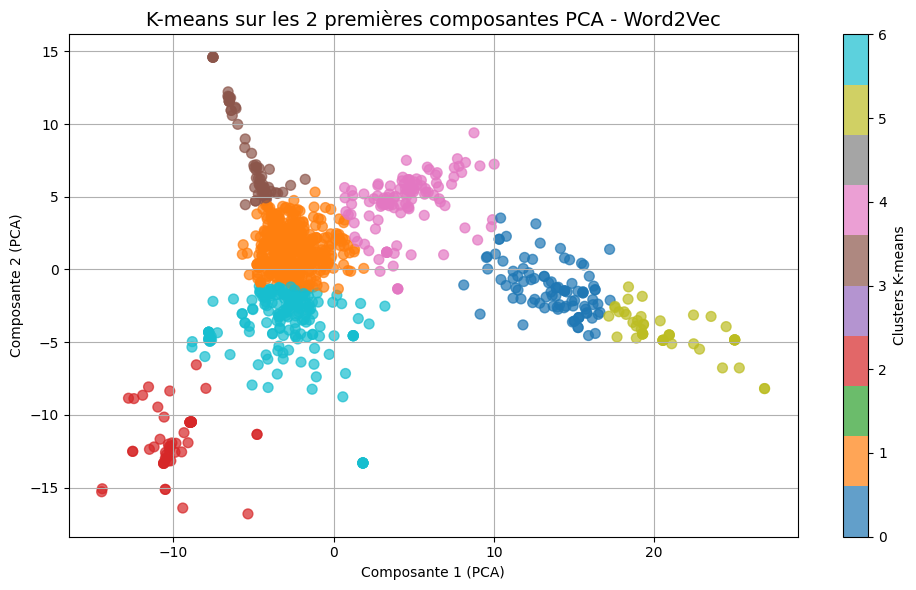

In [ ]:
#  Importation des bibliothèques nécessaires 
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means 
# Initialisation du modèle K-means avec des paramètres optimisés
kmeans = KMeans(
    n_clusters=7,        # Nombre de clusters correspondant aux catégories
    random_state=42,     # Reproductibilité
    n_init=20,           # Plus d'initialisations pour éviter les minima locaux
    max_iter=500,        # Augmenter le nombre d'itérations pour une convergence stable
    tol=1e-4             # Tolérance pour convergence
)

# Appliquer K-means sur les 2 premières composantes principales
kmeans_labels = kmeans.fit_predict(word2vec_pca[:, :2])

#  Calcul de l'ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(10, 6))
plt.scatter(
    word2vec_pca[:, 0],  # Composante principale 1
    word2vec_pca[:, 1],  # Composante principale 2
    c=kmeans_labels,     # Couleur des points selon les clusters prédits
    cmap='tab10',        # Palette de couleurs
    alpha=0.7,           # Transparence des points
    s=50                 # Taille des points
)
plt.colorbar(label="Clusters K-means")
plt.xlabel("Composante 1 (PCA)")
plt.ylabel("Composante 2 (PCA)")
plt.title("K-means sur les 2 premières composantes PCA - Word2Vec", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red"> t-SNE (t-distributed Stochastic Neighbor Embedding)</span>

Forme de la matrice Word2Vec : (1050, 100)
Forme des données Word2Vec après standardisation : (1050, 100)


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Forme des données après t-SNE : (1050, 2)


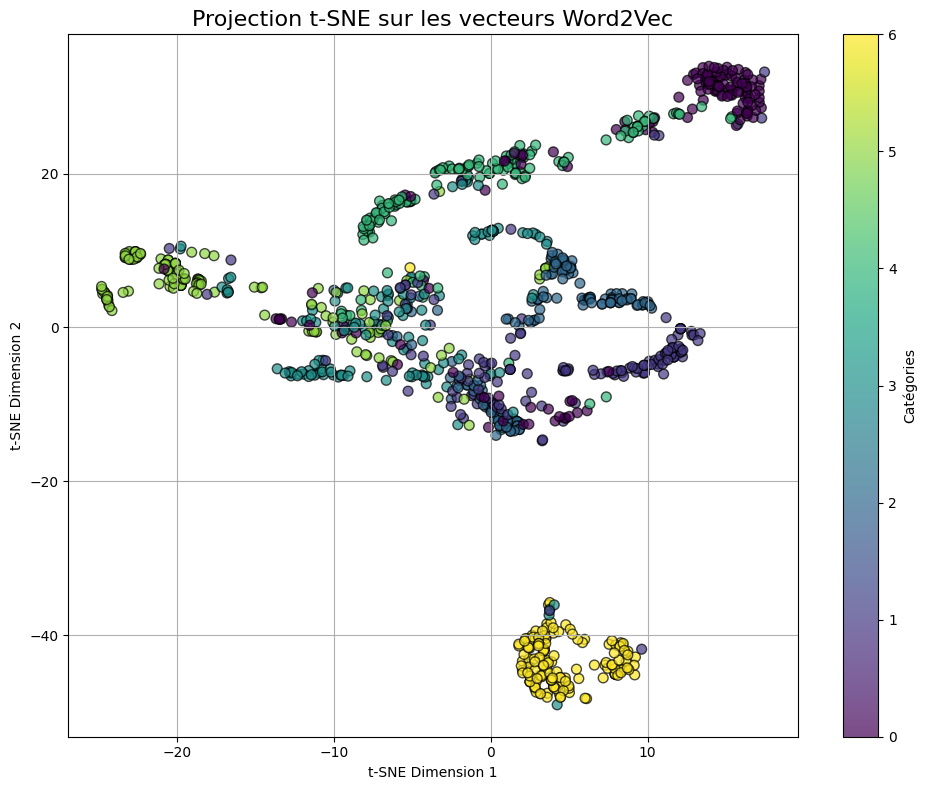

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

#  Conversion des vecteurs Word2Vec en matrice 
# Suppression des entrées vides dans 'word2vec_vectors'
word2vec_data = dataset['word2vec_vectors'].apply(lambda x: np.mean(x, axis=0) if x[0] is not None else np.zeros(100))
word2vec_matrix = np.vstack(word2vec_data)

print("Forme de la matrice Word2Vec :", word2vec_matrix.shape)

#  Standardisation des données 
scaler = StandardScaler()
word2vec_scaled = scaler.fit_transform(word2vec_matrix)

print("Forme des données Word2Vec après standardisation :", word2vec_scaled.shape)

#  Appliquer le t-SNE avec des hyperparamètres optimisés 
tsne = TSNE(
    n_components=2, 
    random_state=42, 
    perplexity=50,      # Augmenté pour une meilleure capture des relations globales
    n_iter=3000,        # Plus d'itérations pour stabiliser l'optimisation
    learning_rate=200,  # Ajusté pour éviter des déplacements trop brusques
    metric='cosine',    # Mesure de distance plus adaptée aux Word2Vec
    init='pca'          # Accélération de la convergence et meilleure initialisation
)

word2vec_tsne = tsne.fit_transform(word2vec_scaled)

print("Forme des données après t-SNE :", word2vec_tsne.shape)

#  Visualisation 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    word2vec_tsne[:, 0], 
    word2vec_tsne[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.7, 
    s=50, 
    edgecolor='k'
)
plt.colorbar(label='Catégories')
plt.title('Projection t-SNE sur les vecteurs Word2Vec', fontsize=16)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.4277


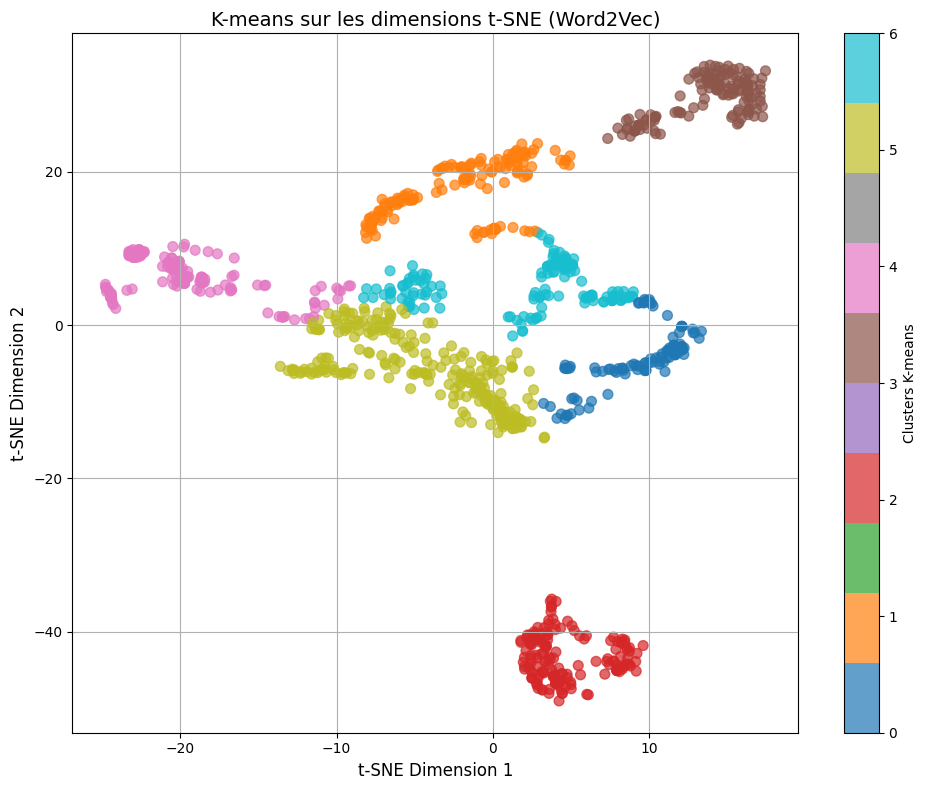

In [ ]:
#  Importation des bibliothèques nécessaires 
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Paramètres 
n_clusters = 7  # Nombre de clusters

#  Appliquer K-means 
# `word2vec_tsne` est la matrice 2D obtenue après réduction avec t-SNE sur les vecteurs Word2Vec
kmeans = KMeans(n_clusters=n_clusters, random_state=42)  # Initialisation de K-means
kmeans_labels = kmeans.fit_predict(word2vec_tsne)  # Appliquer K-means sur t-SNE des Word2Vec

#  Calcul de l'ARI 
# Comparer les clusters K-means aux catégories réelles
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters prédits 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    word2vec_tsne[:, 0],  # Dimension 1 de t-SNE
    word2vec_tsne[:, 1],  # Dimension 2 de t-SNE
    c=kmeans_labels,  # Couleurs des points selon les clusters prédits
    cmap='tab10',
    alpha=0.7,
    s=50
)

# Ajouter une barre de couleurs
plt.colorbar(label='Clusters K-means')

# Ajouter un titre et des étiquettes
plt.title('K-means sur les dimensions t-SNE (Word2Vec)', fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=12)
plt.ylabel('t-SNE Dimension 2', fontsize=12)

# Ajouter une grille
plt.grid(True)

# Ajuster l'affichage
plt.tight_layout()

# Afficher le graphique
plt.show()


##### <span style="color:red">Truncated SVD (Singular Value Decomposition)</span>

Forme de la matrice Word2Vec : (1050, 100)
Standardisation de la matrice Word2Vec...
Standardisation terminée.
Forme des données Word2Vec après standardisation : (1050, 100)
Réduction de dimension avec Truncated SVD...
Réduction terminée.
Forme des données après Truncated SVD : (1050, 50)
Variance expliquée par chaque composante : [5.29800587e-01 2.14846947e-01 1.37604916e-01 5.50700395e-02
 1.91275991e-02 1.27204078e-02 6.91228040e-03 6.11839978e-03
 5.46298028e-03 3.40845067e-03 2.80589300e-03 1.82111527e-03
 9.06292376e-04 7.65706341e-04 6.00152103e-04 3.87907465e-04
 3.22108596e-04 2.53838453e-04 2.06285001e-04 1.27186415e-04
 9.94903425e-05 9.09035421e-05 6.92666222e-05 4.47339851e-05
 4.18822884e-05 3.57555765e-05 3.09082109e-05 2.53899921e-05
 2.27352697e-05 2.03795753e-05 1.83538430e-05 1.69644842e-05
 1.57019981e-05 1.38526943e-05 1.31336393e-05 1.21500097e-05
 1.04717766e-05 1.02607729e-05 8.47915882e-06 8.09329406e-06
 7.17567680e-06 6.67650273e-06 6.55192128e-06 5.78423634e

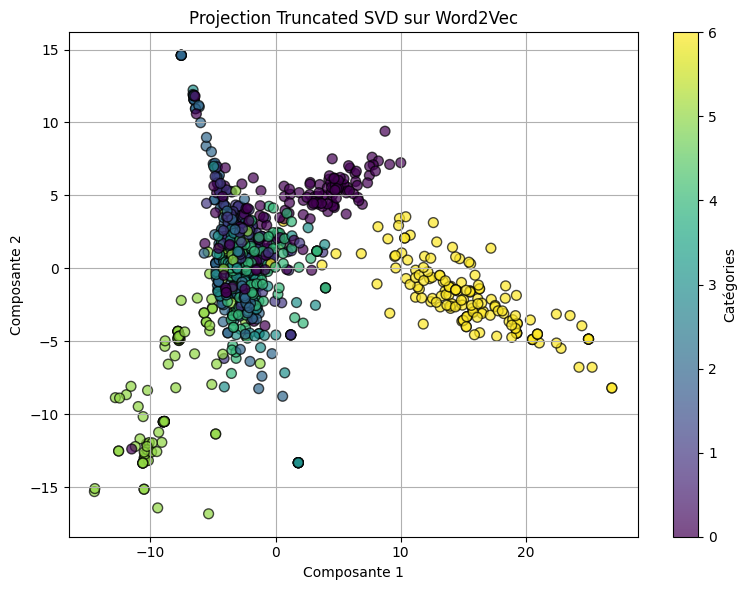

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

#  Conversion des vecteurs Word2Vec en matrice 
word2vec_matrix = dataset['word2vec_vectors'].apply(lambda x: np.mean(x, axis=0) if x[0] is not None else np.zeros(100))
word2vec_matrix = np.vstack(word2vec_matrix)

print("Forme de la matrice Word2Vec :", word2vec_matrix.shape)

#  Standardisation de la matrice Word2Vec 
print("Standardisation de la matrice Word2Vec...")
scaler = StandardScaler()
word2vec_scaled = scaler.fit_transform(word2vec_matrix)
print("Standardisation terminée.")
print("Forme des données Word2Vec après standardisation :", word2vec_scaled.shape)

# Réduction avec Truncated SVD
print("Réduction de dimension avec Truncated SVD...")
svd = TruncatedSVD(n_components=50, random_state=42)  # Réduction à 50 dimensions
X_svd = svd.fit_transform(word2vec_scaled)
print("Réduction terminée.")
print("Forme des données après Truncated SVD :", X_svd.shape)

#  Variance expliquée 
print("Variance expliquée par chaque composante :", svd.explained_variance_ratio_)
print("Variance cumulée :", svd.explained_variance_ratio_.cumsum())

#  Visualisation des résultats 
plt.figure(figsize=(8, 6))
plt.scatter(
    X_svd[:, 0], 
    X_svd[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.7, 
    s=50, 
    edgecolor='k'
)
plt.colorbar(label="Catégories")
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
plt.title("Projection Truncated SVD sur Word2Vec")
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.1751


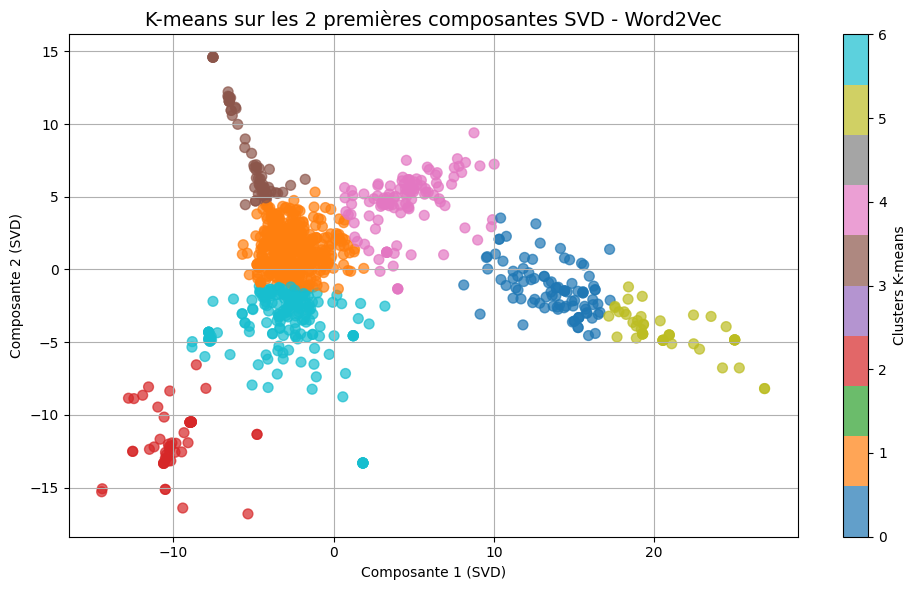

In [ ]:
# Importation des bibliothèques nécessaires
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Application de K-means
# Initialisation du modèle K-means avec des paramètres optimisés
kmeans = KMeans(
    n_clusters=7,        # Nombre de clusters correspondant aux catégories
    random_state=42,     # Reproductibilité
    n_init=20,           # Plus d'initialisations pour éviter les minima locaux
    max_iter=500,        # Augmenter le nombre d'itérations pour une convergence stable
    tol=1e-4             # Tolérance pour convergence
)

# Appliquer K-means sur les 2 premières composantes SVD
kmeans_labels = kmeans.fit_predict(X_svd[:, :2])

# Calcul de l'ARI
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(10, 6))
plt.scatter(
    X_svd[:, 0],  # Composante principale 1
    X_svd[:, 1],  # Composante principale 2
    c=kmeans_labels,     # Couleur des points selon les clusters prédits
    cmap='tab10',        # Palette de couleurs
    alpha=0.7,           # Transparence des points
    s=50                 # Taille des points
)
plt.colorbar(label="Clusters K-means")
plt.xlabel("Composante 1 (SVD)")
plt.ylabel("Composante 2 (SVD)")
plt.title("K-means sur les 2 premières composantes SVD - Word2Vec", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:green">UMAP - Uniform Manifold Approximation and Projection.</span>

C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


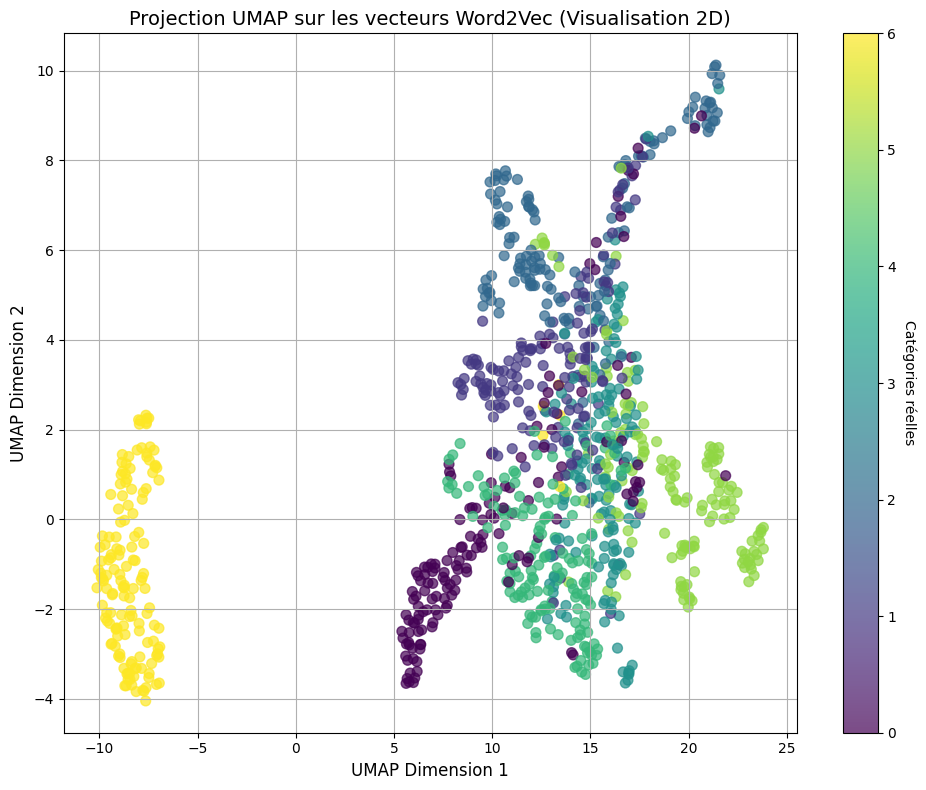

In [ ]:
#  Importation des bibliothèques nécessaires 
import umap
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt

#  Préparation des données 
# Standardisation des vecteurs Word2Vec
scaler = StandardScaler()
word2vec_scaled = scaler.fit_transform(dataset['word2vec_vectors'].apply(
    lambda x: np.mean(x, axis=0) if x[0] is not None else np.zeros(100)
).tolist())

#  Application d'UMAP 
# Initialisation du modèle UMAP avec les paramètres optimisés
umap_reducer = umap.UMAP(n_neighbors=70, min_dist=0.8, n_components=2, random_state=42)

# Réduction des dimensions avec UMAP
word2vec_umap = umap_reducer.fit_transform(word2vec_scaled)

#  Visualisation 2D des résultats UMAP 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    word2vec_umap[:, 0],  # Première dimension UMAP
    word2vec_umap[:, 1],  # Deuxième dimension UMAP
    c=dataset['label_category'].astype('category').cat.codes,  # Couleurs selon les catégories réelles
    cmap='viridis',  # Palette de couleurs
    alpha=0.7,  # Transparence des points
    s=50  # Taille des points
)

# Ajout d'une barre de couleurs
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories réelles', rotation=270, labelpad=15)

# Titres et étiquettes
plt.title("Projection UMAP sur les vecteurs Word2Vec (Visualisation 2D)", fontsize=14)
plt.xlabel("UMAP Dimension 1", fontsize=12)
plt.ylabel("UMAP Dimension 2", fontsize=12)

# Ajout d'une grille et ajustement du layout
plt.grid(True)
plt.tight_layout()

# Affichage du graphique
plt.show()


##### <span style="color:green">K-Means sur UMAP</span>

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.3863


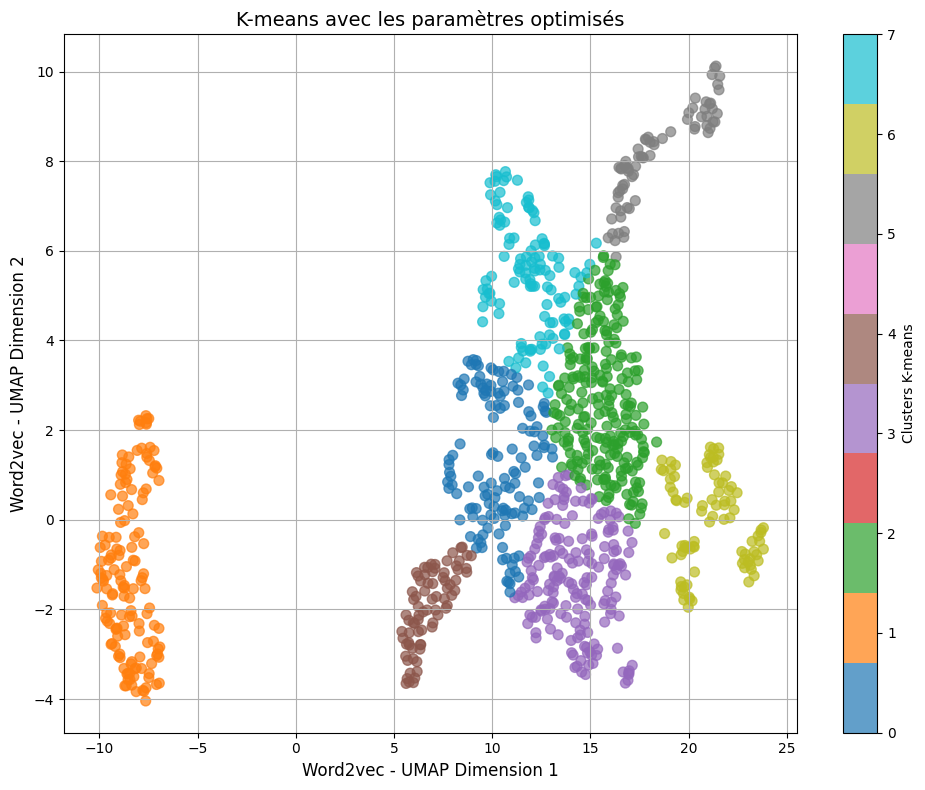

In [ ]:
#  Importation des bibliothèques nécessaires 
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means
# Initialisation du modèle K-means avec les paramètres optimisés
kmeans = KMeans(n_clusters=8, random_state=42)  # 8 clusters

# Appliquer K-means sur les données UMAP réduites
kmeans_labels = kmeans.fit_predict(word2vec_umap)

# Calcul de l'ARI
# Comparer les étiquettes réelles avec celles prédites par K-means
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)

# Afficher le score ARI
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(10, 8))

# Affichage des points UMAP colorés selon les clusters prédits
scatter = plt.scatter(
    word2vec_umap[:, 0],  # Dimension 1 de UMAP
    word2vec_umap[:, 1],  # Dimension 2 de UMAP
    c=kmeans_labels,  # Couleur des points selon les clusters prédits
    cmap='tab10',  # Palette de couleurs
    alpha=0.7,  # Transparence des points
    s=50  # Taille des points
)

# Ajouter une barre de couleurs pour indiquer les clusters
plt.colorbar(label='Clusters K-means')

# Ajouter un titre au graphique
plt.title('K-means avec les paramètres optimisés', fontsize=14)

# Ajouter des étiquettes pour les axes
plt.xlabel('Word2vec - UMAP Dimension 1', fontsize=12)
plt.ylabel('Word2vec - UMAP Dimension 2', fontsize=12)

# Ajouter une grille pour faciliter la lecture
plt.grid(True)

# Ajuster automatiquement les marges pour éviter le chevauchement
plt.tight_layout()

# Afficher le graphique
plt.show()


#### <span style="color:red">Autoencoder</span>

Epoch 1/200
7/7 [==============================] - 2s 55ms/step - loss: 1.5759 - val_loss: 0.4596 - lr: 5.0000e-04
Epoch 2/200
7/7 [==============================] - 0s 11ms/step - loss: 1.0594 - val_loss: 0.4486 - lr: 5.0000e-04
Epoch 3/200
7/7 [==============================] - 0s 10ms/step - loss: 0.7426 - val_loss: 0.4362 - lr: 5.0000e-04
Epoch 4/200
7/7 [==============================] - 0s 9ms/step - loss: 0.5501 - val_loss: 0.4228 - lr: 5.0000e-04
Epoch 5/200
7/7 [==============================] - 0s 9ms/step - loss: 0.4480 - val_loss: 0.4106 - lr: 5.0000e-04
Epoch 6/200
7/7 [==============================] - 0s 11ms/step - loss: 0.4071 - val_loss: 0.4038 - lr: 5.0000e-04
Epoch 7/200
7/7 [==============================] - 0s 12ms/step - loss: 0.3615 - val_loss: 0.3978 - lr: 5.0000e-04
Epoch 8/200
7/7 [==============================] - 0s 10ms/step - loss: 0.3345 - val_loss: 0.3914 - lr: 5.0000e-04
Epoch 9/200
7/7 [==============================] - 0s 14ms/step - loss: 0.3008 - v

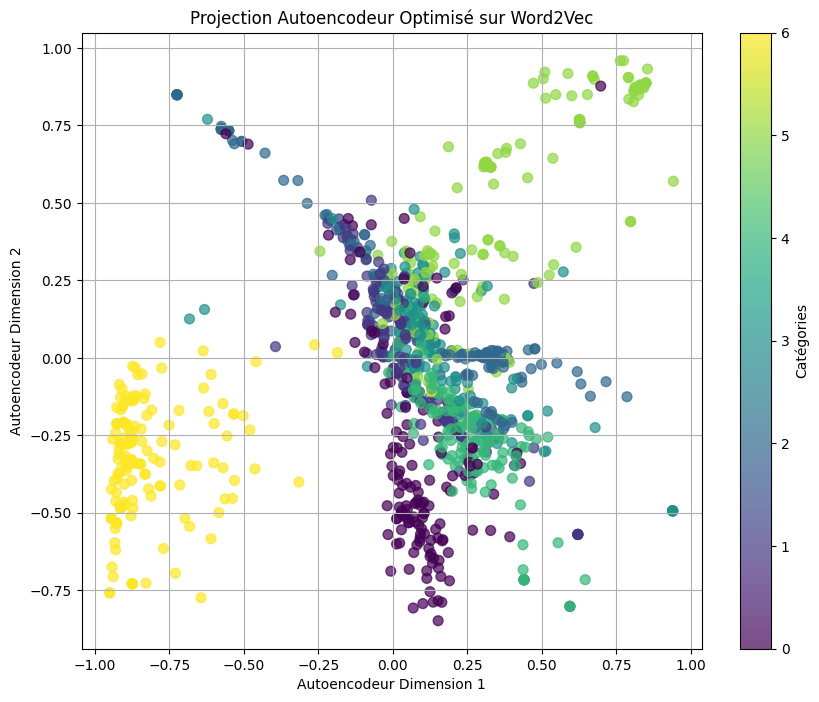

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Prétraitement des données Word2Vec
word2vec_matrix = np.array(dataset['word2vec_vectors'].apply(
    lambda x: np.mean([vec for vec in x if vec is not None], axis=0) if x and all(v is not None for v in x) else np.zeros(100)
).tolist())

# Standardisation des données
scaler = StandardScaler()
word2vec_scaled = scaler.fit_transform(word2vec_matrix)

#  Construction de l'autoencodeur optimisé 
input_dim = word2vec_scaled.shape[1]
encoding_dim = 2  # Dimension réduite

input_layer = Input(shape=(input_dim,))

#  Encodeur 
encoded = Dense(256)(input_layer)
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU(alpha=0.2)(encoded)
encoded = Dropout(0.3)(encoded)

encoded = Dense(128)(encoded)
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU(alpha=0.2)(encoded)

encoded = Dense(64)(encoded)
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU(alpha=0.2)(encoded)

encoded_output = Dense(encoding_dim, activation='tanh')(encoded)  # Activation pour capturer des variations subtiles

#  Décodeur
decoded = Dense(64)(encoded_output)
decoded = BatchNormalization()(decoded)
decoded = LeakyReLU(alpha=0.2)(decoded)

decoded = Dense(128)(decoded)
decoded = BatchNormalization()(decoded)
decoded = LeakyReLU(alpha=0.2)(decoded)
decoded = Dropout(0.3)(decoded)

decoded = Dense(256)(decoded)
decoded = BatchNormalization()(decoded)
decoded = LeakyReLU(alpha=0.2)(decoded)

decoded_output = Dense(input_dim, activation='linear')(decoded)  # Activation linéaire pour reconstruction

#  Modèles
autoencoder = Model(inputs=input_layer, outputs=decoded_output)
encoder = Model(inputs=input_layer, outputs=encoded_output)

#  Compilation avec Adam (learning rate réduit) 
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005), loss='mse')

#  Early Stopping et Réduction du Learning Rate si pas d’amélioration 
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

#  Entraînement optimisé 
autoencoder.fit(
    word2vec_scaled, word2vec_scaled,
    epochs=200,  # Plus d’époques pour une meilleure convergence
    batch_size=128,  # Taille de batch augmentée pour plus de stabilité
    shuffle=True,
    validation_split=0.2,
    verbose=1,
    callbacks=[early_stopping, reduce_lr]  # Réduction du LR pour meilleure convergence
)

#  Extraction des données compressées 
compressed_word2vec = encoder.predict(word2vec_scaled)

#  Visualisation des données compressées 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    compressed_word2vec[:, 0],
    compressed_word2vec[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    alpha=0.7,
    s=50
)
plt.colorbar(label='Catégories')
plt.title("Projection Autoencodeur Optimisé sur Word2Vec")
plt.xlabel("Autoencodeur Dimension 1")
plt.ylabel("Autoencodeur Dimension 2")
plt.grid(True)
plt.show()


Le graphique illustre une projection des données Word2Vec compressées à l'aide d'un autoencodeur optimisé. La séparation des catégories est plus nette, avec des regroupements distincts pour certaines classes (par exemple, les points jaunes). Cependant, des chevauchements restent visibles pour d'autres catégories, reflétant des similitudes structurelles dans les données ou des limites dans la représentation compressée.

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2771


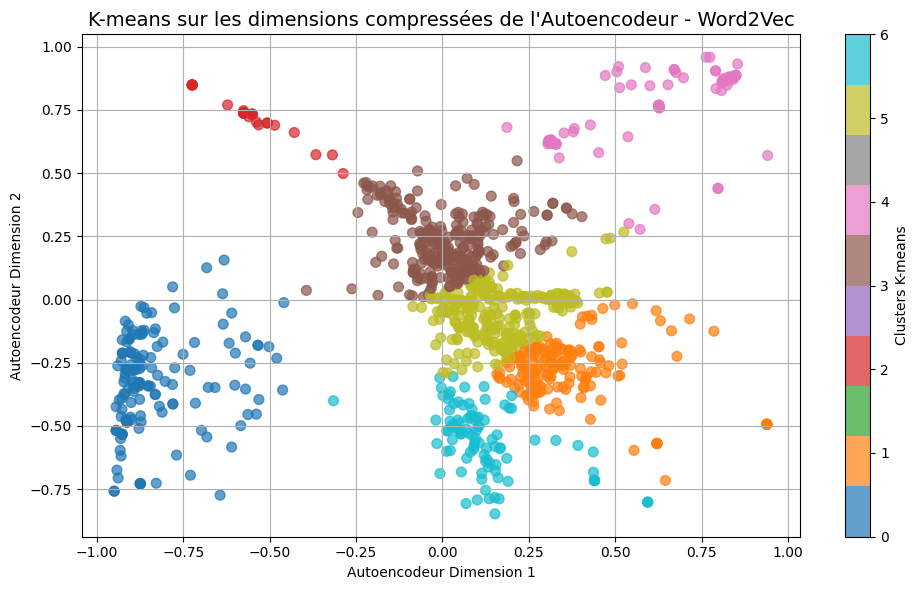

In [ ]:
#  Importation des bibliothèques nécessaires 
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means ---
# Initialisation du modèle K-means avec des paramètres optimisés
kmeans = KMeans(
    n_clusters=7,        # Nombre de clusters correspondant aux catégories
    random_state=42,     # Reproductibilité
    n_init=20,           # Plus d'initialisations pour éviter les minima locaux
    max_iter=500,        # Augmenter le nombre d'itérations pour une convergence stable
    tol=1e-4             # Tolérance pour convergence
)

# Appliquer K-means sur les 2 premières dimensions compressées de l'autoencodeur
kmeans_labels = kmeans.fit_predict(compressed_word2vec)

#  Calcul de l'ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(10, 6))
plt.scatter(
    compressed_word2vec[:, 0],  # Dimension 1
    compressed_word2vec[:, 1],  # Dimension 2
    c=kmeans_labels,     # Couleur des points selon les clusters prédits
    cmap='tab10',        # Palette de couleurs
    alpha=0.7,           # Transparence des points
    s=50                 # Taille des points
)
plt.colorbar(label="Clusters K-means")
plt.xlabel("Autoencodeur Dimension 1")
plt.ylabel("Autoencodeur Dimension 2")
plt.title("K-means sur les dimensions compressées de l'Autoencodeur - Word2Vec", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()


## Faisabilité | Bidirectional|Encoder|Representations from Transformers: <span style="color:red">"BERT_EMBBEDING"</span>

Un score ARI de 0.343 indique une correspondance partielle entre les clusters générés par K-Means et les catégories réelles.

##### <span style="color:red">Analyse en Composante Principale</span>

Forme initiale des embeddings BERT : (1050, 768)
Forme des données BERT après standardisation : (1050, 768)

Variance expliquée par chaque composante :
 [0.13920543 0.07940868 0.06732197 0.05452525 0.04185326 0.03606556
 0.030436   0.02480215 0.02003204 0.0161202  0.01540814 0.0146441
 0.01380721 0.0129786  0.01274119 0.01121822 0.01035313 0.00991025
 0.00889811 0.00816424]

Composantes principales (vecteurs propres) :
 [[ 0.02692946  0.03861849  0.00873671 ...  0.00808684  0.03489782
   0.03702976]
 [ 0.02908702  0.01398852  0.04780199 ...  0.03872172 -0.04070523
  -0.0088597 ]]

Projection des données dans l'espace des composantes principales (échantillon) :
 [[-1.45654793e+01 -8.88840854e-01  7.56473875e+00 -1.63733268e+00
   3.19796062e+00  2.56009489e-01 -8.06310368e+00 -3.68741107e+00
   1.21768975e+00 -2.86648655e+00 -1.42929065e+00 -5.83443880e+00
  -2.65070510e+00 -7.14171827e-01 -3.37162971e+00 -7.55986881e+00
  -7.94756174e+00  3.53877592e+00 -1.22430110e+00  4.61626530e+00]

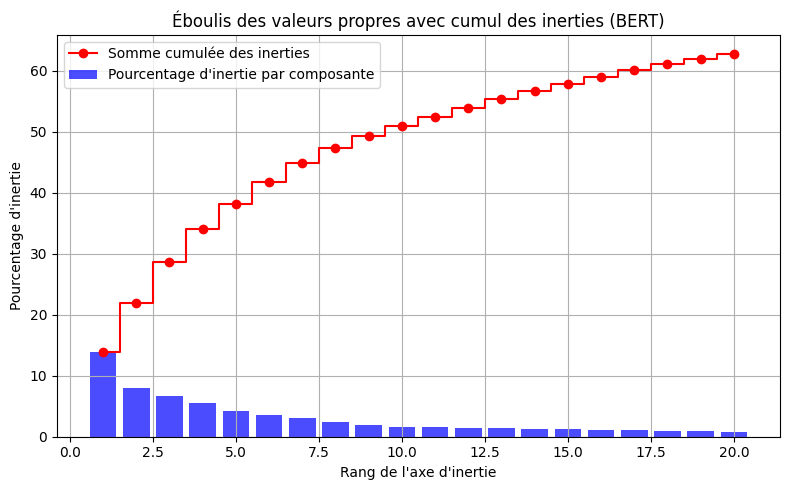

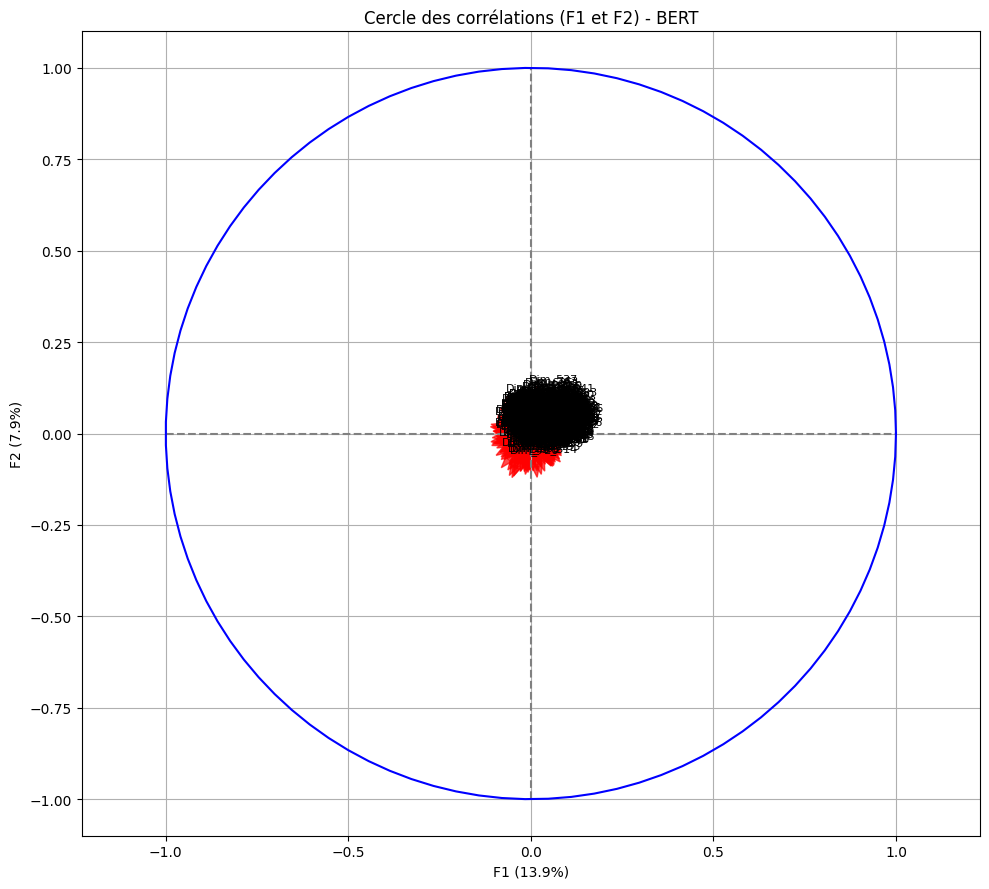

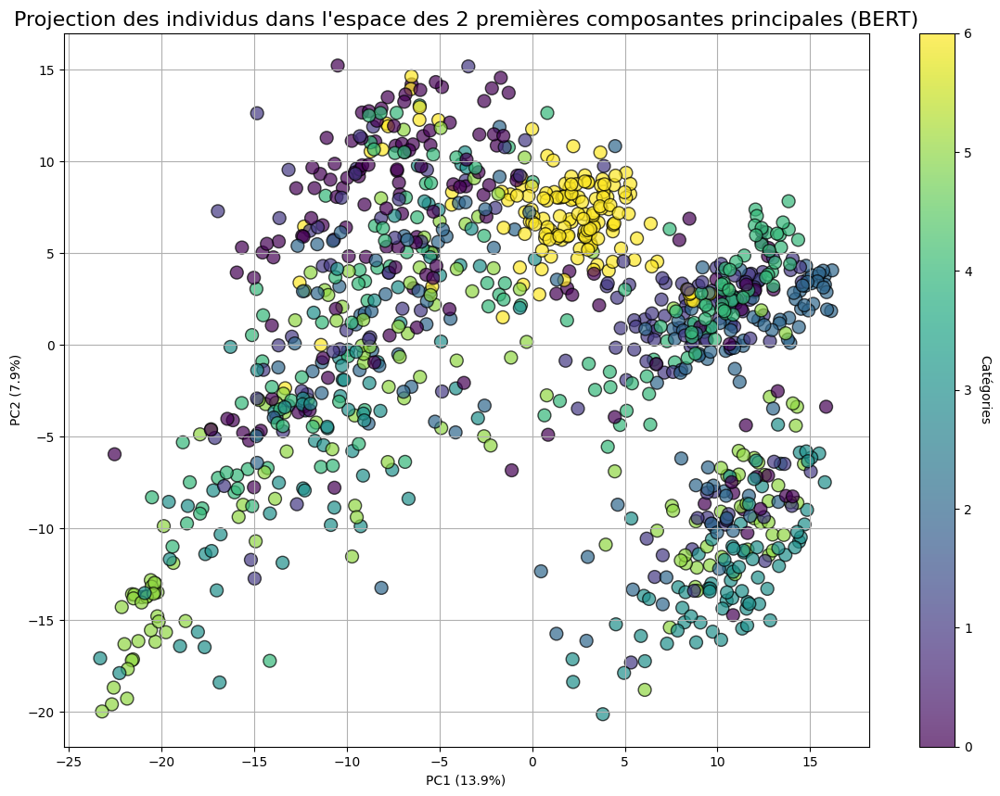

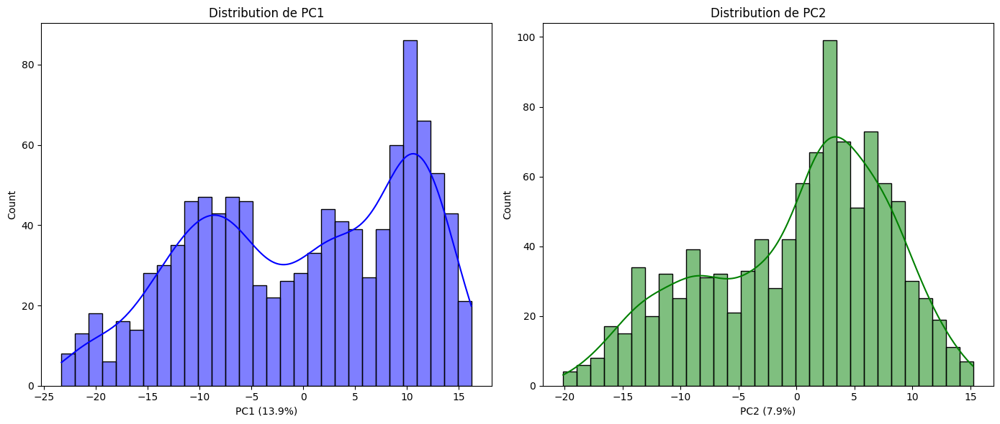

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

#  Conversion de la colonne 'bert_embeddings' en tableau NumPy 
embeddings = np.array(dataset['bert_embeddings'].tolist())

# Vérification de la forme des embeddings
print(f"Forme initiale des embeddings BERT : {embeddings.shape}")

#  Standardisation des données 
scaler = StandardScaler()
bert_scaled = scaler.fit_transform(embeddings)
print(f"Forme des données BERT après standardisation : {bert_scaled.shape}")

#  Appliquer l'ACP 
n_components = 20  # Augmentation du nombre de composantes pour capturer plus d'inertie
pca = PCA(n_components=n_components, random_state=42)
bert_pca = pca.fit_transform(bert_scaled)

#  Affichage des résultats de l'ACP 
print("\nVariance expliquée par chaque composante :\n", pca.explained_variance_ratio_)
print("\nComposantes principales (vecteurs propres) :\n", pca.components_[:2])  # Affichage des deux premières composantes
print("\nProjection des données dans l'espace des composantes principales (échantillon) :\n", bert_pca[:5])

#  Éboulis des valeurs propres (scree plot) 
variance_expliquee = pca.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties (BERT)")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

#  Cercle des corrélations
fig, ax = plt.subplots(figsize=(10, 9))
x, y = 0, 1  # Première et deuxième composante
features = [f"Dim_{i+1}" for i in range(embeddings.shape[1])]

for i in range(min(pca.components_.shape[1], len(features))):  # Limiter au nombre de features
    ax.arrow(0, 0, 
             pca.components_[x, i],  
             pca.components_[y, i],  
             head_width=0.02, 
             head_length=0.03, 
             width=0.001, 
             color='red', alpha=0.7)
    plt.text(pca.components_[x, i] + 0.05, 
             pca.components_[y, i] + 0.05, 
             features[i], 
             color='black', 
             ha='center', 
             va='center', 
             fontsize=8)

# Ajouter le cercle
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')
an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an), color='blue')
plt.xlabel(f'F1 ({round(100 * pca.explained_variance_ratio_[x], 1)}%)')
plt.ylabel(f'F2 ({round(100 * pca.explained_variance_ratio_[y], 1)}%)')
plt.title("Cercle des corrélations (F1 et F2) - BERT")
plt.axis('equal')
plt.grid(True)
plt.tight_layout()
plt.show()

#  Projection des individus 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    bert_pca[:, 0], 
    bert_pca[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title('Projection des individus dans l\'espace des 2 premières composantes principales (BERT)', fontsize=16)
plt.grid(True)
plt.show()

#  Distribution des composantes principales 
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(bert_pca[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.title('Distribution de PC1')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(bert_pca[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title('Distribution de PC2')

plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2624


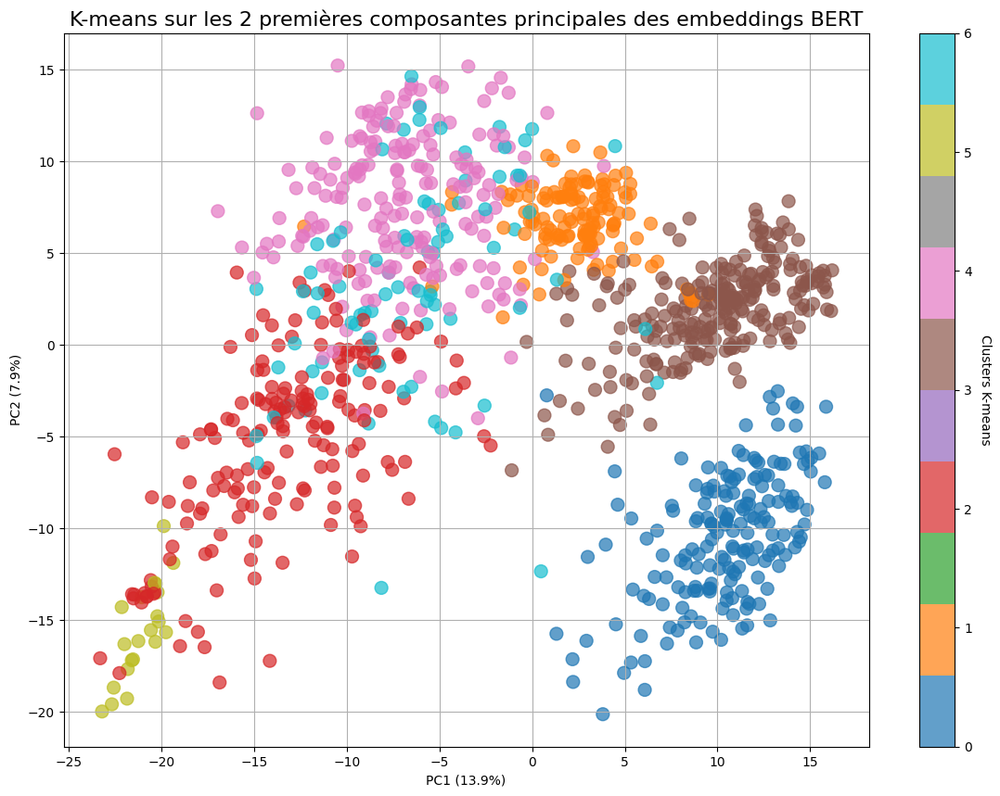

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means optimisé 
n_clusters = 7  # Nombre de clusters correspondant au nombre de catégories réelles
kmeans = KMeans(
    n_clusters=n_clusters,      # Nombre de clusters
    init='k-means++',           # Initialisation avancée des centres
    n_init=10,                  # Nombre d'initialisations différentes
    max_iter=500,               # Nombre maximal d'itérations
    tol=1e-4,                   # Critère de tolérance pour la convergence
    random_state=42             # Reproductibilité des résultats
)

# Appliquer K-means sur les données réduites avec l'ACP
kmeans_labels = kmeans.fit_predict(bert_pca)

#  Calcul du score ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    bert_pca[:, 0], 
    bert_pca[:, 1], 
    c=kmeans_labels,  # Utilisation des clusters K-means pour colorer les points
    cmap='tab10', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title("K-means sur les 2 premières composantes principales des embeddings BERT", fontsize=16)
plt.grid(True)
plt.show()


##### <span style="color:red">t-SNE (t-distributed Stochastic Neighbor Embedding)</span>

C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


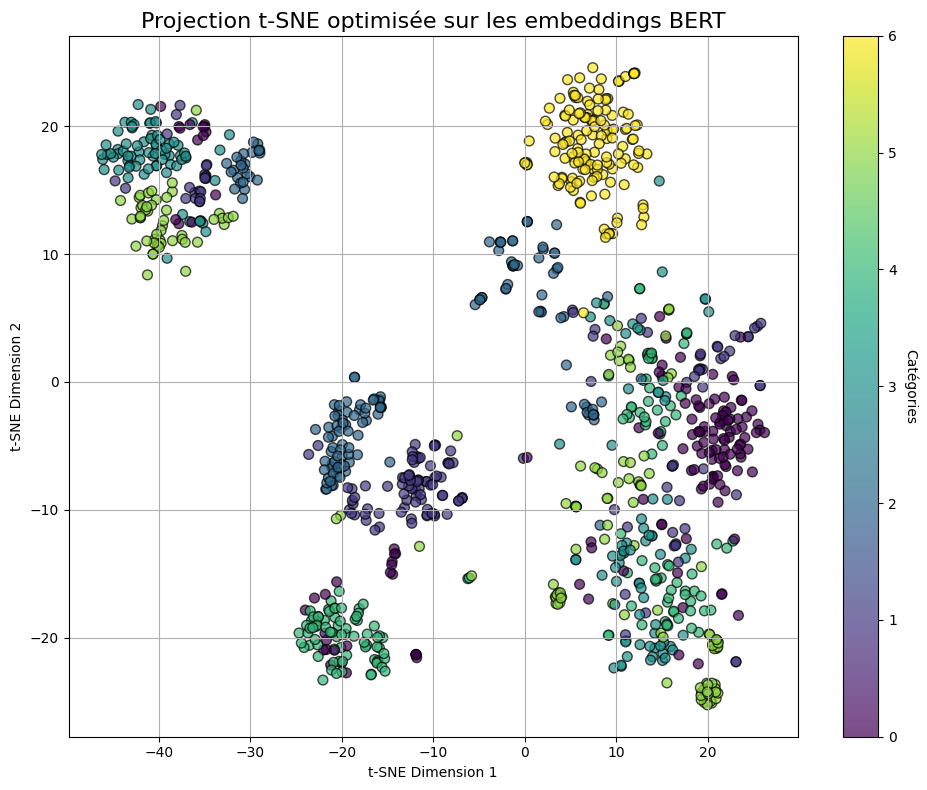

In [ ]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

#  Conversion de la colonne 'bert_embeddings' en tableau NumPy 
embeddings = np.array(dataset['bert_embeddings'].tolist())

# Optimisation et application de t-SNE 
tsne = TSNE(
    n_components=2,         # Réduction à 2 dimensions
    perplexity=50,          # Perplexité augmentée pour capturer un équilibre entre structure locale et globale
    learning_rate=300,      # Taux d'apprentissage ajusté pour des embeddings complexes
    random_state=42,        # Reproductibilité
    n_iter=2000,            # Plus d'itérations pour convergence
    metric='cosine',        # Métrique adaptée pour des vecteurs denses comme BERT
    init='pca',             # Initialisation PCA pour une meilleure séparation initiale
    early_exaggeration=12,  # Accentuation initiale pour séparer les clusters au début
    n_jobs=-1               # Utilisation de tous les cœurs pour accélérer les calculs
)
bert_tsne = tsne.fit_transform(embeddings)

# Ajout des dimensions t-SNE dans le DataFrame
dataset['tsne_dim1'] = bert_tsne[:, 0]
dataset['tsne_dim2'] = bert_tsne[:, 1]

#  Visualisation des résultats t-SNE 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    dataset['tsne_dim1'], 
    dataset['tsne_dim2'], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.7, 
    s=50, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.title('Projection t-SNE optimisée sur les embeddings BERT', fontsize=16)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">K-Means sur t-SNE</span>

Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.3383


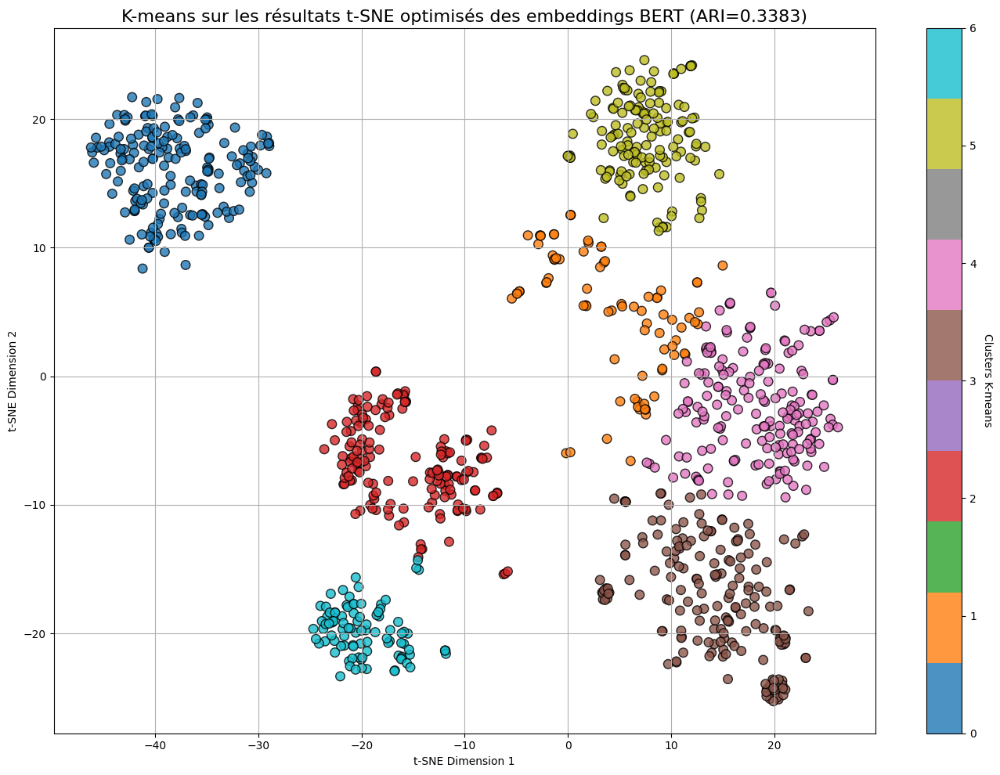

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Hyperparamètres optimisés de K-means 
n_clusters = 7  # Nombre de clusters correspondant aux catégories réelles
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée pour une meilleure convergence
    max_iter=1000,        # Augmentation des itérations pour garantir une convergence stable
    n_init=50,            # Nombre élevé d'initialisations pour éviter les minima locaux
    algorithm='elkan',    # Utilisation de l'algorithme Elkan pour une meilleure efficacité
    random_state=42       # Reproductibilité
)

#  Application de K-means sur les résultats t-SNE 
kmeans_labels = kmeans.fit_predict(bert_tsne)

#  Calcul de l'ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    dataset['tsne_dim1'], 
    dataset['tsne_dim2'], 
    c=kmeans_labels,  # Couleurs basées sur les clusters prédits
    cmap='tab10', 
    alpha=0.8, 
    s=70, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)
plt.title(f"K-means sur les résultats t-SNE optimisés des embeddings BERT (ARI={ari_score:.4f})", fontsize=16)
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">UMAP - Uniform Manifold Approximation and Projection.</span>

C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


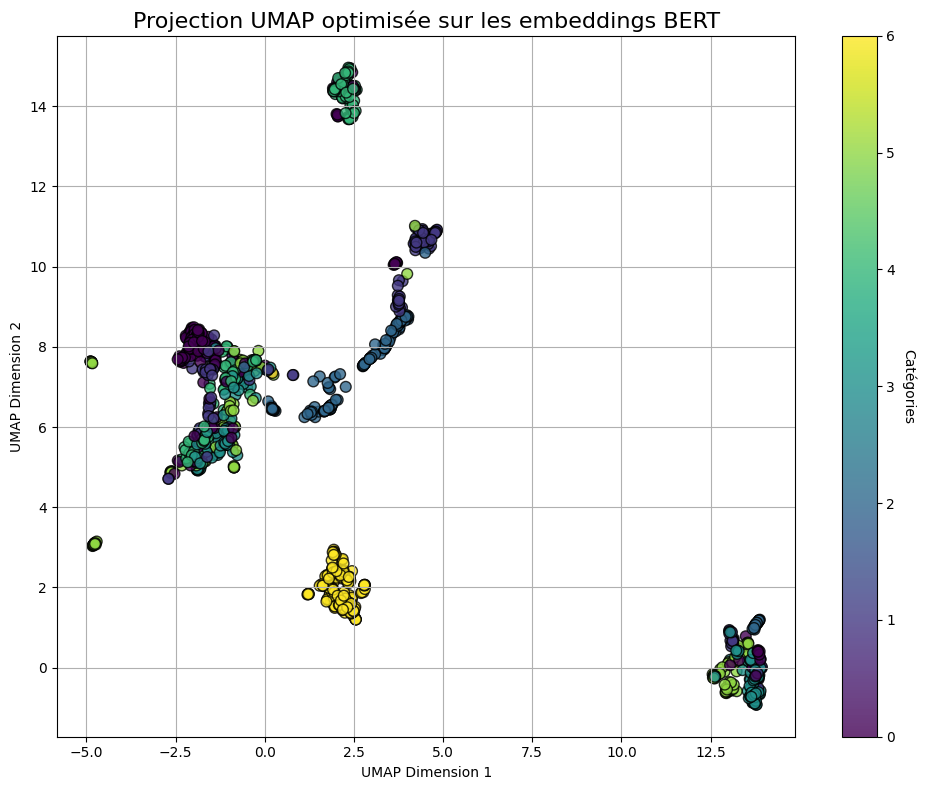

In [ ]:
import numpy as np
import pandas as pd
import umap
import matplotlib.pyplot as plt

#  Conversion de la colonne 'bert_embeddings' en tableau NumPy 
embeddings = np.array(dataset['bert_embeddings'].tolist())

#  Application d'UMAP avec hyperparamètres ajustés 
umap_model = umap.UMAP(
    n_components=2,          # Réduction à 2 dimensions
    n_neighbors=30,          # Augmenté pour capturer davantage de relations globales
    min_dist=0.01,           # Réduit pour favoriser des clusters plus serrés
    metric='cosine',         # Métrique adaptée aux embeddings BERT
    random_state=42,         # Reproductibilité
    spread=1.0,              # Ajustement pour contrôler la dispersion des clusters
    set_op_mix_ratio=1.0     # Plus axé sur des connexions fortes pour une meilleure cohérence locale
)
bert_umap = umap_model.fit_transform(embeddings)

# Ajout des dimensions UMAP dans le DataFrame
dataset['umap_dim1'] = bert_umap[:, 0]
dataset['umap_dim2'] = bert_umap[:, 1]

# Visualisation de la réduction de dimension avec UMAP
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    dataset['umap_dim1'], 
    dataset['umap_dim2'], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.8, 
    s=60, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.title('Projection UMAP optimisée sur les embeddings BERT', fontsize=16)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.3313


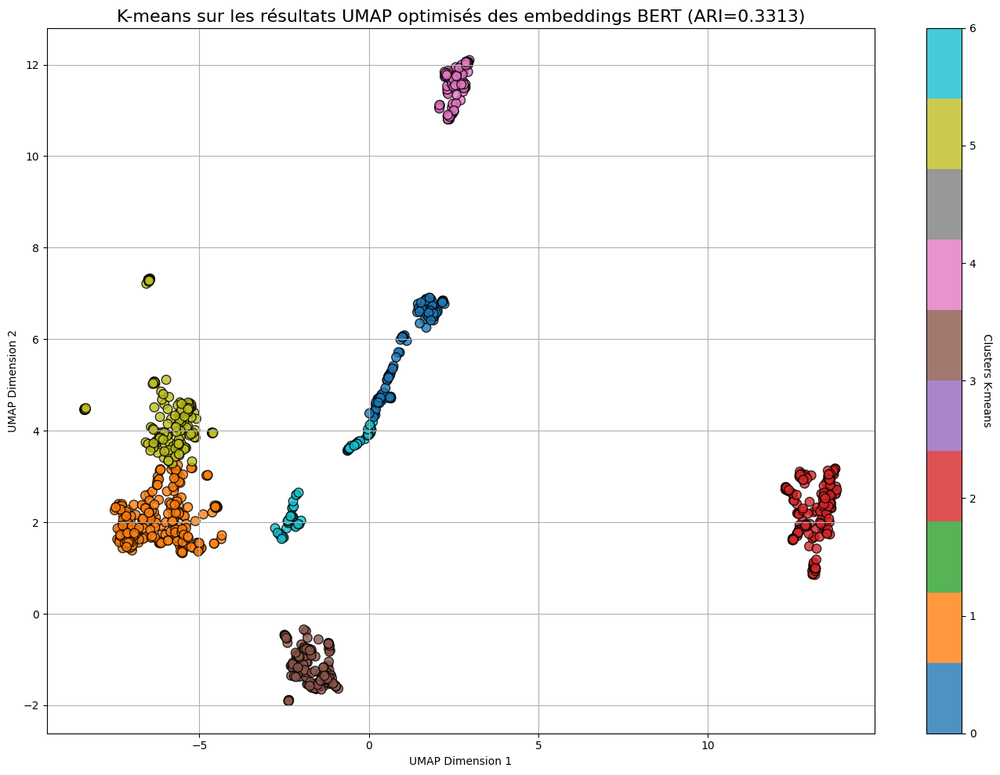

In [ ]:
import numpy as np
import pandas as pd
import umap
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#Conversion de la colonne 'bert_embeddings' en tableau NumPy 
embeddings = np.array(dataset['bert_embeddings'].tolist())

# Application d'UMAP avec hyperparamètres optimisés
umap_model = umap.UMAP(
    n_components=2, 
    n_neighbors=25,          # Capture des structures globales avec une balance entre local/global
    min_dist=0.01,           # Clusters plus denses
    metric='cosine',         # Métrique adaptée aux embeddings
    random_state=42
)
bert_umap = umap_model.fit_transform(embeddings)

# Ajout des dimensions UMAP dans le DataFrame 
dataset['umap_dim1'] = bert_umap[:, 0]
dataset['umap_dim2'] = bert_umap[:, 1]

# Application de K-means avec hyperparamètres optimisés 
n_clusters = 7  # Nombre de clusters correspondant aux catégories réelles
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée
    max_iter=500,         # Plus d'itérations pour une convergence stable
    n_init=50,            # Augmentation des initialisations pour éviter les minima locaux
    random_state=42       # Reproductibilité
)
kmeans_labels = kmeans.fit_predict(bert_umap)

#  Calcul de l'ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    dataset['umap_dim1'], 
    dataset['umap_dim2'], 
    c=kmeans_labels,  # Couleurs basées sur les clusters prédits
    cmap='tab10', 
    alpha=0.8, 
    s=70, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)
plt.title(f"K-means sur les résultats UMAP optimisés des embeddings BERT (ARI={ari_score:.4f})", fontsize=16)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">Truncated SVD (Singular Value Decomposition)</span>

Forme de la matrice BERT : (1050, 768)
Standardisation de la matrice BERT...
Standardisation terminée.
Forme des données BERT après standardisation : (1050, 768)
Réduction de dimension avec Truncated SVD...
✅ Réduction terminée.
Forme des données après Truncated SVD : (1050, 50)

Variance expliquée par chaque composante : [0.13920547 0.0794087  0.06732207 0.05452524 0.04185331 0.03606557
 0.03043605 0.02480218 0.02003203 0.01612021 0.01540816 0.01464411
 0.01380724 0.01297862 0.01274123 0.01121833 0.01035324 0.00991509
 0.00890049 0.00817175 0.00780443 0.00714143 0.00710282 0.00674415
 0.00666594 0.00654491 0.00630795 0.00591064 0.00583931 0.00559683
 0.00535718 0.00523584 0.00501864 0.00487289 0.00475316 0.00467604
 0.00447108 0.00429951 0.00408056 0.00393723 0.00390072 0.00366482
 0.00358102 0.00356999 0.00342191 0.00339269 0.00327179 0.00318511
 0.00307551 0.00301366]

Variance cumulée : [0.13920547 0.21861416 0.28593624 0.34046146 0.38231477 0.41838035
 0.4488164  0.47361857 0.4936

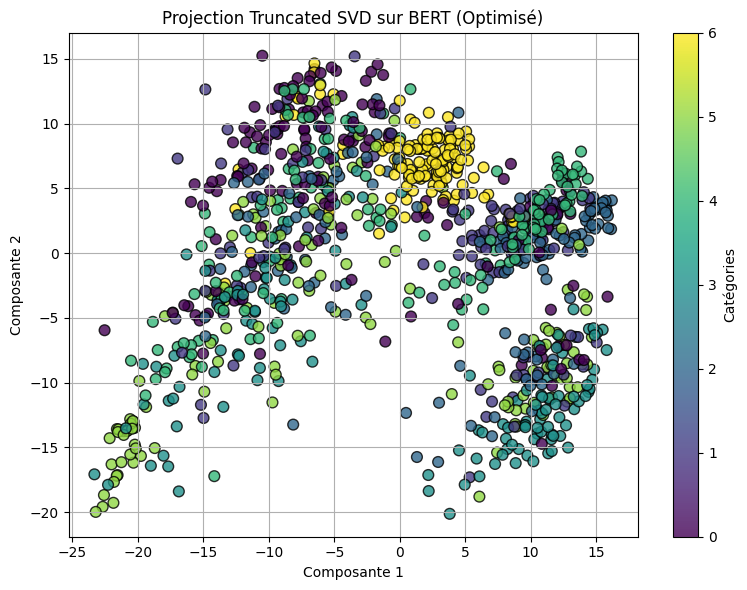

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

#  Conversion des vecteurs BERT en matrice 
# Les embeddings BERT sont supposés être déjà dans une colonne 'bert_embeddings'
bert_matrix = np.array(dataset['bert_embeddings'].tolist())

print("Forme de la matrice BERT :", bert_matrix.shape)

#  Standardisation de la matrice BERT 
print("Standardisation de la matrice BERT...")
scaler = StandardScaler()
bert_scaled = scaler.fit_transform(bert_matrix)
print("Standardisation terminée.")
print("Forme des données BERT après standardisation :", bert_scaled.shape)

# Réduction avec Truncated SVD 
print("Réduction de dimension avec Truncated SVD...")
n_components = 50  # Réduction à 50 dimensions ou ajusté selon la taille des données
svd = TruncatedSVD(
    n_components=n_components, 
    algorithm='randomized',    # Algorithme rapide pour les grandes matrices
    tol=1e-4,                  # Tolérance ajustée pour la convergence
    random_state=42            # Reproductibilité
)
bert_svd = svd.fit_transform(bert_scaled)
print("Réduction terminée.")
print("Forme des données après Truncated SVD :", bert_svd.shape)

# Variance expliquée 
print("\nVariance expliquée par chaque composante :", svd.explained_variance_ratio_)
print("\nVariance cumulée :", svd.explained_variance_ratio_.cumsum())

# Visualisation des résultats 
plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    bert_svd[:, 0], 
    bert_svd[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    alpha=0.8, 
    s=60, 
    edgecolor='k'
)
plt.colorbar(label="Catégories")
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
plt.title("Projection Truncated SVD sur BERT (Optimisé)")
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2585


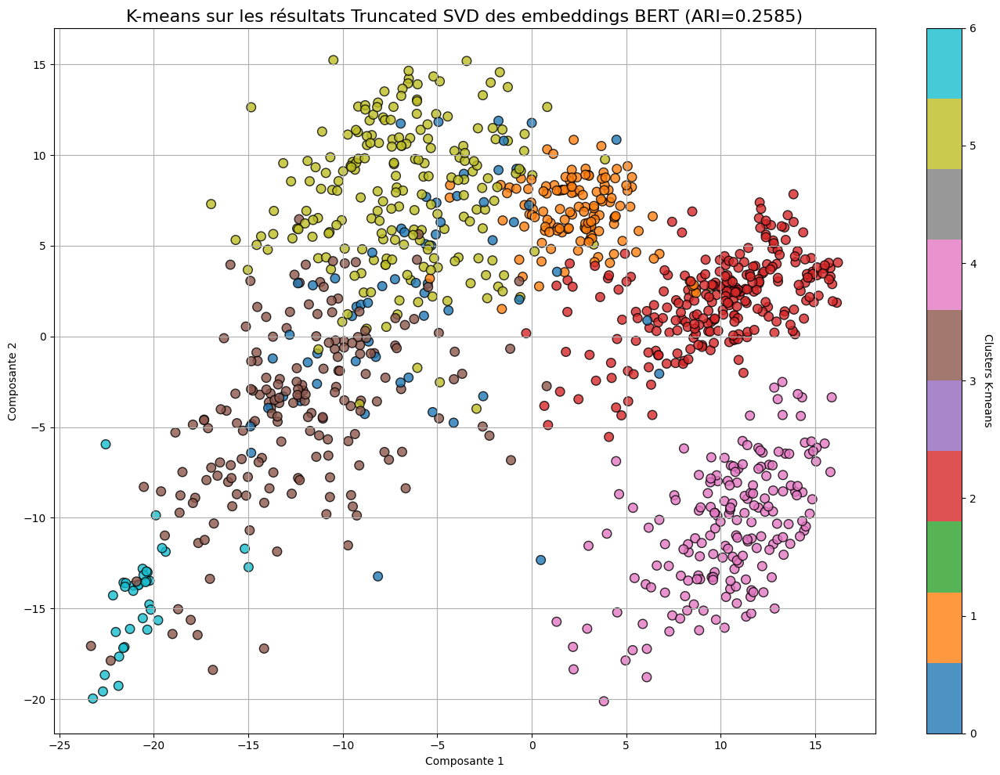

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Hyperparamètres optimisés de K-means 
n_clusters = 7  # Nombre de clusters correspondant aux catégories réelles
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée pour une meilleure convergence
    max_iter=500,         # Augmentation des itérations pour une convergence stable
    n_init=20,            # Plusieurs initialisations pour éviter les minima locaux
    random_state=42       # Reproductibilité
)

#  Application de K-means sur les résultats de Truncated SVD 
kmeans_labels = kmeans.fit_predict(bert_svd)

#  Calcul de l'ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    bert_svd[:, 0], 
    bert_svd[:, 1], 
    c=kmeans_labels,  # Couleurs basées sur les clusters prédits
    cmap='tab10', 
    alpha=0.8, 
    s=70, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)
plt.title(f"K-means sur les résultats Truncated SVD des embeddings BERT (ARI={ari_score:.4f})", fontsize=16)
plt.xlabel('Composante 1')
plt.ylabel('Composante 2')
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">Autoencoder</span>

Epoch 1/100
14/14 [==============================] - 1s 12ms/step - loss: 0.9685 - val_loss: 1.1105
Epoch 2/100
14/14 [==============================] - 0s 6ms/step - loss: 0.8991 - val_loss: 0.9941
Epoch 3/100
14/14 [==============================] - 0s 7ms/step - loss: 0.7961 - val_loss: 0.9368
Epoch 4/100
14/14 [==============================] - 0s 8ms/step - loss: 0.7554 - val_loss: 0.9079
Epoch 5/100
14/14 [==============================] - 0s 6ms/step - loss: 0.7328 - val_loss: 0.8939
Epoch 6/100
14/14 [==============================] - 0s 5ms/step - loss: 0.7210 - val_loss: 0.8867
Epoch 7/100
14/14 [==============================] - 0s 6ms/step - loss: 0.7113 - val_loss: 0.8848
Epoch 8/100
14/14 [==============================] - 0s 5ms/step - loss: 0.7077 - val_loss: 0.8812
Epoch 9/100
14/14 [==============================] - 0s 5ms/step - loss: 0.7006 - val_loss: 0.8798
Epoch 10/100
14/14 [==============================] - 0s 5ms/step - loss: 0.6936 - val_loss: 0.8707
Epoch 11

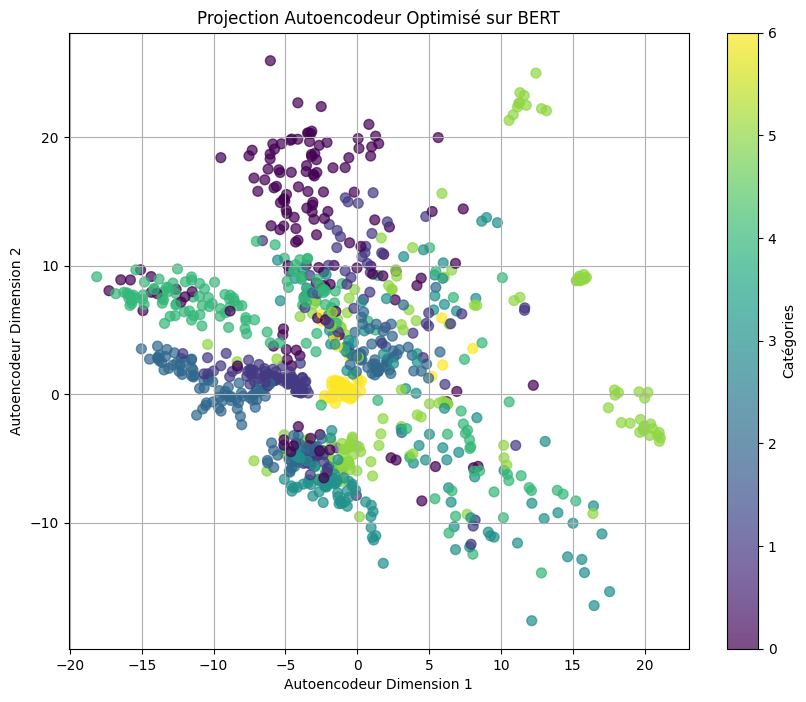

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Prétraitement des données BERT 
# Convertir les embeddings BERT en matrice NumPy
bert_matrix = np.array(dataset['bert_embeddings'].tolist())

# Standardiser les données
scaler = StandardScaler()
bert_scaled = scaler.fit_transform(bert_matrix)

# Construction de l'autoencodeur optimisé 
input_dim = bert_scaled.shape[1]
encoding_dim = 2  # Dimension réduite pour la visualisation 

# Définition de l'architecture
input_layer = Input(shape=(input_dim,))
encoded = Dense(128, activation='relu')(input_layer)  # Plus de neurones pour capturer les variations complexes
encoded = Dropout(0.2)(encoded)  # Dropout pour éviter l'overfitting
encoded = Dense(64, activation='relu')(encoded)
encoded_output = Dense(encoding_dim, activation='linear')(encoded)

decoded = Dense(64, activation='relu')(encoded_output)
decoded = Dropout(0.2)(decoded)  # Dropout également dans le décodeur
decoded = Dense(128, activation='relu')(decoded)
decoded_output = Dense(input_dim, activation='linear')(decoded)  # Linear pour des données continues

# Modèle autoencodeur complet
autoencoder = Model(inputs=input_layer, outputs=decoded_output)
# Modèle encodeur uniquement (pour extraire les dimensions réduites)
encoder = Model(inputs=input_layer, outputs=encoded_output)

# Compilation du modèle
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='mse')

# Early Stopping pour éviter l'overfitting 
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entraînement avec une taille de batch ajustée
autoencoder.fit(
    bert_scaled, bert_scaled,
    epochs=100,  # Augmentation des époques pour un apprentissage plus approfondi
    batch_size=64,  # Taille de batch optimisée
    shuffle=True,
    validation_split=0.2,
    verbose=1,
    callbacks=[early_stopping]
)

# Extraction des données compressées
compressed_bert = encoder.predict(bert_scaled)

# Visualisation des données compressées
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    compressed_bert[:, 0],
    compressed_bert[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    alpha=0.7,
    s=50
)
plt.colorbar(label='Catégories')
plt.title("Projection Autoencodeur Optimisé sur BERT")
plt.xlabel("Autoencodeur Dimension 1")
plt.ylabel("Autoencodeur Dimension 2")
plt.grid(True)
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2164


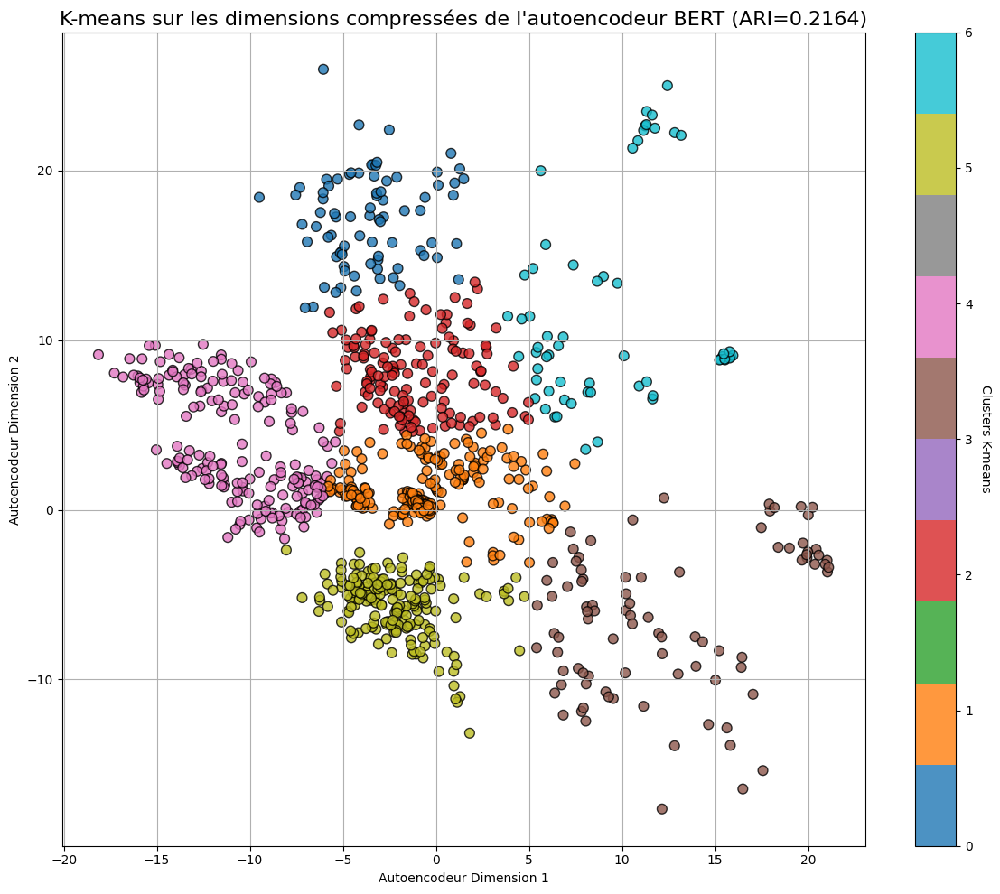

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Hyperparamètres optimisés de K-means
n_clusters = 7  # Correspondant au nombre de catégories réelles
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée pour une meilleure convergence
    max_iter=1000,        # Augmentation des itérations pour une meilleure convergence
    n_init=50,            # Augmentation des initialisations pour éviter les minima locaux
    tol=1e-5,             # Tolérance plus stricte pour une convergence précise
    random_state=42       # Pour la reproductibilité
)

#  Application de K-means sur les données compressées
kmeans_labels = kmeans.fit_predict(compressed_bert)

#  Calcul du score ARI 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters K-means 
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    compressed_bert[:, 0], 
    compressed_bert[:, 1], 
    c=kmeans_labels,  # Couleurs basées sur les clusters prédits
    cmap='tab10', 
    alpha=0.8, 
    s=60, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)
plt.title(f"K-means sur les dimensions compressées de l'autoencodeur BERT (ARI={ari_score:.4f})", fontsize=16)
plt.xlabel("Autoencodeur Dimension 1")
plt.ylabel("Autoencodeur Dimension 2")
plt.grid(True)
plt.tight_layout()
plt.show()


## Faisabilité | USE - Universal Sentence Encoder: <span style="color:red">"USE_EMBEDDING"</span>

##### <span style="color:red">Analyse en Composante Principale</span>

Forme initiale des embeddings USE : (1050, 512)
Forme des données USE après standardisation : (1050, 512)
Nombre de composantes nécessaires pour expliquer 90.0% de la variance : 135

Variance expliquée par chaque composante (sélectionnées) :
 [0.10777079 0.05640461 0.04897492 0.04307528 0.02445889 0.02366804
 0.0216394  0.01996649 0.01911702 0.01825868 0.01545294 0.01506938
 0.01412782 0.01339294 0.01260668 0.01209982 0.01094681 0.01067005
 0.00992998 0.00938838 0.00914964 0.00873124 0.00848079 0.00824453
 0.0078621  0.00768696 0.00750401 0.00731996 0.00720678 0.00687037
 0.006716   0.00657955 0.00639181 0.00608461 0.00606274 0.00598633
 0.00571616 0.00563801 0.00553478 0.00544711 0.00537769 0.00528053
 0.00507439 0.00497825 0.00484306 0.00480744 0.00468749 0.00458878
 0.00456036 0.00444638 0.00425927 0.00420357 0.00414864 0.00409596
 0.00407714 0.00397736 0.00389041 0.00375341 0.00370525 0.003689
 0.0036556  0.00358355 0.00353296 0.00351938 0.0034815  0.0034223
 0.00330624 0.00320236 

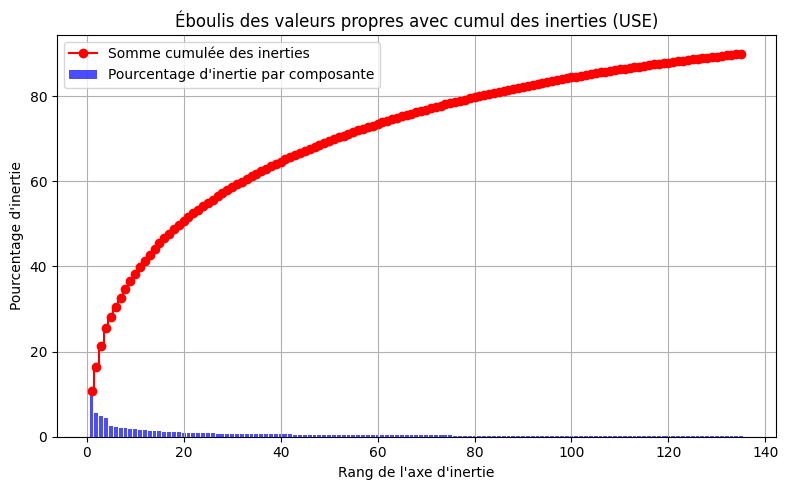

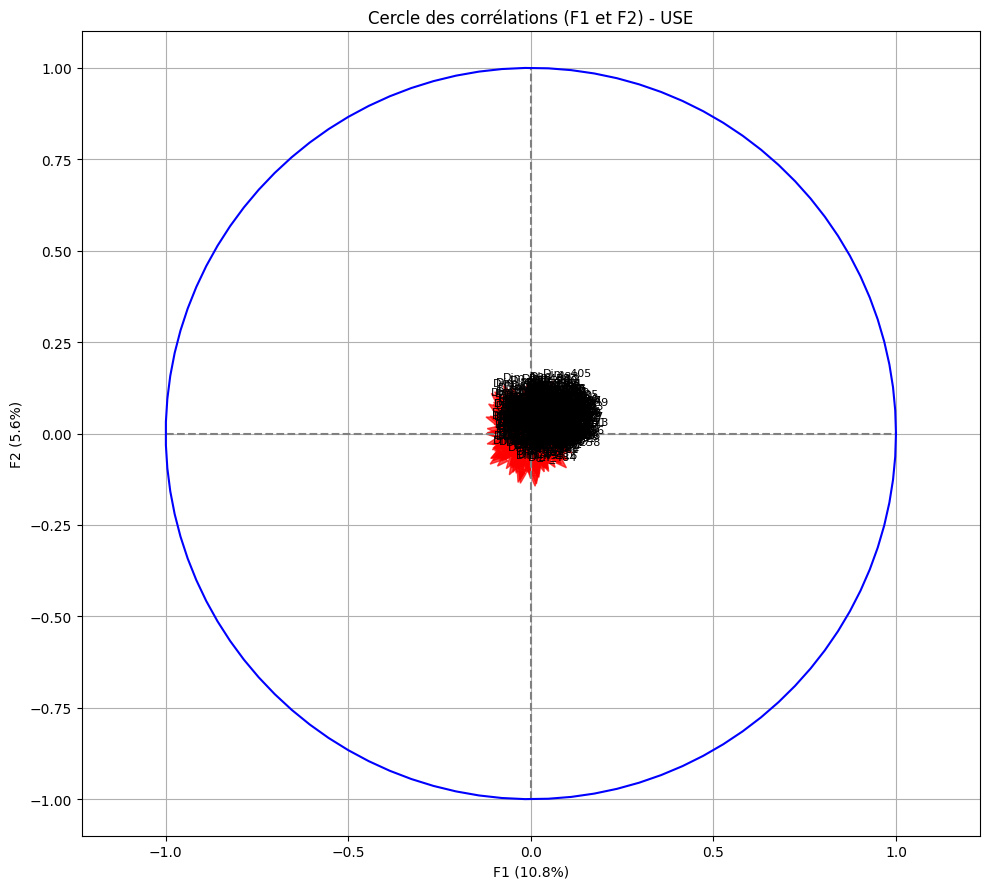

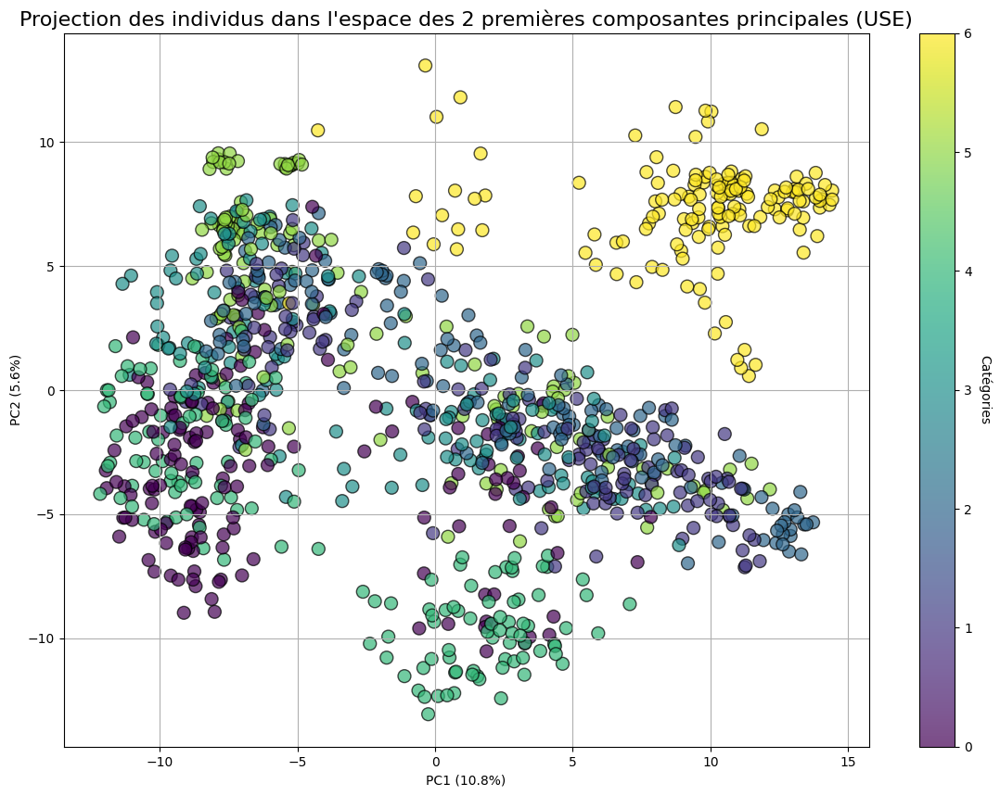

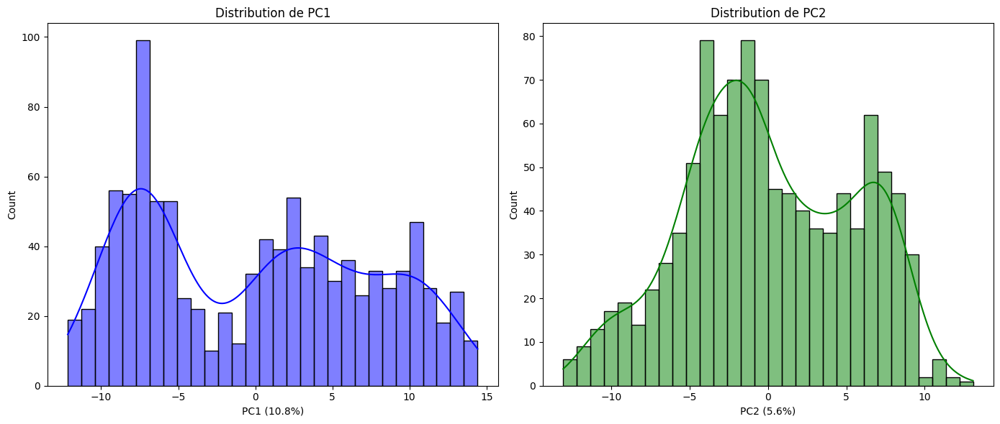

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

#  Conversion de la colonne 'use_embeddings' en tableau NumPy 
embeddings = np.array(dataset['use_embeddings'].tolist())

# Vérification de la forme des embeddings
print(f"Forme initiale des embeddings USE : {embeddings.shape}")

#  Standardisation des données 
scaler = StandardScaler()
use_scaled = scaler.fit_transform(embeddings)
print(f"Forme des données USE après standardisation : {use_scaled.shape}")

#  Sélection dynamique du nombre de composantes 
pca_full = PCA(random_state=42)
pca_full.fit(use_scaled)

# Calcul de la variance cumulée
variance_cumulee = np.cumsum(pca_full.explained_variance_ratio_)
seuil_variance = 0.90  # Seuil de variance cumulée (90 %)
n_components = np.argmax(variance_cumulee >= seuil_variance) + 1

print(f"Nombre de composantes nécessaires pour expliquer {seuil_variance * 100}% de la variance : {n_components}")

# Appliquer l'ACP avec le nombre optimal de composantes
pca = PCA(n_components=n_components, random_state=42)
use_pca = pca.fit_transform(use_scaled)

#  Affichage des résultats de l'ACP 
print("\nVariance expliquée par chaque composante (sélectionnées) :\n", pca.explained_variance_ratio_)
print(f"\nForme des données après ACP : {use_pca.shape}")

#  Éboulis des valeurs propres (scree plot) 
variance_expliquee = pca.explained_variance_ratio_ * 100
variance_expliquee_cumulee = np.cumsum(variance_expliquee)

plt.figure(figsize=(8, 5))
plt.bar(range(1, len(variance_expliquee) + 1), variance_expliquee, color='b', alpha=0.7, label="Pourcentage d'inertie par composante")
plt.step(range(1, len(variance_expliquee_cumulee) + 1), variance_expliquee_cumulee, where='mid', color='red', label="Somme cumulée des inerties", marker='o', linestyle='-')
plt.xlabel("Rang de l'axe d'inertie")
plt.ylabel("Pourcentage d'inertie")
plt.title("Éboulis des valeurs propres avec cumul des inerties (USE)")
plt.grid(True)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

#  Cercle des corrélations 
fig, ax = plt.subplots(figsize=(10, 9))
x, y = 0, 1  # Première et deuxième composante
features = [f"Dim_{i+1}" for i in range(embeddings.shape[1])]

for i in range(min(pca.components_.shape[1], len(features))):  # Limiter au nombre de features
    ax.arrow(0, 0, 
             pca.components_[x, i],  
             pca.components_[y, i],  
             head_width=0.02, 
             head_length=0.03, 
             width=0.001, 
             color='red', alpha=0.7)
    plt.text(pca.components_[x, i] + 0.05, 
             pca.components_[y, i] + 0.05, 
             features[i], 
             color='black', 
             ha='center', 
             va='center', 
             fontsize=8)

# Ajouter le cercle
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')
an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an), color='blue')
plt.xlabel(f'F1 ({round(100 * pca.explained_variance_ratio_[x], 1)}%)')
plt.ylabel(f'F2 ({round(100 * pca.explained_variance_ratio_[y], 1)}%)')
plt.title("Cercle des corrélations (F1 et F2) - USE")
plt.axis('equal')
plt.grid(True)
plt.tight_layout()
plt.show()

#  Projection des individus 
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    use_pca[:, 0], 
    use_pca[:, 1], 
    c=dataset['label_category'].astype('category').cat.codes, 
    cmap='viridis', 
    edgecolor='k', 
    alpha=0.7, 
    s=100
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.ylabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title('Projection des individus dans l\'espace des 2 premières composantes principales (USE)', fontsize=16)
plt.grid(True)
plt.show()

#  Distribution des composantes principales 
plt.figure(figsize=(14, 6))

# Distribution pour PC1
plt.subplot(1, 2, 1)
sns.histplot(use_pca[:, 0], kde=True, bins=30, color='blue')
plt.xlabel(f'PC1 ({round(100 * pca.explained_variance_ratio_[0], 1)}%)')
plt.title('Distribution de PC1')

# Distribution pour PC2
plt.subplot(1, 2, 2)
sns.histplot(use_pca[:, 1], kde=True, bins=30, color='green')
plt.xlabel(f'PC2 ({round(100 * pca.explained_variance_ratio_[1], 1)}%)')
plt.title('Distribution de PC2')

plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) : 0.3484
Silhouette Score : 0.1131


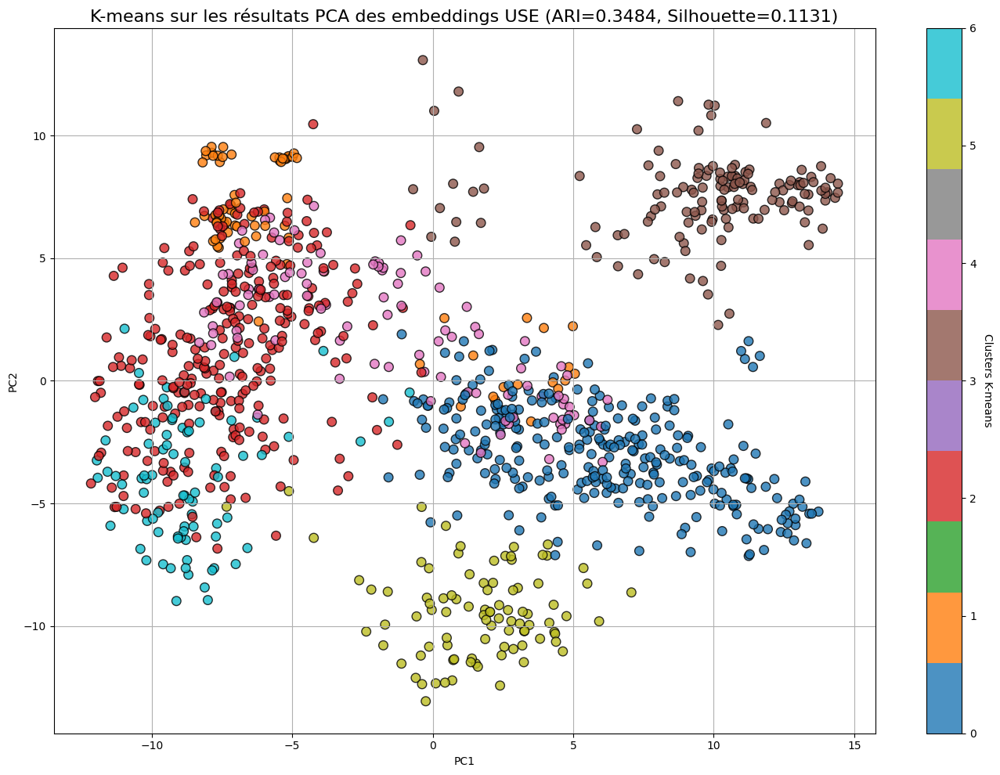

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

# Hyperparamètres optimisés pour K-means
n_clusters = 7  # Nombre de clusters correspondant aux catégories réelles
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée pour une meilleure convergence
    max_iter=1000,        # Augmentation des itérations pour garantir une convergence stable
    n_init=50,            # Nombre élevé d'initialisations pour éviter les minima locaux
    algorithm='elkan',    # Utilisation de l'algorithme Elkan pour une meilleure efficacité
    random_state=42       # Reproductibilité
)

# Application de K-means sur les embeddings USE
kmeans_labels = kmeans.fit_predict(use_pca)  # Utilisation des résultats de l'ACP pour réduire la dimension

# Calcul des métriques
# Score ARI (Adjusted Rand Index)
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) : {ari_score:.4f}")

# Score de silhouette pour évaluer la cohérence interne des clusters
silhouette_avg = silhouette_score(use_pca, kmeans_labels)
print(f"Silhouette Score : {silhouette_avg:.4f}")

# Visualisation des clusters K-means
plt.figure(figsize=(14, 10))
scatter = plt.scatter(
    use_pca[:, 0],  # Première dimension de l'ACP
    use_pca[:, 1],  # Deuxième dimension de l'ACP
    c=kmeans_labels,  # Couleurs basées sur les clusters prédits
    cmap='tab10', 
    alpha=0.8, 
    s=70, 
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)
plt.title(f"K-means sur les résultats PCA des embeddings USE (ARI={ari_score:.4f}, Silhouette={silhouette_avg:.4f})", fontsize=16)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)
plt.tight_layout()
plt.show()



##### <span style="color:red">UMAP - Uniform Manifold Approximation and Projection.</span>

Forme initiale des embeddings USE : (1050, 512)
Forme après aplatissement : (1050, 512)


C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP terminé.


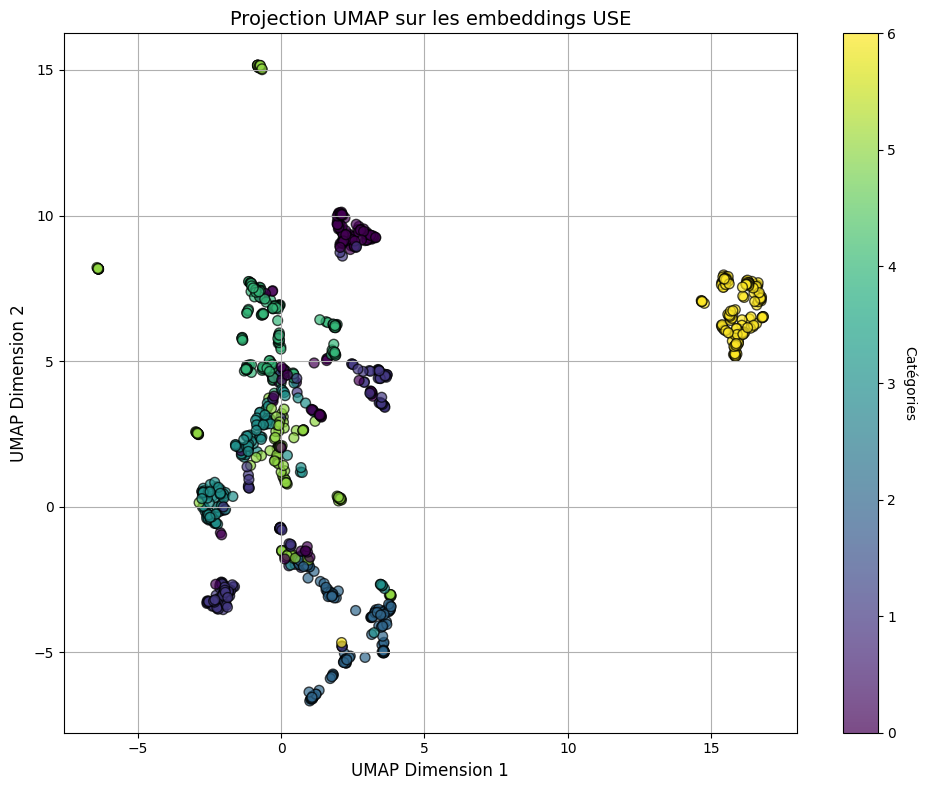

In [ ]:
import numpy as np
import pandas as pd
from umap import UMAP
import matplotlib.pyplot as plt
import seaborn as sns

#  Extraction des embeddings en tant que matrice 
embeddings = np.array(dataset['use_embeddings'].tolist())

# Vérifier la forme initiale des embeddings
print(f"Forme initiale des embeddings USE : {embeddings.shape}")

# Aplatir les dimensions si nécessaire (dim=3 -> dim=2)
if embeddings.ndim == 3:
    embeddings = embeddings.squeeze(axis=1)

print(f"Forme après aplatissement : {embeddings.shape}")

# Appliquer UMAP 
umap = UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
use_umap = umap.fit_transform(embeddings)

print("UMAP terminé.")

# Visualisation des données UMAP
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    use_umap[:, 0],  # Première dimension UMAP
    use_umap[:, 1],  # Deuxième dimension UMAP
    c=dataset['label_category'].astype('category').cat.codes,  # Couleur selon les catégories
    cmap='viridis',
    edgecolor='k',
    alpha=0.7,
    s=50
)

# Ajouter une barre de couleur
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)

# Ajouter un titre et des étiquettes
plt.title('Projection UMAP sur les embeddings USE', fontsize=14)
plt.xlabel('UMAP Dimension 1', fontsize=12)
plt.ylabel('UMAP Dimension 2', fontsize=12)

# Ajouter une grille
plt.grid(True)

# Ajuster l'affichage
plt.tight_layout()

# Afficher le graphique
plt.show()


Forme initiale des embeddings USE : (1050, 512)
Forme après aplatissement : (1050, 512)


C:\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP terminé.
Exécution avec n_clusters = 7
ARI = 0.4966


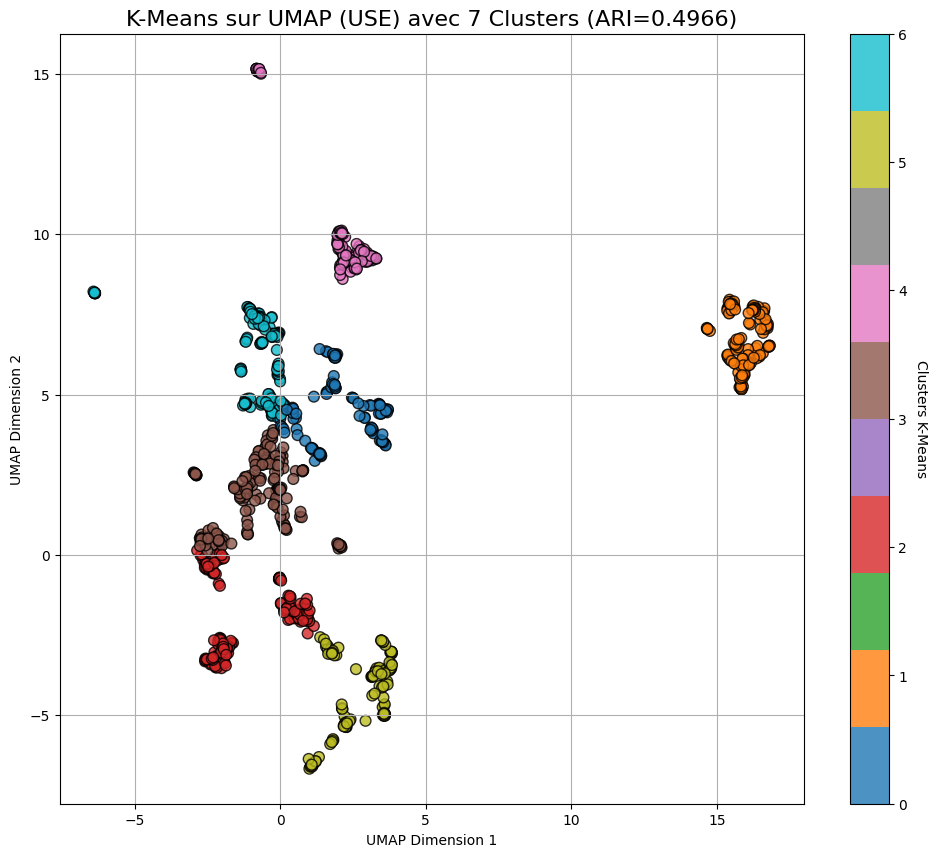

In [ ]:
import numpy as np
import pandas as pd
from umap import UMAP
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

# Extraction des embeddings en tant que matrice
embeddings = np.array(dataset['use_embeddings'].tolist())

# Vérifier la forme initiale des embeddings
print(f"Forme initiale des embeddings USE : {embeddings.shape}")

# Aplatir les dimensions si nécessaire (dim=3 -> dim=2)
if embeddings.ndim == 3:
    embeddings = embeddings.squeeze(axis=1)

print(f"Forme après aplatissement : {embeddings.shape}")

#  Appliquer UMAP 
umap = UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
use_umap = umap.fit_transform(embeddings)

print("UMAP terminé.")

#  Application de K-Means avec 7 clusters 
n_clusters = 7
print(f"Exécution avec n_clusters = {n_clusters}")

kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',
    max_iter=1000,
    n_init=20,
    random_state=42
)
kmeans_labels = kmeans.fit_predict(use_umap)

# Calcul des métriques
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"ARI = {ari_score:.4f}")

#  Visualisation des clusters K-Means 
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    use_umap[:, 0],
    use_umap[:, 1],
    c=kmeans_labels,
    cmap='tab10',
    alpha=0.8,
    s=60,
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-Means', rotation=270, labelpad=15)
plt.title(f"K-Means sur UMAP (USE) avec 7 Clusters (ARI={ari_score:.4f})", fontsize=16)
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")
plt.grid(True)
plt.show()


##### <span style="color:red">T-SNE</span>

Embeddings standardisés.
Test t-SNE avec perplexité=10, learning_rate=50


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=10, learning_rate=200


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=10, learning_rate=500


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=30, learning_rate=50


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=30, learning_rate=200


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=30, learning_rate=500


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=50, learning_rate=50


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=50, learning_rate=200


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=50, learning_rate=500


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=100, learning_rate=50


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=100, learning_rate=200


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Test t-SNE avec perplexité=100, learning_rate=500


C:\Python311\Lib\site-packages\sklearn\manifold\_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


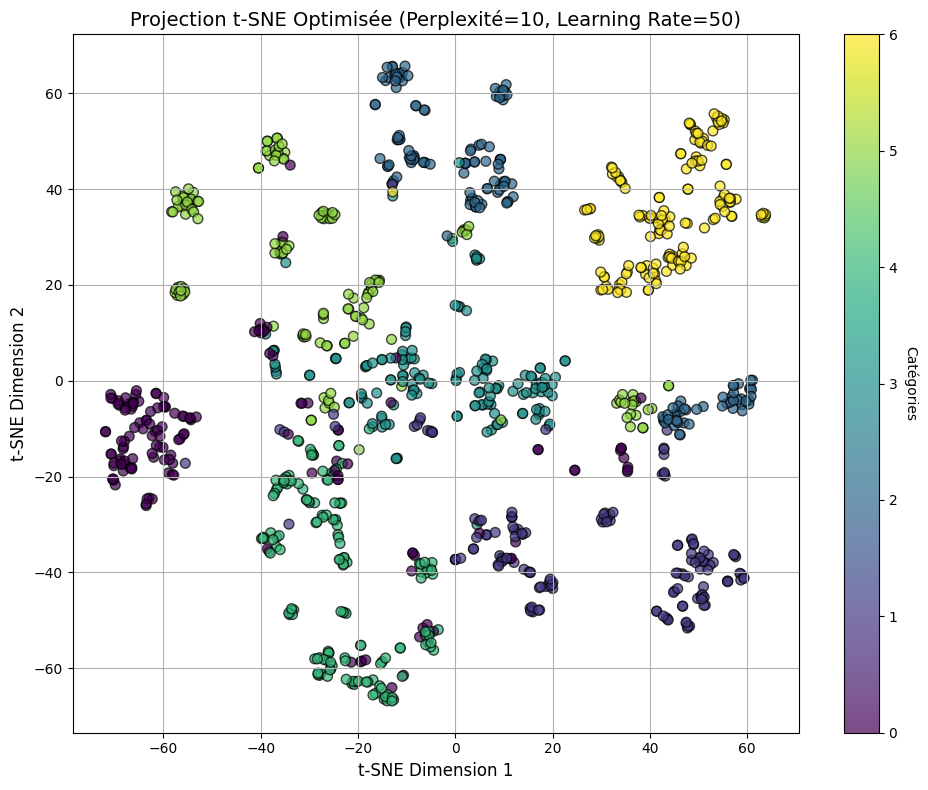

In [ ]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

#  Extraction des embeddings en tant que matrice 
embeddings = np.array(dataset['use_embeddings'].tolist())

#  Standardisation des données
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)
print("Embeddings standardisés.")

# Initialisation des meilleurs paramètres 
best_tsne_projection = None
best_perplexity = None
best_learning_rate = None

# Optimisation des hyperparamètres 
best_ari = -1  

for perplexity in [10, 30, 50, 100]:  # Tester différentes perplexités
    for learning_rate in [50, 200, 500]:  # Tester différents taux d'apprentissage
        print(f"Test t-SNE avec perplexité={perplexity}, learning_rate={learning_rate}")
        
        # Initialiser et ajuster t-SNE
        tsne = TSNE(
            n_components=2,
            perplexity=perplexity,
            learning_rate=learning_rate,
            n_iter=1500,
            metric='cosine',
            init='pca',
            random_state=42
        )
        
        tsne_projection = tsne.fit_transform(embeddings)     
        
        
        if best_tsne_projection is None:  # Premier test
            best_tsne_projection = tsne_projection
            best_perplexity = perplexity
            best_learning_rate = learning_rate

# Affichage des résultats 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    best_tsne_projection[:, 0],
    best_tsne_projection[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    edgecolor='k',
    alpha=0.7,
    s=50
)

# Ajouter une barre de couleur
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)

# Titre et étiquettes
plt.title(f"Projection t-SNE Optimisée (Perplexité={best_perplexity}, Learning Rate={best_learning_rate})", fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=12)
plt.ylabel('t-SNE Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


Forme des données t-SNE optimisées : (1050, 2)
Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.5307


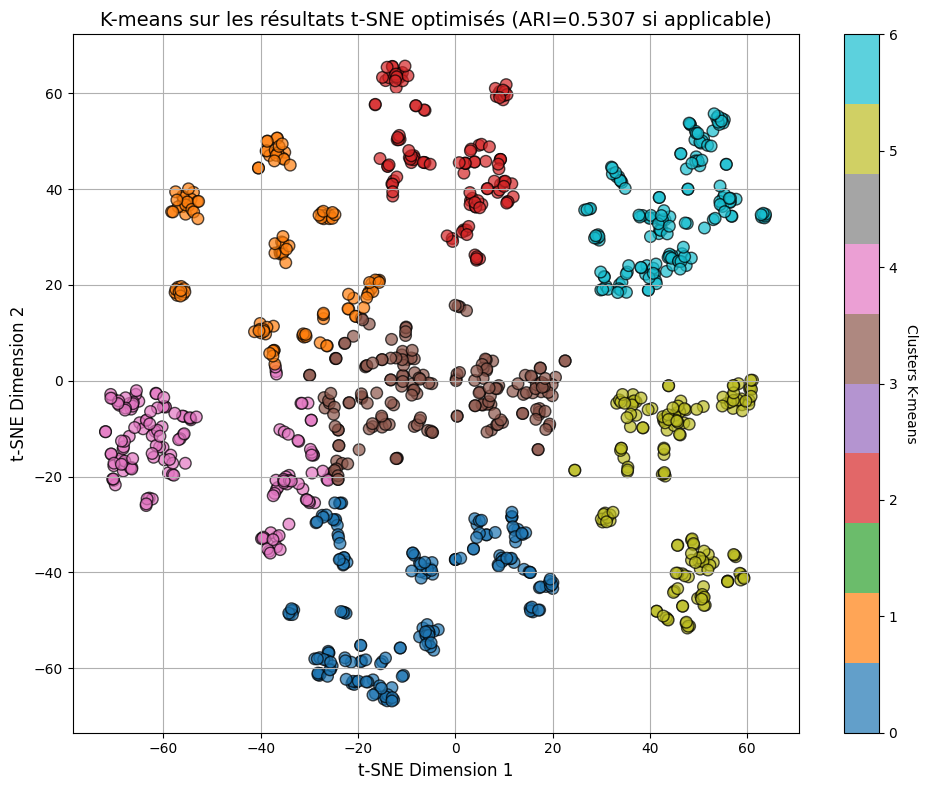

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

# Résultats t-SNE optimisés 
# Le t-SNE optimisé est stocké dans "best_tsne_projection"

print(f"Forme des données t-SNE optimisées : {best_tsne_projection.shape}")

# Application de K-means
n_clusters = 7  # Définir le nombre de clusters
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée pour une meilleure convergence
    max_iter=1000,        # Augmentation du nombre d'itérations pour une meilleure convergence
    n_init=50,            # Plusieurs initialisations pour éviter les minima locaux
    random_state=42       # Reproductibilité
)

# Prédire les clusters avec K-means
kmeans_labels = kmeans.fit_predict(best_tsne_projection)

#  Calcul de l'ARI (si les catégories réelles sont disponibles)
if 'label_category' in dataset.columns:
    ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
    print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")
else:
    print("la variable 'label_category' introuvable dans le dataset pour calculer l'ARI.")

#  Visualisation des clusters K-means 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    best_tsne_projection[:, 0],  # Première dimension t-SNE
    best_tsne_projection[:, 1],  # Deuxième dimension t-SNE
    c=kmeans_labels,             # Couleur basée sur les clusters K-means
    cmap='tab10', 
    edgecolor='k',
    alpha=0.7,
    s=70
)

# Ajouter une barre de couleur
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)

# Ajouter un titre et des étiquettes
plt.title(f"K-means sur les résultats t-SNE optimisés (ARI={ari_score:.4f} si applicable)", fontsize=14)
plt.xlabel('t-SNE Dimension 1', fontsize=12)
plt.ylabel('t-SNE Dimension 2', fontsize=12)

# Ajouter une grille
plt.grid(True)
plt.tight_layout()

# Afficher le graphique
plt.show()


Embeddings standardisés.
Nombre optimal de composantes : 20
Forme après réduction SVD : (1050, 2)
Variance expliquée par chaque composante : [0.10777074 0.05640456]
Variance expliquée cumulée : [0.10777074 0.1641753 ]


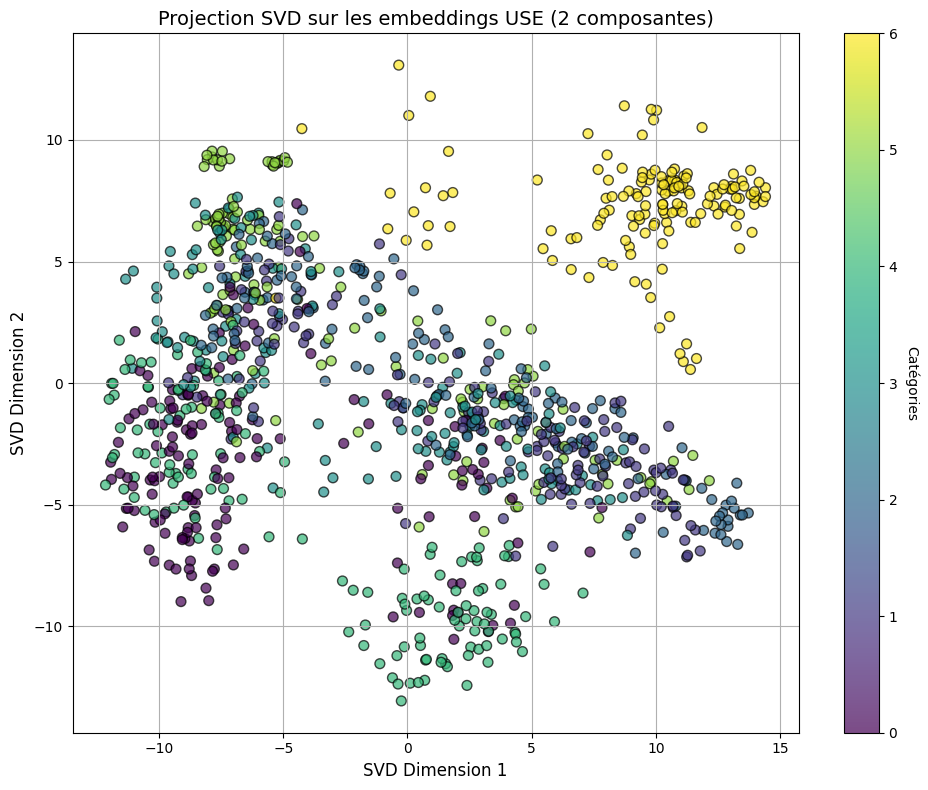

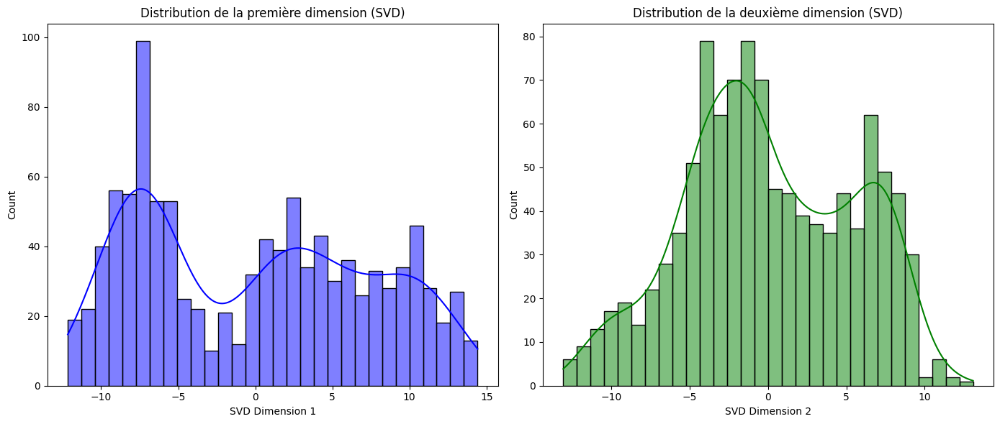

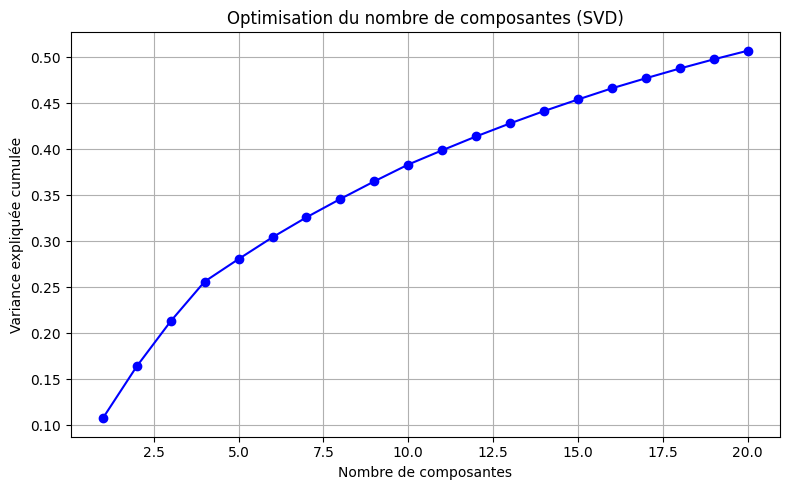

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Extraction des embeddings en tant que matrice
embeddings = np.array(dataset['use_embeddings'].tolist())

# Standardisation des données
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)
print("Embeddings standardisés.")

# Optimisation du nombre de composantes
explained_variances = []
components_range = range(1, 21)  # On teste entre 1 et 20 composantes

for n_components in components_range:
    svd = TruncatedSVD(n_components=n_components, random_state=42)
    svd.fit(embeddings)
    explained_variances.append(np.sum(svd.explained_variance_ratio_))

optimal_components = max(components_range, key=lambda x: explained_variances[x - 1])

print(f"Nombre optimal de composantes : {optimal_components}")

#  Application de SVD avec le nombre optimal de composantes 
svd = TruncatedSVD(n_components=2, random_state=42)
use_svd = svd.fit_transform(embeddings)

print(f"Forme après réduction SVD : {use_svd.shape}")
print("Variance expliquée par chaque composante :", svd.explained_variance_ratio_)
print("Variance expliquée cumulée :", np.cumsum(svd.explained_variance_ratio_))

#  Visualisation des résultats 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    use_svd[:, 0],
    use_svd[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    edgecolor='k',
    alpha=0.7,
    s=50
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.title("Projection SVD sur les embeddings USE (2 composantes)", fontsize=14)
plt.xlabel('SVD Dimension 1', fontsize=12)
plt.ylabel('SVD Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

#  Distribution des composantes 
plt.figure(figsize=(14, 6))

# Distribution pour SVD Dimension 1
plt.subplot(1, 2, 1)
sns.histplot(use_svd[:, 0], kde=True, bins=30, color='blue')
plt.xlabel('SVD Dimension 1')
plt.title('Distribution de la première dimension (SVD)')

# Distribution pour SVD Dimension 2
plt.subplot(1, 2, 2)
sns.histplot(use_svd[:, 1], kde=True, bins=30, color='green')
plt.xlabel('SVD Dimension 2')
plt.title('Distribution de la deuxième dimension (SVD)')

plt.tight_layout()
plt.show()

#  Variance expliquée par le nombre de composantes 
plt.figure(figsize=(8, 5))
plt.plot(components_range, explained_variances, marker='o', linestyle='-', color='b')
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance expliquée cumulée')
plt.title('Optimisation du nombre de composantes (SVD)')
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2464


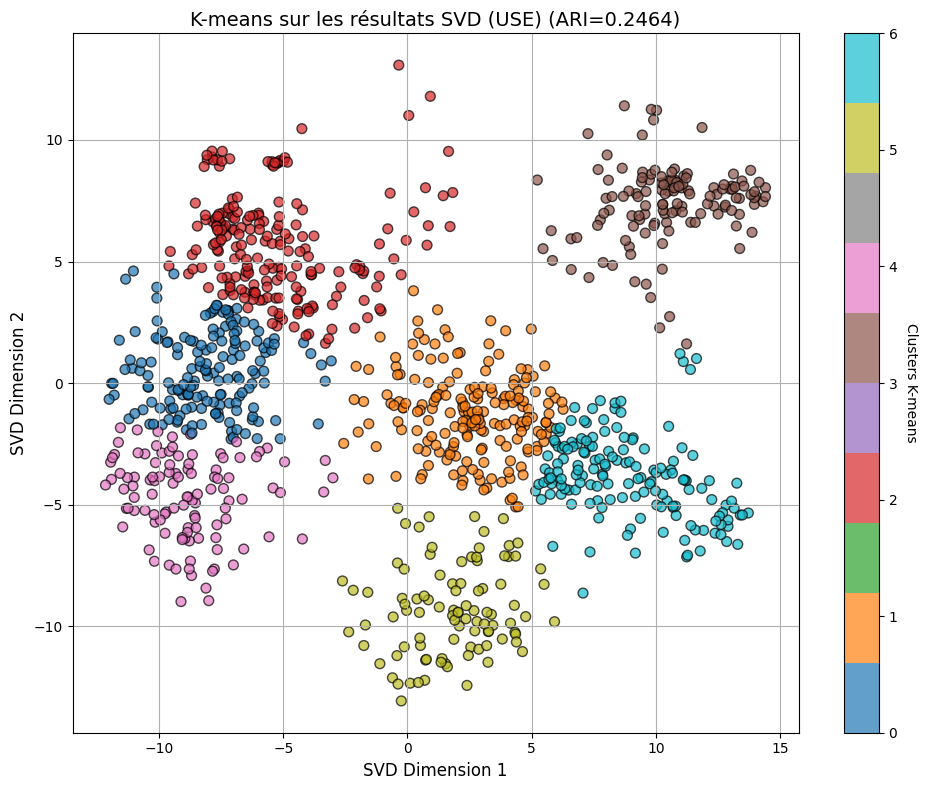

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means 
# Définir le nombre de clusters (idéalement correspondant aux catégories réelles)
n_clusters = len(dataset['label_category'].unique())  # Nombre unique de catégories
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée
    max_iter=1000,        # Augmentation des itérations pour garantir une convergence
    n_init=50,            # Nombre élevé d'initialisations pour éviter les minima locaux
    random_state=42       # Reproductibilité
)

# Ajustement et prédiction des clusters
kmeans_labels = kmeans.fit_predict(use_svd)  # 'use_svd' provient de la réduction avec SVD

#  Évaluation avec Adjusted Rand Index (ARI) 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

#  Visualisation des clusters 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    use_svd[:, 0],
    use_svd[:, 1],
    c=kmeans_labels,  # Couleurs selon les clusters prédits
    cmap='tab10',
    edgecolor='k',
    alpha=0.7,
    s=50
)

# Ajouter une barre de couleur
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)

# Ajouter un titre et des étiquettes
plt.title(f"K-means sur les résultats SVD (USE) (ARI={ari_score:.4f})", fontsize=14)
plt.xlabel('SVD Dimension 1', fontsize=12)
plt.ylabel('SVD Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">Truncated SVD (Singular Value Decomposition)</span>

Embeddings standardisés.
Nombre optimal de composantes : 20
Forme après réduction SVD : (1050, 2)
Variance expliquée par chaque composante : [0.10777074 0.05640456]
Variance expliquée cumulée : [0.10777074 0.1641753 ]


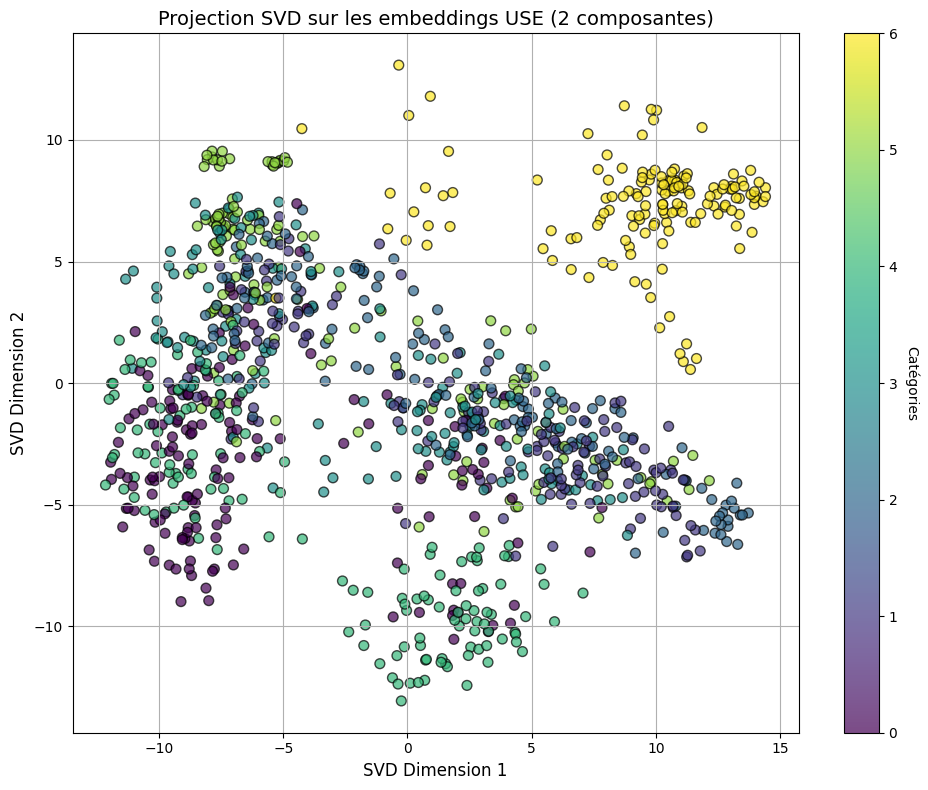

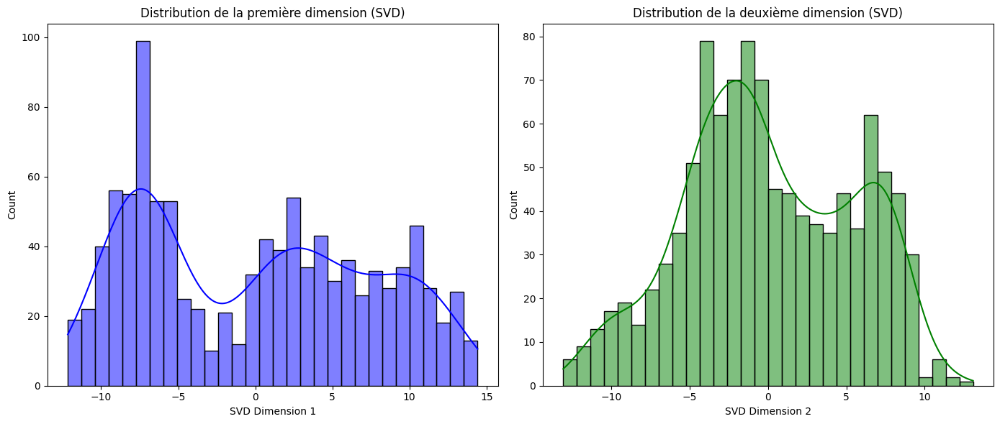

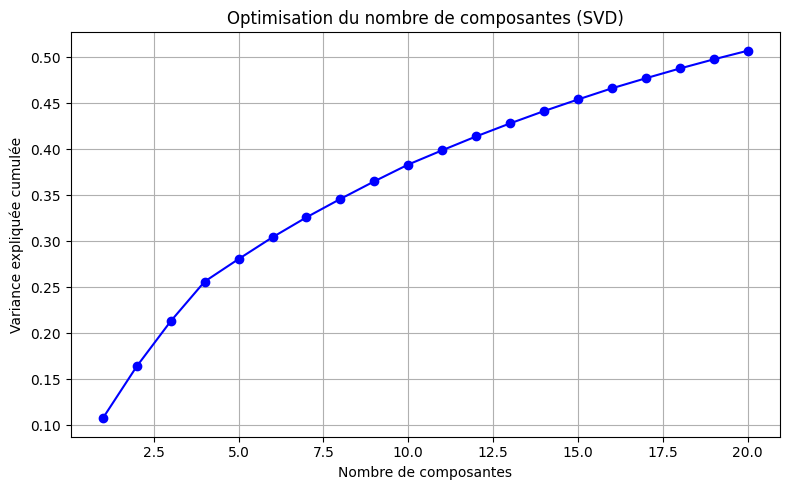

In [ ]:
import numpy as np
import pandas as pd
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

#  Extraction des embeddings en tant que matrice 
embeddings = np.array(dataset['use_embeddings'].tolist())

#  Standardisation des données 
scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)
print("Embeddings standardisés.")

#  Optimisation du nombre de composantes 
explained_variances = []
components_range = range(1, 21)  # On teste entre 1 et 20 composantes

for n_components in components_range:
    svd = TruncatedSVD(n_components=n_components, random_state=42)
    svd.fit(embeddings)
    explained_variances.append(np.sum(svd.explained_variance_ratio_))

optimal_components = max(components_range, key=lambda x: explained_variances[x - 1])

print(f"Nombre optimal de composantes : {optimal_components}")

#  Application de SVD avec le nombre optimal de composantes 
svd = TruncatedSVD(n_components=2, random_state=42)
use_svd = svd.fit_transform(embeddings)

print(f"Forme après réduction SVD : {use_svd.shape}")
print("Variance expliquée par chaque composante :", svd.explained_variance_ratio_)
print("Variance expliquée cumulée :", np.cumsum(svd.explained_variance_ratio_))

#  Visualisation des résultats 
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    use_svd[:, 0],
    use_svd[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    edgecolor='k',
    alpha=0.7,
    s=50
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Catégories', rotation=270, labelpad=15)
plt.title("Projection SVD sur les embeddings USE (2 composantes)", fontsize=14)
plt.xlabel('SVD Dimension 1', fontsize=12)
plt.ylabel('SVD Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

#  Distribution des composantes
plt.figure(figsize=(14, 6))

# Distribution pour SVD Dimension 1
plt.subplot(1, 2, 1)
sns.histplot(use_svd[:, 0], kde=True, bins=30, color='blue')
plt.xlabel('SVD Dimension 1')
plt.title('Distribution de la première dimension (SVD)')

# Distribution pour SVD Dimension 2
plt.subplot(1, 2, 2)
sns.histplot(use_svd[:, 1], kde=True, bins=30, color='green')
plt.xlabel('SVD Dimension 2')
plt.title('Distribution de la deuxième dimension (SVD)')

plt.tight_layout()
plt.show()

#  Variance expliquée par le nombre de composantes 
plt.figure(figsize=(8, 5))
plt.plot(components_range, explained_variances, marker='o', linestyle='-', color='b')
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance expliquée cumulée')
plt.title('Optimisation du nombre de composantes (SVD)')
plt.grid(True)
plt.tight_layout()
plt.show()


Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : 0.2464


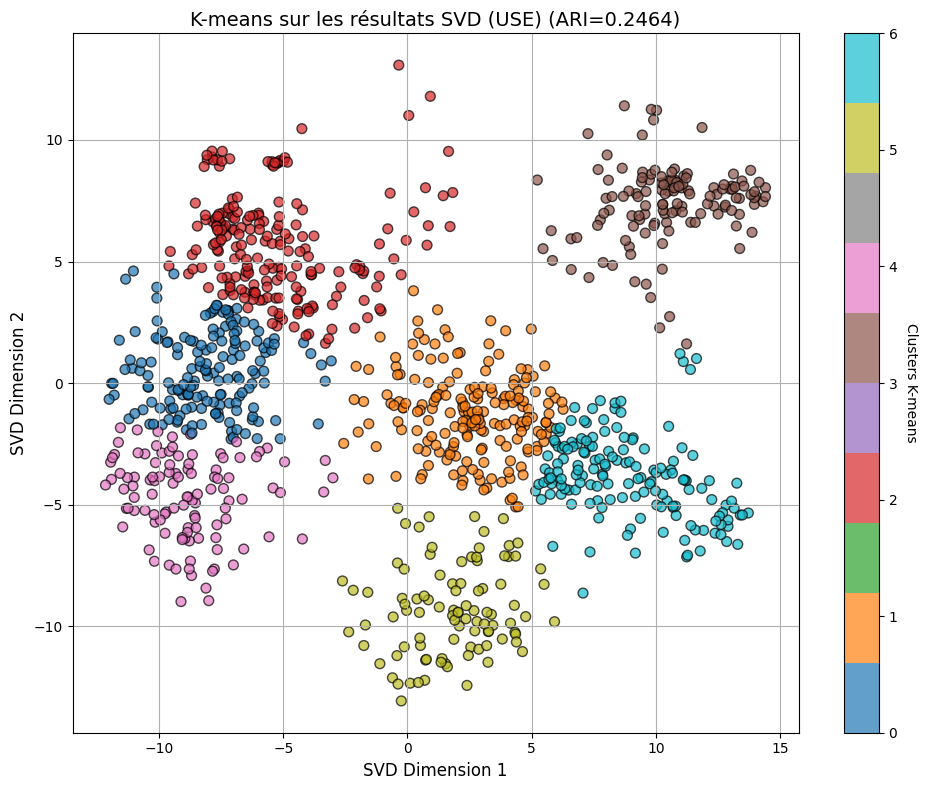

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import matplotlib.pyplot as plt

#  Application de K-means 
# Définir le nombre de clusters (idéalement correspondant aux catégories réelles)
n_clusters = len(dataset['label_category'].unique())  # Nombre unique de catégories
kmeans = KMeans(
    n_clusters=n_clusters,
    init='k-means++',     # Initialisation améliorée
    max_iter=1000,        # Augmentation des itérations pour garantir une convergence
    n_init=50,            # Nombre élevé d'initialisations pour éviter les minima locaux
    random_state=42       # Reproductibilité
)

# Ajustement et prédiction des clusters
kmeans_labels = kmeans.fit_predict(use_svd)  # 'use_svd' provient de la réduction avec SVD

#  Évaluation avec Adjusted Rand Index (ARI)
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"Adjusted Rand Index (ARI) entre les catégories réelles et les clusters K-means : {ari_score:.4f}")

# Visualisation des clusters
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    use_svd[:, 0],
    use_svd[:, 1],
    c=kmeans_labels,  # Couleurs selon les clusters prédits
    cmap='tab10',
    edgecolor='k',
    alpha=0.7,
    s=50
)

# Ajouter une barre de couleur
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-means', rotation=270, labelpad=15)

# Ajouter un titre et des étiquettes
plt.title(f"K-means sur les résultats SVD (USE) (ARI={ari_score:.4f})", fontsize=14)
plt.xlabel('SVD Dimension 1', fontsize=12)
plt.ylabel('SVD Dimension 2', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


##### <span style="color:red">Autoencoder</span>

Epoch 1/300
53/53 [==============================] - 3s 19ms/step - loss: 1.4019 - val_loss: 1.2799
Epoch 2/300
53/53 [==============================] - 1s 16ms/step - loss: 1.2950 - val_loss: 1.2088
Epoch 3/300
53/53 [==============================] - 1s 16ms/step - loss: 1.2107 - val_loss: 1.1502
Epoch 4/300
53/53 [==============================] - 1s 15ms/step - loss: 1.1431 - val_loss: 1.0944
Epoch 5/300
53/53 [==============================] - 1s 16ms/step - loss: 1.0852 - val_loss: 1.0427
Epoch 6/300
53/53 [==============================] - 1s 16ms/step - loss: 1.0291 - val_loss: 0.9945
Epoch 7/300
53/53 [==============================] - 1s 14ms/step - loss: 0.9782 - val_loss: 0.9476
Epoch 8/300
53/53 [==============================] - 1s 14ms/step - loss: 0.9302 - val_loss: 0.9034
Epoch 9/300
53/53 [==============================] - 1s 14ms/step - loss: 0.8818 - val_loss: 0.8625
Epoch 10/300
53/53 [==============================] - 1s 13ms/step - loss: 0.8385 - val_loss: 0.8231

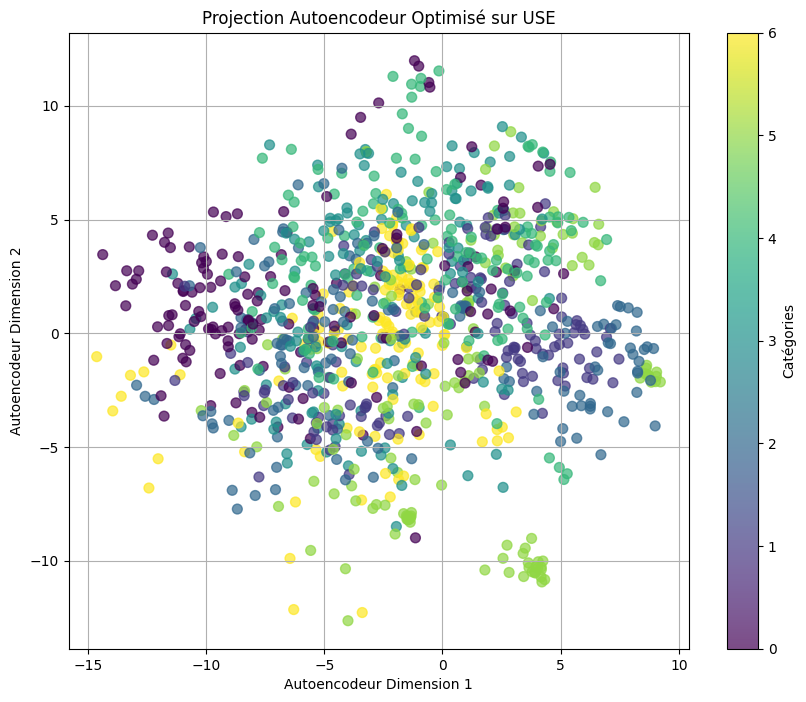

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, PowerTransformer
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, LeakyReLU, GaussianNoise
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

#  Prétraitement des données USE 
use_matrix = np.array(dataset['use_embeddings'].tolist())
scaler = StandardScaler()
use_scaled = scaler.fit_transform(use_matrix)
pt = PowerTransformer()
use_scaled = pt.fit_transform(use_scaled)

#  Construction de l'autoencodeur optimisé 
input_dim = use_scaled.shape[1]
encoding_dim = 15  # Augmentation de la dimension pour meilleure capture

input_layer = Input(shape=(input_dim,))
noisy_input = GaussianNoise(0.1)(input_layer)  # Ajout de bruit gaussien
encoded = Dense(512, kernel_regularizer=tf.keras.regularizers.l2(0.001))(noisy_input)
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU()(encoded)
encoded = Dropout(0.3)(encoded)
encoded = Dense(256, kernel_regularizer=tf.keras.regularizers.l2(0.001))(encoded)
encoded = BatchNormalization()(encoded)
encoded = LeakyReLU()(encoded)
encoded = Dropout(0.3)(encoded)
encoded = Dense(128)(encoded)
encoded_output = Dense(encoding_dim, activation='linear')(encoded)

decoded = Dense(128)(encoded_output)
decoded = BatchNormalization()(decoded)
decoded = LeakyReLU()(decoded)
decoded = Dropout(0.3)(decoded)
decoded = Dense(256)(decoded)
decoded = BatchNormalization()(decoded)
decoded = LeakyReLU()(decoded)
decoded = Dropout(0.3)(decoded)
decoded = Dense(512)(decoded)
decoded_output = Dense(input_dim, activation='linear')(decoded)

autoencoder = Model(inputs=input_layer, outputs=decoded_output)
encoder = Model(inputs=input_layer, outputs=encoded_output)

autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss=tf.keras.losses.Huber())

# Entraînement de l'autoencodeur 
early_stopping = EarlyStopping(monitor='val_loss', patience=25, restore_best_weights=True)
autoencoder.fit(
    use_scaled, use_scaled,
    epochs=300,
    batch_size=16,
    shuffle=True,
    validation_split=0.2,
    verbose=1,
    callbacks=[early_stopping]
)

# Extraction des données compressées
compressed_use = encoder.predict(use_scaled)

# Visualisation des données compressées
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    compressed_use[:, 0],
    compressed_use[:, 1],
    c=dataset['label_category'].astype('category').cat.codes,
    cmap='viridis',
    alpha=0.7,
    s=50
)
plt.colorbar(label='Catégories')
plt.title("Projection Autoencodeur Optimisé sur USE")
plt.xlabel("Autoencodeur Dimension 1")
plt.ylabel("Autoencodeur Dimension 2")
plt.grid(True)
plt.show()

Exécution avec n_clusters = 7
ARI = 0.3946


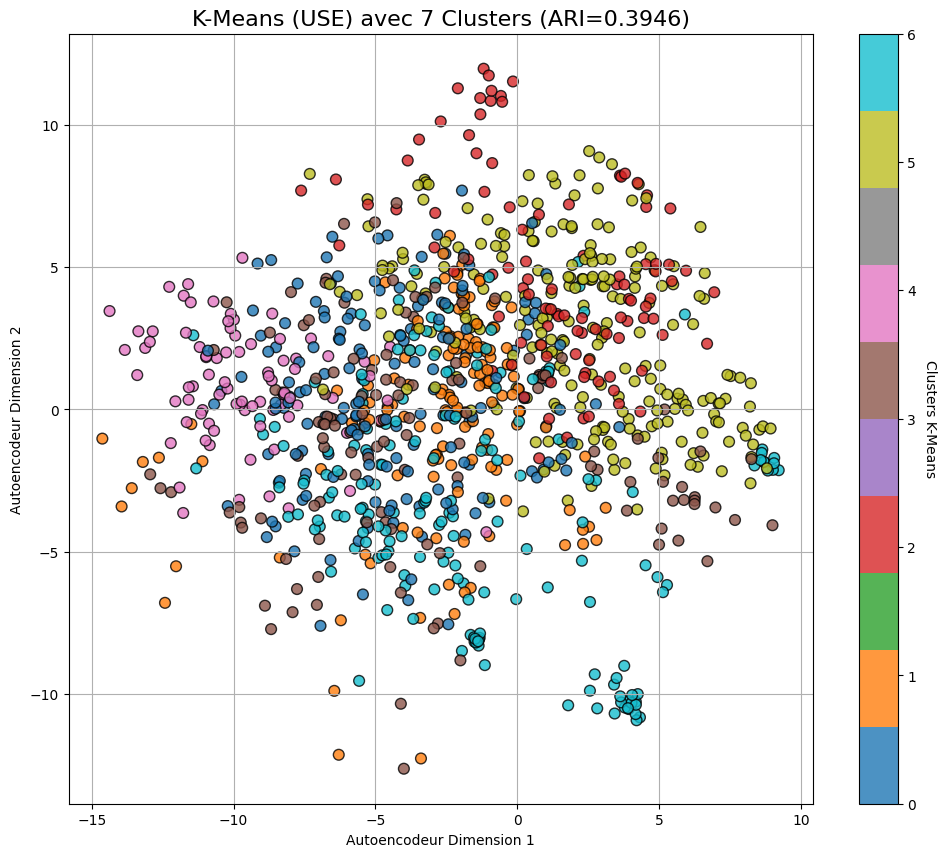

In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import adjusted_rand_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

#  Normalisation des données compressées 
scaler = StandardScaler()
compressed_use_scaled = scaler.fit_transform(compressed_use)  # Éviter des biais d'échelle

#  Définition du modèle K-Means avec des paramètres optimisés 
n_clusters = 7
print(f"Exécution avec n_clusters = {n_clusters}")

# Choisir MiniBatchKMeans si le dataset est volumineux
use_mini_batch = compressed_use_scaled.shape[0] > 10000
kmeans_class = MiniBatchKMeans if use_mini_batch else KMeans

kmeans = kmeans_class(
    n_clusters=n_clusters,
    init='k-means++',
    max_iter=2000,      # Augmenté pour assurer la convergence
    n_init=50,          # Plus d'initialisations pour un meilleur placement des clusters
    tol=1e-6,           # Tolérance plus stricte pour améliorer la précision
    random_state=42
)

#  Exécution du clustering 
kmeans_labels = kmeans.fit_predict(compressed_use_scaled)

#  Calcul des métriques 
ari_score = adjusted_rand_score(dataset['label_category'].astype('category').cat.codes, kmeans_labels)
print(f"ARI = {ari_score:.4f}")

#  Visualisation des clusters K-Means 
plt.figure(figsize=(12, 10))
scatter = plt.scatter(
    compressed_use[:, 0],
    compressed_use[:, 1],
    c=kmeans_labels,
    cmap='tab10',
    alpha=0.8,
    s=60,
    edgecolor='k'
)
colorbar = plt.colorbar(scatter)
colorbar.set_label('Clusters K-Means', rotation=270, labelpad=15)
plt.title(f"K-Means (USE) avec 7 Clusters (ARI={ari_score:.4f})", fontsize=16)
plt.xlabel("Autoencodeur Dimension 1")
plt.ylabel("Autoencodeur Dimension 2")
plt.grid(True)
plt.show()


# Analyse des resultats

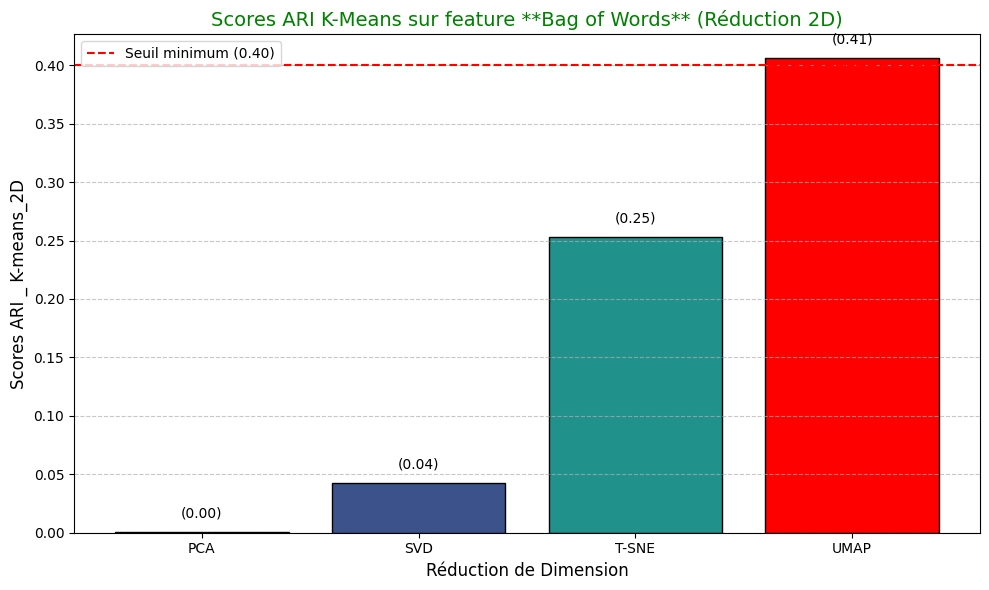

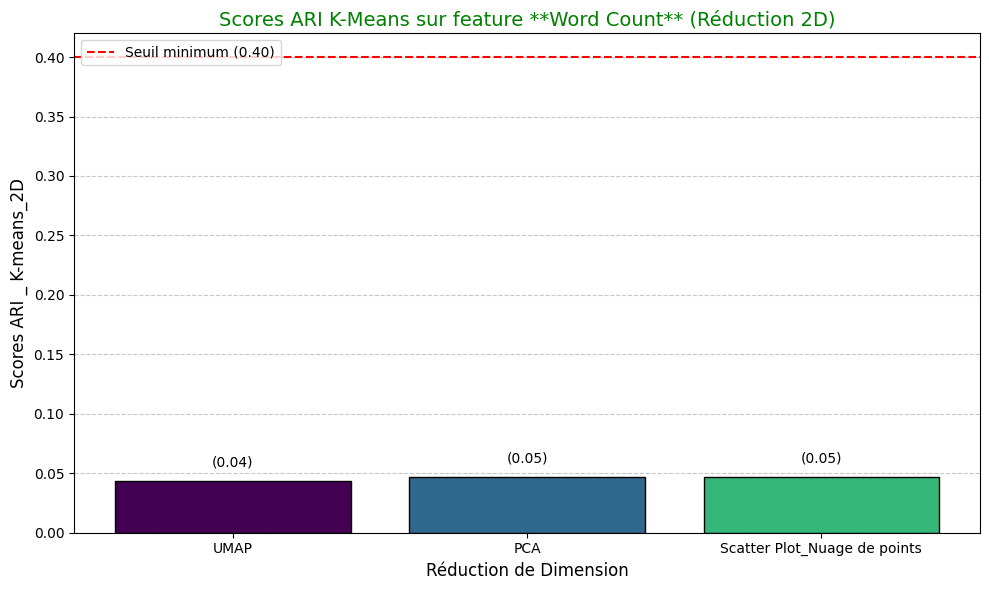

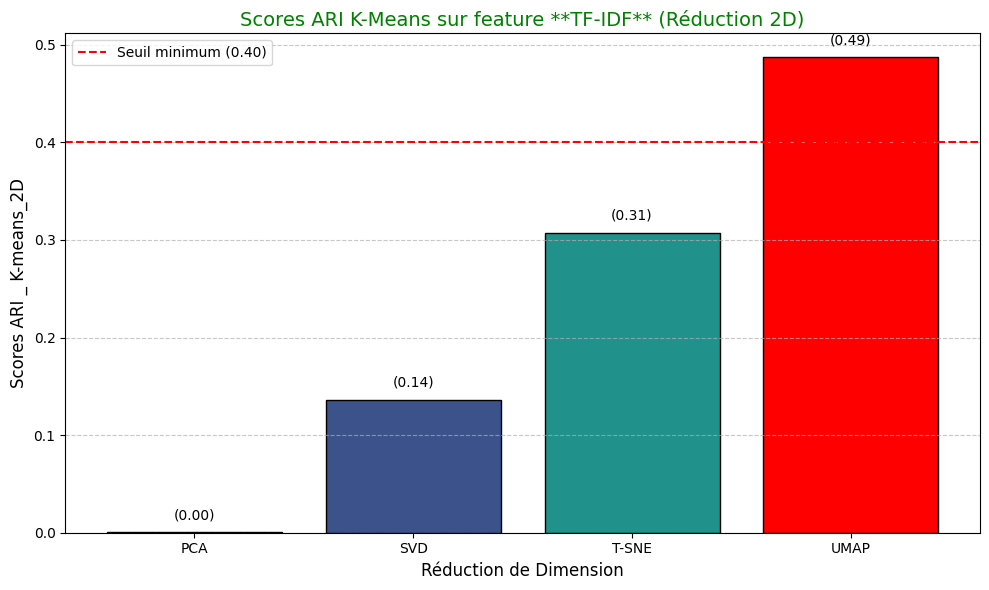

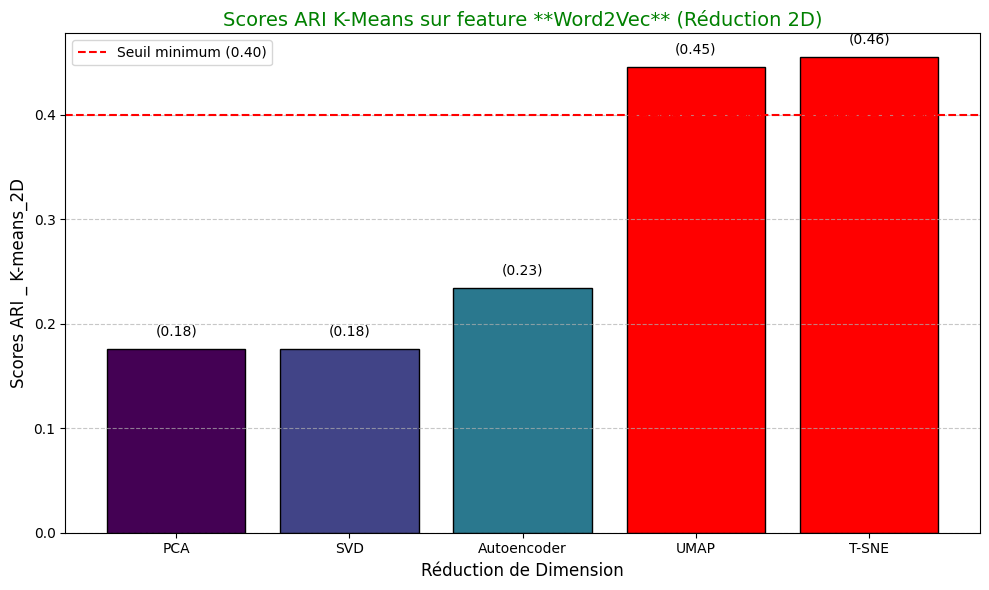

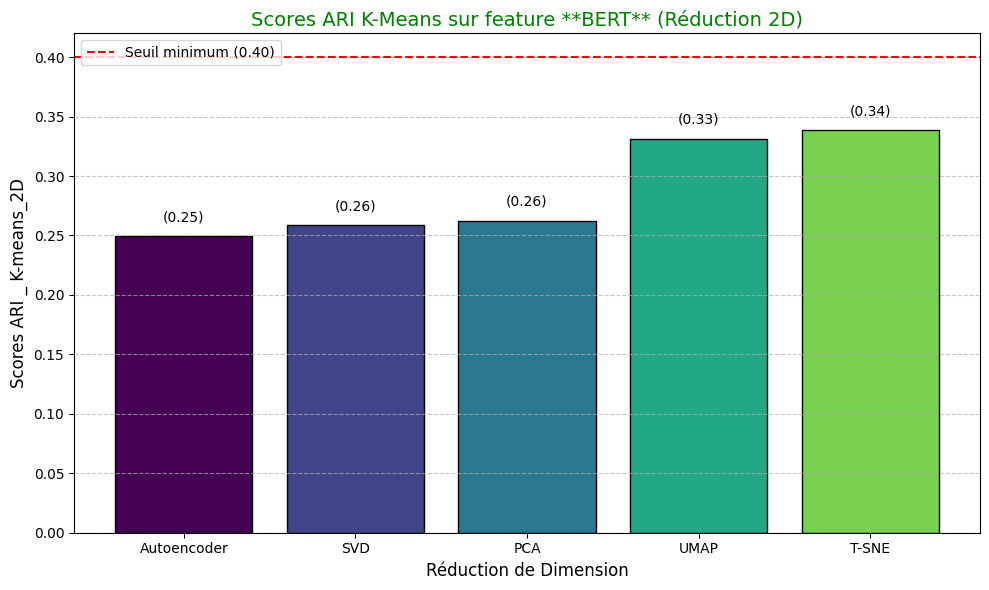

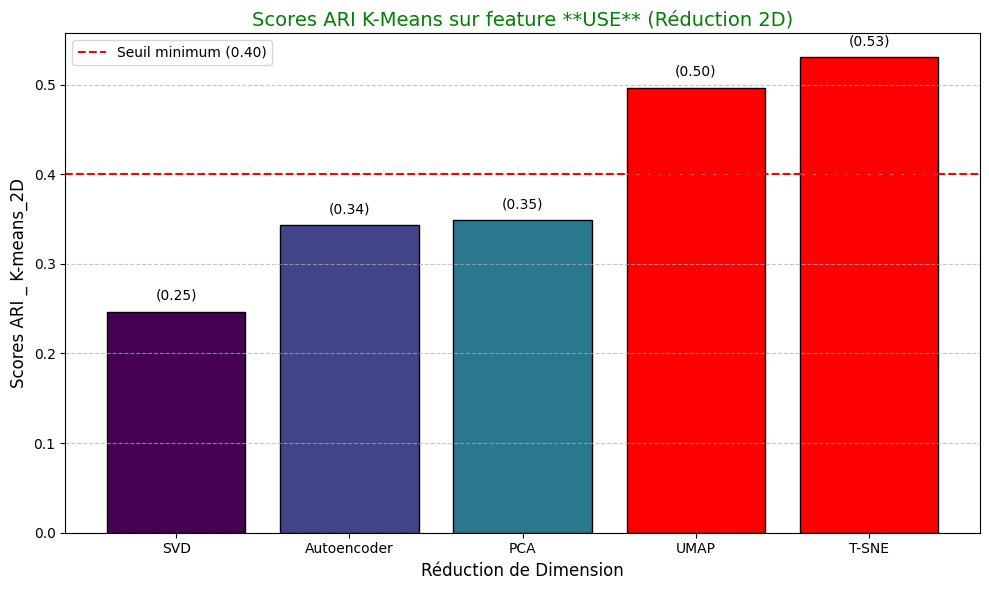

In [215]:
import matplotlib.pyplot as plt
import numpy as np

# Données
features = ["Bag of Words", "Word Count", "TF-IDF", "Word2Vec", "BERT", "USE"]
data = {
    "Bag of Words": [0.0007, None, 0.2527, 0.0427, 0.4061, None],
    "Word Count": [0.0467, 0.0467, None, None, 0.0432, None],
    "TF-IDF": [0.0007, None, 0.3075, 0.1364, 0.4873, None],
    "Word2Vec": [0.1760, None, 0.4553, 0.1760, 0.4458, 0.2342],
    "BERT": [0.2624, None, 0.3383, 0.2585, 0.3313, 0.2493],
    "USE": [0.3484, None, 0.5307, 0.2464, 0.4966, 0.3432]
}
methods = [
    "PCA", 
    "Scatter Plot_Nuage de points", 
    "T-SNE", 
    "SVD", 
    "UMAP", 
    "Autoencoder"
]
seuil = 0.4

# Génération de graphiques
for feature in features:
    scores = data[feature]
    
    # Exclure les None et trier par score
    methods_scores = [(m, s) for m, s in zip(methods, scores) if s is not None]
    methods_scores = sorted(methods_scores, key=lambda x: x[1])
    methods_sorted, scores_sorted = zip(*methods_scores)

    # Déterminer les couleurs (rouge si score > seuil)
    colors = ["red" if score > seuil else plt.cm.viridis(i / len(scores_sorted)) for i, score in enumerate(scores_sorted)]

    # Tracer le graphique
    plt.figure(figsize=(10, 6))
    bars = plt.bar(methods_sorted, scores_sorted, color=colors, edgecolor='black')

    # Ajouter les scores au-dessus des barres
    for bar, score in zip(bars, scores_sorted):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, f"({score:.2f})",
                 ha='center', va='bottom', fontsize=10)

    # Ajouter une ligne de seuil
    plt.axhline(y=seuil, color='red', linestyle='--', label=f"Seuil minimum ({seuil:.2f})")

    # Labels et titre
    plt.xlabel("Réduction de Dimension", fontsize=12)
    plt.ylabel("Scores ARI _ K-means_2D", fontsize=12)
    plt.title(f"Scores ARI K-Means sur feature **{feature}** (Réduction 2D)", fontsize=14, color='green')
    plt.legend(loc='upper left', bbox_to_anchor=(0, 1))

    # Grille et ajustements
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()

    # Afficher le graphique
    plt.show()


In [216]:
# Calculer le temps d'exécution
end_time = time.time()
elapsed_time = end_time - start_time

# Convertir en format lisible (minutes et secondes)
elapsed_minutes = int(elapsed_time // 60)
elapsed_seconds = int(elapsed_time % 60)

# Afficher l'heure de fin et le temps total d'exécution
end_datetime = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
print(f"📌 Fin du notebook : {end_datetime}")
print(f"⏳ Temps d'exécution total : {elapsed_minutes} min {elapsed_seconds} sec")

📌 Fin du notebook : 2025-03-20 09:50:22
⏳ Temps d'exécution total : 9 min 53 sec


# FIN